Code to generate figures for __Exploring metabolic interactions in methanogenic microbiota: the role of amino acids in carbon fixation__

In [3]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [12]:
# Modify according the data is located
path = '/data/'
outpath = '/figures/'
path = '/home/esteban/Documents/esteban/scripts/syntrophyAA/data/'
outpath = '/home/esteban/Documents/esteban/scripts/syntrophyAA/figures/'

# **Figure 1**: Biochemical Data

In [5]:
# Read tables
od = pd.read_csv(f"{path}tables/od.tsv", sep="\t", index_col=0)
od = od.drop([23,26])
ch4 = pd.read_csv(f"{path}tables/ch4_accumulated.tsv", sep="\t", index_col=0)

## **A**: OD

In [6]:
od1 = od.stack().reset_index().rename(columns={"level_1":"Condition",0:"OD"})
for i in od1.itertuples():
    sample = i[2]
    sample = sample.split(".")[0]
    od1.loc[i[0],"Condition"] = sample

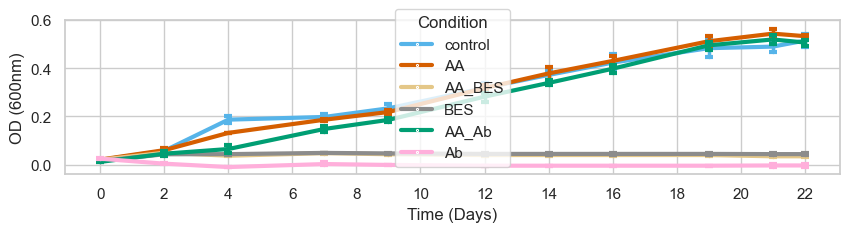

In [7]:
sns.set_theme(rc={'figure.figsize':(10,2.)})
sns.set_style("whitegrid")
plt.rcParams['font.serif'] = ['Arial']

custom_palette = {
    'control': '#56B4E9',
    'AA': '#D55E00',
    'AA_BES': '#E4C788',
    'AA_Ab': '#009E73',
    'Ab': '#FFAFDB',
    'BES': '#8C8C8C'
}

lineplot = sns.lineplot(data=od1,x="Day",y="OD",hue="Condition",
                        linewidth=3.,
                        marker="o",
                        ms = 1.5,markers=True, err_style="bars",
                        err_kws = {'capsize': 3, 'capthick': 3., 'elinewidth': 2.5},
                        palette=custom_palette)

lineplot.set_yticks([0.,0.2,0.4,0.6])
lineplot.set_xticks(range(0,23,2))
lineplot.set_xticklabels(list(range(0,23,2)))
lineplot.set(xlabel='Time (Days)',ylabel='OD (600nm)')

plt.savefig(f"{outpath}Fig1_A.pdf")
plt.savefig(f"{outpath}Fig1_A.svg")

## **B**: CH4

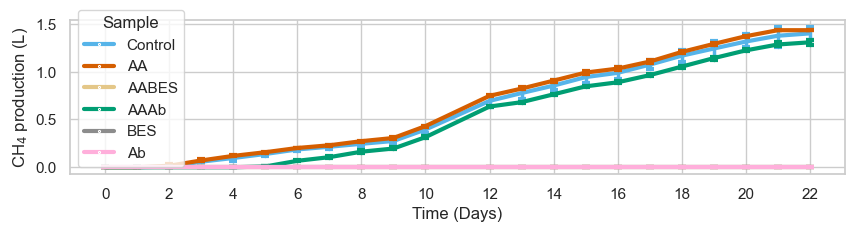

In [8]:
ch4_cum = ch4.T.stack().reset_index().rename(columns={"level_0":"Day","level_1":"Condition",0:"CH4"})
ch4_cum['Day'] = ch4_cum['Day'].astype('int')
ch4_cum['CH4'] = ch4_cum['CH4']/1000
sns.set_theme(rc={'figure.figsize':(10,2.)})
plt.rcParams['font.serif'] = ['Arial']
sns.set_style("whitegrid")

custom_palette = {
    'Control': '#56B4E9',
    'AA': '#D55E00',
    'AABES': '#E4C788',
    'AAAb': '#009E73',
    'Ab': '#FFAFDB',
    'BES': '#8C8C8C'
}

lineplot = sns.lineplot(data=ch4_cum,x="Day",y="CH4",hue="Sample", 
                        linewidth=3.,
                        marker="o",
                        ms = 1.5,markers=True, err_style="bars",
             err_kws = {'capsize': 3, 'capthick': 3, 'elinewidth': 2.5},
             palette=custom_palette)
lineplot.set_yticks([0,0.5,1.,1.5])
lineplot.set_xticks(range(0,23,2))
lineplot.set_xticklabels(list(range(0,23,2)))
lineplot.set(xlabel='Time (Days)',ylabel='CH$_4$ production (L)')

plt.savefig(f"{outpath}Fig1_B.pdf")
plt.savefig(f"{outpath}Fig1_B.svg")

## **C**: VFA

In [12]:
vfa = pd.read_csv(f'{path}tables/vfa.tsv',sep='\t',index_col=2)
vfa = vfa[vfa['VFA'] == 'Acetic Acid']
vfa = vfa.drop(['Sample_VFA','VFA'],axis=1)
vfa_data = vfa.T.stack().reset_index().rename(columns={"level_0":"Day","level_1":"Condition",0:"Acetate"})

In [13]:
vfa_data['Acetate'] +=  40 # Add the Blank

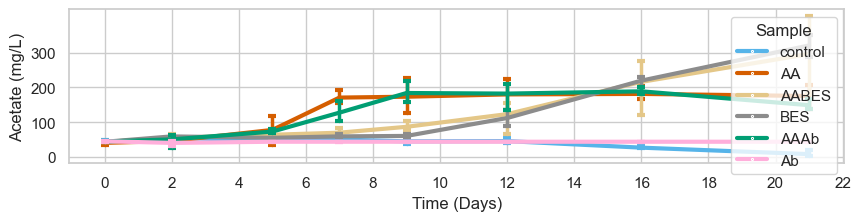

In [14]:
from matplotlib.ticker import MaxNLocator

vfa_data2 = vfa_data.copy()
vfa_data2['Day'] = vfa_data2['Day'].astype('int')
sns.set_theme(rc={'figure.figsize':(10,2.)})
plt.rcParams['font.serif'] = ['Arial']
sns.set_style("whitegrid")

custom_palette = {
    'control': '#56B4E9',
    'AA': '#D55E00',
    'AABES': '#E4C788',
    'AAAb': '#009E73',
    'Ab': '#FFAFDB',
    'BES': '#8C8C8C'
}

lineplot = sns.lineplot(data=vfa_data2,x="Day",y="Acetate",hue="Sample", 
                        linewidth=3.,
                        marker="o",
                        ms = 1.5,markers=True, err_style="bars",
             err_kws = {'capsize': 3, 'capthick': 3, 'elinewidth': 2.5},
             palette=custom_palette)

lineplot.set_yticks([0,100,200,300])
lineplot.set_xticks(range(0,23,2))
lineplot.set_xticklabels(list(range(0,23,2)))
lineplot.set(xlabel='Time (Days)',ylabel='Acetate (mg/L)')

plt.savefig(f"{outpath}Fig1_C.svg")
plt.savefig(f"{outpath}Fig1_C.pdf")

## **D**: AA

In [15]:
# Plot Aminoacids exchange
# For each amino acid
# Load the data from the CSV files
d = pd.read_csv(f'{path}tables/four_aa.tsv', sep="\t",index_col=[0,1])
d2 = pd.read_csv(f'{path}tables/AA_data.tsv', sep="\t")
d2 = d2[['Condition','Day','Aspartic Acid','Cysteine','Valine','Leucine']]

data = d2
samples = list(data['Condition'].unique())
samples = samples[0:6]
data2 = data[data['Condition'].isin(samples)]

AAs = data2.columns[2:]
data2[AAs] = data2[AAs]/1000
data2 = data2.set_index(['Condition','Day'])

/tmp/ipykernel_104763/1076128368.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2[AAs] = data2[AAs]/1000


In [16]:
data2 = data2.stack().reset_index().rename(columns={"level_0":"Day","level_1":"Condition","level_2":"AA",0:"Concentration"})

In [18]:
# How much they consume between day 0 and day 7?
aminoacids = pd.read_csv(f'{path}tables/AA_data.tsv', sep='\t')
meanAA = aminoacids.groupby(['Condition','Day']).mean()
meanAA2 = pd.DataFrame(columns=meanAA.columns)
for cond in aminoacids.Condition.unique():
	dftmp = pd.DataFrame(meanAA.loc[cond,7] * 100 / meanAA.loc[cond,0],columns=[cond])
	meanAA2 = pd.concat([meanAA2,dftmp.T])

/tmp/ipykernel_104763/2137150045.py:7: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  meanAA2 = pd.concat([meanAA2,dftmp.T])


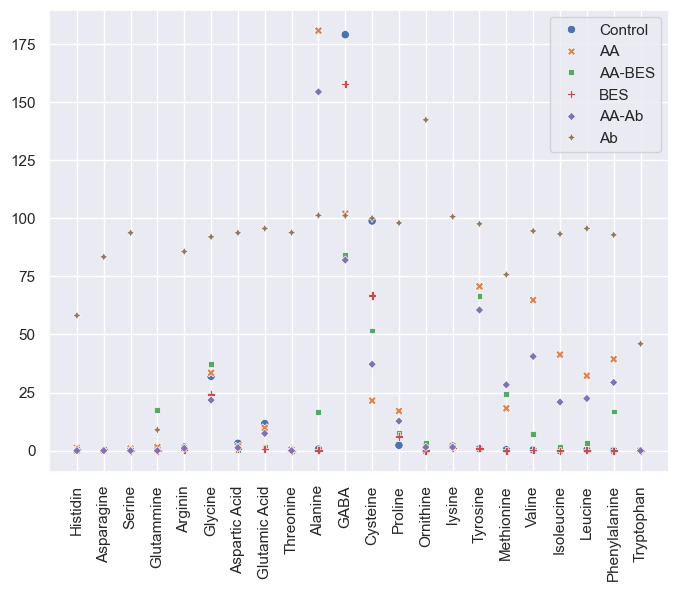

In [22]:
plt.figure(figsize=(8, 6))
aminoacids2 = meanAA2.drop(['Blanck-Ab','Blank-AA','Blank-BES'])
sns.scatterplot(aminoacids2.T)
plt.xticks(rotation=90)
plt.show()

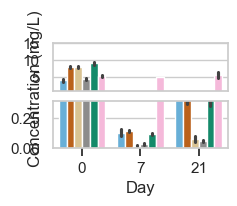

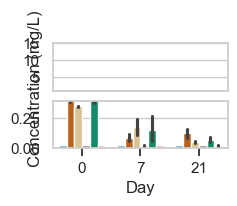

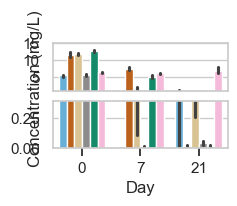

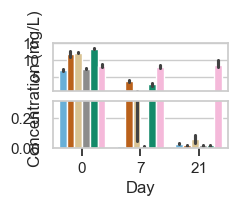

In [23]:
sns.set_theme(rc={'figure.figsize':(2.5,1.5)})
plt.rcParams['font.serif'] = ['Arial']
sns.set_style("whitegrid")

pal = sns.color_palette(n_colors=6)
pal = {
    'Control': '#56B4E9',
    'AA': '#D55E00',
    'AA-BES': '#E4C788',
    'AA-Ab': '#009E73',
    'Ab': '#FFAFDB',
    'BES': '#8C8C8C'
}
# let's create a figure for our two plots to live in
# we need a lower part (anything below the cutoff), which will be ax2
# and an upper part (anything above the cutoff) which will be ax1
# because we have only two plots above each other, we set ncols=1 and nrows=2
# also, they should share an x axis, which is why we set sharex=True

for aa in AAs:

    f, (ax1, ax2) = plt.subplots(ncols=1, nrows=2,
                                sharex=True)

    ax1 = sns.barplot(x="Day", y="Concentration",
                    hue="Condition", data=data2[data2['AA']==aa], palette=pal, ax=ax1)

    # we basically do the same thing again for the second plot
    ax2 = sns.barplot(x="Day", y="Concentration",
                    hue="Condition", data=data2[data2['AA']==aa], palette=pal, ax=ax2)

    ax1.set_ylim(1, 15)
    ax2.set_ylim(0, 0.4)

    # the upper part does not need its own x axis as it shares one with the lower part
    ax1.get_xaxis().set_visible(False)

    # by default, each part will get its own "Latency in ms" label, but we want to set a common for the whole figure
    # first, remove the y label for both subplots
    ax1.set_ylabel("")
    ax2.set_ylabel("")
    # then, set a new label on the plot (basically just a piece of text) and move it to where it makes sense (requires trial and error)
    f.text(0.05, 0.55, "Concentration (mg/L)", va="center", rotation="vertical")

    # by default, seaborn also gives each subplot its own legend, which makes no sense at all
    ax1.get_legend().remove()
    ax2.get_legend().remove()
    ax1.xaxis.tick_top()
    ax2.xaxis.tick_bottom()
    f.subplots_adjust(left=0.15, right=0.85, bottom=0.15, top=0.85)

    plt.show()
    fig = f.get_figure()
    fig.savefig(f"{outpath}Fig1_D_{aa}.svg")
    fig.savefig(f"{outpath}Fig1_D_{aa}.pdf")

# **Figure 2** - TREE + Relative Abundance + Global expression

### Libraries

In [24]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
from matplotlib import pyplot as plt
from matplotlib import colors as clrs
import scipy 

## Tree

In [ ]:
# Run phylophlan in bash:
"""
cd /data/tree/
phylophlan -i mags/ --genome_extension .fa -d phylophlan --diversity high -f supermatrix_aa.cfg --nproc 12
"""

## Relative abundance

In [40]:
# Relative abundance graph
cov = pd.read_csv(path+"tables/coverm.relative_abundance_covered50.tsv", sep="\t", index_col=0)

# remove unmapped and change the sample names
cov.drop("unmapped", inplace=True)
samples = {"L83":"Ctrl_A1","L84":"Ctrl_A2","L85":"Ctrl_A3","L86":"AA_A1","L87":"AA_A2","L88":"AA_A3","L89":"AAAb_A1","L90":"AAAb_A2","L91":"AAAb_A3",
           "H52":"Ctrl_B1","H53":"Ctrl_B2","H54":"Ctrl_B3","H55":"AA_B1","H56":"AA_B2","H57":"AA_B3","H58":"AAAb_B1","H59":"AAAb_B2","H60":"AAAb_B3","H61":"Inoculum"}

cov = cov.rename(columns=samples)
cov = cov[samples.values()]

# change the MAGs names and keep the ones with values
names = path+"tables/names.list.tsv"
names_d = {}

with open(names) as f:
    for line in f:
        old,new = line.replace("\n","").split("\t")
        names_d[old] = new
cov = cov.rename(index=names_d)

for mag in cov.index:
    if cov.loc[mag].max() <= 0.01:
        print (cov.loc[mag].max(), mag)
        cov.drop(mag,inplace=True)


0.0 M. thermoacetica PD30
0.0 Peptostreptococcales sp. PD2
0.0 Bacteria sp. PD9
0.0 Acetivibrionales sp. PD20
0.0 Aeribacillus composti  PD16


In [28]:
cov2 = cov[['Inoculum','Ctrl_A1', 'Ctrl_A2', 'Ctrl_A3', 'AA_A1', 'AA_A2', 'AA_A3', 'AAAb_A1',
       'AAAb_A2', 'AAAb_A3', 'Ctrl_B1', 'Ctrl_B2', 'Ctrl_B3',
       'AA_B1', 'AA_B2', 'AA_B3', 'AAAb_B1', 'AAAb_B2', 'AAAb_B3']]
# Create a table with the mean values
samples = {'Inoculum':['Inoculum'],'C1':['Ctrl_A1', 'Ctrl_A2', 'Ctrl_A3'],'C2':['Ctrl_B1', 'Ctrl_B2', 'Ctrl_B3'],'AA1':['AA_A1', 'AA_A2', 'AA_A3'],
           'AA2':['AA_B1', 'AA_B2', 'AA_B3'],'AAAb1': ['AAAb_A1','AAAb_A2', 'AAAb_A3'],'AAAb2':['AAAb_B1', 'AAAb_B2', 'AAAb_B3']}
cov3 = pd.DataFrame(index=cov2.index)
for sample in samples.keys():
    cov3[sample] = cov2[samples[sample]].mean(axis=1)
cov3 = np.round(cov3,2)

In [29]:
magsSamples = {}
for col in cov3.columns:
    l = list(cov3[cov3[col] > 0.01].index)
    magsSamples[col] = l
    # print (col,cov3[col].sort_values().tail(n=4))

In [30]:
magsSamples = {}
for col in cov3.columns:
    l = list(cov3[cov3[col] > 0.01].index)
    magsSamples[col] = l
    # print (col,cov3[col].sort_values().tail(n=2))
uniqueMagsSample = {}
for col in magsSamples.keys():
    others = set()
    magsSample = magsSamples[col]
    for col2 in magsSamples.keys():
        if col != col2:
            others = set(magsSamples[col2]) | others
    uniqueMagsSample[col] = set(magsSample) - others
uniqueMagsSample

{'Inoculum': set(),
 'C1': set(),
 'C2': set(),
 'AA1': set(),
 'AA2': {'Tepidimicrobiaceae sp. PD26'},
 'AAAb1': set(),
 'AAAb2': {'Firmicutes sp. PD31'}}

In [31]:
# Lo mismo pero por tipo de muestra
typeOfSample = {'control':['C1','C2'],'AA':['AA1','AA2'],'AA+Ab':['AAAb1','AAAb2'],'IO':['Inoculum']}
magsTypeOfSample = {}
for cond in typeOfSample.keys():
    magsTypeOfSample[cond] = set()
    for col in typeOfSample[cond]:
        magsTypeOfSample[cond] = set(cov3[cov3[col] > 0.01].index) | magsTypeOfSample[cond]

condicionesMAGs = {}
for cond in magsTypeOfSample.keys():
    others = set()
    for cond2 in magsTypeOfSample.keys():
        if cond != cond2:
            others = set(magsTypeOfSample[cond2]) | others
    condicionesMAGs[cond] = set(magsTypeOfSample[cond]) - others
condicionesMAGs

{'control': {'Peptococcales sp. PD29'},
 'AA': {'Tepidimicrobiaceae sp. PD26'},
 'AA+Ab': {'Firmicutes sp. PD31', 'G. thermodenitrificans  PD6'},
 'IO': set()}

In [34]:
ordered = ['M. thermautotrophicus PD4','M. wolfeii PD21','S. terraclitae  PD18','Symbiobacterium sp. PD15','Bacilli sp. PD10','G. thermodenitrificans  PD6',
           'Carbobacillus sp. PD11','Firmicutes sp. PD7','Limnochordia sp. PD14','Limnochordia sp. PD22','Moorellia sp. PD5','Moorellia sp. PD25',
           'Peptococcales sp. PD29','Peptococcales sp. PD24','Firmicutes sp. PD31','Tepidanaerobacteraceae sp. PD3','Tepidanaerobacteraceae sp. PD27',
           'Tepidanaerobacteraceae sp. PD32','Tepidanaerobacteraceae sp. PD1','C. subterraneus PD13','P. thermosuccinogenes PD28','Lutisporaceae sp. PD17',
           'Tissierellaceae sp. PD12','T. xylanilyticum PD19','Tepidimicrobiaceae sp. PD26','Tepidimicrobiaceae sp. PD23']
cov4 = cov3.loc[ordered]

Output saved as dna_heatmap.pdf


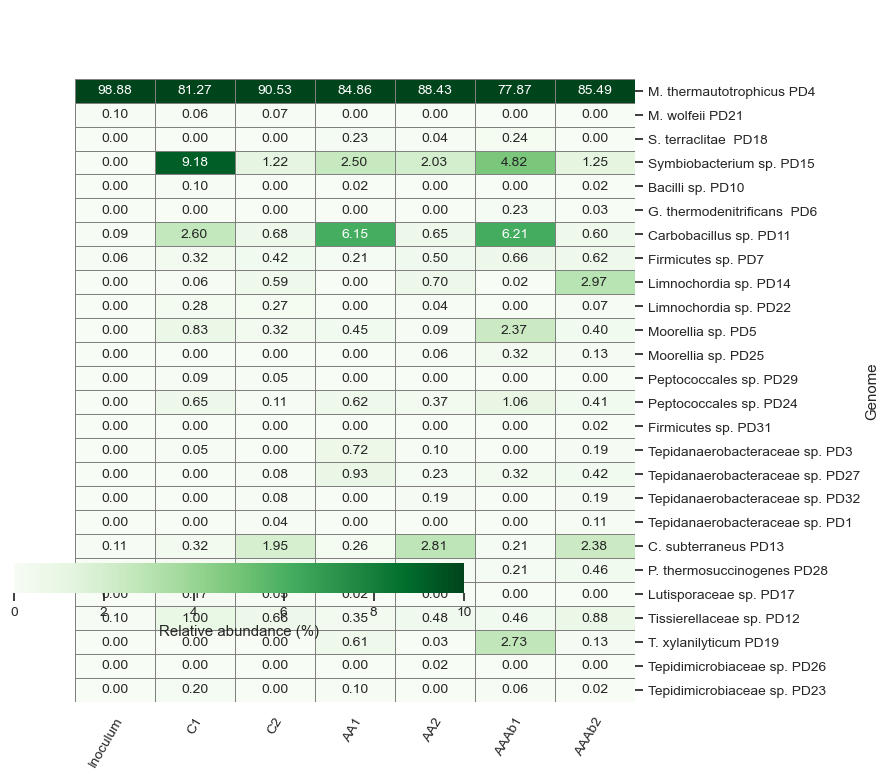

In [36]:
# Parameters for the function
font_scale = 0.9
figsize = (9, 7.5)
pdf = 'dna_heatmap.pdf'
svg = 'dna_heatmap.svg'
png = 'dna_heatmap.png'
cmap = 'Greens'
annot = True
vmin = cov4.min().min()
vmax = 10

# Define the function
def plot_heat(df, font_scale, figsize, pdf, svg, png, cmap, annot, vmin, vmax,fmt):
    sns.set(font_scale=font_scale)
    heatmap = sns.clustermap(df, xticklabels=True, yticklabels=True,
                             figsize=figsize, row_cluster=False, col_cluster=False, 
                             cbar_pos=(0.02, 0.2, 0.5, 0.04),
                             norm=clrs.PowerNorm(gamma=1, vmin=vmin, vmax=vmax), 
                             annot=annot, linewidths=0.5,linecolor='grey',
                             cbar_kws={'orientation': 'horizontal', 'label': 'Relative abundance (%)'}, 
                             dendrogram_ratio=0.1, cmap=cmap,
                             fmt=fmt, annot_kws={"size": 10})

    plt.setp(heatmap.ax_heatmap.xaxis.get_majorticklabels(), rotation=60, ha="right", rotation_mode="anchor")
    plt.setp(heatmap.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, ha="left", rotation_mode="anchor")
    
    print("Output saved as {}".format(pdf))
    plt.savefig(outpath+pdf, dpi=600)
    plt.savefig(outpath+png, dpi=600)
    plt.savefig(outpath+svg)

# Call the function
plot_heat(cov4, font_scale, figsize, pdf, svg, png, cmap, annot, vmin, vmax,fmt = ".2f")

## RNA - Expression

In [38]:
# Make the total rna expression
rna_p = f'{path}tables/rnaFPKM/'

namesID = {}
with open(f'{path}tables/names.list.final.short.tsv')as f:
    for line in f:
        old,new = line.split("\t")
        new = new.replace("\n","")
        namesID[old] = new

rna_expression = pd.DataFrame(columns=['C2','AA2','AA+Ab2'])
for file in os.listdir(rna_p):
    mag = file.replace('.tsv','')
    if mag in namesID.keys():
        dftmp = pd.read_csv(rna_p+file,sep='\t', index_col=0)
        c2 = dftmp.columns[0:3]
        aa2 = dftmp.columns[3:6]
        if mag != 'maxbin2.spades.001':
            aaab2 = dftmp.columns[7:8]
        else:
            aaab2 = [dftmp.columns[6],dftmp.columns[8]]
        name = namesID[mag]
        rna_expression.loc[name,'C2'] = dftmp[c2].sum().mean()
        rna_expression.loc[name,'AA2'] = dftmp[aa2].sum().mean()
        rna_expression.loc[name,'AA+Ab2'] = dftmp[aaab2].sum().mean()
        

In [ ]:
# rna_expression = rna_expression.loc[ordered]
ordered2 = ['M. thermautotrophicus PD4','M. wolfeii PD21','S. terraclitae  PD18','Symbiobacterium sp. PD15','Bacilli sp. PD10','G. thermodenitrificans  PD6',
            'Carbobacillus sp. PD11','Firmicutes sp. PD7','Limnochordia sp. PD14','Limnochordia sp. PD22','Moorellia sp. PD5','Moorellia sp. PD25','Peptococcales sp. PD29',
            'Peptococcales sp. PD24','Firmicutes sp. PD31','Tepidanaerobacteraceae sp. PD3','Tepidanaerobacteraceae sp. PD27','Tepidanaerobacteraceae sp. PD32',
            'Tepidanaerobacteraceae sp. PD1','C. subterraneus PD13','P. thermosuccinogenes PD28','Lutisporaceae sp. PD17','Tissierellaceae sp. PD12','T. xylanilyticum PD19',
            'Tepidimicrobiaceae sp. PD26','Tepidimicrobiaceae sp. PD23']
rna_expression = rna_expression.loc[ordered2]
rna_expression2 = rna_expression.apply(pd.to_numeric, errors='coerce')
rpkm = rna_expression2/1e6
rna_log = np.log(rna_expression.apply(pd.to_numeric, errors='coerce'))

Output saved as rna_heatmap.pdf


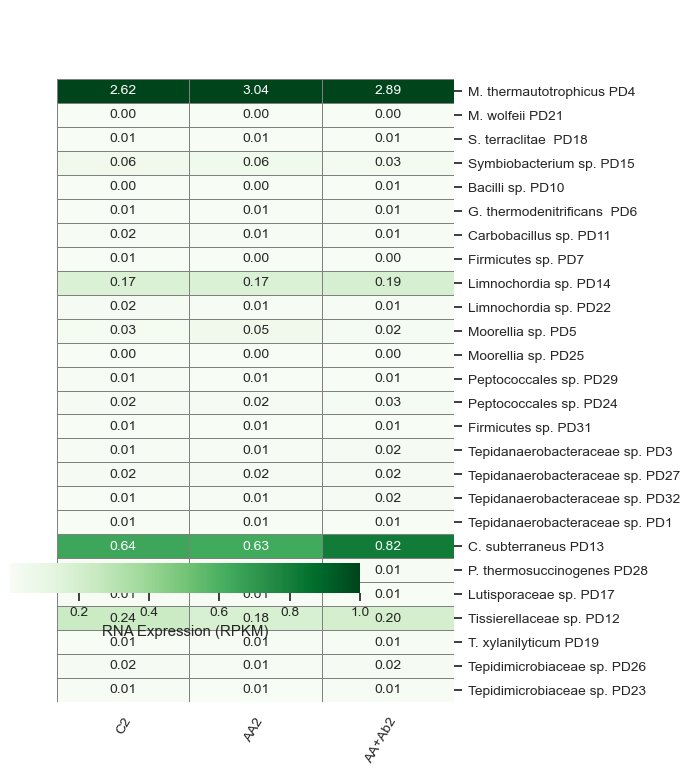

In [41]:
# Parameters for the function
font_scale = 0.9
figsize = (7, 7.5)
pdf = 'rna_heatmap.pdf'
svg = 'rna_heatmap.svg'
png = 'rna_heatmap.png'
cmap = 'Greens'
annot = True
# vmin = np.log2(rna_expression2).min().min()
# vmax = np.log2(rna_expression2).max().max()
vmin = rpkm.min().min()
vmax = 1#rpkm.max().max()

fmt = ".2f"
def plot_heat2(df, font_scale, figsize, pdf, svg, png, cmap, annot, vmin, vmax,fmt):
    sns.set(font_scale=font_scale)
    heatmap = sns.clustermap(df, xticklabels=True, yticklabels=True,
                             figsize=figsize, row_cluster=False, col_cluster=False, 
                             cbar_pos=(0.02, 0.2, 0.5, 0.04),
                             norm=clrs.PowerNorm(gamma=1, vmin=vmin, vmax=vmax), 
                             annot=annot, linewidths=0.5,linecolor='grey',
                             cbar_kws={'orientation': 'horizontal', 'label': 'RNA Expression (RPKM)'}, 
                             dendrogram_ratio=0.1, cmap=cmap,
                             fmt=fmt, annot_kws={"size": 10})

    plt.setp(heatmap.ax_heatmap.xaxis.get_majorticklabels(), rotation=60, ha="right", rotation_mode="anchor")
    plt.setp(heatmap.ax_heatmap.yaxis.get_majorticklabels(), rotation=0, ha="left", rotation_mode="anchor")
    
    print("Output saved as {}".format(pdf))
    plt.savefig(outpath+pdf, dpi=600)
    plt.savefig(outpath+png, dpi=600)
    plt.savefig(outpath+svg)


# Call the function
plot_heat2(rpkm, font_scale, figsize, pdf, svg, png, cmap, annot, vmin, vmax,fmt = ".2f")

## Supplementary Figures

### STAMP - create tables

In [1]:
# Libraries used
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec as gg
from matplotlib import gridspec

In [8]:
# Data
file_path = f"{path}tables/coverm.rpkm.tsv"
abundance_df = pd.read_csv(file_path, index_col=0,sep='\t')

mags_names = pd.read_csv(f'{path}tables/names.list.final.short.tsv',sep='\t', names=['old','new'])
mags_names = pd.Series(mags_names.new.values,index=mags_names.old.values).to_dict()

# select samples
samples_info = pd.read_csv(f'{path}tables/samples.information.tsv', sep='\t')
selected_samples = list(samples_info['RUN'].values)

metadata_df = samples_info.rename(columns={"RUN": "Sample"})
abundance_df.columns = abundance_df.columns.str.strip()
abundance_df = abundance_df[metadata_df['Sample']]

abundance_df.rename(index=mags_names,inplace=True)

long_df = pd.melt(abundance_df.reset_index(), id_vars="Genome", 
                  var_name="Sample", value_name="TPM")
long_df = long_df.rename(columns={"index": "Organism"})

merged_df = pd.merge(long_df, metadata_df, on="Sample")

organisms_to_analyze = abundance_df.index#[0:3]

import itertools

# Calculate average, standard and error deviation per organism, condition and time
summary_df = (
    merged_df.groupby(["Genome", "Condition", "Timepoint"])
    .agg(
        Mean_TPM=("TPM", "mean"),
        STD_TPM=("TPM", "std"),
        N_replicates=("TPM", "count")
    )
    .reset_index()
)

# ES
summary_df["SE_TPM"] = summary_df["STD_TPM"] / np.sqrt(summary_df["N_replicates"])

# Condition and time
combinations = list(itertools.combinations(
    summary_df[["Condition", "Timepoint"]].drop_duplicates().itertuples(index=False, name=None), 2
))

# Comparisons
comparison_results = []
for (cond1, time1), (cond2, time2) in combinations:
    # Filtering
    group1 = summary_df[(summary_df["Condition"] == cond1) & (summary_df["Timepoint"] == time1)]
    group2 = summary_df[(summary_df["Condition"] == cond2) & (summary_df["Timepoint"] == time2)]

    # Combine per organism
    merged = pd.merge(group1, group2, on="Genome", suffixes=("_1", "_2"))

    # Differences and deviations
    merged["Difference"] = merged["Mean_TPM_1"] - merged["Mean_TPM_2"]
    merged["Confidence_Interval"] = 1.96 * np.sqrt(
        merged["SE_TPM_1"]**2 + merged["SE_TPM_2"]**2
    )  # CE 95%

    # Combination information
    merged["Comparison"] = f"{cond1} t{time1} vs {cond2} t{time2}"
    
    # p-values
    merged["p_value"] = np.random.uniform(0.001, 0.05, size=len(merged))

    # Append results
    comparison_results.append(merged)

# Combine everything
final_comparisons_df = pd.concat(comparison_results).reset_index(drop=True)
genomesToAnalize = list(mags_names.values())
genomesToAnalize.remove('M. thermautotrophicus PD4')

final_comparisons_df2 = final_comparisons_df[final_comparisons_df['Genome'].isin(genomesToAnalize)]
# Comparisons between t1 and t2
t1_comparisons = [
    "AA t1 vs Control t1", 
    "AA+Ab t1 vs Control t1", 
    "AA t1 vs AA+Ab t1"
]

t2_comparisons = [
    "AA t2 vs Control t2", 
    "AA+Ab t2 vs Control t2", 
    "AA t2 vs AA+Ab t2"
]
all_data = pd.concat([final_comparisons_df, final_comparisons_df2])

### Plots

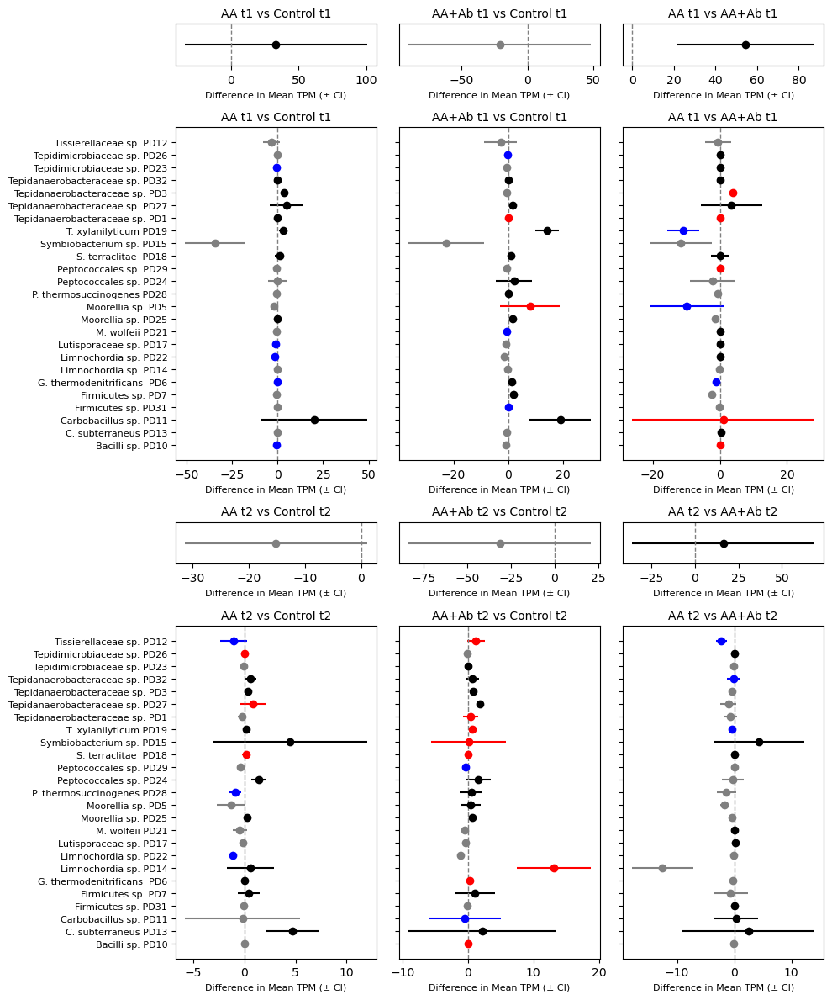

In [9]:
def plot_single_comparison(ax, data, comparison, title, genome_order=None, show_yticks=False, xlim=None):
    # Specific comparisons
    data = data[data["Comparison"] == comparison]

    # Sort genomes
    if genome_order is not None:
        data = data.set_index("Genome").reindex(genome_order).reset_index()

    # Graficar barras de diferencias con IC
    for i, row in data.iterrows():
        # Determinar el color según las condiciones
        if row['p_value'] < 0.01:
            color = 'blue' if row['Difference'] < 0 else 'red'
        else:
            color = 'gray' if row['Difference'] < 0 else 'black'
        
        # SE
        ax.errorbar(
            row["Difference"], 
            row["Genome"], 
            xerr=row["Confidence_Interval"], 
            fmt='o', 
            color=color
        )

    # Zero 
    ax.axvline(0, color='gray', linestyle='--', linewidth=1)

    # CI
    ax.set_title(title, fontsize=10)
    ax.set_xlabel("Difference in Mean TPM (± CI)", fontsize=8)
    
    # Y axis
    if genome_order is not None:
        ax.set_yticks(range(len(genome_order)))
        ax.set_yticklabels(genome_order if show_yticks else [""] * len(genome_order), fontsize=8)
    else:
        ax.set_yticks([])  # deactivate label Y

    # X axis
    if xlim is not None:
        ax.set_xlim(xlim)

    # Deactivate horizontal lines
    ax.grid(False)

# Sort genomes
genome_order = sorted(final_comparisons_df2['Genome'].unique())

# Different size graph
fig = plt.figure(figsize=(10, 12))
gs = gridspec.GridSpec(4, 3, height_ratios=[0.5, 4, 0.5, 4])  # Height 2 & 4

# Range
xlim = (all_data["Difference"].min() - all_data["Confidence_Interval"].max(),
        all_data["Difference"].max() + all_data["Confidence_Interval"].max())

# Plot for t1 (M. thermautotrophicus PD4)
for i, comparison in enumerate(t1_comparisons):
    ax = fig.add_subplot(gs[0, i])  # Subgraph first row
    plot_single_comparison(ax, final_comparisons_df[final_comparisons_df['Genome'] == 'M. thermautotrophicus PD4'], comparison, f"{comparison}")

# Plot t1 (all the others)
for i, comparison in enumerate(t1_comparisons):
    ax = fig.add_subplot(gs[1, i])  # Subgraph second row
    plot_single_comparison(ax, final_comparisons_df2, comparison, f"{comparison}", genome_order, show_yticks=(i==0))

# Plot t2 (M. thermautotrophicus PD4)
for i, comparison in enumerate(t2_comparisons):
    ax = fig.add_subplot(gs[2, i])  # Subgraph third row
    plot_single_comparison(ax, final_comparisons_df[final_comparisons_df['Genome'] == 'M. thermautotrophicus PD4'], comparison, f"{comparison}")

# Gaph t2 (all the others)
for i, comparison in enumerate(t2_comparisons):
    ax = fig.add_subplot(gs[3, i])  # Subgraph fourth row
    plot_single_comparison(ax, final_comparisons_df2, comparison, f"{comparison}", genome_order, show_yticks=(i==0))

# 
plt.subplots_adjust(hspace=0.4, wspace=0.3)  #

# 
plt.tight_layout()
plt.savefig(f'{outpath}tpm.abundance.difference.pdf')
plt.show()


# __Metatranscriptomics__

### __PcoA Expression__

In [13]:
import pandas as pd
import os

path_read_count = f'{path}tables/mags_read_count/'
files = os.listdir(path_read_count)

expression = pd.DataFrame(columns=['C1','C2','C3','AA1','AA2','AA3','AA+Ab1','AA+Ab2','AA+Ab3','MAG'])
expression_mag = pd.DataFrame(columns=['C1','C2','C3','AAc1','AAc2','AAc3','AA+Ab1','AA+Ab2','AA+Ab3'])
for file in files:
    if file.endswith('.csv'):
        mag = str(file.replace('.csv',''))
        dftmp = pd.read_csv(f'{path_read_count}{file}', sep='\t', index_col=0)
        # dftmp = dftmp.drop('G23',axis=1)
        dftmp = dftmp.rename(columns={'G15':'C1','G16':'C2','G17':'C3','G18':'AA1','G19':'AA2','G20':'AA3','G21':'AA+Ab1','G22':'AA+Ab2','G23':'AA+Ab3'})
        dftmp = dftmp.drop(dftmp[dftmp.sum(axis=1) < 10].index)
        dftmp = dftmp[dftmp.median(axis=1) > 20]
        dftmp_mag = pd.DataFrame(dftmp.mean(axis=0),columns=[mag]).T
        dftmp['MAG'] = mag
        expression = pd.concat([expression,dftmp])
        expression_mag = pd.concat([expression_mag,dftmp_mag])

/tmp/ipykernel_26332/2402105711.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  expression = pd.concat([expression,dftmp])
/tmp/ipykernel_26332/2402105711.py:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  expression_mag = pd.concat([expression_mag,dftmp_mag])


### Modules - Metabolism

In [ ]:
# Create metabolism dataframe
names = {}
with open(f'{path}tables/names.list.final.short.tsv')as f:
    for line in f:
        line = line.strip()
        old,new = line.split('\t')
        names[old] = new

# Parse metabolism kegg
import os
files = os.listdir(f'{path}tables/keeg_db/')
metabolism = pd.DataFrame(columns=['MAIN','KEGG-Metabolism','Name','KO','KO-Name','EC'])
for f in files:
    n = f.split(".")[0]
    
    # metabolism_df = pd.DataFrame(columns=['KEGG-Metabolism','Name','KO','KO-Name','EC'])
    with open(f'{path}tables/keeg_db/{f}')as f:
        met = ''
        name = ''
        for line in f:
            if line.startswith('K'):
                ko = line.split(' ')[0]
                if '[' in line:
                    ko_name = str(line.split(' ')[1:]).split("[EC")[0].replace("[","").replace(",","").replace("'","")
                    ec = line.split("[")[1].replace("]","").replace("\n","")
                else:
                    ko_name = str(line.split(" ")[1:]).replace("\n","")
                    ec = '-'
                if ' ' in ec:
                    ec2 = ec.split(" ")
                    e2 = ''
                    i = 0
                    while i < len(ec2)-1:
                        e = ec2[i].replace('EC:','').replace(' ',' ')
                        e2 += e+','
                        i += 1
                    e2 += e
                    ec = e2
                else:
                    ec = ec.replace("EC:","")
                metabolism.loc[len(metabolism)] = (n,met,name,ko,ko_name,ec)
            else:
                met = str(line.split(" ")[0])
                name = str(str(line.split(" ")[1:]).split("PATH:")[0]).replace('[','').replace(']','').replace("'","").replace(","," ").replace("PATH:","-")

In [ ]:
metabolism.to_csv(f'{path}tables/metabolism.dataframe.tsv',sep='\t')

##### Create Modules-Metabolism File

In [ ]:
import pandas as pd
import os
modulesMetabolism = pd.DataFrame(columns=['Metabolism','MODULE','NAME','PWY_ID'])

met = ''
pwyID = ''
with open(f'{path}tables/modulesMetabolismKEGG.txt') as file:
    for line in file:
        line = line.strip()
        if line.startswith('M0'):
            module = line.split(" ")[0]
            name = " ".join(line.split(" ")[1:]).split("[")[0].strip()
            if 'PATH' in line:
                  pwyID = line.split("[PATH:")[1]
            else:
                pwyID = '-'
            if " " in pwyID:
                for pwy in pwyID.split(" "):
                    p = pwy.replace("map","").replace(" ","").replace("]","")
                    modulesMetabolism.loc[len(modulesMetabolism)] = (met,module,name,p)
            else:
                p = pwy.replace("map","").replace(" ","").replace("]","")
                modulesMetabolism.loc[len(modulesMetabolism)] = (met,module,name,p)
        else:
            met = line

In [2]:
modulesMetabolism.to_csv("modulesMetabolism.parsed.tsv",sep='\t')

In [3]:
import os
import pandas as pd
import numpy as np
############################################################################################################
def searchKoInKemet(kemet,ko):
    """ 
    Search in which module is the KO and retrieve a tuple of module - name - completeness
    """
    found = False
    t = []
    for i in kemet.itertuples():
        module = i[0]
        name = i[1]
        c = i[3].split("__")
        c = (float(c[0])/float(c[1])) * 100
        if type(i[5]) != float:
            kos = i[5].split(",")
            if ko in kos:
                if len(t) == 0:
                    t = [module,name,c]
                else:
                    v = t
                    v[0] = v[0]+','+module
                    v[1] = v[1]+','+name
                    v[2] = str(v[2])+','+str(c)
                    t = v
                found = True
    if found == True:
        return t
############################################################################################################

In [ ]:
# Graph for each MAG the different modules and metabolism with higher Expression data
# Search in which modules they are involved and see if the module is overexpressed 
df = pd.read_csv('tpm_genes.tsv',index_col=0)
columnas = ['PWY','Completeness','P-M','KOs_module','KOs_present','N']
kemetPath = f'{path}tables/kemet/'
kosPath = f'{path}tables/kos/'

koMAG = {}
for kemetF in os.listdir(kemetPath):
	name = kemetF.replace("reportKMC_","").replace(".tsv","")
	if name in names.keys():
		mag = names[name]
	else:
		mag = name
	kemet_mag = pd.read_csv(kemetPath+kemetF,sep='\t', index_col=0, names=columnas)
	with open(kosPath+name+'.kos')as f:
		for line in f:
			line = line.strip()
			if line != '':
				gene,ko = line.split("\t")
				if gene not in koMAG.keys():
					koMAG[gene] = []
				if "," in ko:
					for k in ko.split(","):
						k = k.replace("ko:","").strip()
						l = koMAG[gene]
						l.append(k)
						koMAG[gene] = l
				else:
					k = ko.replace("ko:","").strip()
					l = koMAG[gene]
					l.append(k)
					koMAG[gene] = l


In [ ]:
cols = ['Gene', 'MAG'] + list(df.columns) + [
    'KO', 'Module', 'Module.Name', 'Module.Completeness',
    'PWY', 'KEGG.Metabolism', 'KEGG.Name', 'KO.Name', 'EC']

df2 = pd.DataFrame(columns=cols)
listaDescarte = []

genesMAGs = {}
for idx,row in df.iterrows():
	gene = idx
	name = "_".join(gene.split("_")[0:-2])
	kemetF = 'reportKMC_'+name+'.tsv'
	kemet_mag = pd.read_csv(kemetPath+kemetF,sep='\t', index_col=0, names=columnas)
	try:
		mag = names[name]
	except:
		mag = name
	
	##### Depuracion ###############
	if mag not in genesMAGs.keys():
		genesMAGs[mag] = []
	lista = genesMAGs[mag]
	lista.append(gene)
	genesMAGs[mag] = lista
	################################
	t = None
	if gene in koMAG.keys(): # 1
		for ko in koMAG[gene]:
			mets = metabolism[metabolism['KO'] == ko]
			t = None
			t = searchKoInKemet(kemet_mag,ko)
			if t is None: # 2
				t = ['No Module','-','-']
				mets = metabolism[metabolism['KO'] == ko]
				if len(mets) > 0: # 3
					for j in mets.itertuples():
						main = j[1]
						keggMetabolism = j[2]
						keggName = j[3]
						koName = j[5]
						ec = j[6]
						new_row = [gene,mag] + list(row) + [ko,'-','-','-',main,keggMetabolism,keggName,koName,ec]
						df2.loc[len(df2)] = new_row
				else: # 3
					new_row = [gene,mag] + list(row) + [ko] + list(['-'] * 8)
					df2.loc[len(df2)] = new_row
			else: # 2
				x = 0
				if "," in t[0]: # 4
					for mod in t[0].split(","):
						moduleName = t[1].split(",")[x].strip()
						moduleCompleteness = float(t[2].split(",")[x])
						pwys = list(set(modulesMetabolism[modulesMetabolism['MODULE'] == mod].PWY_ID.values) & set(mets['KEGG-Metabolism'].values))
						for pwy in pwys:
							p = metabolism[(metabolism['KEGG-Metabolism'] == pwy) & (metabolism['KO'] == ko)]
							if len(p) == 0: # 5 
								listaDescarte.append([gene,mag,row,ko,mod,moduleName,moduleCompleteness,pwy])
								new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness] + list(['-'] * 5)
								df2.loc[len(df2)] = new_row
							else: # 5 
								for j in p.itertuples():
									main = j[1]
									keggMetabolism = j[2]
									keggName = j[3]
									koName = j[5]
									ec = j[6]
									new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness,main,keggMetabolism,keggName,koName,ec]
									df2.loc[len(df2)] = new_row
						x += 1
				else: # 4 
					mod = t[0]
					moduleName = t[1]
					moduleCompleteness = float(t[2])
					pwys = list(set(modulesMetabolism[modulesMetabolism['MODULE'] == mod].PWY_ID.values) & set(mets['KEGG-Metabolism'].values))
					if len(pwys) > 0:
						for pwy in pwys:
							p = metabolism[(metabolism['KEGG-Metabolism'] == pwy) & (metabolism['KO'] == ko)]
							if len(p) == 0: # 6
								# print ('***',pwy,ko)
								listaDescarte.append([gene,mag,row,ko,mod,moduleName,moduleCompleteness,pwy])
								new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness] + list(['-'] * 5)
								df2.loc[len(df2)] = new_row

							else: # 6
								for j in p.itertuples():
									main = j[1]
									keggMetabolism = j[2]
									keggName = j[3]
									koName = j[5]
									ec = j[6]
									new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness,main,keggMetabolism,keggName,koName,ec]
									df2.loc[len(df2)] = new_row
					else:
						new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness] + list(['-']*5)
						df2.loc[len(df2)] = new_row
	else: # 1
		new_row = [gene,mag] + list(row) + list(['-'] * 9)
		df2.loc[len(df2)] = new_row

In [ ]:
df2.to_csv(f'{path}tables/tpm.metabolism.information.tsv',sep='\t')

#### Using DESEq normalized

In [361]:
samples = ['C1','C2','C3','AA1','AA2','AA3','AA+Ab1','AA+Ab2']
df = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/only_norm/allMAGs/allMAGs.csv',sep=',',index_col=0,names=samples)
df.head()

,C1,C2,C3,AA1,AA2,AA3,AA+Ab1,AA+Ab2
metabat2.spades.7_184_4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.380849
metabat2.spades.7_290_5,1.484459,0.000000,2.933630,0.000000,0.682373,0.000000,1.401835,1.587233
metabat2.spades.7_314_1,1177.918197,1335.282089,638.064551,724.670155,1371.570126,1335.282089,3451.318171,1179.313835
metabat2.spades.7_347_2,2.968918,0.000000,0.000000,0.000000,1.364746,0.000000,0.000000,0.793616
metabat2.spades.7_65_7,1.484459,0.000000,0.000000,1.571953,3.411866,0.000000,1.401835,0.000000


In [362]:
cols = ['Gene', 'MAG'] + list(df.columns) + [
    'KO', 'Module', 'Module.Name', 'Module.Completeness',
    'PWY', 'KEGG.Metabolism', 'KEGG.Name', 'KO.Name', 'EC']

df2 = pd.DataFrame(columns=cols)
listaDescarte = []

genesMAGs = {}
for idx,row in df.iterrows():
	gene = idx
	name = "_".join(gene.split("_")[0:-2])
	kemetF = 'reportKMC_'+name+'.tsv'
	kemet_mag = pd.read_csv(kemetPath+kemetF,sep='\t', index_col=0, names=columnas)
	try:
		mag = names[name]
	except:
		mag = name
	
	##### Depuracion ###############
	if mag not in genesMAGs.keys():
		genesMAGs[mag] = []
	lista = genesMAGs[mag]
	lista.append(gene)
	genesMAGs[mag] = lista
	################################
	t = None
	if gene in koMAG.keys(): # 1
		for ko in koMAG[gene]:
			mets = metabolism[metabolism['KO'] == ko]
			t = None
			t = searchKoInKemet(kemet_mag,ko)
			if t is None: # 2
				t = ['No Module','-','-']
				mets = metabolism[metabolism['KO'] == ko]
				if len(mets) > 0: # 3
					for j in mets.itertuples():
						main = j[1]
						keggMetabolism = j[2]
						keggName = j[3]
						koName = j[5]
						ec = j[6]
						new_row = [gene,mag] + list(row) + [ko,'-','-','-',main,keggMetabolism,keggName,koName,ec]
						df2.loc[len(df2)] = new_row
				else: # 3
					new_row = [gene,mag] + list(row) + [ko] + list(['-'] * 8)
					df2.loc[len(df2)] = new_row
			else: # 2
				x = 0
				if "," in t[0]: # 4
					for mod in t[0].split(","):
						moduleName = t[1].split(",")[x].strip()
						moduleCompleteness = float(t[2].split(",")[x])
						pwys = list(set(modulesMetabolism[modulesMetabolism['MODULE'] == mod].PWY_ID.values) & set(mets['KEGG-Metabolism'].values))
						for pwy in pwys:
							p = metabolism[(metabolism['KEGG-Metabolism'] == pwy) & (metabolism['KO'] == ko)]
							if len(p) == 0: # 5 
								listaDescarte.append([gene,mag,row,ko,mod,moduleName,moduleCompleteness,pwy])
								new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness] + list(['-'] * 5)
								df2.loc[len(df2)] = new_row
							else: # 5 
								for j in p.itertuples():
									main = j[1]
									keggMetabolism = j[2]
									keggName = j[3]
									koName = j[5]
									ec = j[6]
									new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness,main,keggMetabolism,keggName,koName,ec]
									df2.loc[len(df2)] = new_row
						x += 1
				else: # 4 
					mod = t[0]
					moduleName = t[1]
					moduleCompleteness = float(t[2])
					pwys = list(set(modulesMetabolism[modulesMetabolism['MODULE'] == mod].PWY_ID.values) & set(mets['KEGG-Metabolism'].values))
					if len(pwys) > 0:
						for pwy in pwys:
							p = metabolism[(metabolism['KEGG-Metabolism'] == pwy) & (metabolism['KO'] == ko)]
							if len(p) == 0: # 6
								# print ('***',pwy,ko)
								listaDescarte.append([gene,mag,row,ko,mod,moduleName,moduleCompleteness,pwy])
								new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness] + list(['-'] * 5)
								df2.loc[len(df2)] = new_row

							else: # 6
								for j in p.itertuples():
									main = j[1]
									keggMetabolism = j[2]
									keggName = j[3]
									koName = j[5]
									ec = j[6]
									new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness,main,keggMetabolism,keggName,koName,ec]
									df2.loc[len(df2)] = new_row
					else:
						new_row = [gene,mag] + list(row) + [ko,mod,moduleName,moduleCompleteness] + list(['-']*5)
						df2.loc[len(df2)] = new_row
	else: # 1
		new_row = [gene,mag] + list(row) + list(['-'] * 9)
		df2.loc[len(df2)] = new_row

In [ ]:
df2.to_csv(f'{path}tables/deseq.normalized.metabolism.tsv',sep='\t')

### GRAPH MODULES

In [17]:
##############################################
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
##############################################
tpmMetabolism = pd.read_csv(f'{path}tables/tpm.metabolism.information.tsv',sep='\t',index_col=0)
deseqMetabolism = pd.read_csv(f'{path}tables/deseq.normalized.metabolism.tsv',sep='\t',index_col=0)

In [45]:
deseqMetabolism['Control'] = deseqMetabolism[['C1','C2','C3']].median(axis=1)
deseqMetabolism['AA'] = deseqMetabolism[['AA1','AA2','AA3']].median(axis=1)
deseqMetabolism['AA+Ab'] = deseqMetabolism[['AA+Ab1','AA+Ab2']].median(axis=1)
keggNameTPM = deseqMetabolism.groupby(['MAG','KEGG.Name']).sum()[['Control','AA','AA+Ab']]
# Convertir los datos a un DataFrame
df = keggNameTPM.copy()
# Filtrar las filas que tienen '-' en el segundo nivel del índice
df_filtered = df[df.index.get_level_values('KEGG.Name') != '-']

# Reestructurar el DataFrame
df_filtered = df_filtered.reset_index().set_index(['KEGG.Name', 'MAG']).stack().unstack(level=[1, 2])
df_filtered.columns = [' '.join(col).strip() for col in df_filtered.columns.values]

# Obtener lista de organismos
organismos = df.index.get_level_values('MAG').unique().tolist()

# Crear lista de columnas en el orden deseado que existen en el DataFrame
column_order = []
for org in organismos:
    for condition in ['Control', 'AA', 'AA+Ab']:
        col_name = f'{org} {condition}'
        if col_name in df_filtered.columns:
            column_order.append(col_name)

# Reordenar las columnas en el DataFrame
df_filtered = df_filtered[column_order]
organims_df = df_filtered.copy()#[df_filtered.columns[columns]].dropna(how='all')

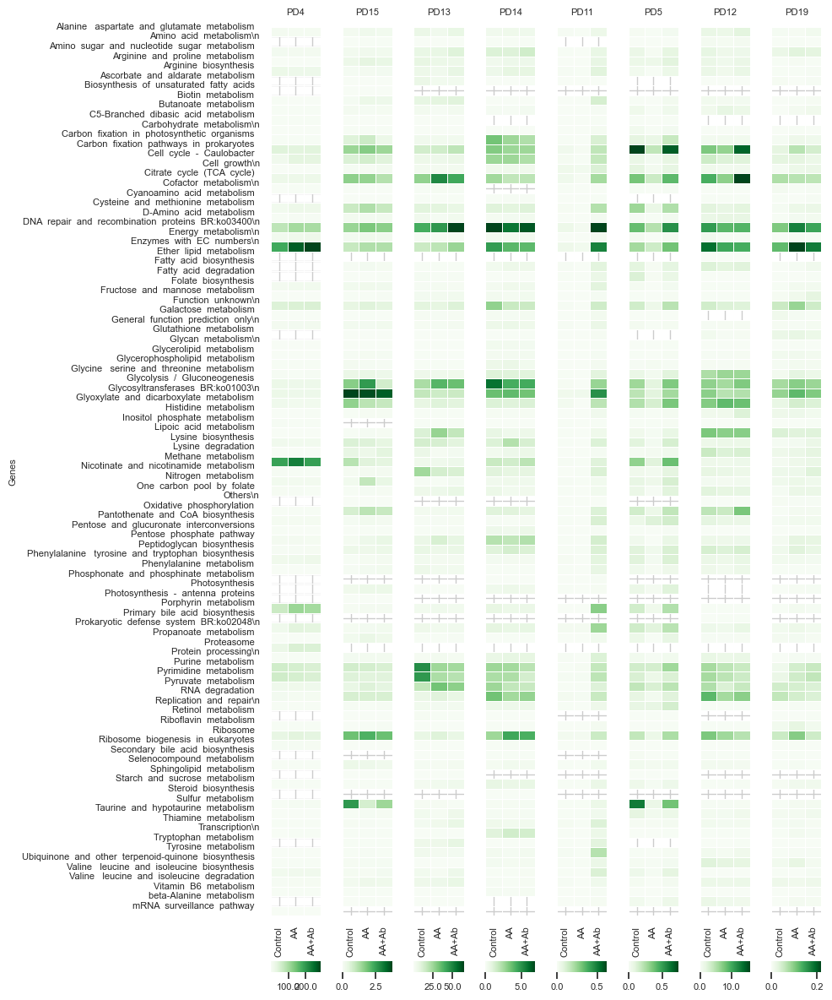

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib.ticker import FuncFormatter

# Example MAG DataFrames (replace with your actual data)
pd4_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD4")]]
pd15_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD15")]]
pd13_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD13")]]
pd14_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD14")]]
pd11_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD11")]]
pd5_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD5")]]
pd12_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD12")]]
pd19_df = organims_df[organims_df.columns[organims_df.columns.str.contains("PD19")]]

mag_dfs = [pd4_df, pd15_df, pd13_df, pd14_df, pd11_df, pd5_df, pd12_df, pd19_df]
mag_names = [
    'M. thermautotrophicus PD4', 'Symbiobacterium sp. PD15', 'C. subterraneus PD13',
    'Limnochordia sp. PD14', 'Carbobacillus sp. PD11', 'Moorellia sp. PD5',
    'Tissierellaceae sp. PD12', 'T. xylanilyticum PD19'
]

def divide_by_1000(x, _):
    return f'{x / 1000:.1f}'

formatter = FuncFormatter(divide_by_1000)

# Create the figure with custom grid layout
fig = plt.figure(figsize=(10, 12))
gs = gridspec.GridSpec(2, 8, height_ratios=[4, 0.05])  # Two rows: plots and colorbars

# Loop through each MAG and plot the heatmap
for i, (df, name) in enumerate(zip(mag_dfs, mag_names)):
    row, col = divmod(i, 8)  # Calculate grid position

    # Main heatmap axis
    ax = plt.subplot(gs[row, col])
    cbar_ax = plt.subplot(gs[1, col])  # Colorbar axis below each heatmap

    sns.heatmap(
        df,
        ax=ax,
        cmap="Greens",
        linewidths=0.5,
        annot=False,
        fmt=".2f",
        cbar=True,
        cbar_ax=cbar_ax,
        cbar_kws={"orientation": "horizontal"}
    )

    cbar = ax.collections[0].colorbar
    cbar.ax.xaxis.set_major_formatter(formatter)
    # Customize the colorbar
    # cbar_ax.set_xlabel('Expression Level', fontsize=8)
    cbar_ax.xaxis.set_label_position('bottom')
    cbar_ax.tick_params(axis='x', labelsize=8)

    # Titles and axis labels
    ax.set_title(name.split(' ')[-1], fontsize=8, pad=10)
    # ax.set_xlabel('Sample', fontsize=8)
    if col == 0:  # Show y-axis labels only for the first column
        ax.set_ylabel('Genes', fontsize=8)
        ax.set_yticks(range(len(df.index)))
        ax.set_yticklabels(organims_df.index, fontsize=8)
    else:  # Hide y-axis labels for other columns
        ax.set_yticklabels([])
        ax.set_ylabel('')

    # Customize x-axis labels
    ax.set_xticklabels(['Control', 'AA', 'AA+Ab'], rotation=90, fontsize=8)

    # Add MAG name below the heatmap
    # ax.text(0.5, -0.3, name, ha='center', va='center', transform=ax.transAxes, fontsize=10)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)  # Space between heatmaps and colorbars

# Save and show the plot
plt.savefig(f'{outpath}deseq.metabolism.mags_heatmaps_with_colorbars.pdf', bbox_inches='tight')
plt.show()


## Z-Scores

In [56]:
import pandas as pd
import numpy as np

df_filtered.index = (
    df_filtered.index
    .str.replace(r'\\n', ' ', regex=True)   # Replace \n with a space
    .str.replace(r'/', ' ', regex=True)     # Replace / with a space
    .str.replace(r'\s+', ' ', regex=True)   # Replace multiple spaces with a single space
    .str.strip()                            # Remove leading/trailing spaces
)

# multindex
multi_index = df_filtered.columns

# Create new dataframe
df_zscores = pd.DataFrame(index=df_filtered.index)

# Iteration for each MAG
for i in range(0, len(multi_index), 3):
    mag_name = multi_index[i+1].replace(' AA','')
    
    # Control, AA & AA+Ab
    control_col = df_filtered.iloc[:, i]
    aa_col = df_filtered.iloc[:, i+1]
    aa_ab_col = df_filtered.iloc[:, i+2]
    
    # Differences
    diff_aa_control = aa_col - control_col
    diff_aa_ab_control = aa_ab_col - control_col
    diff_aa_aa_ab = aa_col - aa_ab_col
    
    # Concatenar las diferencias en un DataFrame
    diffs_df = pd.DataFrame({
        f'{mag_name}_AA-Control': diff_aa_control,
        f'{mag_name}_AA+Ab-Control': diff_aa_ab_control,
        f'{mag_name}_AA-AA+Ab': diff_aa_aa_ab
    }, index=df_filtered.index)
    
    # Z-scores
    z_scores = diffs_df.apply(lambda x: (x - x.mean()) / x.std(), axis=0)
    
    # Append Z-scores
    df_zscores = pd.concat([df_zscores, z_scores], axis=1)

# 
df_zscores.head()

,C. subterraneus PD13_AA-Control,C. subterraneus PD13_AA+Ab-Control,C. subterraneus PD13_AA-AA+Ab,Carbobacillus sp. PD11_AA-Control,Carbobacillus sp. PD11_AA+Ab-Control,Carbobacillus sp. PD11_AA-AA+Ab,Firmicutes sp. PD31_AA-Control,Firmicutes sp. PD31_AA+Ab-Control,Firmicutes sp. PD31_AA-AA+Ab,Firmicutes sp. PD7_AA-Control,...,Tepidimicrobiaceae sp. PD26_AA-AA+Ab,Tissierellaceae sp. PD12_AA-Control,Tissierellaceae sp. PD12_AA+Ab-Control,Tissierellaceae sp. PD12_AA-AA+Ab,metabat1.spades.2_AA-Control,metabat1.spades.2_AA+Ab-Control,metabat1.spades.2_AA-AA+Ab,metabat2.spades.7_AA-Control,metabat2.spades.7_AA+Ab-Control,metabat2.spades.7_AA-AA+Ab
KEGG.Name,,,,,,,,,,,,,,,,,,,,,
Alanine aspartate and glutamate metabolism,-0.462534,0.048651,-0.925527,0.250202,-0.462137,0.462590,0.392642,0.090204,1.101759,2.904160,...,0.209639,0.129574,0.442401,-0.352709,-0.653921,-2.481063,2.863416,NaN,NaN,NaN
Amino acid metabolism,-0.015682,-0.070643,0.103369,NaN,NaN,NaN,-0.217347,-0.231298,-0.164614,-0.137154,...,0.102527,0.406287,-0.008377,0.238199,0.655507,0.312587,0.322916,NaN,NaN,NaN
Amino sugar and nucleotide sugar metabolism,0.012213,0.527347,-0.960897,0.070896,-0.275403,0.271206,-0.172326,-0.215297,-0.052175,-0.802898,...,0.190801,-0.445184,-0.471585,0.202049,0.675488,0.518516,0.044343,NaN,NaN,NaN
Arginine and proline metabolism,-0.378543,-0.469730,0.192299,1.001394,-0.190157,0.241661,0.479048,0.287045,0.909695,-1.097717,...,0.172066,-0.081961,0.027459,-0.072872,0.369580,0.038217,0.384750,NaN,NaN,NaN
Arginine biosynthesis,-0.249667,0.307985,-1.024696,-0.094247,-0.035152,0.028716,0.395066,0.099554,1.086973,2.010399,...,0.184575,-0.101415,0.112629,-0.165924,-0.393676,-1.387240,1.567565,NaN,NaN,NaN


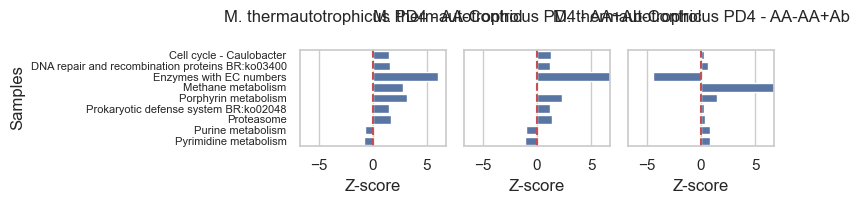

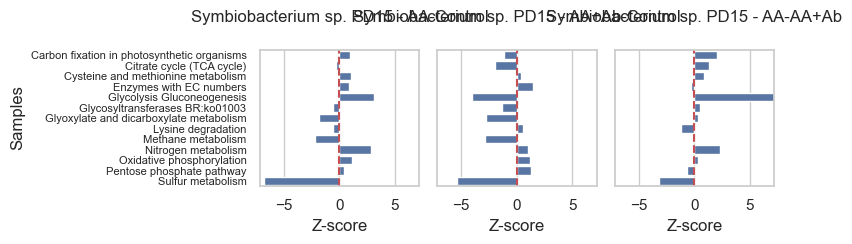

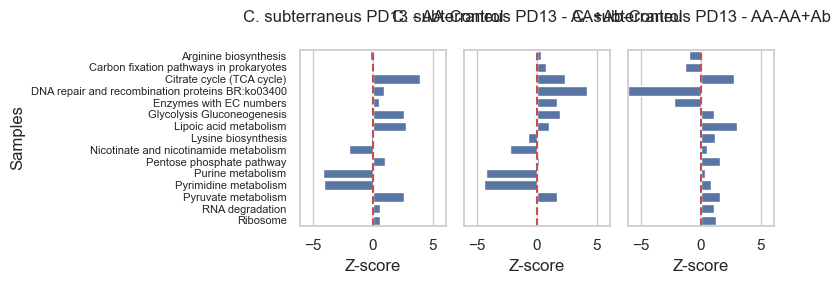

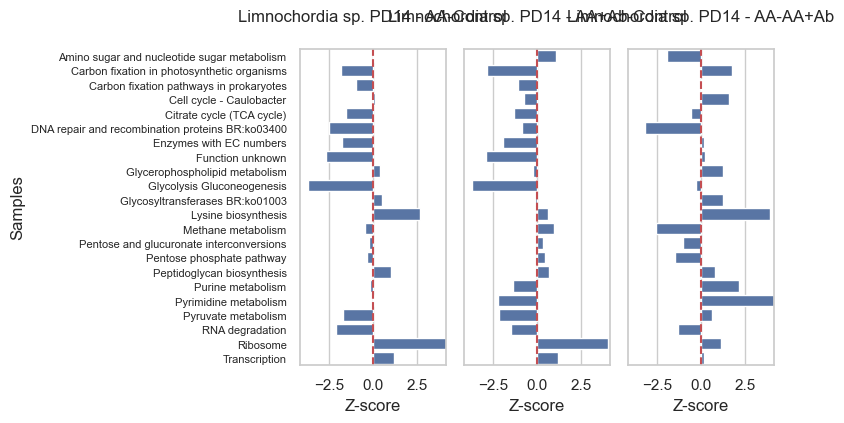

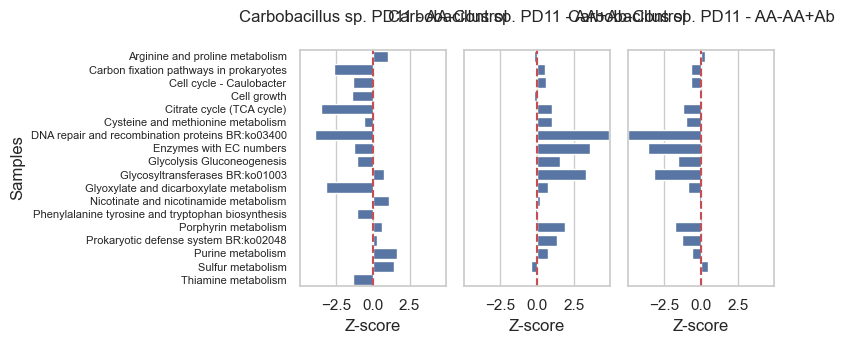

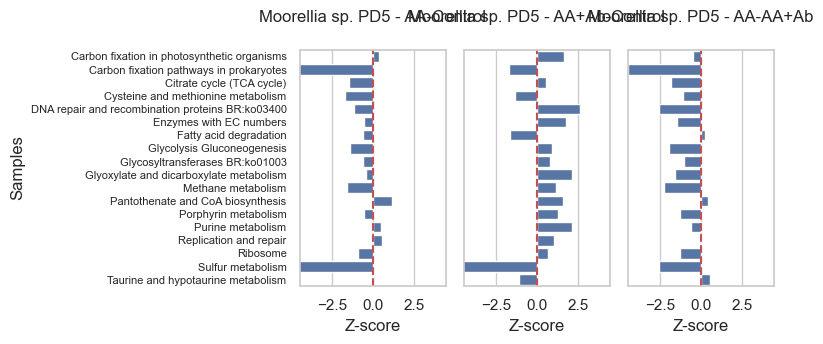

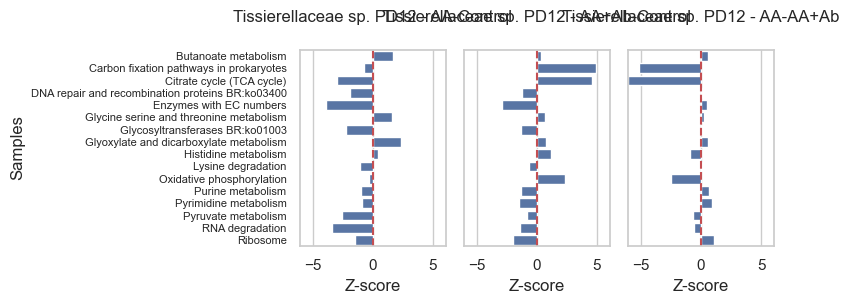

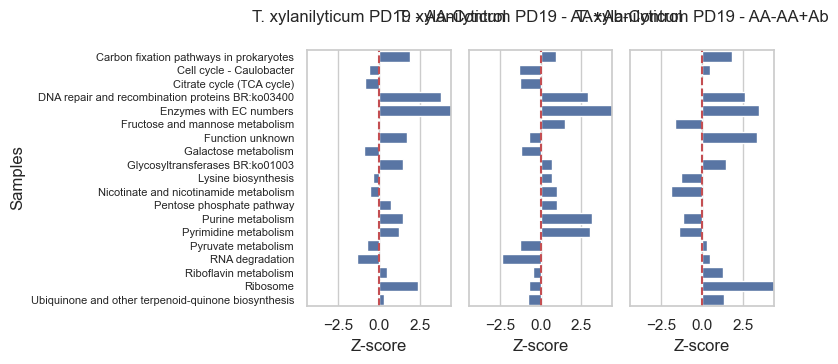

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Supongamos que df_zscores es tu DataFrame con los Z-scores calculados
# magsToGraph es la lista de MAGs que deseas graficar
magsToGraph = ['M. thermautotrophicus PD4', 'Symbiobacterium sp. PD15', 'C. subterraneus PD13', 'Limnochordia sp. PD14', 'Carbobacillus sp. PD11',
               'Moorellia sp. PD5', 'Tissierellaceae sp. PD12', 'T. xylanilyticum PD19']
threshold = 1  

# Configuración de Seaborn para mejorar la estética
sns.set(style="whitegrid")

def plot_mag(df, mag, threshold):
    # Filtrar los datos del MAG
    mag_data = df[[f'{mag}_AA-Control', f'{mag}_AA+Ab-Control', f'{mag}_AA-AA+Ab']]
    idxs = mag_data[np.abs(mag_data) > threshold].dropna(how='all').index
    mag_data = mag_data.loc[idxs]
    
    # Comparaciones a graficar
    comparisons = ['AA-Control', 'AA+Ab-Control', 'AA-AA+Ab']

    # Calcular la altura dinámica en función del número de filas
    num_rows = len(mag_data)
    height_per_row = 0.2  # Altura por fila (ajusta según sea necesario)
    fig_height = max(2.2, num_rows * height_per_row)  # Mínimo de 2 unidades de altura

    # Crear una figura y ejes para el gráfico
    fig, axes = plt.subplots(1, 3, figsize=(8, fig_height), sharex=True, sharey=True)
    
    for i, comp in enumerate(comparisons):
        # Preparar los datos para el gráfico
        data = mag_data[f'{mag}_{comp}']
        
        sns.barplot(x=data.values, y=mag_data.index, ax=axes[i], orient='h')
        axes[i].set_title(f'{mag} - {comp}', pad=20)
        axes[i].set_xlabel('Z-score')
        
        if i == 0:
            axes[i].set_ylabel('Samples')
        else:
            axes[i].set_ylabel('')
        
        # Ajustar límites y etiquetas
        try:
            axes[i].set_xlim([-max(np.abs(data)), max(np.abs(data))])
        except:
            axes[i].set_xlim(-1, 1)
        
        # Ajustar espaciado de las etiquetas del eje y
        axes[i].tick_params(axis='y', labelsize=8)  # Ajustar el tamaño de la fuente de las etiquetas
        
        # Añadir línea en 0
        axes[i].axvline(x=0, color='r', linestyle='--')
        
        # Asegurarse de que las etiquetas sean visibles
        plt.sca(axes[i])
        plt.yticks(ticks=np.arange(len(mag_data.index)), labels=mag_data.index)
        
        for tick in axes[i].get_xticklabels():
            tick.set_rotation(0)

    # Ajustar espaciado y guardar la figura
    plt.tight_layout()
    plt.savefig(f'{outpath}zscore_{mag}.pdf')
    plt.show()

# Asegurarse de que todos los MAGs tengan gráficos
for mag in magsToGraph:
    for comp in ['AA-Control', 'AA+Ab-Control', 'AA-AA+Ab']:
        if f'{mag}_{comp}' not in df_zscores.columns:
            df_zscores[f'{mag}_{comp}'] = np.nan
    plot_mag(df_zscores, mag, threshold)

#### Differentially expressed

In [61]:
############################################################
import pandas as pd
import numpy as np
import os
import seaborn as sns
import matplotlib.pyplot as plt
############################################################
deseqMetabolism = pd.read_csv(f'{path}tables/deseq.normalized.metabolism.tsv',sep='\t',index_col=0)
differentialExpression = pd.read_csv(f'{path}tables/all_results.csv',index_col=0)
deseqMetabolismDiff = pd.DataFrame(columns=list(deseqMetabolism.columns[0:2])+list(deseqMetabolism.columns[10:])+list(['log2FC','pvalue','padjusted','Condition']))

names = {}
with open(f'{path}tables/names.list.final.short.tsv')as f:
    for line in f:
        line = line.strip()
        old,new = line.split('\t')
        names[old] = new

for i in deseqMetabolism.itertuples():
    idx = i[0]
    gene = i[1]
    mag = i[2]
    if gene in differentialExpression.index:
        dftmp = differentialExpression.loc[gene]
        for j in dftmp.itertuples():
            deseqMetabolismDiff.loc[len(deseqMetabolismDiff)] = list(i[1:3]) + list(i[11:]) + list([j[2],j[5],j[6],j[8]])


In [654]:
deseqMetabolismDiff.to_csv('deseq.metabolism.differentially.expressed.genes.tsv',sep='\t')

In [63]:
deseqMetabolismDiff = pd.read_csv(f'{path}tables/deseq.metabolism.differentially.expressed.genes.tsv',sep='\t',index_col=0)
deseqMetabolismDiff = deseqMetabolismDiff[deseqMetabolismDiff['pvalue'] < 0.05]
deseqMetabolismDiff.to_clipboard()

In [64]:
deseqMetabolismDiff = deseqMetabolismDiff[deseqMetabolismDiff['KEGG.Name'] != '-']

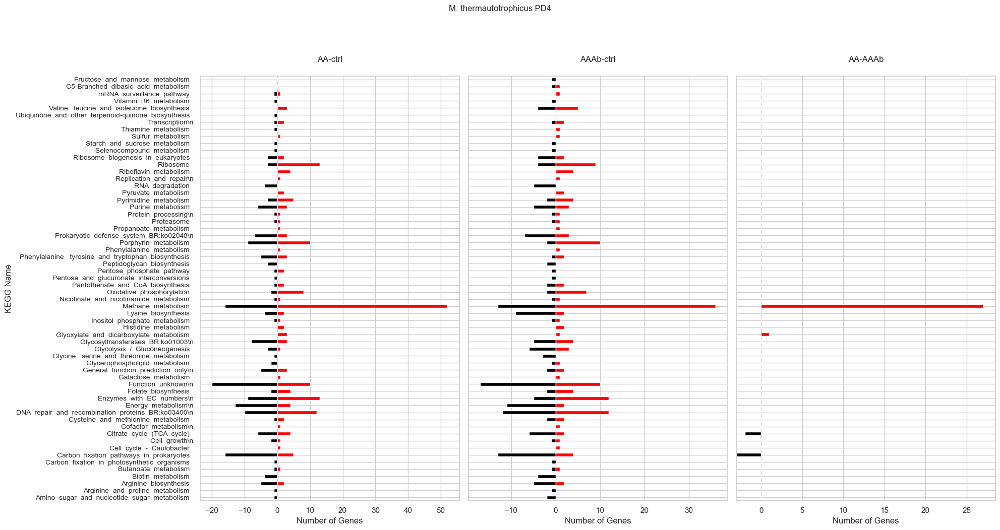

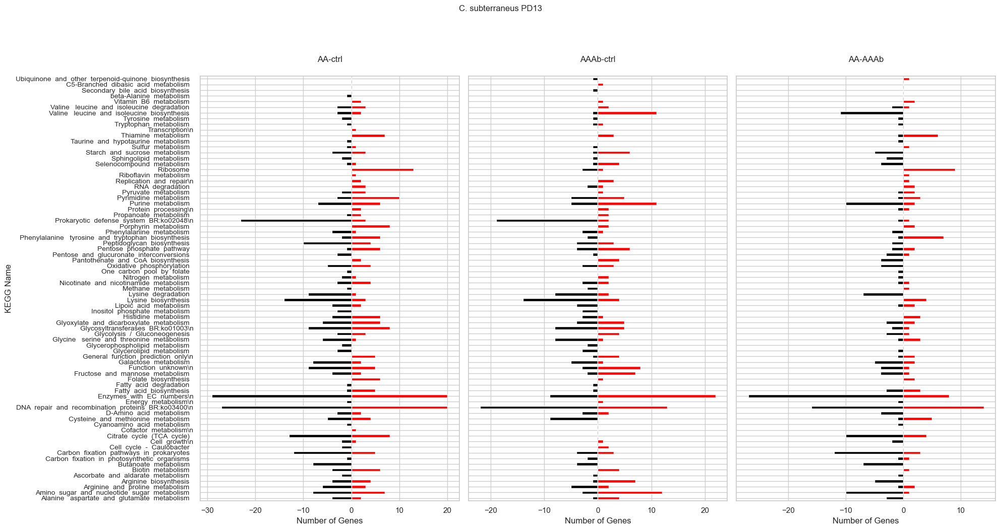

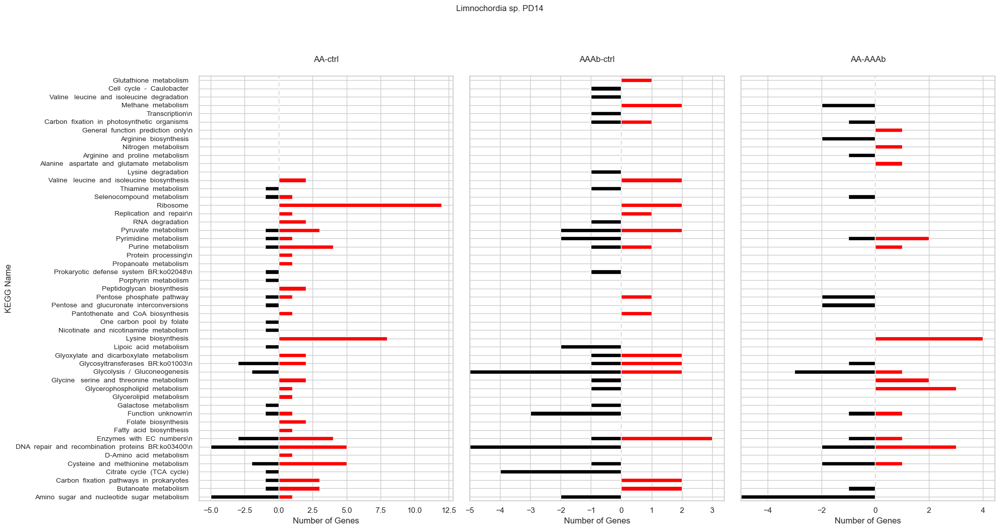

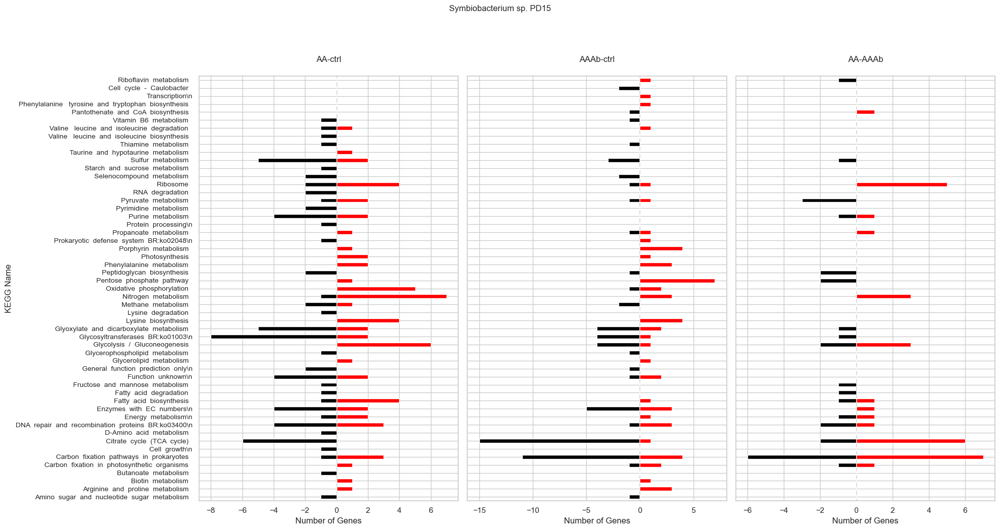

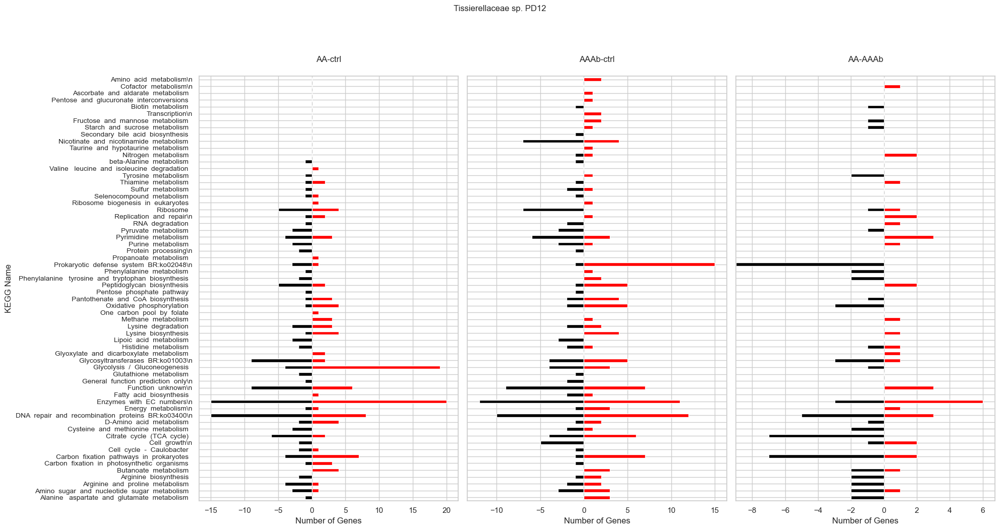

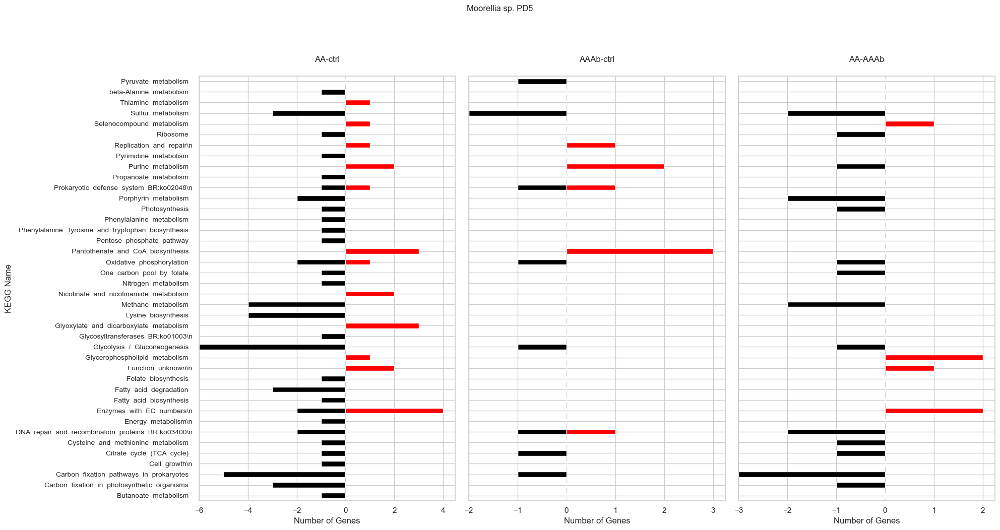

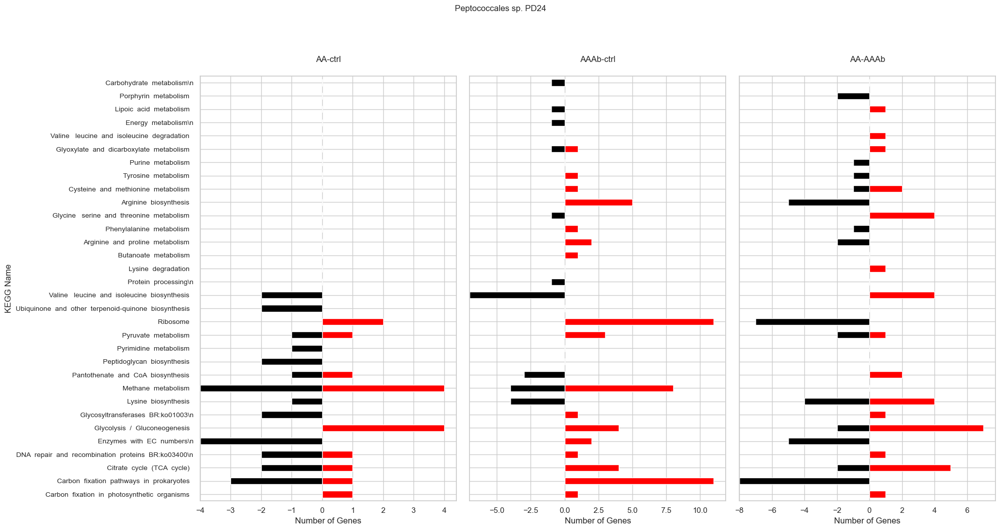

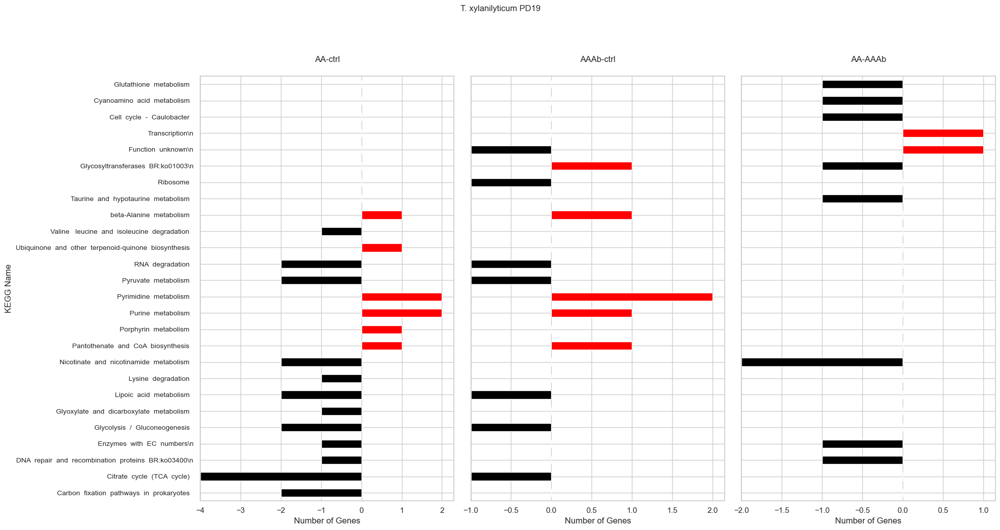

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

magsToGraph = ['M. thermautotrophicus PD4','C. subterraneus PD13', 'Limnochordia sp. PD14','Symbiobacterium sp. PD15','Tissierellaceae sp. PD12', 
               'Moorellia sp. PD5','Peptococcales sp. PD24','T. xylanilyticum PD19']
conditions = ['AA-ctrl', 'AAAb-ctrl', 'AA-AAAb']  # List of Conditions

# Aesthetic
sns.set(style="whitegrid")

def plot_mag(df, mag, conditions):
    fig, axes = plt.subplots(1, len(conditions), figsize=(20, 10), sharey=True)
    
    all_categories = df['KEGG.Name'].unique()
    
    summaries = []
    
    for i, condition in enumerate(conditions):
        # Filtering MAG and condition
        mag_data = df[(df['MAG'] == mag) & (df['Condition'] == condition)]
        
        # Count the number of genes for each KEGG category, separated by log2FC
        summary = mag_data.groupby('KEGG.Name')['log2FC'].apply(lambda x: pd.Series({'Negative': (x < 0).sum(), 'Positive': (x > 0).sum()})).unstack().fillna(0)
                
        # Make sure that all KEGG category are present
        for category in all_categories:
            if category not in summary.index:
                summary.loc[category] = {'Negative': 0, 'Positive': 0}
                
        summaries.append(summary)
    
    # Combine all and filtering empty rows
    combined_summary = pd.concat(summaries, keys=conditions, axis=1).fillna(0)
    filtered_combined_summary = combined_summary[(combined_summary != 0).any(axis=1)]
    
    for i, condition in enumerate(conditions):
        summary = filtered_combined_summary.xs(condition, level=0, axis=1)
        
        # data for plot
        summary = summary.assign(
            Negative=-summary['Negative'],  
            Positive=summary['Positive']  
        )

        # Plot
        summary[['Negative', 'Positive']].plot(kind='barh', stacked=True, ax=axes[i], color=['Black', 'Red'])

        # 
        axes[i].set_title(f'{condition}', pad=20)
        axes[i].set_xlabel('Number of Genes')
        axes[i].set_ylabel('KEGG Name')
        axes[i].get_legend().remove()
        axes[i].tick_params(axis='y', labelsize=10)
        
    # 
    plt.suptitle(f'{mag}', fontsize=12, y=1.05)
    plt.tight_layout()
    plt.savefig(f'zscore_{mag}.svg')
    plt.show()

# Make sure all MAGs have rows to graph
for mag in magsToGraph:
    plot_mag(deseqMetabolismDiff, mag, conditions)

In [368]:
# Only The Archaea
df_filtered.to_clipboard()

In [72]:
arq = "M. thermautotrophicus PD4"
# Which are the modules with higher expression in the archaea?
tpmMetabolismMT = tpmMetabolism[tpmMetabolism['MAG'] == "M. thermautotrophicus PD4"]
groubyModule = tpmMetabolismMT.groupby('Module').sum()
groubyModule['Control'] = groubyModule[['C1','C2','C3']].mean(axis=1)
groubyModule['AA'] = groubyModule[['AA1','AA2','AA3']].mean(axis=1)
groubyModule['AA+Ab'] = groubyModule[['AA+Ab1','AA+Ab3']].mean(axis=1)
groubyModule2 = groubyModule[['Control','AA','AA+Ab']]
groubyModule2

,Control,AA,AA+Ab
Module,,,
-,3.856873e+06,2.714513e+06,902358.789469
M00001,1.167361e+04,7.473750e+03,2520.171650
M00002,6.357752e+03,3.123770e+03,1060.118448
M00003,8.767891e+03,5.172344e+03,1729.518852
M00004,8.121574e+01,5.580468e+01,27.653257
...,...,...,...
M00925,1.881067e+04,1.711987e+04,5470.754448
M00926,3.291378e+03,2.004228e+03,709.541948
M00935,2.438388e+03,9.487306e+02,343.912649


In [369]:
df_filtered2 = pd.read_clipboard(index_col=0)

<Figure size 500x3000 with 0 Axes>

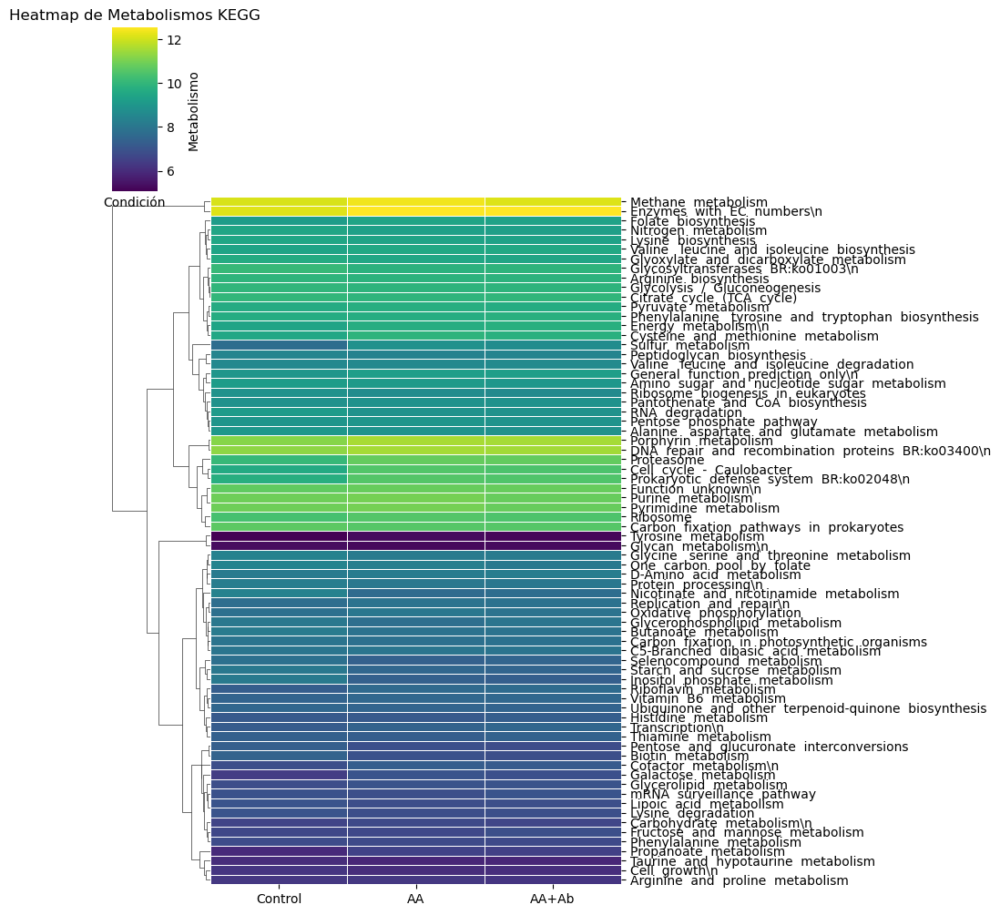

In [ ]:

plt.figure(figsize=(5,30))
sns.clustermap(np.log(df_filtered2), cmap="viridis", linewidths=.5,col_cluster=False, yticklabels=1)

# Configurar los títulos y etiquetas
plt.title('Heatmap de Metabolismos KEGG')
plt.xlabel('Condición')
plt.ylabel('Metabolismo')

# Ajustar los nombres de las filas y columnas para que sean más legibles
plt.yticks(rotation=0)
plt.xticks(rotation=90, ha='right')

# Mostrar el gráfico
plt.savefig(f'{outpath}deseq.m.thermautotrophicus.metabolism.tpm.svg')
plt.show()

In [371]:
arqDifference = pd.read_clipboard(index_col=0)


In [388]:
# Aplicar logaritmo natural a los valores positivos
log_positive = np.log(arqDifference[arqDifference > 0])

# Aplicar logaritmo natural a los valores negativos (multiplicados por -1)
log_negative = np.log(arqDifference[arqDifference < 0] * -1)*-1

# Combinar ambos resultados en un solo DataFrame
combined_log = log_positive.combine_first(log_negative)

# Renombrar las columnas para mayor claridad
combined_log.columns = [f'log({col})' for col in combined_log.columns]

<Figure size 500x3000 with 0 Axes>

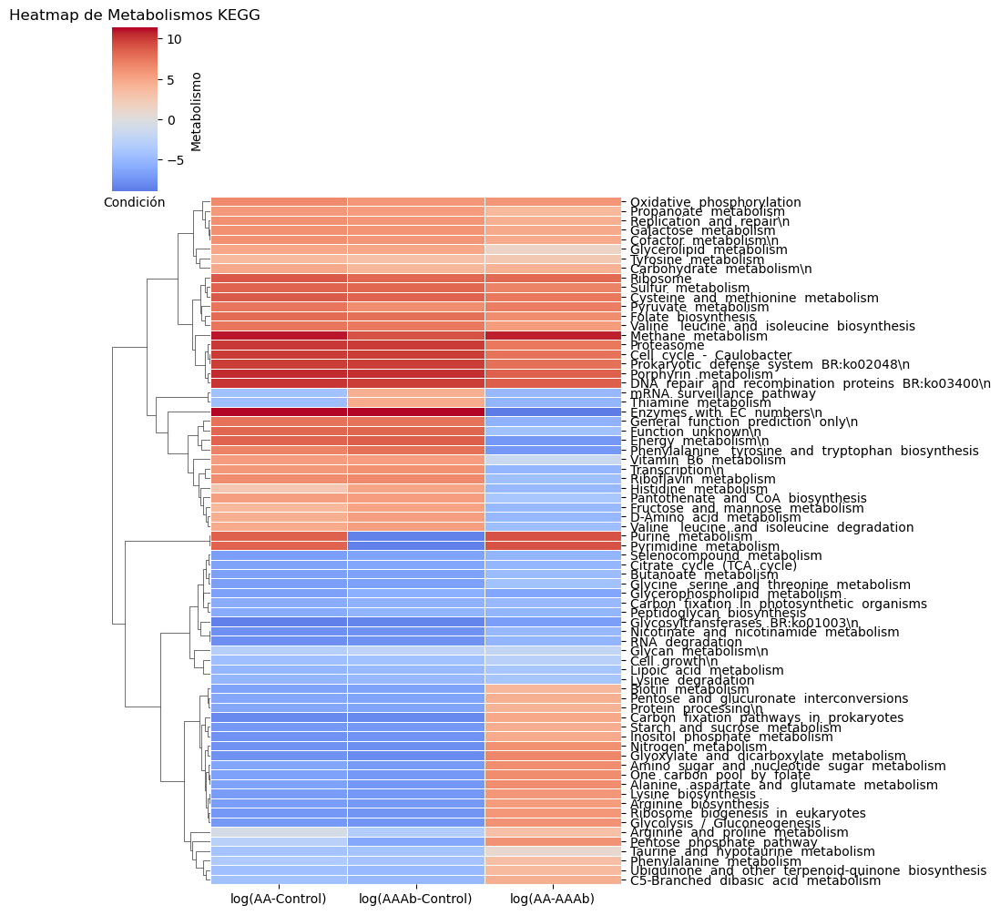

In [387]:

plt.figure(figsize=(5,30))
verdeVioleta = sns.diverging_palette(145, 300, s=60, as_cmap=True)
azulRojo = sns.color_palette("coolwarm", as_cmap=True)
sns.clustermap(combined_log, cmap=azulRojo, center=0,linewidths=.5,col_cluster=False, yticklabels=1)

# Configurar los títulos y etiquetas
plt.title('Heatmap de Metabolismos KEGG')
plt.xlabel('Condición')
plt.ylabel('Metabolismo')

# Ajustar los nombres de las filas y columnas para que sean más legibles
plt.yticks(rotation=0)
plt.xticks(rotation=90, ha='right')

# Mostrar el gráfico
plt.savefig('deseq.difference.m.thermautotrophicus.metabolism.tpm.svg')
plt.show()

### Peptidoglycan PWY

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

In [ ]:
# Run just once the preparation of the metabolism
ppwy = pd.DataFrame(columns=['PWY','KO','Gene','Name'])
with open (f'{path}tables/peptidoglycan.pwy')as file:
    for line in file:
        if line.startswith('K'):
            ko = line.split(" ")[0]
            gene = line.split(";")[0].split(" ")[1]
            name = line.split(";")[1].replace("\n","")
            ppwy.loc[len(ppwy)] = (pwy,ko,gene,name)
        else:
            pwy = line.replace("\n","")
ppwy.to_csv(f'{path}db/peptidoglycan.pwy',sep='\t',index=False)

In [ ]:
peptidoglycanGenes = pd.read_csv(f'{path}db/peptidoglycan.genes.tsv', sep='\t', index_col=0,names=['KO'])
peptidoglycanGenes['MAG'] = peptidoglycanGenes.index.str.rsplit('_', n=1).str.get(0)
peptidoglycanGenes['MAG'] = peptidoglycanGenes.MAG.str.rsplit("_",n=1).str.get(0)
names = {}
mags = []
with open(f'{path}tables/names.list.final.short.tsv')as f:
    for line in f:
        old,new= line.split("\t")
        new=new.replace("\n","")
        names[old]=new
        mags.append(new)

df = pd.DataFrame(columns=ppwy.Gene.unique(),index=mags)
df.fillna(0,inplace=True)

for i in peptidoglycanGenes.itertuples():
    gene = i[0]
    ko = i[1]
    bin = i[2]
    if bin in names.keys():
        mag = names[bin]
        geneName = ppwy[ppwy['KO'] == ko].Gene
        df.loc[mag,geneName] += 1
    

/tmp/ipykernel_26332/647399674.py:14: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.fillna(0,inplace=True)


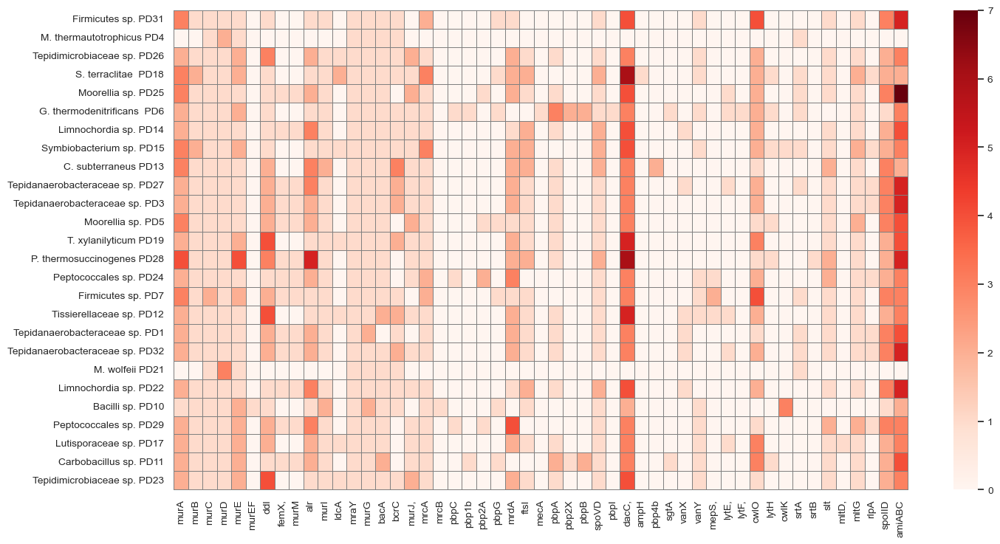

In [80]:
cols = df.columns[df.sum() > 0]
df2 = df[cols]

from matplotlib import pyplot as plt
import seaborn as sns
plt.rcParams["figure.figsize"] = [15, 7.5]
plt.rcParams["figure.autolayout"] = True
sns.set(font_scale=0.9)
plt.xticks(rotation=90)

# df = np.log(df.fillna(0)+1)
# df2 = df2.fillna('')
min_ = df2.min().min()
max_ = df2.max().max()
fig = sns.heatmap(df2, cmap="Reds",
                # center=3000,
                vmin=min_,vmax=max_,cbar=True,linewidths=0.5, linecolor='grey',clip_on=False,mask=df2.isna(),
            annot_kws={'size': 'small', 'alpha':1,'weight':'bold'})#,
            #annot=df2, fmt='')
plt.savefig(f"{outpath}numberOfPeptidoglycanGenes.svg", bbox_inches='tight')  # Use bbox_inches='tight' to ensure tight layout
plt.savefig(f"{outpath}numberOfPeptidoglycanGenes.pdf", bbox_inches='tight')  

In [81]:
globalDifferential = pd.read_csv(f'{path}tables/all_results.csv', index_col=0)
diffPWY = globalDifferential[globalDifferential.index.isin(peptidoglycanGenes.index)]
diffPWY = diffPWY[diffPWY['pvalue'] <= 0.01]
diffPWY2 = diffPWY.sort_values(by=['MAG','Condition'])
for i in diffPWY2.index:
    ko = peptidoglycanGenes.loc[i].KO
    if type(ko) != str:
        if len(ko.values) > 1:
            for k in ko.values:
                geneName = ppwy[ppwy['KO'] == k].Gene.values[0]
                diffPWY2.loc[i,'GENE'] = geneName
        else:
            print (ko)
    else:
        geneName = ppwy[ppwy['KO'] == ko].Gene.values[0]
        diffPWY2.loc[i,'GENE'] = geneName

In [ ]:
ppwy = pd.read_csv(f'{path}db/peptidoglycan.pwy',sep='\t')
expression = pd.read_csv(f'{path}tables/expression_data.tsv',sep='\t',index_col=0)
pglycan_mags = pd.read_csv(f'{path}/tables/pglycan.kos.mags.tsv',sep='\t',index_col=0,names=['KO'])

pglycan_expr = pd.DataFrame(columns=['Name','MAG','KO','Control','AA','AA+Ab'])
not_expressed = []
for i in pglycan_mags.itertuples():
    gene = i[0]
    ko = i[1]
    name = list(ppwy[ppwy['KO'] == ko]['Gene'])[0]
    if gene in expression.index:
        expr = expression.loc[gene]
        mag = expr.MAG
        control = expr[0:3].mean()
        aa = expr[3:6].mean()
        if mag != 'Methanothermobacter_thermautotrophicus_UNIPD4':
            aaab = expr[6:8].mean()
        else:
            aaab = (expr.iloc[6]+expr.iloc[8])/2
        pglycan_expr.loc[len(pglycan_expr)] = (name,mag,ko,control,aa,aaab)
    else:
        not_expressed.append(gene)

In [83]:
ppwy.Gene.unique()

array(['murA', 'murB', 'murC', 'murD', 'murE', 'murEF', 'alr-murF', 'ddl',
       'femX,', 'femA', 'femB', 'murM', 'murN', 'alr', 'murI', 'ldcA',
       'mraY', 'murG', 'bacA', 'bcrC', 'murJ,', 'mrcA', 'mrcB', 'pbpC',
       'pbp1b', 'pbp2A', 'pbpD', 'pbpG', 'mrdA', 'ftsI', 'mecA', 'pbpA',
       'pbp3', 'pbp2B,', 'pbp2X', 'pbpB', 'pbp5,', 'spoVD', 'pbpH',
       'pbpI', 'dacC,', 'dacB', 'ampH', 'pbp4b', 'mtgA', 'sgtA', 'sgtB',
       'erfK', 'ynhG', 'ybiS', 'ycfS', 'ycbB', 'vanX', 'vanY', 'vanXY',
       'E3.4.17.14', 'mepA', 'mepH', 'mepS,', 'mepM', 'lytE,', 'lytF,',
       'cwlO', 'cwlS', 'lytH', 'cwlK', 'ripA', 'ripB', 'lytM', 'srtA',
       'srtB', 'artA', 'slt', 'mltA', 'mltB', 'mltC', 'mltD,', 'mltE,',
       'mltF', 'mltG', 'rlpA', 'sleB', 'spoIID', 'amiABC', 'amiD', 'ampD',
       'lpp'], dtype=object)

In [84]:
# Who has MurA, MurB and MurF?
set1 = ['murA','murB','murF','alr-murF']
set2 = ['murC','murD','murE','murEF']
degradation = 'mpI'
ppwy[ppwy['Gene'].isin(set1)]

,PWY,KO,Gene,Name
0,Transferase/Dehydrogenase,K00790,murA,UDP-N-acetylglucosamine 1-carboxyvinyltransfe...
1,Transferase/Dehydrogenase,K00075,murB,UDP-N-acetylmuramate dehydrogenase [EC:1.3.1.98]
7,Amino acid ligase,K01798,alr-murF,Alr-MurF fusion protein [EC:5.1.1.1 6.3.2.10]
15,Racemase,K01798,alr-murF,Alr-MurF fusion protein [EC:5.1.1.1 6.3.2.10]


In [85]:
df_melted2 = pd.melt(pglycan_expr, id_vars=["Name", "MAG","KO"], var_name="Type", value_name="Value")

### TCA cycle

In [87]:
# Get pwy for tca cycle and check which MAGs have them
import os
import pandas as pd
import seaborn as sns
import numpy as np

"""
M00003  	Gluconeogenesis, oxaloacetate => fructose-6P [PATH:map00020]
M00009  	Citrate cycle (TCA cycle, Krebs cycle) [PATH:map00020]
M00010  	Citrate cycle, first carbon oxidation, oxaloacetate => 2-oxoglutarate [PATH:map00020]
M00011  	Citrate cycle, second carbon oxidation, 2-oxoglutarate => oxaloacetate [PATH:map00020]
M00307  	Pyruvate oxidation, pyruvate => acetyl-CoA [PATH:map00020]
M00740  	Methylaspartate cycle [PATH:map00020]
"""
modules = ['M00003','M00009','M00010','M00011','M00307','M00740']
names = ['PWY','Status','in_total','kos','kos2','NA']
kemet_p = f'{path}tables/kemet/'
namesID = {}
with open(f'{path}tables/names.list.final.short.tsv')as f:
    for line in f:
        old,new = line.split("\t")
        new = new.replace("\n","")
        namesID[old] = new

tca_mags = pd.DataFrame(columns=modules)
for file in os.listdir(kemet_p):
    if file.endswith('tsv'):
        mag = file.replace('reportKMC_','').replace('.tsv','')
        if mag in namesID.keys():
            tca_mags.loc[mag,'Name'] = namesID[mag]
            df_kemet = pd.read_csv(kemet_p+file,sep='\t',index_col=0,names=names)
            for mod in modules:
                series_module = df_kemet.loc[mod]['in_total']
                if type(series_module) != str:
                    series_module = series_module[0]
                present,total = series_module.split("__")
                tca_mags.loc[mag,mod] = float(present)/float(total)

/tmp/ipykernel_26332/1620182963.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_module = series_module[0]
/tmp/ipykernel_26332/1620182963.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_module = series_module[0]
/tmp/ipykernel_26332/1620182963.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  series_module = series_module[0]
/tmp/ipykernel_26332/1620182963.py:35: FutureWarning: Series.__getitem__ treating 

In [ ]:
tca_mags.to_clipboard()

### __Differential expression__

In [ ]:
# Generate a table with the differential expression for each KO
# Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# AA-Ctrl
path = f'{path}tables/mags_read_count'
df_aa_ctrl = pd.DataFrame()


def filterExpression(file,ko_file,lf=1.0,padj=0.05):
    """ 
    Function to filter the results of the expression
    Returns a filtered dataframe with the KOs associated
    """
    df = pd.read_csv(file, sep=',',index_col=0)
    df_ko = pd.read_csv(ko_file,names=['KO'], index_col=0, sep='\t')
    
    df_filter = df[(np.abs(df["log2FoldChange"]) > lf) & (df['padj'] < padj)]
    for gene in df_filter.index:
        try:
            kos = df_ko.loc[gene]['KO']
            kos = kos.replace('ko:','')
        except:
            kos = '-'
        df_filter.loc[gene,"KO"] = kos
    return df_filter

def searchKoInKemet(kemet,ko):
    """ 
    Search in which module is the KO and retrieve a tuple of module - name - completeness
    """
    found = False
    t = []
    for i in kemet.itertuples():
        module = i[0]
        name = i[1]
        c = i[3].split("__")
        c = (float(c[0])/float(c[1])) * 100
        if type(i[5]) != float:
            kos = i[5].split(",")
            if ko in kos:
                if len(t) == 0:
                    t = [module,name,c]
                else:
                    v = t
                    v[0] = v[0]+','+module
                    v[1] = v[1]+','+name
                    v[2] = str(v[2])+','+str(c)
                    t = v
                found = True
    if found == True:
        return t

In [ ]:
# Parse metabolism kegg
import os
files = os.listdir(f'{path}db/KEGG/')
metabolism = pd.DataFrame(columns=['MAIN','KEGG-Metabolism','Name','KO','KO-Name','EC'])
for f in files:
    n = f.split(".")[0]
    
    # metabolism_df = pd.DataFrame(columns=['KEGG-Metabolism','Name','KO','KO-Name','EC'])
    with open(f'/home/esteban/Documents/db/KEGG/{f}')as f:
        met = ''
        name = ''
        for line in f:
            if line.startswith('K'):
                ko = line.split(' ')[0]
                if '[' in line:
                    ko_name = str(line.split(' ')[1:]).split("[EC")[0].replace("[","").replace(",","").replace("'","")
                    ec = line.split("[")[1].replace("]","").replace("\n","")
                else:
                    ko_name = str(line.split(" ")[1:]).replace("\n","")
                    ec = '-'
                metabolism.loc[len(metabolism)] = n,met,name,ko,ko_name,ec
            else:
                met = line.split(" ")[0]
                name = str(str(line.split(" ")[1:]).split("PATH:")[0]).replace('[','').replace(']','').replace("'","").replace(","," ").replace("PATH:","-")
# metabolism.to_csv("/home/esteban/Documents/db/metabolism.parsed.tsv",sep='\t', index=False)

In [ ]:
metabolism = pd.read_csv(f"{path}db/metabolism.parsed.tsv",sep='\t')
metabolism.head()

,MAIN,KEGG-Metabolism,Name,KO,KO-Name,EC
0,Folding_sorting_degradation,3050.0,Proteasome,K03033,"['PSMD3,', 'RPN3;', '26S', 'proteasome', 'regu...",-
1,Folding_sorting_degradation,3050.0,Proteasome,K06693,"['PSMD9,', 'RPN4;', '26S', 'proteasome', 'regu...",-
2,Folding_sorting_degradation,3050.0,Proteasome,K03035,"['PSMD12,', 'RPN5;', '26S', 'proteasome', 'reg...",-
3,Folding_sorting_degradation,3050.0,Proteasome,K03036,"['PSMD11,', 'RPN6;', '26S', 'proteasome', 'reg...",-
4,Folding_sorting_degradation,3050.0,Proteasome,K03037,"['PSMD6,', 'RPN7;', '26S', 'proteasome', 'regu...",-


#### Tables

In [ ]:
names = {}
with open('/home/esteban/Documents/esteban/experiments/aa_ab/final_mags/names.list.tsv')as f:
    for line in f:
        m = line.split("\t")[1].replace("\n","")
        old = line.split("\t")[0]
        names[m] = old

def CreateDF(file,path,lf=1.0,padj=0.05,names=names,metabolism=metabolism):
    # file = '/home/bioinfo/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/raw_results/Methanothermobacter_thermautotrophicus_UNIPD4_AA_ctrl.csv'
    
    columnas = ['PWY','Completeness','P-M','KOs_module','KOs_present','N']
    f = path+file
    mag = file.replace("_AA_ctrl.csv","")
    old = names[mag]
    ko_file = '/home/esteban/Documents/esteban/experiments/aa_ab/rna/kos/'+old+'.kos'
    df = filterExpression(f,ko_file,lf,padj)
    print (f'There are {len(df)} differentially expressed genes')
    kemet_mag = pd.read_csv(f'/home/esteban/Documents/esteban/experiments/aa_ab/kemet/reportKMC_{old}.tsv',sep='\t', index_col=0, names=columnas)

    for i in df.itertuples():
        gene = i[0]
        ko = i[7]
        t = None
        if ko != '-':
            if ',' in ko:
                ko = ko.split(",")[0]
            t = searchKoInKemet(kemet_mag,ko)
        if t is None:
            t = ['No Module','-','-']
        mets = metabolism[metabolism['KO'] == ko]
        met = ''
        met_name = ''
        ko_name = ''
        ec = ''
        pwy = ''
        if len(mets) > 1:
            for j in mets.itertuples():
                pwy = pwy +','+ j[1]
                met = met +','+ j[2]
                met_name = met_name +','+ j[3]
                ko_name = j[5]
                ec = j[6]
        elif len(mets) == 1:
            pwy = mets['MAIN'].values[0]
            met = mets['KEGG-Metabolism'].values[0]
            met_name =mets['Name'].values[0]
            ko_name = mets['KO-Name'].values[0]
            ec = mets['EC'].values[0]

        df.loc[gene,'PWY'] = pwy
        df.loc[gene,'Module'] = t[0]
        df.loc[gene,'Module-Name'] = t[1]
        df.loc[gene,'Module-Completeness'] = t[2]
        df.loc[gene,'Metabolism'] = met
        df.loc[gene,'Metabolism-name'] = met_name
        df.loc[gene,'KO-name'] = ko_name
        df.loc[gene,'EC'] = ec
        df.loc[gene,'MAG'] = mag
    return df

In [ ]:
# Define variables
lf = 1.3
padj = 0.05
combined = pd.DataFrame()

names = {}
with open('/home/esteban/Documents/esteban/experiments/aa_ab/final_mags/names.list.tsv')as f:
    for line in f:
        m = line.split("\t")[1].replace("\n","")
        old = line.split("\t")[0]
        names[m] = old

columnas = ['PWY','Completeness','P-M','KOs_module','KOs_present','N']
path = '/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/raw_results/'
filesRNA = os.listdir(path)

for file in filesRNA:
    if file.endswith('AAAb_ctrl.csv'):
        # file = '/home/bioinfo/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/raw_results/Methanothermobacter_thermautotrophicus_UNIPD4_AA_ctrl.csv'
        f = path+file
        mag = file.replace("_AAAb_ctrl.csv","")
        old = names[mag]
        ko_file = '/home/esteban/Documents/esteban/experiments/aa_ab/rna/kos/'+old+'.kos'
        df = filterExpression(f,ko_file,lf,padj)
        
        kemet_mag = pd.read_csv(f'/home/esteban/Documents/esteban/experiments/aa_ab/kemet/reportKMC_{old}.tsv',sep='\t', index_col=0, names=columnas)

        for i in df.itertuples():
            gene = i[0]
            ko = i[7]
            t = None
            if ko != '-':
                if ',' in ko:
                    ko = ko.split(",")[0]
                t = searchKoInKemet(kemet_mag,ko)
            if t is None:
                t = ['No Module','-','-']
            mets = metabolism[metabolism['KO'] == ko]
            met = ''
            met_name = ''
            ko_name = ''
            ec = ''
            pwy = ''
            if len(mets) > 1:
                for j in mets.itertuples():
                    pwy = pwy +','+ j[1]
                    if np.isnan(j[2]):
                        met = '-'
                    else:
                        met = met +','+ str(int(j[2]))
                    try:
                        if np.isnan(j[3]):
                            mname = '-'
                    except:
                        mname = j[3]
                    met_name = met_name +','+ mname
                    ko_name = j[5]
                    ec = j[6]
            elif len(mets) == 1:
                pwy = mets['MAIN'].values[0]
                met = mets['KEGG-Metabolism'].values[0]
                met_name =mets['Name'].values[0]
                ko_name = mets['KO-Name'].values[0]
                ec = mets['EC'].values[0]

            df.loc[gene,'PWY'] = pwy
            df.loc[gene,'Module'] = t[0]
            df.loc[gene,'Module-Name'] = t[1]
            df.loc[gene,'Module-Completeness'] = t[2]
            df.loc[gene,'Metabolism'] = met
            df.loc[gene,'Metabolism-name'] = met_name
            df.loc[gene,'KO-name'] = ko_name
            df.loc[gene,'EC'] = ec
            df.loc[gene,'MAG'] = mag
        combined = pd.concat([combined,df])

/tmp/ipykernel_6786/3266005448.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter.loc[gene,"KO"] = kos
/tmp/ipykernel_6786/3266005448.py:29: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '-' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_filter.loc[gene,"KO"] = kos
/tmp/ipykernel_6786/2612594620.py:66: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[gene,'PWY'] = pwy
/tmp/ipykernel_6786/2612594620.py:67: FutureWarning: Setting an item of incompatible d

In [ ]:
# combined.to_csv("aa_control_differential_expression2.tsv",sep='\t')
combined.to_csv("aaab_control_differential_expression2.tsv",sep='\t')

#### __Differential expression__

In [31]:
# Libraries
import pandas as pd
import numpy as np
import seaborn as sns

aa_control = pd.read_csv('~/Documents/esteban/experiments/aa_ab/differential_expression/aa_control_differential_expression2.tsv', sep='\t', index_col=0)
aaab_control = pd.read_csv('~/Documents/esteban/experiments/aa_ab/differential_expression/aaab_control_differential_expression2.tsv', sep='\t', index_col=0)
# diff = pd.read_csv('~/Documents/esteban/experiments/aa_ab/differential_expression/aa_ab_control_differential_expression.csv', sep='\t')
# Some statistics:
# Remove differential expressed genes between AA - AA+Ab
# aa_control = diff[diff['Condition'] == 'AA']
# aaab_control = diff[diff['Condition'] == 'AAAb']
# diff = pd.concat([aa_control,aaab_control],ignore_index=True)
aa_control = aa_control[(aa_control['padj'] <= 0.05) & (np.abs(aa_control['log2FoldChange']) >= 1.3)]
aaab_control = aaab_control[(aaab_control['padj'] <= 0.05) & (np.abs(aaab_control['log2FoldChange']) >= 1.3)]

la = len(aa_control)
lab = len(aaab_control)

na_mags = len(aa_control.MAG.unique())
nab_mags = len(aaab_control.MAG.unique())
print (la,na_mags,lab,nab_mags)

793 13 662 13


In [27]:
len(aaab_control[np.abs(aaab_control['log2FoldChange']) > 1.3])

662

In [32]:
diff = pd.concat([aa_control,aaab_control])
diff2 = diff[(diff['padj'] <= 0.05) & (np.abs(diff['log2FoldChange']) >= 1.0)]

In [33]:
# cuantos genes por cada MAG?
n_genes = {}
mags = set(aa_control.MAG.unique()) | set(aaab_control.MAG.unique())
mags = set(diff2.MAG.unique())
for mag in mags:
	diff_genes_mag = {}
	if mag not in n_genes.keys():
			n_genes[mag] = 0

	diff_genes_mag = set(list(diff2[diff2['MAG'] == mag].index))
	n_genes[mag] = len(diff_genes_mag)
n_genes

{'Tepidimicrobium_xylanilyticum_UNIPD19': 2,
 'Caldanaerobacter_subterraneus_UNIPD13': 486,
 'Tissierellaceae_sp._UNIPD12': 227,
 'Firmicutes_sp._UNIPD31': 1,
 'Tepidimicrobiaceae_sp._UNIPD26': 18,
 'Methanothermobacter_thermautotrophicus_UNIPD4': 148,
 'Tepidanaerobacteraceae_sp._UNIPD3': 48,
 'Tepidimicrobiaceae_sp._UNIPD23': 1,
 'Symbiobacterium_sp._UNIPD15': 62,
 'Limnochordia_sp._UNIPD22': 13,
 'Limnochordia_sp._UNIPD14': 2,
 'Lutisporaceae_sp._UNIPD17': 12,
 'Tepidanaerobacteraceae_sp._UNIPD27': 72,
 'Tepidanaerobacteraceae_sp._UNIPD32': 1,
 'Moorellia_sp._UNIPD5': 19}

In [34]:
np.sort(list(n_genes.values()))

array([  1,   1,   1,   2,   2,  12,  13,  18,  19,  48,  62,  72, 148,
       227, 486])

In [38]:
# Read a new dataframe modified by hand for the pathways
diff = pd.read_csv('~/Documents/esteban/experiments/aa_ab/differential_expression/aa_ab_control_differential_expression.csv', sep='\t')
aa_control = diff[diff['Condition'] == 'AA']
aaab_control = diff[diff['Condition'] == 'AAAb']

In [39]:
total = len(aa_control)
t = 0
for pwy in aa_control.PWY.unique():
    perc = np.round((len(aa_control[aa_control['PWY'] == pwy])/total)*100,2)
    t += perc
    print (pwy, perc)
print (100-t)

Transporters 9.14
Energy 6.64
Carbohydrate 6.06
genetic_information 6.06
Signalling 2.98
nan 0.0
Nucleotide 2.12
Lipid 0.67
cofactors_and_vitamins 3.66
cell_growth 0.38
Folding_sorting_degradation 0.48
Aminoacids 7.22
protein_families 1.15
signalling 0.1
Translation 0.29
53.050000000000004


In [40]:
total = len(aaab_control)
t = 0
for pwy in aaab_control.PWY.unique():
    perc = np.round((len(aaab_control[aaab_control['PWY'] == pwy])/total)*100,2)
    t += perc
    print (pwy, perc)
print (100-t)

Carbohydrate 5.8
Transporters 10.99
Energy 5.07
Signalling 3.62
genetic_information 6.4
protein_families 1.69
cofactors_and_vitamins 2.54
Nucleotide 1.57
cell_growth 0.24
Folding_sorting_degradation 0.48
Aminoacids 8.7
nan 0.0
Lipid 0.85
Translation 0.48
51.57000000000001


# Fig. 4 - ARGs

In [43]:
# Build table of presence plus expression
import pandas as pd
import numpy as np
import os
####################################  #################################
####################################  #################################
tableAMR = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/tableAMR.tsv',sep='\t')
# Subset the table only with values on 'flag' column
tableAMR2 = tableAMR[~tableAMR.flag.isna()]
# Create a new dataframe with only the function KO2 flag and MAG column
tableAMR3 = pd.DataFrame(columns=['gene','MAG','KO','AMR','function'])
for i in tableAMR2.itertuples():
    gene = i[1]
    mag = i[-1]
    ko = i[-4]
    amr = i[-2]
    function = i[8]
    if ';' in amr or '/' in amr:
        if ';' in amr:
            amrs = amr.split(";")
        else:
            amrs = amr.split("/")
        for a in amrs:
            a = a.lower().replace(" ","")
            if a == 'kanamycina':
                a = 'kanamycin'
            a = a.capitalize()
            tableAMR3.loc[len(tableAMR3)] = (gene,mag,ko,a,function)
    else:
        amr = amr.lower().replace(" ","")
        if amr == 'kanamycina':
            amr = 'Kanamycin'
        amr = amr.capitalize()
        tableAMR3.loc[len(tableAMR3)] = (gene,mag,ko,amr,function)

In [44]:
amrList = list(tableAMR3.AMR.unique())
amrList.sort()
amrDict = {}

amr_df = pd.DataFrame(columns=amrList,index=tableAMR3.MAG.unique())
amr_df.fillna(0,inplace=True)
for i in tableAMR3.itertuples():
    gene = i[1]
    mag = i[2]
    amr = i[4]
    amr_df.loc[mag,amr] += 1
    if amr not in amrDict.keys():
        amrDict[amr] = {mag:[gene]}
    else:
        if mag not in amrDict[amr].keys():
            amrDict[amr][mag] = [gene]
        else:
            genes = amrDict[amr][mag]
            if gene not in genes:
                genes.append(gene)
                amrDict[amr][mag] = genes
            

In [45]:
amr_df_subset = amr_df[amr_df.columns[amr_df.sum() > 2]].dropna(how='all')
discard = ['metabat2.spades.7','metabat1.spades.2','vamb.megahit.77','vamb.spades.6','concoct_spades_11','metabat1.spades.10']
amr_df_subset = amr_df_subset.loc[~amr_df_subset.index.isin(discard)]

for_boxplot = list(amr_df_subset.sum().sort_values().tail(n=4).index)
for_boxplot.sort()
# Draw a heatmap of presence and then the expression
expression_path = "/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/only_norm/expression_only_norm.results.tsv"
expression_data = pd.read_csv(expression_path,index_col=0)

amr_expression_df = pd.DataFrame(columns=['Control','AA','AA+Ab','AMR','MAG'])
no_expression = []
for amr in for_boxplot:
    for mag in amrDict[amr]:
        if mag not in discard:
            for gene in amrDict[amr][mag]:
                if gene in expression_data.index:
                    expr_amr_mag = expression_data.loc[gene]
                    c = np.log(expr_amr_mag.values[0:3].mean()+1)
                    aa = np.log(expr_amr_mag.values[3:6].mean()+1)
                    aaab = np.log(expr_amr_mag.values[6:8].mean()+1)
                    amr_expression_df.loc[len(amr_expression_df)] = (c,aa,aaab,amr,mag)
                else:
                    no_expression.append(gene)

/tmp/ipykernel_28404/986436787.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['MAG'] = pd.Categorical(df_subset['MAG'], categories=ordered_mags, ordered=True)
/tmp/ipykernel_28404/986436787.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i + 1].set_xticklabels(ordered_mags, rotation=45, ha="right")
/tmp/ipykernel_28404/986436787.py:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['MAG'] =

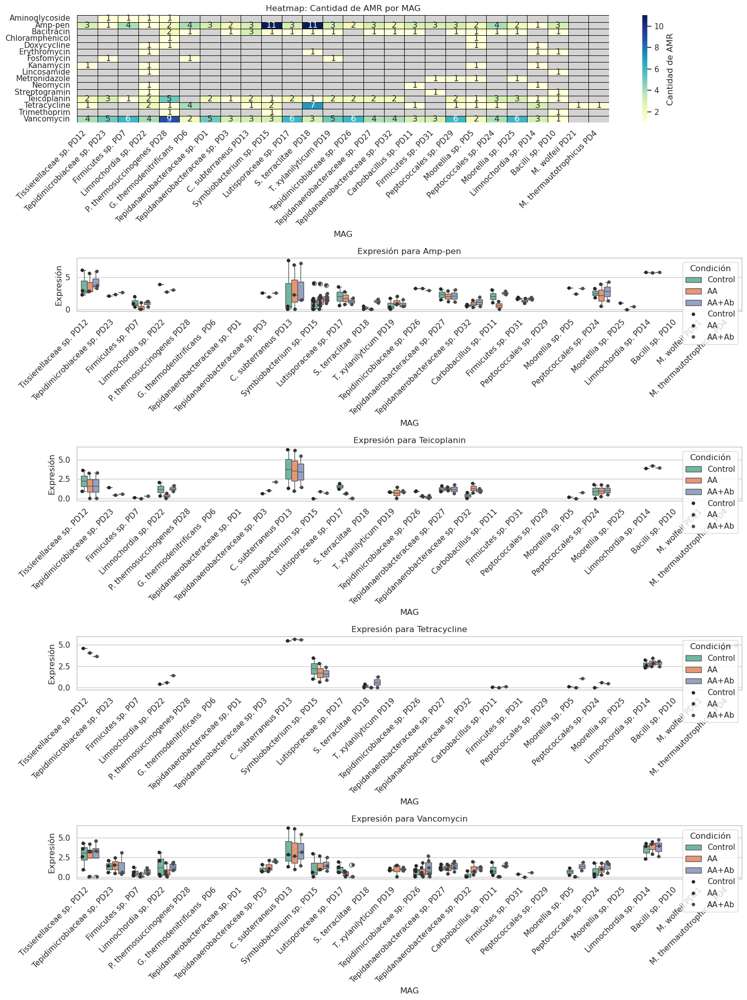

In [46]:
# Heatmap of presence
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df_heatmap = amr_df_subset.T
df_expression = amr_expression_df

# Orden de los MAGs basado en el heatmap
ordered_mags = df_heatmap.columns.tolist()

# Configuración de la figura
fig, axes = plt.subplots(5, 1, figsize=(15, 20), gridspec_kw={'height_ratios': [2, 1, 1, 1, 1]})

# 1. HEATMAP: Cantidad de AMR por MAG
mask = df_heatmap == 0  # Máscara para valores cero
cmap = sns.color_palette("YlGnBu", as_cmap=True)
cmap.set_bad(color='lightgrey')  # Color gris para ceros

sns.heatmap(df_heatmap, mask=mask, annot=True, cmap=cmap, cbar_kws={'label': 'Cantidad de AMR'},
            linewidths=0.5, linecolor='black', ax=axes[0])
axes[0].set_title('Heatmap: Cantidad de AMR por MAG')
axes[0].set_xticklabels(df_heatmap.columns, rotation=45, ha="right")
axes[0].set_xlabel('MAG')

# 2-5. BOXPLots: Expresión de AMR seleccionados
for i, amr in enumerate(for_boxplot):
    # Filtrar solo los datos para el AMR actual
    df_subset = df_expression[df_expression['AMR'] == amr]
    
    # Asegurar que 'MAG' esté en el orden correcto (categoría ordenada)
    df_subset['MAG'] = pd.Categorical(df_subset['MAG'], categories=ordered_mags, ordered=True)
    
    # Convertir a formato long para graficar tres condiciones
    df_long = df_subset.melt(id_vars='MAG', value_vars=['Control', 'AA', 'AA+Ab'],
                             var_name='Condition', value_name='Expression')
    
    # Crear el boxplot con hue para condiciones
    sns.boxplot(data=df_long, x='MAG', y='Expression', hue='Condition',
                ax=axes[i + 1], palette='Set2', width=0.7)
    sns.stripplot(data=df_long, x='MAG', y='Expression', hue='Condition',
                  dodge=True, ax=axes[i + 1], jitter=True, palette='dark:.3', size=5)
    
    axes[i + 1].set_title(f'Expresión para {amr}')
    axes[i + 1].set_ylabel('Expresión')
    axes[i + 1].set_xlabel('MAG')
    axes[i + 1].set_xticklabels(ordered_mags, rotation=45, ha="right")
    axes[i + 1].legend(title='Condición', loc='upper right')

# Ajustar el diseño
plt.tight_layout()
plt.show()



In [65]:
df_expression2 = df_expression.copy()
df_expression2['average'] = df_expression2[['Control','AA','AA+Ab']].mean(axis=1)
ordered_mags = list(df_expression2.groupby('MAG').sum().sort_values(by='average',ascending=False).index)

/tmp/ipykernel_28404/1541520147.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['MAG'] = pd.Categorical(df_subset['MAG'], categories=ordered_mags, ordered=True)
/tmp/ipykernel_28404/1541520147.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_subset['MAG'] = pd.Categorical(df_subset['MAG'], categories=ordered_mags, ordered=True)
/tmp/ipykernel_28404/1541520147.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

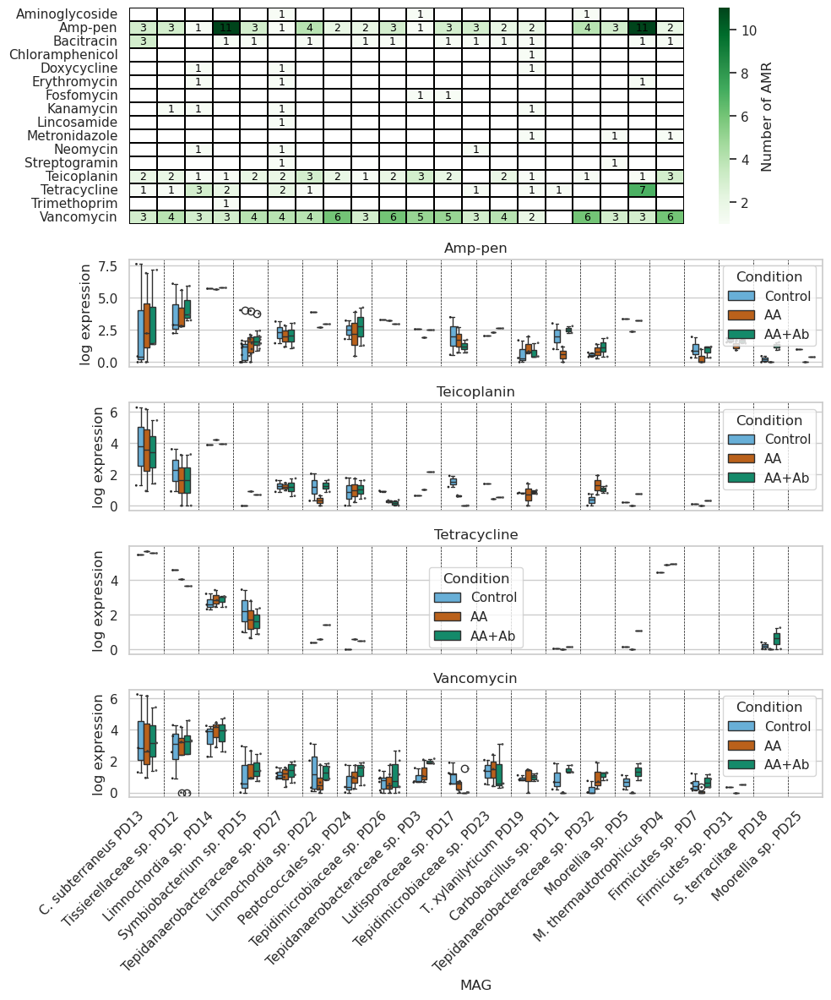

In [129]:
# Orden de los MAGs basado en el heatmap
df_heatmap = df_heatmap[ordered_mags]
# ordered_mags = df_heatmap.columns.tolist()

custom_palette = {
    'Control': '#56B4E9',
    'AA': '#D55E00',
    'AA+Ab': '#009E73',
}


# Configuración de la figura
fig, axes = plt.subplots(5, 1, figsize=(10, 12), gridspec_kw={'height_ratios': [2, 1, 1, 1, 1]})

# 1. HEATMAP: Cantidad de AMR por MAG
mask = df_heatmap == 0  # Máscara para valores cero
cmap = sns.color_palette("Greens", as_cmap=True)
cmap.set_bad(color='white')  # Color gris para ceros

# Dibujar heatmap sin que la leyenda interfiera
sns.heatmap(df_heatmap, mask=mask, annot=True, annot_kws = {"ha": 'center',"va": 'center','size':9,'color':'black'},
            cmap=cmap, cbar_kws={'label': 'Number of AMR'},
            linewidths=0.2, linecolor='black', ax=axes[0])

# Reposicionar la barra de color
axes[0].collections[0].colorbar.ax.set_position([0.92, 0.7, 0.02, 0.2])  # Posición de la leyenda (ajustar a gusto)

# Título del heatmap y ocultar eje X
axes[0].set_title('')
axes[0].set_xticks([])
axes[0].set_xlabel('')

# Añadir líneas punteadas verticales para separar MAGs
for idx in range(1, len(ordered_mags)):
    axes[0].axvline(x=idx, color='black', linestyle='--', linewidth=0.5)

# 2-5. BOXPLots: Expresión de AMR seleccionados
for i, amr in enumerate(for_boxplot):
    # Filtrar solo los datos para el AMR actual
    df_subset = df_expression[df_expression['AMR'] == amr]
    
    # Asegurar que 'MAG' esté en el orden correcto (categoría ordenada)
    df_subset['MAG'] = pd.Categorical(df_subset['MAG'], categories=ordered_mags, ordered=True)
    
    # Convertir a formato long para graficar tres condiciones
    df_long = df_subset.melt(id_vars='MAG', value_vars=['Control', 'AA', 'AA+Ab'],
                             var_name='Condition', value_name='Expression')
    
    # Crear el boxplot con hue para condiciones
    sns.boxplot(data=df_long, x='MAG', y='Expression', hue='Condition',
                ax=axes[i + 1], palette=custom_palette, width=0.5)
    sns.stripplot(data=df_long, x='MAG', y='Expression', hue='Condition',
                  dodge=True, ax=axes[i + 1], jitter=True, palette='dark:.3', size=2, legend=False)
    
    # Título del gráfico
    axes[i + 1].set_title(f'{amr}')
    axes[i + 1].set_ylabel('log expression')
    
    # Ocultar ticks del eje X excepto en el último gráfico
    if i < len(for_boxplot) - 1:
        axes[i + 1].set_xticks([])
        axes[i + 1].set_xlabel('')
    else:
        axes[i + 1].set_xticklabels(ordered_mags, rotation=45, ha="right")
        axes[i + 1].set_xlabel('MAG')
    
    # Añadir líneas punteadas para separar MAGs
    for idx in range(1, len(ordered_mags)):
        axes[i + 1].axvline(x=idx - 0.5, color='black', linestyle='--', linewidth=0.5)

# Ajustar el espacio entre gráficos
plt.subplots_adjust(hspace=0.4)

# Ajustar el diseño final
plt.tight_layout()
plt.savefig('/home/esteban/Documents/esteban/experiments/aa_ab/figures_from_code/figure_amr.svg')
plt.savefig('/home/esteban/Documents/esteban/experiments/aa_ab/figures_from_code/figure_amr.pdf')
plt.show()


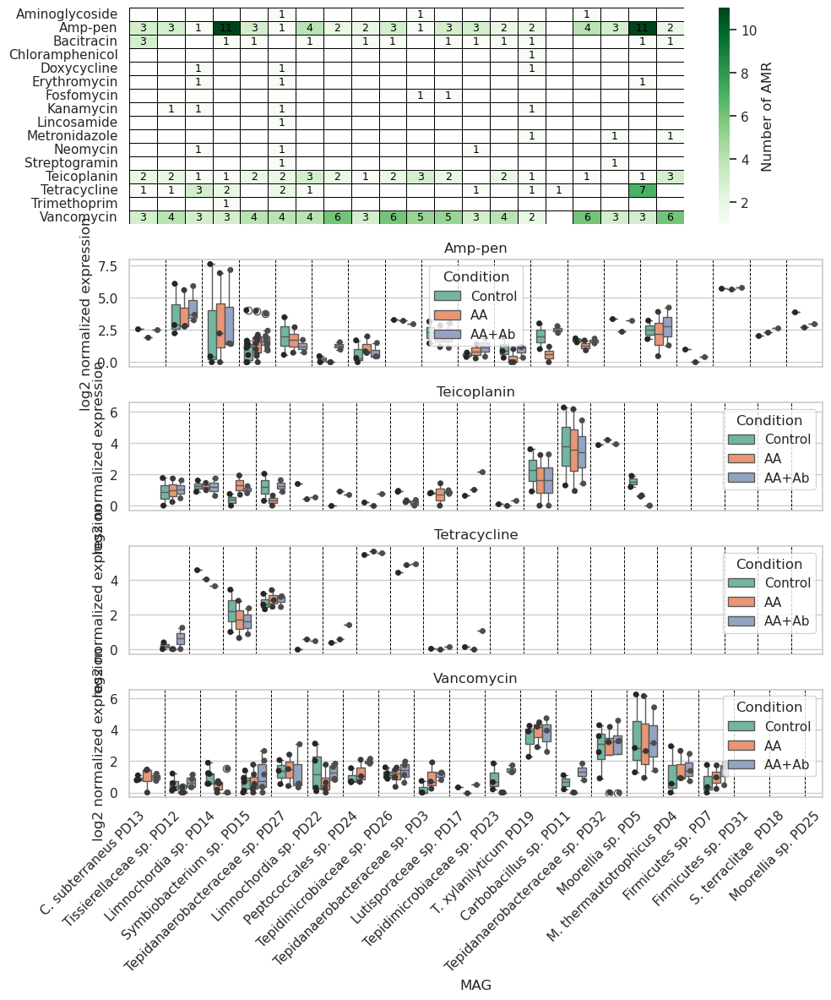

In [128]:
from matplotlib.colors import ListedColormap, BoundaryNorm
# Orden de los MAGs basado en el heatmap
ordered_mags = df_heatmap.columns.tolist()

# Configuración de la figura
fig, axes = plt.subplots(5, 1, figsize=(10, 12), gridspec_kw={'height_ratios': [2, 1, 1, 1, 1]})

# 1. HEATMAP: Cantidad de AMR por MAG
# values = df_heatmap[df_heatmap > 0].values
# cmap = ListedColormap(['white'] + plt.cm.Greens(np.linspace(0.3, 1, 256)).tolist())
# bounds = [0] + np.linspace(0.5, np.nanmax(np.hstack(values)), 257).tolist()
# norm = BoundaryNorm(bounds, cmap.N)

mask = df_heatmap == 0  # Máscara para valores cero
cmap = sns.color_palette("Greens", as_cmap=True)
cmap.set_bad(color='white')  # Color gris para ceros

# Dibujar heatmap sin que la leyenda interfiera
sns.heatmap(df_heatmap, mask=mask, annot=True, cmap=cmap, cbar_kws={'label': 'Number of AMR'},
            annot_kws = {"ha": 'center',"va": 'center','size':9,'color':'black'},
            linewidths=0.5, linecolor='black', ax=axes[0])

# Reposicionar la barra de color
axes[0].collections[0].colorbar.ax.set_position([0.92, 0.7, 0.02, 0.2])  # Posición de la leyenda (ajustar a gusto)

# Título del heatmap y ocultar eje X
axes[0].set_title('')
axes[0].set_xticks([])
axes[0].set_xlabel('')

# Añadir líneas punteadas verticales para separar MAGs
for idx in range(1, len(ordered_mags)):
    axes[0].axvline(x=idx, color='black', linestyle='--', linewidth=0.7)

# 2-5. BOXPLots: Expresión de AMR seleccionados
for i, amr in enumerate(for_boxplot):
    # Filtrar solo los datos para el AMR actual
    df_subset = df_expression[df_expression['AMR'] == amr]
    
    # Asegurar que 'MAG' esté en el orden correcto (categoría ordenada)
    df_subset.loc[:, 'MAG'] = pd.Categorical(df_subset['MAG'], categories=ordered_mags, ordered=True)
    
    # Convertir a formato long para graficar tres condiciones
    df_long = df_subset.melt(id_vars='MAG', value_vars=['Control', 'AA', 'AA+Ab'],
                             var_name='Condition', value_name='Expression')
    
    # Crear el boxplot con hue para condiciones
    sns.boxplot(data=df_long, x='MAG', y='Expression', hue='Condition',
                ax=axes[i + 1], palette='Set2', width=0.7)
    sns.stripplot(data=df_long, x='MAG', y='Expression', hue='Condition',
                  dodge=True, ax=axes[i + 1], jitter=True, palette='dark:.3', size=5, legend=False)
    
    # Título del gráfico
    axes[i + 1].set_title(f'{amr}')
    axes[i + 1].set_ylabel('log2 normalized expression')
    
    # Ocultar ticks del eje X excepto en el último gráfico
    if i < len(for_boxplot) - 1:
        axes[i + 1].set_xticks([])
        axes[i + 1].set_xlabel('')
    else:
        axes[i + 1].set_xticks(range(len(ordered_mags)))  # Establecer los ticks
        axes[i + 1].set_xticklabels(ordered_mags, rotation=45, ha="right")
        axes[i + 1].set_xlabel('MAG')
    
    # Añadir líneas punteadas para separar MAGs
    for idx in range(1, len(ordered_mags)):
        axes[i + 1].axvline(x=idx - 0.5, color='black', linestyle='--', linewidth=0.7)

# Ajustar el espacio entre gráficos
plt.subplots_adjust(hspace=0.4, right=0.9)  # Ajustar espacio para la barra de color

# Ajustar el diseño final
plt.tight_layout()
plt.show()


In [118]:
df_heatmap[df_heatmap > 0].values

array([[nan, nan, nan, nan, nan,  1., nan, nan, nan, nan,  1., nan, nan,
        nan, nan, nan,  1., nan, nan, nan],
       [ 3.,  3.,  1., 11.,  3.,  1.,  4.,  2.,  2.,  3.,  1.,  3.,  3.,
         2.,  2., nan,  4.,  3., 11.,  2.],
       [ 3., nan, nan,  1.,  1., nan,  1., nan,  1.,  1., nan,  1.,  1.,
         1.,  1., nan, nan, nan,  1.,  1.],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
        nan,  1., nan, nan, nan, nan, nan],
       [nan, nan,  1., nan, nan,  1., nan, nan, nan, nan, nan, nan, nan,
        nan,  1., nan, nan, nan, nan, nan],
       [nan, nan,  1., nan, nan,  1., nan, nan, nan, nan, nan, nan, nan,
        nan, nan, nan, nan, nan,  1., nan],
       [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,  1.,  1., nan,
        nan, nan, nan, nan, nan, nan, nan],
       [nan,  1.,  1., nan, nan,  1., nan, nan, nan, nan, nan, nan, nan,
        nan,  1., nan, nan, nan, nan, nan],
       [nan, nan, nan, nan, nan,  1., nan, nan, nan, nan, nan, n

# Finished ARG

In [195]:
import pandas as pd
import os
import numpy as np

path = '/home/esteban/Documents/esteban/experiments/aa_ab/annotation/'

columns = ['gene','saccver','pident','length','mismatch','gapopen','qstart','qend','sstart','send','evalue','bitscore']
proteindb = pd.read_csv(f'{path}proteins/blast/blast.proteindb.out',sep='\t',names=columns)
rnadb = pd.read_csv(f'{path}proteins/blast/blast.rnadb.out',sep='\t',names=columns)

eggNOGcols = ['gene','saccver','evalue','bitscore','sp','sp2','s','function','name','GO','ec','ko','maps','module','reaction',\
	'reactions','kos','transporter','cazy','modelR','name2']
eggnog = pd.read_csv(f'{path}all.annotations',sep='\t',names=eggNOGcols)

# Keep the best for proteindb and rnadb 
def keepBest(df):
	# First filtering by evalue < 1e-3 and pident > 40 and bitscore > 50
	df = df[(df['pident'] > 40.0) & (df['evalue'] < 1e-3) & (df['bitscore'] > 50)]
	df2 = pd.DataFrame(columns=df.columns)
	# assuming the first column is the one of the genes
	for gene in df.gene.unique():
		dftmp = df[df['gene'] == gene]
		if len(dftmp) > 1:
			dftmp = pd.DataFrame(dftmp.loc[dftmp.sort_values(by='pident',ascending=False).index[0]]).T
		else:
			dftmp = pd.DataFrame(dftmp)
		df2 = pd.concat([df2,dftmp])
	return df2

proteindb2 = keepBest(proteindb)
proteindb2['ARG'] = 'Y'
rnadb2 = keepBest(rnadb)
rnadb2['ARG'] = 'Y'

# Compare with Eggnog
allAnnotations = pd.concat([eggnog,proteindb2,rnadb2],ignore_index=True)
allAnnotations['KO2'] = allAnnotations['ko'].str.replace('ko:', '', regex=False)
eggnog['KO2'] = eggnog['ko'].str.replace('ko:', '', regex=False)
allAnnotations['AmpPen'] = '-'
listOfGenes = list(set(rnadb2.gene) and set(proteindb2.gene))

dfARG = pd.DataFrame(columns=allAnnotations.columns)
for gene in listOfGenes:
	# create a third dataframe to check the genes by hand
	dftmp = pd.DataFrame(allAnnotations.loc[allAnnotations[allAnnotations['gene'] == gene].sort_values(by='bitscore',ascending=False).index[0]]).T
	dfARG = pd.concat([dfARG,dftmp],ignore_index=True)


maxbin2.megahit.017_73_55
vamb.spades.222_42_28
maxbin2.spades.006_9_45
maxbin2.spades.028_209_1
vamb.spades.1056_39_50
vamb.spades.267_75_6
maxbin2.spades.028_77_4
metabat2.spades.15_1_69
vamb.spades.267_16_12
vamb.spades.1056_45_115
vamb.spades.298_395_10
vamb.spades.286_24_63
vamb.megahit.295_32_12
concoct_megahit_6_22_2
vamb.spades.812_45_23
vamb.spades.1056_29_5
metabat2.spades.7_358_2
maxbin2.spades.028_142_6
metabat2.megahit.33_69_53
maxbin2.megahit.017_61_10
vamb.spades.222_42_129
concoct_spades_11_247_2
vamb.megahit.39_9_188
vamb.spades.1056_15_22
maxbin2.spades.028_21_3
vamb.megahit.77_8_18
metabat1.spades.2_91_106
metabat2.spades.15_16_1
vamb.spades.286_73_14
vamb.megahit.488_8_539
vamb.spades.1056_8_97
maxbin2.spades.028_66_1
vamb.spades.6_10_139
maxbin2.spades.028_14_23
vamb.spades.286_24_60
vamb.spades.6_18_485
vamb.megahit.295_5_69
metabat2.spades.18_11_38
vamb.spades.222_24_1
vamb.megahit.488_14_78
metabat2.megahit.14_121_10
metabat2.megahit.24_19_251
vamb.megahit.39_49

KeyError: '[73950] not in index'

In [ ]:

amp_pen_kos_f = '/home/esteban/Documents/esteban/experiments/aa_ab/annotation/amp.pen.kos.txt'
amp_pen_kos = []
with open(amp_pen_kos_f)as f:
	for line in f:
		amp_pen_kos.append(line.strip())

for ko in amp_pen_kos:
	dftmp = eggnog[eggnog['KO2'] == ko]
	for gene in dftmp.gene:
		if gene not in dfARG.gene:
			idx = allAnnotations[allAnnotations['gene'] == gene].index
			geneToAdd = pd.DataFrame(eggnog.loc[idx])
			dfARG = pd.concat([dfARG,geneToAdd])
			dfARG.loc[idx,'AmpPen'] = 'Y'
		else:
			idxs = allAnnotations[allAnnotations['gene'] == gene].index
			for idx in idxs:
				dfARG.loc[idx,'AmpPen'] = 'Y'

In [197]:
# pd.DataFrame(eggnog.loc[idx])
# eggnog[eggnog['gene']==gene]
# allAnnotations[allAnnotations['gene'] == gene]
gene = 'maxbin2.megahit.017_73_55'
pd.DataFrame(allAnnotations.loc[allAnnotations[allAnnotations['gene'] == gene].sort_values(by='bitscore',ascending=False).index[0]]).T

,gene,saccver,evalue,bitscore,sp,sp2,s,function,name,GO,...,length,mismatch,gapopen,qstart,qend,sstart,send,ARG,KO2,AmpPen
5543,maxbin2.megahit.017_73_55,697303.Thewi_0324,0.0,689.0,"COG3829@1|root,COG3829@2|Bacteria,1TP0E@1239|F...",186801|Clostridia,KT,"Sigma54 specific transcriptional regulator, Fi...",-,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-,-


In [164]:
dfARG.to_clipboard()

In [61]:
import pandas as pd
path = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/'
globalDifferential = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/raw_results/all_results.csv', index_col=0)
resistanceGenes = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/resistance/genes.resistance.tsv', sep='\t',index_col=0,names=['KO'])
abResistance = globalDifferential[globalDifferential.index.isin(resistanceGenes.index)]

In [62]:
abResistance.to_clipboard()

In [104]:
# Incluir los resultados de amrfinder
import pandas as pd
df = pd.read_clipboard(sep='\t',index_col=0)

In [105]:
import numpy as np
amr = pd.read_csv('/home/esteban/bin/amr/all.proteins.amr.out',sep='\t',index_col=0)
abs = []
for i in amr.index:
	if i not in df.index:
		id = amr.loc[i,'% Identity to reference']
		ab = amr.loc[i,'Subclass']
		if type(ab) == str:
			df.loc[i,'flag'] = ab
			df.loc[i,'pident'] = id	
		else:
			df.loc[i,'flag'] = ab.values[0]
			df.loc[i,'pident'] = id.values.max()

	else:
		ab = df.loc[i,'flag']
		abs.append(ab)
		if pd.isnull(ab):
			id = amr.loc[i,'% Identity to reference']
			ab = amr.loc[i,'Subclass']
			if type(ab) == str:
				df.loc[i,'flag'] = ab
				df.loc[i,'pident'] = id
			else:
				df.loc[i,'flag'] = ab.values[0]
				df.loc[i,'pident'] = id.values.max()

In [106]:
df.to_clipboard()

In [107]:
# Ahora armo una tabla para hacer los graficos y la explicacion
names = {}
with open('/home/esteban/Documents/esteban/experiments/aa_ab/tables/names.list.final.short.tsv')as f:
	for line in f:
		old,new = line.split("\t")
		new = new.strip()
		names[old] = new

for i in df.index:
	mag = "_".join(i.split("_")[:-2])
	if mag in names.keys():
		df.loc[i,'MAG'] = names[mag]
	else:
		df.loc[i,'MAG'] = mag

/tmp/ipykernel_18358/405804339.py:12: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'S. terraclitae  PD18' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.loc[i,'MAG'] = names[mag]


In [108]:
df.to_clipboard()

In [109]:
df.reset_index(inplace=True)

In [110]:
# replace the names of the antibiotics
df['AMR'] = ''
for i in df.itertuples():
	amr = i[33]
	if pd.isnull(amr) == False:
		if ';' in amr :
			amrs = amr.split(";")
			first = True
			for amr in amrs:
				amr = amr.lower()
				amr = amr.replace(" ","")
				if first == True:
					idx = i[0]
					first = False
				else:
					idx = len(df)
				ii = list(i[1:])
				df.loc[idx] = ii
				df.loc[idx,'AMR'] = amr
		elif "/" in amr:
			amrs = amr.split("/")
			first = True
			for amr in amrs:
				amr = amr.lower()
				amr = amr.replace(" ","")
				if first == True:
					idx = i[0]
					first = False
				else:
					idx = len(df)
				ii = list(i[1:])
				df.loc[idx] = ii
				df.loc[idx,'AMR'] = amr
		else:
			amr = amr.lower()
			amr = amr.replace(" ","")
			idx = i[0]
			df.loc[idx,'AMR'] = amr

In [ ]:
df.to_clipboard()
# df.to_csv("amr.genes.tsv",sep='\t')

In [112]:
# Contar para cada MAG el tipo de amr
amrPD = pd.DataFrame(index=df.MAG.unique(),columns=df.AMR.unique())
for mag in df.MAG.unique():
	dftmp = df[df['MAG'] == mag]
	dftmp = dftmp[~dftmp['AMR'].isnull()]
	for i in dftmp.groupby('AMR').count().itertuples():
		amrPD.loc[mag,i[0]] = i[1]


In [113]:
amrPD.to_clipboard()

In [ ]:
diff = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/differential_analysis.tsv',index_col=0)
# Quienes están expresados diferencialmente?

# Graph the results
dftmp = df[df['MAG'] =='Limnochordia sp. PD14']
dftmp[dftmp['AMR'] == 'amp-pen'].gene

530    metabat2.spades.18_5_16
Name: gene, dtype: object

In [ ]:
diff2 = diff[(np.abs(diff['log2FoldChange']) > 1.0) & (diff['pvalue'] < 0.01)]

genesWithARG = list(df[~df['flag'].isnull()].gene.unique())
diff2[diff2.index.isin(genesWithARG)]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,MAG,Condition
maxbin2.spades.006_39_2,7801.785966,3.862243,0.760724,5.077059,3.833224e-07,0.000884,Moorellia_sp._UNIPD5,AA-AAAb
metabat2.spades.15_12_46,422.865140,-1.175660,0.407637,-2.884084,3.925543e-03,0.028244,Caldanaerobacter_subterraneus_UNIPD13,AAAb-ctrl
maxbin2.spades.006_39_1,2.052292,5.181703,1.985709,2.609497,9.067538e-03,0.424701,Moorellia_sp._UNIPD5,AA-ctrl
maxbin2.spades.006_39_2,7801.785966,4.115722,0.680784,6.045558,1.488939e-09,0.000003,Moorellia_sp._UNIPD5,AA-ctrl
metabat2.spades.15_26_4,4.098014,3.598212,1.328468,2.708542,6.757961e-03,0.033833,Caldanaerobacter_subterraneus_UNIPD13,AA-ctrl
metabat2.spades.15_43_2,37.537560,-1.401577,0.399278,-3.510276,4.476412e-04,0.004445,Caldanaerobacter_subterraneus_UNIPD13,AA-ctrl
metabat2.spades.15_6_94,1405.628628,-1.014839,0.258324,-3.928557,8.545724e-05,0.001187,Caldanaerobacter_subterraneus_UNIPD13,AA-ctrl


In [137]:
globalDifferential = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/raw_results/all_results.csv', index_col=0)
globalDifferential2 = globalDifferential[globalDifferential['pvalue'] <= 0.05]
globalDifferential2[globalDifferential2.index.isin(genesWithARG)]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,MAG,Condition
maxbin2.spades.006_39_1,2.052292,4.806527,2.273168,2.114462,3.447582e-02,1.000000,Moorellia_sp._UNIPD5,AA-AAAb
maxbin2.spades.006_39_2,7801.785966,3.862243,0.760724,5.077059,3.833224e-07,0.000884,Moorellia_sp._UNIPD5,AA-AAAb
vamb.spades.108_11_17,3.325718,-3.739811,1.683681,-2.221211,2.633667e-02,1.000000,Peptococcales_sp._UNIPD24,AA-ctrl
vamb.spades.222_47_54,5.927491,2.093284,1.035607,2.021311,4.324758e-02,NaN,Tepidimicrobiaceae_sp._UNIPD26,AAAb-ctrl
metabat2.spades.15_12_46,422.865140,-1.175660,0.407637,-2.884084,3.925543e-03,0.028244,Caldanaerobacter_subterraneus_UNIPD13,AAAb-ctrl
metabat2.spades.15_24_18,78.187390,-0.981962,0.437624,-2.243850,2.484206e-02,0.102252,Caldanaerobacter_subterraneus_UNIPD13,AAAb-ctrl
metabat2.spades.15_43_2,37.537560,-1.052549,0.463036,-2.273146,2.301739e-02,0.097318,Caldanaerobacter_subterraneus_UNIPD13,AAAb-ctrl
metabat2.spades.15_6_94,1405.628628,-0.640980,0.289348,-2.215258,2.674237e-02,0.107662,Caldanaerobacter_subterraneus_UNIPD13,AAAb-ctrl
metabat2.spades.25_5_93,18.945649,-1.811198,0.783993,-2.310221,2.087590e-02,0.231991,Symbiobacterium_sp._UNIPD15,AAAb-ctrl
metabat2.spades.25_9_43,3.516190,3.973037,1.625606,2.444034,1.452405e-02,NaN,Symbiobacterium_sp._UNIPD15,AAAb-ctrl


In [148]:
# Quienes tienen sentido?
gb = globalDifferential2[globalDifferential2.index.isin(genesWithARG)]
aaab = ['AA-AAAb','AAAb-ctrl']
gb2 = gb[gb['Condition'] == aaab[0]]
df[df.gene.isin(list(gb2[gb2['log2FoldChange'] < 0].index))]

,gene,saccver,evalue,bitscore,cog,sp2,s,function,name,GO,...,qstart,qend,sstart,send,ARG,KO2,AmpPen,flag,MAG,AMR
64,metabat2.megahit.33_49_5,1121289.JHVL01000033_gene2678,4.210000e-100,299.0,"COG0791@1|root,COG2367@1|root,COG0791@2|Bacter...",186801|Clostridia,M,NlpC/P60 family,-,-,...,NaN,NaN,NaN,NaN,NaN,K17836,Y,Amp-Pen,Tissierellaceae sp. PD12,amp-pen
284,vamb.megahit.295_90_52,350688.Clos_0680,7.740000e-85,261.0,"COG1876@1|root,COG1876@2|Bacteria,1V1F7@1239|F...",186801|Clostridia,M,"PFAM peptidase M15B and M15C, D,D-carboxypepti...",-,-,...,NaN,NaN,NaN,NaN,NaN,K07260,-,vancomycin,Lutisporaceae sp. PD17,vancomycin


In [150]:
gb2 = gb[gb['Condition'] == aaab[1]]
df[df.gene.isin(list(gb2[gb2['log2FoldChange'] > 0].index))]

,gene,saccver,evalue,bitscore,cog,sp2,s,function,name,GO,...,qstart,qend,sstart,send,ARG,KO2,AmpPen,flag,MAG,AMR
64,metabat2.megahit.33_49_5,1121289.JHVL01000033_gene2678,4.210000e-100,299.0,"COG0791@1|root,COG2367@1|root,COG0791@2|Bacter...",186801|Clostridia,M,NlpC/P60 family,-,-,...,NaN,NaN,NaN,NaN,NaN,K17836,Y,Amp-Pen,Tissierellaceae sp. PD12,amp-pen
70,metabat2.spades.25_9_43,292459.STH2432,5.230000e-156,444.0,"COG2367@1|root,COG2367@2|Bacteria,1UYZ3@1239|F...",186801|Clostridia,V,beta-lactamase,-,-,...,NaN,NaN,NaN,NaN,NaN,K17836,Y,Amp-Pen,Symbiobacterium sp. PD15,amp-pen
291,metabat2.megahit.33_14_46,1304874.JAFY01000002_gene131,9.670000e-129,374.0,"COG2367@1|root,COG2367@2|Bacteria,3TBTC@508458...",2|Bacteria,V,Beta-lactamase enzyme family,-,-,...,NaN,NaN,NaN,NaN,NaN,"K07258,K17836",Y,Amp-Pen,Tissierellaceae sp. PD12,amp-pen
1670,vamb.spades.1_7_186,768706.Desor_3777,0.000000e+00,867.0,"COG2274@1|root,COG2274@2|Bacteria,1TRMR@1239|F...",186801|Clostridia,P,"NHLM bacteriocin system ABC transporter, ATP-b...",-,-,...,NaN,NaN,NaN,NaN,NaN,-,-,novobiocin,Limnochordia sp. PD22,novobiocin
2017,vamb.spades.1_23_39,tet(Q),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tetracycline; doxycycline; minocycline; chlort...,Limnochordia sp. PD22,tetracycline
2029,metabat2.megahit.33_11_1,vanY gene in vanB cluster,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,vancomycin,Tissierellaceae sp. PD12,vancomycin
2047,vamb.spades.222_47_54,vanT gene in vanG cluster,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,vancomycin,Tepidimicrobiaceae sp. PD26,vancomycin
2158,vamb.spades.1_23_39,tet(Q),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tetracycline; doxycycline; minocycline; chlort...,Limnochordia sp. PD22,doxycycline
2159,vamb.spades.1_23_39,tet(Q),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tetracycline; doxycycline; minocycline; chlort...,Limnochordia sp. PD22,minocycline
2160,vamb.spades.1_23_39,tet(Q),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,tetracycline; doxycycline; minocycline; chlort...,Limnochordia sp. PD22,chlortetracycline


In [63]:
globalDifferential2 = globalDifferential[globalDifferential['pvalue'] <= 0.01]
genesAAAb = globalDifferential2[(globalDifferential2['Condition'] == 'AAAb-ctrl') & (globalDifferential2['log2FoldChange'] > 1.0)].index
genesAAAb2 = globalDifferential2[(globalDifferential2['Condition'] == 'AA-AAAb') & (globalDifferential2['log2FoldChange'] < -1.0)].index
print(len(genesAAAb),len(genesAAAb2), len(set(genesAAAb) & set(genesAAAb2)))

621 265 121


In [56]:
genesInAAAb = list(set(genesAAAb) & set(genesAAAb2))

In [119]:
diff = pd.read_csv('~/Documents/esteban/experiments/aa_ab/differential_expression/aa_ab_control_differential_expression.csv', sep='\t')
# diff[diff['gene'].isin(genesInAAAb)].to_clipboard()

In [120]:
diff[diff['gene'].isin(genesInAAAb)]['MAG'].value_counts()

NameError: name 'genesInAAAb' is not defined

In [ ]:
diff = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/differential_analysis.tsv',index_col=0)
# Quienes están expresados diferencialmente?

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,MAG,Condition
metabat2.spades.18_5_16,295.224235,-0.113274,0.518967,-0.218268,0.827220,0.998174,Limnochordia_sp._UNIPD14,AA-AAAb
metabat2.spades.18_5_16,295.224235,-0.120146,0.469351,-0.255984,0.797963,0.987667,Limnochordia_sp._UNIPD14,AA-ctrl
metabat2.spades.18_5_16,295.224235,-0.006873,0.521597,-0.013176,0.989487,1.000000,Limnochordia_sp._UNIPD14,AAAb-ctrl


In [84]:
dfRGI = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/annotation/proteins/rgi.output/rgi/vamb.megahit.77.out.txt',sep='\t')
dfRGI2 = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/annotation/proteins/rgi.output/tmpOut.txt',sep='\t')
# dfRGI2[(dfRGI2['Percentage Length of Reference Sequence'] > 90) & (dfRGI2['Percentage Length of Reference Sequence'] < 110) & (dfRGI2['Best_Identities'] > 50)]
dfRGI2['Bit_Diff'] = dfRGI2['Best_Hit_Bitscore'] - dfRGI2['Pass_Bitscore']
dfRGI2[dfRGI2['Bit_Diff'] > 0]

,ORF_ID,Contig,Start,Stop,Orientation,Cut_Off,Pass_Bitscore,Best_Hit_Bitscore,Best_Hit_ARO,Best_Identities,...,CARD_Protein_Sequence,Percentage Length of Reference Sequence,ID,Model_ID,Nudged,Note,Hit_Start,Hit_End,Antibiotic,Bit_Diff
301,vamb.megahit.77_5_45,NaN,NaN,NaN,NaN,Strict,50,159.8440,vanW gene in vanI cluster,28.49,...,MLRRKPWVFLLVILFSQLSLSILLGATVTYGAGYAKAPEGLTVWEK...,123.59,gnl|BL_ORD_ID|4740|hsp_num:0,2242,NaN,NaN,NaN,NaN,vancomycin; teicoplanin,109.8440
331,vamb.megahit.77_8_8,NaN,NaN,NaN,NaN,Strict,50,138.2720,vanW gene in vanI cluster,31.27,...,MLRRKPWVFLLVILFSQLSLSILLGATVTYGAGYAKAPEGLTVWEK...,151.74,gnl|BL_ORD_ID|4740|hsp_num:0,2242,NaN,NaN,NaN,NaN,vancomycin; teicoplanin,88.2720
437,vamb.megahit.77_10_101,NaN,NaN,NaN,NaN,Strict,250,293.5080,vanG,43.67,...,MQNKKIAVIFGGNSTEYEVSLQSASAVFENINTNKFDIIPIGITRS...,109.17,gnl|BL_ORD_ID|1068|hsp_num:0,1157,NaN,NaN,NaN,NaN,vancomycin,43.5080
1155,vamb.megahit.77_27_79,NaN,NaN,NaN,NaN,Strict,200,209.9200,vanX gene in vanP cluster,51.01,...,MKSEFVYLDEVIPGVRWDAKYATWDNFMGMPVNGYQVNRVVGTVEM...,118.81,gnl|BL_ORD_ID|4812|hsp_num:0,5806,NaN,NaN,NaN,NaN,vancomycin; teicoplanin,9.9200
1550,vamb.megahit.77_39_65,NaN,NaN,NaN,NaN,Strict,175,271.5520,vanT gene in vanG cluster,41.13,...,MTKNESYSGIDYFRFIAALLIVAIHTSPLSSFSETGNFIFTRIVAR...,54.63,gnl|BL_ORD_ID|1520|hsp_num:0,1561,NaN,NaN,NaN,NaN,vancomycin,96.5520
1993,vamb.megahit.77_57_46,NaN,NaN,NaN,NaN,Strict,50,130.5680,vanW gene in vanI cluster,36.64,...,MLRRKPWVFLLVILFSQLSLSILLGATVTYGAGYAKAPEGLTVWEK...,77.48,gnl|BL_ORD_ID|4740|hsp_num:0,2242,NaN,NaN,NaN,NaN,vancomycin; teicoplanin,80.5680
2447,vamb.megahit.77_76_2,NaN,NaN,NaN,NaN,Strict,50,92.8189,vanW gene in vanI cluster,23.40,...,MLRRKPWVFLLVILFSQLSLSILLGATVTYGAGYAKAPEGLTVWEK...,119.30,gnl|BL_ORD_ID|4740|hsp_num:0,2242,NaN,NaN,NaN,NaN,vancomycin; teicoplanin,42.8189


In [59]:
# Penicillin binding proteins
import pandas as pd
path = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/'
globalDifferential = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/raw_results/all_results.csv', index_col=0)
pbp = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/resistance/penicillin_binding_proteins.tsv', sep='\t',index_col=0,names=['KO'])
pbpDiff = globalDifferential[globalDifferential.index.isin(pbp.index)]
pbpDiff.to_clipboard()

#### __Graph Differential genes__

In [84]:
import seaborn as sns
import pandas as pd
import numpy as np

# I modified by hand to get only one name in metabolism name
# path = '/data3/Documents/esteban/experiments/aa_ab/differential_expression/'
# aa_control = pd.read_csv(f'{path}aa_control_differential_expression.tsv')
diff = pd.read_csv('~/Documents/esteban/experiments/aa_ab/differential_expression/aa_ab_control_differential_expression.csv', sep='\t')

In [85]:
aaab_diff = diff[diff['Condition'] == 'AAAb']
aaab_diff2 = aaab_diff[aaab_diff['pvalue'] <= 0.01 ]
print (len(aaab_diff2[aaab_diff2['log2FoldChange'] < 0]),len(aaab_diff2[aaab_diff2['log2FoldChange'] > 0]))

356 472


In [86]:
from matplotlib import pyplot as plt
from matplotlib.tri import Triangulation
import numpy as np

def create_demo_data(M, N):
    # create some demo data for North, East, South, West
    # note that each of the 4 arrays can be either 2D (N by M) or 1D (N*M)
    # M columns and N rows
    valuesN = np.repeat(np.abs(np.sin(np.arange(N))), M)
    valuesE = np.arange(M * N) / (N * M)
    valuesS = np.random.uniform(0, 1, (N, M))
    valuesW = np.random.uniform(0, 1, (N, M))
    return [valuesN, valuesE, valuesS, valuesW]

def triangulation_for_triheatmap(M, N):
    xv, yv = np.meshgrid(np.arange(-0.5, M), np.arange(-0.5, N))  # vertices of the little squares
    xc, yc = np.meshgrid(np.arange(0, M), np.arange(0, N))  # centers of the little squares
    x = np.concatenate([xv.ravel(), xc.ravel()])
    y = np.concatenate([yv.ravel(), yc.ravel()])
    cstart = (M + 1) * (N + 1)  # indices of the centers

    trianglesN = [(i + j * (M + 1), i + 1 + j * (M + 1), cstart + i + j * M)
                  for j in range(N) for i in range(M)]
    trianglesE = [(i + 1 + j * (M + 1), i + 1 + (j + 1) * (M + 1), cstart + i + j * M)
                  for j in range(N) for i in range(M)]
    trianglesS = [(i + 1 + (j + 1) * (M + 1), i + (j + 1) * (M + 1), cstart + i + j * M)
                  for j in range(N) for i in range(M)]
    trianglesW = [(i + (j + 1) * (M + 1), i + j * (M + 1), cstart + i + j * M)
                  for j in range(N) for i in range(M)]
    return [Triangulation(x, y, triangles) for triangles in [trianglesN, trianglesE, trianglesS, trianglesW]]

#### _examples

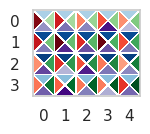

In [87]:
M, N = 5, 4  # e.g. 5 columns, 4 rows
values = create_demo_data(M, N)
triangul = triangulation_for_triheatmap(M, N)
cmaps = ['Blues', 'Greens', 'Purples', 'Reds']  # ['winter', 'spring', 'summer', 'autumn']
norms = [plt.Normalize(-0.5, 1) for _ in range(4)]
fig, ax = plt.subplots()
imgs = [ax.tripcolor(t, np.ravel(val), cmap=cmap, norm=norm, ec='white')
        for t, val, cmap, norm in zip(triangul, values, cmaps, norms)]

ax.set_xticks(range(M))
ax.set_yticks(range(N))
ax.invert_yaxis()
ax.margins(x=0, y=0)
ax.set_aspect('equal', 'box')  # square cells
plt.tight_layout()
plt.show()

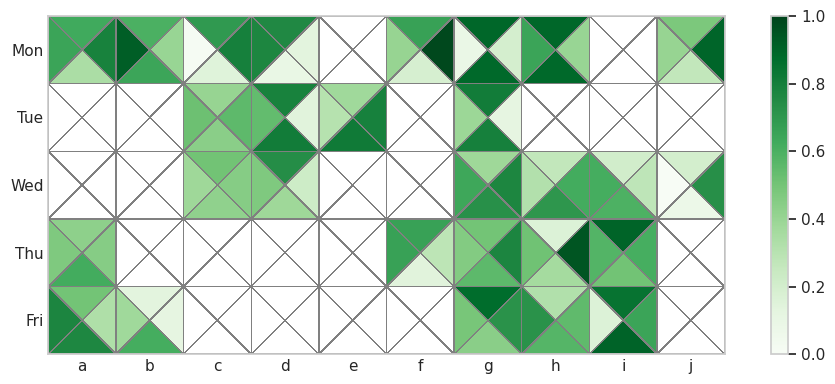

In [88]:
import pandas as pd

days = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri']
df = pd.DataFrame({'cols': np.random.choice([*'abcdefghij'], 40),
                   'rows': np.random.choice(days, 40),
                   'north': np.random.rand(40),
                   'east': np.random.rand(40),
                   'south': np.random.rand(40),
                   'west': np.random.rand(40)})
df['rows'] = pd.Categorical(df['rows'], categories=days)  # fix an ordering
df_piv = df.pivot_table(index='rows', columns='cols')
M = len(df_piv.columns) // 4
N = len(df_piv)
values = [df_piv[dir] for dir in
          ['north', 'east', 'south', 'west']]  # these are the 4 column names in df

triangul = triangulation_for_triheatmap(M, N)
cmaps = ['Greens'] * 4
norms = [plt.Normalize(0, 1) for _ in range(4)]
fig, ax = plt.subplots(figsize=(10, 4))
imgs = [ax.tripcolor(t, np.ravel(val), cmap=cmap, norm=norm, ec='grey')
        for t, val, cmap, norm in zip(triangul, values, cmaps, norms)]

ax.tick_params(length=0)
ax.set_xticks(range(M))
ax.set_xticklabels(df_piv['north'].columns)
ax.set_yticks(range(N))
ax.set_yticklabels(df_piv.index)
ax.invert_yaxis()
ax.margins(x=0, y=0)
ax.set_aspect('equal', 'box')  # square cells
plt.colorbar(imgs[0], ax=ax)
plt.tight_layout()
plt.show()

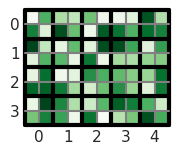

In [89]:
from matplotlib import pyplot as plt
import numpy as np

M, N = 5, 4
values = np.random.uniform(0, 100, (N * 2, M * 2))

fig, ax = plt.subplots()
ax.imshow(values, extent=[-0.5, M - 0.5, N - 0.5, -0.5], cmap='Greens')

ax.set_xticks(np.arange(0, M))
ax.set_xticks(np.arange(-0.5, M), minor=True)
ax.set_yticks(np.arange(0, N))
ax.set_yticks(np.arange(-0.5, N), minor=True)
ax.grid(which='minor', lw=3, color='black', clip_on=False)
ax.grid(which='major', lw=1.5, color='grey', clip_on=False)
ax.tick_params(length=0)
for s in ax.spines:
    ax.spines[s].set_visible(False)
plt.show()

#### _Graphs

In [131]:
discarded = []
for mag in diff.MAG.unique():
    dftmp = diff[diff['MAG'] == mag]
    if len(dftmp) < 2:
        discarded.append(mag)
print (discarded)

['Tepidimicrobiaceae_sp._UNIPD23', 'Tepidanaerobacteraceae_sp._UNIPD32']


In [132]:
df2 = pd.DataFrame(columns=['pwy','MAG','c1','c2','aa','aaab'])
for i in diff.itertuples():
    cond = i[18]
    l2 = i[3]
    pwy = i[9]
    mag = i[17]
    if pwy != '' and type(pwy) != float and mag not in discarded:
        if len(df2[(df2['pwy'] == pwy) & (df2['MAG'] == mag)]) == 0:
            index = len(df2)
            # Capitalize the pwy
            pwy = pwy.capitalize()
            df2.loc[index,'pwy'] = pwy
            df2.loc[index,'MAG'] = mag
            df2 = df2.fillna(int(0))
        else:
            index = df2[(df2['pwy'] == pwy) & (df2['MAG'] == mag)].index[0]
        if cond == 'AA':
            if l2 > 0:
                df2.loc[index,'aa'] += 1
            else:
                df2.loc[index,'c1'] += 1
        elif cond == 'AAAb':
            if l2 > 0:
                df2.loc[index,'aaab'] += 1
            else:
                df2.loc[index,'c2'] += 1
# df2.replace(0,np.nan,inplace=True)
df2.head()

,pwy,MAG,c1,c2,aa,aaab
0,Transporters,Methanothermobacter_thermautotrophicus_UNIPD4,10.0,4.0,8.0,4.0
1,Carbohydrate,Tepidanaerobacteraceae_sp._UNIPD3,0.0,2.0,0.0,2.0
2,Carbohydrate,Tepidanaerobacteraceae_sp._UNIPD27,0.0,0.0,4.0,3.0
3,Transporters,Caldanaerobacter_subterraneus_UNIPD13,18.0,23.0,23.0,22.0
4,Transporters,Tepidanaerobacteraceae_sp._UNIPD3,0.0,4.0,0.0,2.0


/tmp/ipykernel_28404/3595780846.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v.replace(0,np.nan,inplace=True)


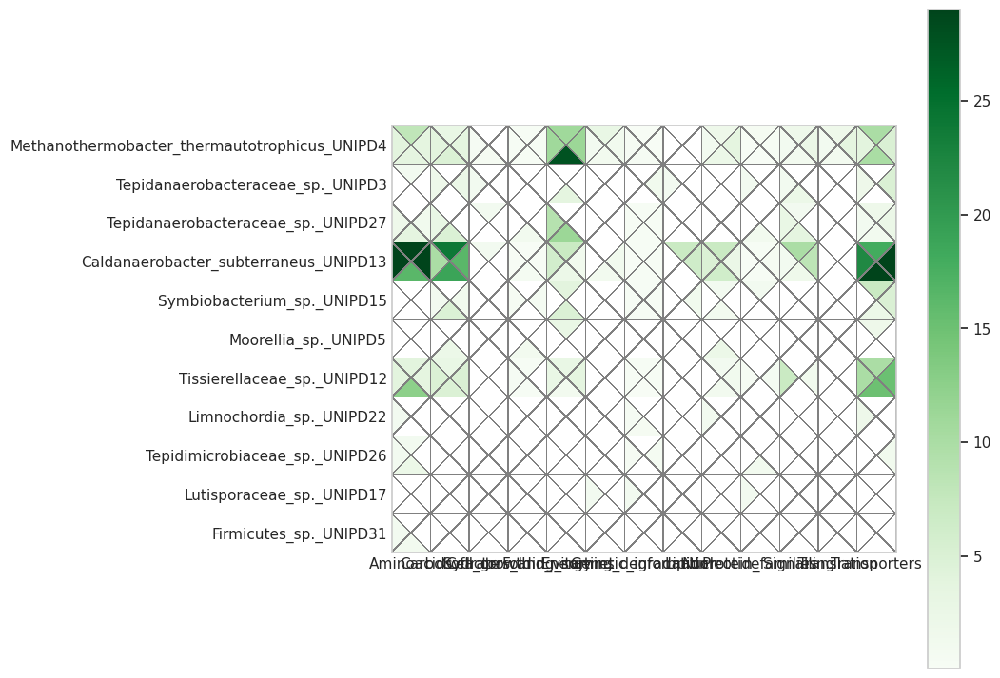

In [133]:
savepath = '/home/esteban/Documents/esteban/experiments/aa_ab/figures_from_code/'
mags = df2['MAG'].unique()
df2['MAG'] = pd.Categorical(df2['MAG'],categories=mags)  # fix an ordering
df_piv = df2.pivot_table(index='MAG', columns='pwy')
M = len(df_piv.columns) // 4
N = len(df_piv)
values = [df_piv[dir] for dir in
          ['c1', 'c2', 'aa', 'aaab']]  # these are the 4 column names in df

values2 = []
for v in values:
    if type(v) != float:
        v.replace(0,np.nan,inplace=True)
        values2.append(v)
values = values2
triangul = triangulation_for_triheatmap(M, N)
cmaps = ['Greens'] * 4
# norms = [plt.Normalize(0, 1) for _ in range(4)]
fig, ax = plt.subplots(figsize=(11, 7.5))
imgs = [ax.tripcolor(t, np.ravel(val), cmap=cmap, ec='grey')
        for t, val, cmap, norm in zip(triangul, values, cmaps, norms)]

ax.tick_params(length=0)
ax.set_xticks(range(M))
ax.set_xticklabels(df_piv['c1'].columns)
ax.set_yticks(range(N))
ax.set_yticklabels(df_piv.index)
ax.invert_yaxis()
ax.margins(x=0, y=0)
ax.set_aspect('equal', 'box')  # square cells

plt.colorbar(imgs[0], ax=ax)
plt.tight_layout()
plt.savefig('{savepath}differential_expression.svg')
plt.savefig('{savepath}differential_expression.pdf')
plt.show()

/tmp/ipykernel_28404/1890412606.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v.replace(0, np.nan, inplace=True)


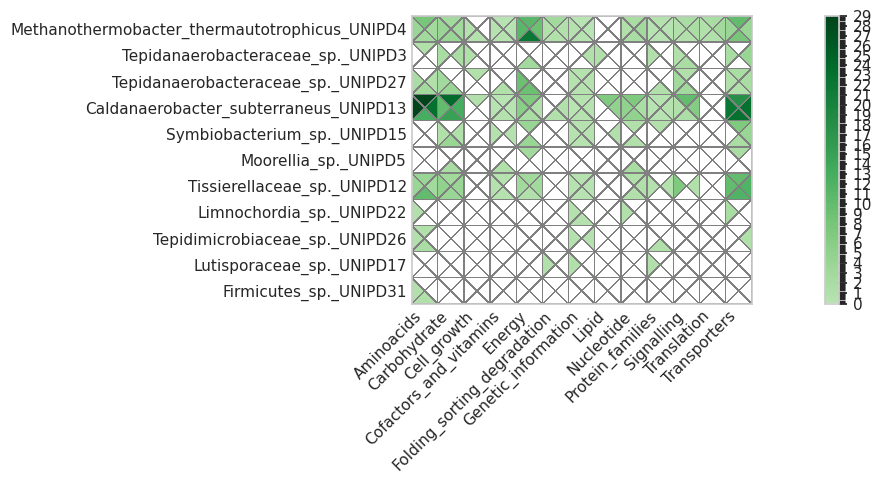

In [134]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.colors import ListedColormap, BoundaryNorm

savepath = '/home/esteban/Documents/esteban/experiments/aa_ab/figures_from_code/'
mags = df2['MAG'].unique()
df2['MAG'] = pd.Categorical(df2['MAG'], categories=mags)  # fix an ordering
df_piv = df2.pivot_table(index='MAG', columns='pwy')
M = len(df_piv.columns) // 4
N = len(df_piv)
values = [df_piv[dir] for dir in ['c1', 'c2', 'aa', 'aaab']]  # the 4 column names in df

values2 = []
for v in values:
    if type(v) != float:
        v.replace(0, np.nan, inplace=True)
        values2.append(v)
values = values2
triangul = triangulation_for_triheatmap(M, N)

# Custom colormap: white for zero, greens for 1 to max
cmap = ListedColormap(['white'] + plt.cm.Greens(np.linspace(0.3, 1, 256)).tolist())
bounds = [0] + np.linspace(0.00001, np.nanmax(np.hstack(values)), 257).tolist()
norm = BoundaryNorm(bounds, cmap.N)

fig, ax = plt.subplots(figsize=(15, 5))
imgs = [
    ax.tripcolor(
        t, np.ravel(val), cmap=cmap, norm=norm, ec='grey'
    ) for t, val in zip(triangul, values)
]

# Format x-axis labels at 45 degrees
ax.tick_params(length=0)
ax.set_xticks(range(M))
ax.set_xticklabels(df_piv['c1'].columns, rotation=45, ha='right')
ax.set_yticks(range(N))
ax.set_yticklabels(df_piv.index)
ax.invert_yaxis()
ax.margins(x=0, y=0)
ax.set_aspect('equal', 'box')  # square cells

# Add colorbar with integer ticks
cbar = plt.colorbar(imgs[0], ax=ax)
max_val = int(np.nanmax(np.hstack(values)))
cbar.set_ticks(range(0, max_val + 1))
cbar.set_ticklabels(range(0, max_val + 1))

plt.tight_layout()
plt.savefig(f'{savepath}differential_expression.svg')
plt.savefig(f'{savepath}differential_expression.pdf')
plt.show()


In [135]:
aa = diff[diff['PWY'] == 'Aminoacids']

def zero_to_nan(values):
    """Replace every 0 with 'nan' and return a copy."""
    return [float('nan') if x==0 else x for x in values]
values2 = []
for v in values:
    if type(v) != float:
        v.replace(0,np.nan,inplace=True)
        values2.append(v)

/tmp/ipykernel_28404/4032737255.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v.replace(0,np.nan,inplace=True)


TypeError: Image data of dtype object cannot be converted to float

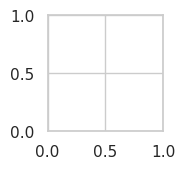

In [136]:
from matplotlib import pyplot as plt
import numpy as np

M, N = len(df2.pwy.unique()), len(df2.MAG.unique())
values = df2.values

fig, ax = plt.subplots()
ax.imshow(values, extent=[-0.5, M - 0.5, N - 0.5, -0.5], cmap='OrRd')

ax.set_xticks(np.arange(0, M))
ax.set_xticks(np.arange(-0.5, M), minor=True)
ax.set_yticks(np.arange(0, N))
ax.set_yticks(np.arange(-0.5, N), minor=True)
ax.grid(which='minor', lw=3, color='black', clip_on=False)
ax.grid(which='major', lw=1.5, color='white', clip_on=False)
ax.tick_params(length=0)
for s in ax.spines:
    ax.spines[s].set_visible(False)
plt.show()

In [140]:
df2#[(df2['pwy'] == 'G') & (df2['MAG'] == 'G')]

,pwy,MAG,c1,c2,aa,aaab
0,Transporters,Methanothermobacter_thermautotrophicus_UNIPD4,10.0,4.0,8.0,4.0
1,Carbohydrate,Tepidanaerobacteraceae_sp._UNIPD3,0.0,2.0,0.0,2.0
2,Carbohydrate,Tepidanaerobacteraceae_sp._UNIPD27,0.0,0.0,4.0,3.0
3,Transporters,Caldanaerobacter_subterraneus_UNIPD13,18.0,23.0,23.0,22.0
4,Transporters,Tepidanaerobacteraceae_sp._UNIPD3,0.0,4.0,0.0,2.0
...,...,...,...,...,...,...
252,Cofactors_and_vitamins,Methanothermobacter_thermautotrophicus_UNIPD4,1.0,0.0,0.0,0.0
253,Transporters,Limnochordia_sp._UNIPD22,0.0,0.0,0.0,2.0
254,Transporters,Moorellia_sp._UNIPD5,2.0,0.0,0.0,0.0
255,Transporters,Tepidanaerobacteraceae_sp._UNIPD27,2.0,2.0,1.0,1.0


In [138]:
fig3_p = '~/Documents/esteban/experiments/aa_ab/aa_control_differential_expression_mod5.tsv'
fig3 = pd.read_csv(fig3_p, sep='\t')

# Take out limnochordia
unipd14_mags = ['Limnochordia_sp. UNIPD14','Limnochordia_sp._AAAb_UNIPD14','Bacteria_sp._AAAb_UNIPD9']
fig3 = fig3[~fig3['MAG'].isin(unipd14_mags)]
unipd8_mags = ['C. subterraneus UNIPD8','C. subterraneus AAAb_UNIPD8']
unipd8 = fig3[fig3['MAG'].isin(unipd8_mags)]

unipd8_kos = unipd8[unipd8['log2FoldChange'] < 0].KO.unique()
df_kos = fig3[fig3['KO'].isin(unipd8_kos)]
kosToEliminate = list(set(unipd8_kos) - set(df_kos[~df_kos['MAG'].isin(unipd8_mags)].KO.unique()))
fig3[fig3['KO'].isin(kosToEliminate)].MAG.unique()

array(['C. subterraneus AAAb_UNIPD8', 'C. subterraneus UNIPD8'],
      dtype=object)

In [139]:
df = fig3[~fig3['KO'].isin(kosToEliminate)]
df.to_csv('/home/bioinfo/Documents/esteban/experiments/aa_ab/aa_control_differential_expression_mod6.tsv',index=False,sep='\t')

OSError: Cannot save file into a non-existent directory: '/home/bioinfo/Documents/esteban/experiments/aa_ab'

In [ ]:
# Define variables
lf = 1.3
padj = 0.05
combined = pd.DataFrame()

names = {}
with open('~/Documents/esteban/experiments/aa_ab/tables/names.list.tsv')as f:
    for line in f:
        m = line.split("\t")[1].replace("\n","")
        old = line.split("\t")[0]
        names[m] = old

columnas = ['PWY','Completeness','P-M','KOs_module','KOs_present','N']
path = '~/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/raw_results/'
filesRNA = os.listdir(path)
for file in filesRNA:
    if file.endswith('AAAb_ctrl.csv'):
        # file = '/home/bioinfo/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/raw_results/Methanothermobacter_thermautotrophicus_UNIPD4_AA_ctrl.csv'
        f = path+file
        mag = file.replace("_AAAb_ctrl.csv","")
        old = names[mag]
        ko_file = '~/Documents/esteban/experiments/aa_ab/rna/kos/'+old+'.kos'
        df = filterExpression(f,ko_file,lf,padj)
        
        kemet_mag = pd.read_csv(f'~/Documents/esteban/experiments/aa_ab/kemet/reportKMC_{old}.tsv',sep='\t', index_col=0, names=columnas)

        for i in df.itertuples():
            gene = i[0]
            ko = i[7]
            t = None
            if ko != '-':
                if ',' in ko:
                    ko = ko.split(",")[0]
                t = searchKoInKemet(kemet_mag,ko)
            if t is None:
                t = ['No Module','-','-']
            mets = metabolism[metabolism['KO'] == ko]
            met = ''
            met_name = ''
            ko_name = ''
            ec = ''
            pwy = ''
            if len(mets) > 1:
                for j in mets.itertuples():
                    pwy = pwy +','+ j[1]
                    met = met +','+ j[2]
                    met_name = met_name +','+ j[3]
                    ko_name = j[5]
                    ec = j[6]
            elif len(mets) == 1:
                pwy = mets['MAIN'].values[0]
                met = mets['KEGG-Metabolism'].values[0]
                met_name =mets['Name'].values[0]
                ko_name = mets['KO-Name'].values[0]
                ec = mets['EC'].values[0]

            df.loc[gene,'PWY'] = pwy
            df.loc[gene,'Module'] = t[0]
            df.loc[gene,'Module-Name'] = t[1]
            df.loc[gene,'Module-Completeness'] = t[2]
            df.loc[gene,'Metabolism'] = met
            df.loc[gene,'Metabolism-name'] = met_name
            df.loc[gene,'KO-name'] = ko_name
            df.loc[gene,'EC'] = ec
            df.loc[gene,'MAG'] = mag
        combined = combined.append(df)

FileNotFoundError: [Errno 2] No such file or directory: '~/Documents/esteban/experiments/aa_ab/tables/names.list.tsv'

In [ ]:
combined.to_csv("aaab_control_differential_expression.tsv",sep='\t')

In [ ]:
df = pd.read_csv("/home/bioinfo/Documents/esteban/experiments/aa_ab/aa_control_differential_expression_mod4.tsv",sep="\t")
cols = ['idx']
for col in df.columns:
    cols.append(col)
df2 = pd.DataFrame(columns=cols)
magKO = {}

for i in df.itertuples():
    ko = i[4]
    fc = float(i[2])
    mag = i[7]
    if mag not in magKO.keys():
        magKO[mag] = {ko:fc}
        df2.loc[len(df2)] = tuple(i)
    else:
        kos = magKO[mag]
        if ko in kos.keys():
            fc_ = kos[ko]
            if np.abs(1-(fc / fc_)) > 0.25:
                print (mag,ko,fc,fc_)
        else:
            kos[ko] = fc
            df2.loc[len(df2)] = tuple(i)

C. subterraneus UNIPD8 K00790 1.79244324252432 1.39406896770149
C. subterraneus UNIPD8 K00868 3.83367561342472 2.69832190171962
C. subterraneus UNIPD8 K00868 3.43869936668371 2.69832190171962
Symbiobacterium_sp._AAAb_UNIPD15 K02040 -10.30581749059 -4.26678484808278
C. subterraneus UNIPD8 K02390 -2.25234837463106 -1.47141875525946
C. subterraneus UNIPD8 K02390 -2.58893223855853 -1.47141875525946
C. subterraneus AAAb_UNIPD8 K03655 -2.05372905421054 -1.58916262859003
C. subterraneus UNIPD8 K03711 4.67161749261094 1.46730013613141
C. subterraneus UNIPD8 K06897 2.49420025108773 3.73732523253042
Tissierellaceae_sp._AAAb_UNIPD12 K07793 4.6778318660998 6.56040766893931
Tissierellaceae_sp. UNIPD12 K07795 3.91485078747607 2.99951903838849
Tissierellaceae_sp._AAAb_UNIPD12 K07795 4.25369342534877 6.58019483272983
C. subterraneus UNIPD8 K09000 -3.16399503864341 -1.9367023689457
C. subterraneus UNIPD8 K09000 -2.66774111019993 -1.9367023689457
C. subterraneus UNIPD8 K09127 -2.27703132942221 -1.630034

In [ ]:
df2.drop('idx',axis=1,inplace=True)
df2.to_csv("/home/bioinfo/Documents/esteban/experiments/aa_ab/aa_control_differential_expression_mod5.tsv", sep="\t",index=False)

In [ ]:
# Search in which modules they are involved and see if the module is overexpressed 
columnas = ['PWY','Completeness','P-M','KOs_module','KOs_present','N']
kemet_mag = pd.read_csv('/home/bioinfo/Documents/esteban/experiments/aa_ab/kemet/reportKMC_maxbin2.spades.001.tsv',sep='\t', index_col=0, names=columnas)
for i in df.itertuples():
    gene = i[0]
    ko = i[7]
    t = None
    if ko != '-':
        if ',' in ko:
            ko = ko.split(",")[0]
        t = searchKoInKemet(kemet_mag,ko)
    if t is None:
        t = ['No Module','-','-']
    mets = metabolism[metabolism['KO'] == ko]
    met = ''
    met_name = ''
    ko_name = ''
    ec = ''
    pwy = ''
    if len(mets) > 1:
        for j in mets.itertuples():
            pwy = pwy +','+ j[1]
            met = met +','+ j[2]
            met_name = met_name +','+ j[3]
            ko_name = j[5]
            ec = j[6]
    elif len(mets) == 1:
        pwy = mets['MAIN'].values[0]
        met = mets['KEGG-Metabolism'].values[0]
        met_name =mets['Name'].values[0]
        ko_name = mets['KO-Name'].values[0]
        ec = mets['EC'].values[0]

    df.loc[gene,'PWY'] = pwy
    df.loc[gene,'Module'] = t[0]
    df.loc[gene,'Module-Name'] = t[1]
    df.loc[gene,'Module-Completeness'] = t[2]
    df.loc[gene,'Metabolism'] = met
    df.loc[gene,'Metabolism-name'] = met_name
    df.loc[gene,'KO-name'] = ko_name
    df.loc[gene,'EC'] = ec

In [ ]:
# dft = df[df['PWY'] == '']
df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,KO,PWY,Module,Module-Name,Module-Completeness,Metabolism,Metabolism-name,KO-name,EC
maxbin2.spades.001_1_10,53.663398,-1.582795,0.413112,-3.831399,1.274169e-04,1.772075e-03,-,,No Module,-,-,,,,
maxbin2.spades.001_1_1015,12.810789,-1.386328,0.808602,-1.714475,8.644154e-02,2.191727e-01,K06862,noPWY,No Module,-,-,99982,Energy metabolism\n,"['ehbQ;', 'energy-converting', 'hydrogenase', ...",-
maxbin2.spades.001_1_1032,28.657893,-1.567828,0.546176,-2.870554,4.097527e-03,2.428960e-02,K07038,noPWY,No Module,-,-,99996,General function prediction only\n,"['K07038;', 'inner', 'membrane', 'protein\n']",-
maxbin2.spades.001_1_104,0.523541,1.545174,2.958565,0.522272,6.014813e-01,7.627239e-01,-,,No Module,-,-,,,,
maxbin2.spades.001_1_1043,388.615550,-1.501914,0.492328,-3.050636,2.283575e-03,1.587963e-02,K03498,transporters,No Module,-,-,,,"['trkH,', 'trkG,', 'ktrB,', 'ktrD;', 'trk/ktr'...",-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
maxbin2.spades.001_1_964,142.117587,1.634802,0.306370,5.336040,9.499858e-08,5.051689e-06,-,,No Module,-,-,,,,
maxbin2.spades.001_1_982,1739.216412,-1.356659,0.349852,-3.877809,1.054012e-04,1.500515e-03,K03433,",Folding_sorting_degradation,protein_families",No Module,-,-,",03050,01003",",Proteasome ,Glycosyltransferases BR:ko01003\n",psmB prcB; proteasome beta subunit,EC:3.4.25.1
maxbin2.spades.001_1_983,1416.668447,-1.786238,0.347317,-5.142959,2.704440e-07,1.286744e-05,K07041,noPWY,No Module,-,-,99997,Function unknown\n,"['K07041;', 'uncharacterized', 'protein\n']",-
maxbin2.spades.001_1_99,2.524712,1.581817,1.237868,1.277856,2.013001e-01,3.799067e-01,-,,No Module,-,-,,,,


In [ ]:
metabolism[metabolism['KO'] == 'K03498']

,MAIN,KEGG-Metabolism,Name,KO,KO-Name,EC


In [ ]:
metabolism[metabolism['KO'] == 'K06862']

,KEGG-Metabolism,Name,KO,KO-Name,EC


In [ ]:
metabolism[metabolism['KEGG-Metabolism'] == '99982']

,KEGG-Metabolism,Name,KO,KO-Name,EC


In [ ]:
t = searchKoInKemet(kemet_mag,'K07038')


In [ ]:
kemet_mag.loc['M00004']

PWY             Pentose phosphate pathway (Pentose phosphate c...
Completeness                                           INCOMPLETE
P-M                                                          1__8
KOs_module      K13937,K00036,K19243,K13937,K01057,K07404,K000...
KOs_present                                                K01807
N                                                             NaN
Name: M00004, dtype: object

In [ ]:
no_ko = len(df[df['KO'] == '-'])
print (f'Total: {len(df)}. No KO: {no_ko}')

Total: 140. No KO: 60


# Supplementary Figure __5__

## __Methanogenesis__

In [94]:
# Build the table for methanogenesis
# Libraries
import pandas as pd
import numpy as np
import seaborn as sns

# Define paths 
differential_p = f'{path}tables/differentialAnalysisRNA/'
rfpkm_f = f'{path}tables/rnaFPKM/mags/'
mag = 'Methanothermobacter_thermautotrophicus'

m_genes = pd.read_csv(f'{path}tables/methanogenesis.genes2.tsv', sep='\t', index_col=0)
# Add rna information
mt_rna = pd.read_csv(f'{rfpkm_f}{mag}_UNIPD4_fpkm.tab', sep='\t', index_col=0)
mt_rna = mt_rna.rename(columns={'G15':'Control_1','G16':'Control_2','G17':'Control_3','G18':'AA_1','G19':'AA_2','G20':'AA_3','G21':'AA+Ab_1','G22':'AA+Ab_2'})

# Identify the hydrogenase expressing more in the AA or AA+Ab conditions compared to control
listOfGenes_f = f"{path}tables/hydrogenases.txt"
listOfGenes = []
with open(listOfGenes_f)as f:
    for line in f:
        listOfGenes.append(line.replace("\n",""))

mt_diff = pd.read_csv(f'{differential_p}Methanothermobacter_thermautotrophicus_UNIPD4_AA_ctrl.csv', sep=",", index_col=0)
hmt = mt_diff.loc[listOfGenes]

mt_diff2 = pd.read_csv(f'{differential_p}Methanothermobacter_thermautotrophicus_UNIPD4_AA_AAAb.csv', sep=",", index_col=0)
hmt2 = mt_diff2.loc[listOfGenes]

mt_diff3 = pd.read_csv(f'{differential_p}Methanothermobacter_thermautotrophicus_UNIPD4_AAAb_ctrl.csv', sep=",", index_col=0)
hmt3 = mt_diff3.loc[listOfGenes]

In [95]:
# Now just to compile the genes for the methanogenesis and plot the heatmap
# Add differential expression 
met_order = ['Fwd-Fmd.1','Fwd-fmd.2','Ftr.1','Ftr.2','Mch','Hmd','Mtd','Mer','Frh','Frh 2','Frh 3','MtrA.1','MtrA.2','Mtr.1','Mcr II','Mcr I','Hdr','Hdr 2','mvh','eha','ehb','Cdh','Acs','Acs 2','Acs 3','Por','Ofor','Ofor 2','atpA']

df = pd.DataFrame(columns=['Gene','Control','AA','AA+Ab'])
df2 = pd.DataFrame(columns=['Control','AA','AA+Ab'],index=met_order)

ctrl_col = mt_rna.columns[0:3]
aa_col = mt_rna.columns[3:6]
aaab_col = mt_rna.columns[6:8]

diff = pd.read_csv(f"{path}tables/all_results.csv", index_col=0)
diff = diff[(diff['padj'] < 0.05) & (np.abs(diff['log2FoldChange']) > 1.3)]

for gene in met_order:
    idxs = m_genes[m_genes['GENE'] == gene].index
    
    # Add differential expression
    for id in idxs:
        if id in diff.index:
            diff_tmp = diff.loc[id]
            if type(diff_tmp) == pd.core.series.Series:
                l2 = diff_tmp.log2FoldChange
                condition = diff_tmp.Condition
                if condition != 'AA-AAAb':
                    if l2 > 0:
                        if 'AA' == condition.split("-")[0]:
                            df2.loc[gene,'AA'] = np.round(l2,2)
                        else:
                            df2.loc[gene,'AA+Ab'] = np.round(l2,2)
                    else:
                        df2.loc[gene,'Control'] = np.round(l2,2)

            else:
                i = 0
                while i < len(diff_tmp):
                    l2,condition = diff_tmp[['log2FoldChange','Condition']].values[i]
                    if condition != 'AA_AAAb':
                        if l2 > 0:
                            if 'AA' == condition.split("-")[0]:
                                df2.loc[gene,'AA'] = np.round(l2,2)
                            else:
                                df2.loc[gene,'AA+Ab'] = np.round(l2,2)
                        else:
                            df2.loc[gene,'Control'] = np.round(l2,2)
                    i += 1
                    
    ctrl = np.mean(mt_rna.loc[idxs][ctrl_col].values)
    aa = np.mean(mt_rna.loc[idxs][aa_col].values)
    aaab = np.mean(mt_rna.loc[idxs][aaab_col].values)
    
    df.loc[len(df)] = (gene,ctrl,aa,aaab)
df = df.set_index('Gene')

df = df.loc[met_order]
df_log = np.log(df.fillna(0)+1)
df2 = df2.fillna('')


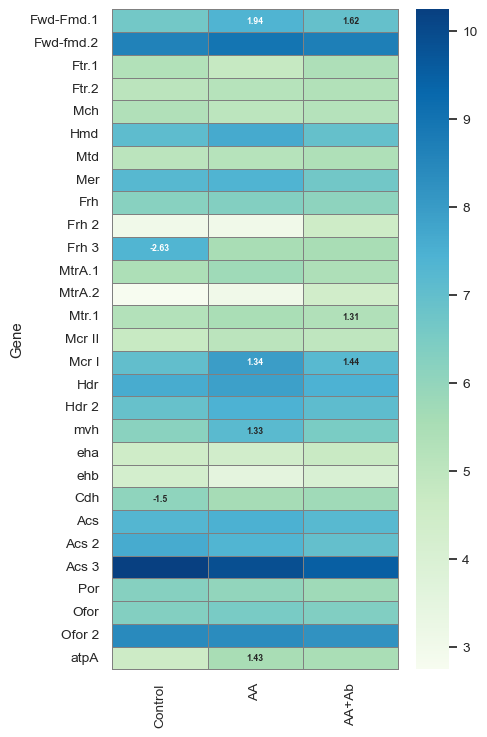

In [96]:
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = [5, 7.5]
plt.rcParams["figure.autolayout"] = True
sns.set(font_scale=0.9)
plt.xticks(rotation=90)

min_ = df_log.min().min()
max_ = df_log.max().max()
fig = sns.heatmap(df_log, cmap="GnBu",
                # center=3000,
                vmin=min_,vmax=max_,cbar=True,linewidths=0.5, linecolor='grey',clip_on=False,mask=df.isna(),
            annot_kws={'size': 'xx-small', 'alpha': 1,'weight':'bold'},
            annot=df2, fmt='')
plt.savefig(f"{outpath}methanogenesis_expression2.svg", bbox_inches='tight')  
plt.savefig(f"{outpath}methanogenesis_expression2.pdf", bbox_inches='tight')  

### __AA - Archaea__

In [ ]:
import pandas as pd
import numpy as np
import os
import scipy.stats as ss
import seaborn as sns

In [ ]:
aa = pd.read_csv('/data3/Documents/esteban/experiments/aa_ab/tables/aminoacids_expression.tsv', sep='\t')
# aa[np.abs(aa['FC-AA-Ctrl']) > 1.0]
aa_heatmap = aa[['Abreviation','Control','AA','AA+Ab']]
aa_diff = aa_heatmap.copy()
for i in aa_diff.index:
    aa_diff.loc[i,'Control'] = ''
    aa_diff.loc[i,'AA'] = ''
    aa_diff.loc[i,'AA+Ab'] = ''
    
    if aa.loc[i]['padj-AA-Ctrl'] < 0.05:
        l2 = aa.loc[i]['FC-AA-Ctrl']
        if l2 > 1.0:
            aa_diff.loc[i,'AA'] = np.round(l2,2)
        elif l2 < -1.0:
            aa_diff.loc[i,'Control'] = np.round(l2,2)
    if aa.loc[i]['padj-AAAb-Ctrl'] < 0.05:
        l2 = aa.loc[i]['FC-AAAb-Ctrl']
        if l2 > 1.0:
            aa_diff.loc[i,'AA+Ab'] = np.round(l2,2)

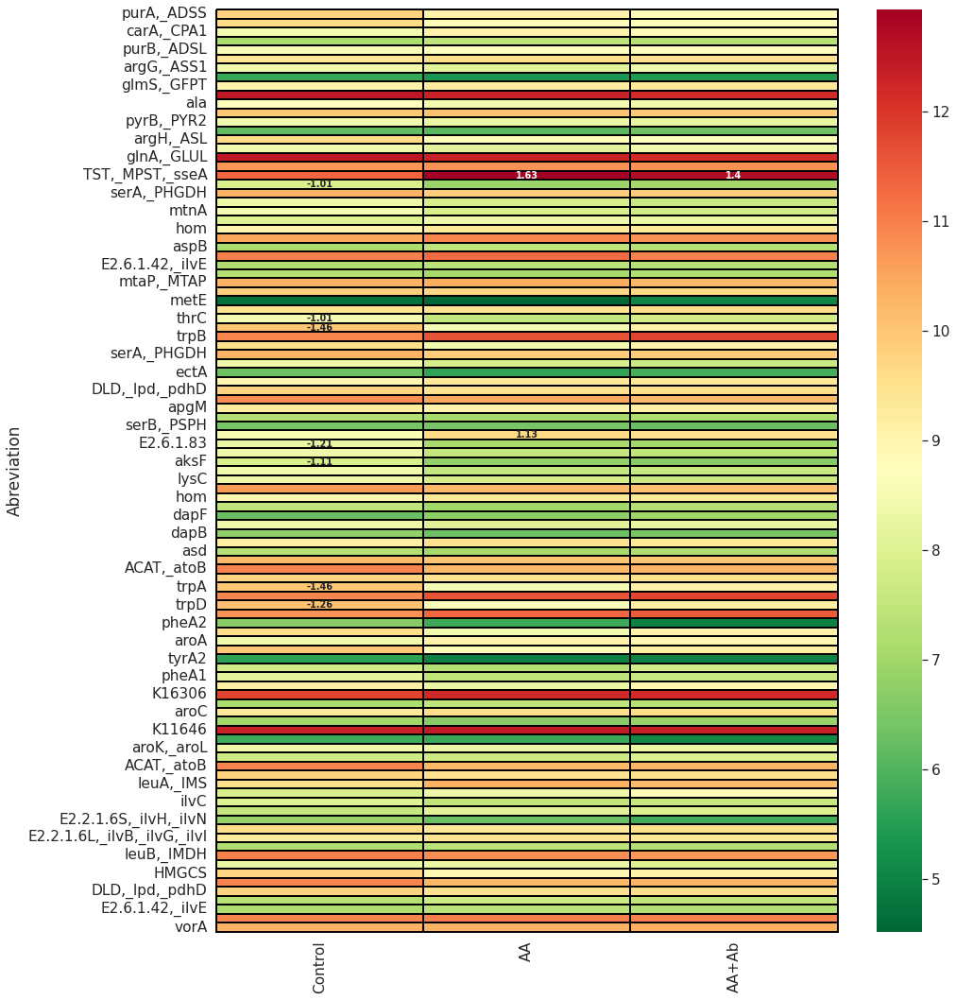

In [ ]:
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = [15, 15]
plt.rcParams["figure.autolayout"] = True
sns.set(font_scale=1.4)
plt.xticks(rotation=90)

df = aa_heatmap.set_index('Abreviation')
df = np.log2(df.fillna(0)+1)

df2 = aa_diff.set_index('Abreviation')
min_ = min(df.min())
max_ = max(df.max())

fig = sns.heatmap(df, cmap="RdYlGn_r", vmin=min_,vmax=max_,cbar=True,linewidths=0.02, linecolor='black',clip_on=False,mask=df.isna(),
            annot_kws={'size': 'xx-small', 'alpha': 1,'weight':'bold'},
            annot=df2, fmt='')

#fig.subplots_adjust(wspace=0.1)
plt.savefig("aa_mt.svg", bbox_inches='tight')  # Use bbox_inches='tight' to ensure tight layout

In [ ]:
df2[df2['AA'] != '']

,Control,AA,AA+Ab
Abreviation,,,
"TST,_MPST,_sseA",,1.63,1.4
aksE,,1.13,


In [ ]:
# First check how many modules involving aminoacids are present
kemet = pd.read_csv(f'{path}annotations/kemet/reportKMC_maxbin2.spades.001.tsv', sep="\t", index_col=0,names=['path','completeness','P__T','KOs_P','KOs_T','Dknown'])
kemet = kemet.drop('Dknown',axis=1)

aa_modules = pd.read_csv(f'{path}tables/aminoacids.modules.txt', sep="\t", names=['Name'])

kemet.loc[aa_modules.index]


,path,completeness,P__T,KOs_P,KOs_T
M00002,"Glycolysis, core module involving three-carbon...",1 BLOCK MISSING,5__6,"K00134,K11389,K11389,K01834,K15633,K15634,K008...","K01803,K00150,K00927,K15635,K01689"
M00005,"PRPP biosynthesis, ribose 5P => PRPP",COMPLETE,1__1,NaN,K00948
M00007,"Pentose phosphate pathway, non-oxidative phase...",INCOMPLETE,1__4,"K00615,K00616,K13810,K01783,K01808",K01807
M00010,"Citrate cycle, first carbon oxidation, oxaloac...",2 BLOCKS MISSING,1__3,"K05942,K01681,K01682,K00031,K00030",K01647
M00015,"Proline biosynthesis, glutamate => proline",2 BLOCKS MISSING,1__3,"K00931,K12657,K00147,K12657",K00286
M00016,"Lysine biosynthesis, succinyl-DAP pathway, asp...",2 BLOCKS MISSING,7__9,"K12524,K12525,K12526,K00674,K14267,K01439,K12526","K00928,K00133,K01714,K00215,K00821,K01778,K01586"
M00017,"Methionine biosynthesis, apartate => homoserin...",2 BLOCKS MISSING,5__7,"K12524,K12525,K12524,K12525,K00651,K01739,K017...","K00928,K00133,K00003,K00641,K00549"
M00018,"Threonine biosynthesis, aspartate => homoserin...",1 BLOCK MISSING,4__5,"K12524,K12525,K12526,K12524,K12525,K00872,K022...","K00928,K00133,K00003,K01733"
M00019,"Valine/isoleucine biosynthesis, pyruvate => va...",COMPLETE,4__4,K11258,"K01652,K01653,K00053,K01687,K00826"
M00020,"Serine biosynthesis, glycerate-3P => serine",1 BLOCK MISSING,2__3,"K00831,K02203,K22305","K00058,K01079"


### __Methanogenesis__

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import os
from matplotlib import pyplot as plt
from matplotlib import colors as clrs

In [ ]:
def GetDifferentialExpression(diff,gene,samples_expr):
    diftmp = diff.loc[gene][['log2FoldChange','Condition']]
    
    if type(diftmp) == pd.core.series.Series:
        fc = diftmp[0]
        samples = diftmp[1].split("_")
        if fc > 0:
            if 'AA' == samples[0]:
                if 'AAAb' != samples[1]:
                    samples_expr['AA'] = fc
            elif 'AAAb' == samples[0]:
                samples_expr['AA+Ab'] = fc
        else:
            if 'ctrl' == samples[1]:
                samples_expr['Control'] = np.abs(fc)
    else:
        for i in diftmp.itertuples():
            # Check only if there is overexpression
            # check for each sample
            samples = i[2].split("_")
            fc = i[1]
            if fc > 0:
                if samples[0] == 'AA':
                    if np.isnan(samples_expr['AA']):
                        samples_expr['AA'] = fc
                    elif samples_expr['AA'] < fc:
                        samples_expr['AA'] = fc
                elif samples[0] == 'AAAb':
                    if np.isnan(samples_expr['AA+Ab']):
                        samples_expr['AA+Ab'] = fc
                    elif samples_expr['AA+Ab'] < fc:
                        samples_expr['AA+AB'] = fc
            else:
                fc = np.abs(fc)
                if 'ctrl' == samples[1]:
                    if np.isnan(samples_expr['Control']):
                        samples_expr['Control'] = fc
                    else:
                        if samples_expr['Control'] < fc:
                            samples_expr['Control'] = fc
    return samples_expr

#### Create differential expressed table

In [ ]:
rna_path = '/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/raw_results/'
files = os.listdir(rna_path)

diff_all_mags = pd.DataFrame()
for f in files:
    if f.endswith('.csv'):
        if f.endswith('_2.csv'):
            pass
        else:
            mag = '_'.join(f.split("_")[:-2])
            condicion = '-'.join(f.split("_")[-2:]).replace(".csv","")
            dftmp = pd.read_csv(rna_path+f,sep=',',index_col=0)
            dftmp['MAG'] = mag
            dftmp['Condition'] = condicion
            diff_all_mags = pd.concat([diff_all_mags,dftmp])
diff_all_mags.to_csv('/home/esteban/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/for_analysis/raw_results/all_results.csv')

In [ ]:
methanogenesis_f = '/data3/Documents/esteban/experiments/aa_ab/tables/methanogenesis.table.tsv'
methanogenesis = pd.read_csv(methanogenesis_f,sep='\t')

ar_kos_p = '/home/esteban/Documents/esteban/experiments/aa_ab/annotations/kos/maxbin2.spades.001.kos.out'
ar_expr_p = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/rnaFPKM/fpkm_tables/maxbin2.spades.001.tsv'

# Read the differential expression table
diff = pd.read_csv("/data3/Documents/esteban/experiments/aa_ab/rna/htseq/mags_read_count/raw_results/all_results3.csv", index_col=0)
diff = diff[(diff['padj'] < 0.05) & (np.abs(diff['log2FoldChange']) > 1.3)]

df = pd.DataFrame(columns=['Sample','ID','MAG','mag','KO','Step','expr','diff'])

sample_id = {'G15':'Control','G16':'Control','G17':'Control','G18':'AA','G19':'AA','G20':'AA','G21':'AA+Ab','G23':'AA+Ab'}
name = 'maxbin2.spades.001'
mag = 'M. thermautotrophicus UNIPD4'

ar_expr = pd.read_csv(ar_expr_p,sep="\t",index_col=0)
ar_expr.drop("G22",axis=1,inplace=True)
df_ko = pd.read_csv(ar_kos_p, sep='\t',names=['Gene','KO'])
kos = []
for ko in methanogenesis.KO.unique():
    if ko != '-':
        if ',' in ko:
            for k in ko.split(','):
                if k not in kos:
                    kos.append(k)
        else:
            if ko not in kos:
                kos.append(ko)
for ko in kos:
    orders = methanogenesis[methanogenesis['KO'] == ko]
    orders = list(orders.Order.unique())
    genes = list(df_ko[df_ko['KO'] == ko].Gene)
    samples_expr = {'AA':np.NaN,'AA+Ab':np.NaN,'Control':np.NaN}
    if len(genes) > 1:
        # set a basal expression data, if there are more genes associated with the same step
        # we choose the maximum value. Mean the values wouldn't be right because is the expression
        # of the reaction we want to study, don't matter which is the paralogue or the overall 
        # expression in all the MAG, just the reaction.
        expr_basal = []
        for gene in genes:
            if gene in diff.index:
                samples_expr = GetDifferentialExpression(diff,gene,samples_expr)
            expr = list(ar_expr.loc[gene].values)
            if len(expr_basal) == 0:
                expr_basal = expr.copy()
            else:
                x = 0 # We initialize a count to check the expression
                while x < len(expr):
                    if expr[x] > expr_basal[x]:
                        expr_basal[x] = expr[x]
                    x += 1
    elif len(genes) == 1:
        gene = genes[0]
        if gene in diff.index:
            samples_expr = GetDifferentialExpression(diff,gene,samples_expr)
        expr_basal = list(ar_expr.loc[genes].values[0])
    else:
        # We create an empty expr_basal
        expr_basal = np.empty(8)
        expr_basal[:] = np.NaN
    # We incorporate the information in the dataframe
    i = 0
    for ID in ar_expr.columns:
        sample = sample_id[ID]
        sample_e = samples_expr[sample]
        # sample_e = 0
        if len(orders) > 1:
            df.loc[len(df)] = (sample,ID,mag,name,ko,order,expr_basal[i],sample_e)
        else:
            order = str(orders).replace("[","").replace("]","").replace(" ","").replace("'","")
            df.loc[len(df)] = (sample,ID,mag,name,ko,order,expr_basal[i],sample_e)
        i += 1

In [ ]:
# Average the same type of sample
df2 = pd.DataFrame(columns=['Sample','MAG','Step','expr'])
df22 = pd.DataFrame(columns=['Sample','MAG','Step','diff'])
for step in df.Step.unique():
    dftmp = df[df['Step'] == step]
    for sample in df.Sample.unique():
        df_sample = dftmp[dftmp['Sample'] == sample]
        expr_sample = df_sample.expr.mean()
        diff_sample = df_sample['diff'].max()
        df2.loc[len(df2)] = (sample,mag,step,expr_sample)
        df22.loc[len(df2)] = (sample,mag,step,diff_sample)
df2

,Sample,MAG,Step,expr
0,Control,M. thermautotrophicus UNIPD4,M_1,NaN
1,AA,M. thermautotrophicus UNIPD4,M_1,NaN
2,AA+Ab,M. thermautotrophicus UNIPD4,M_1,NaN
3,Control,M. thermautotrophicus UNIPD4,M_3,217.450017
4,AA,M. thermautotrophicus UNIPD4,M_3,175.970239
5,AA+Ab,M. thermautotrophicus UNIPD4,M_3,179.915534
6,Control,M. thermautotrophicus UNIPD4,M_4,204.629532
7,AA,M. thermautotrophicus UNIPD4,M_4,153.798901
8,AA+Ab,M. thermautotrophicus UNIPD4,M_4,166.109372
9,Control,M. thermautotrophicus UNIPD4,M_5,1201.395831


## __WL BACTERIA__

__WL pathway__

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
from matplotlib import pyplot as plt
from matplotlib import colors as clrs

In [ ]:
def GetDifferentialExpression(diff,gene,samples_expr):
    diftmp = diff.loc[gene][['log2FoldChange','Condition']]
    
    if type(diftmp) == pd.core.series.Series:
        fc = diftmp[0]
        samples = diftmp[1].split("_")
        if fc > 0:
            if 'AA' == samples[0]:
                if 'AAAb' != samples[1]:
                    samples_expr['AA'] = fc
            elif 'AAAb' == samples[0]:
                samples_expr['AA+Ab'] = fc
        else:
            if 'ctrl' == samples[1]:
                samples_expr['Control'] = np.abs(fc)
    else:
        for i in diftmp.itertuples():
            # Check only if there is overexpression
            # check for each sample
            samples = i[2].split("_")
            fc = i[1]
            if fc > 0:
                if samples[0] == 'AA':
                    if np.isnan(samples_expr['AA']):
                        samples_expr['AA'] = fc
                    elif samples_expr['AA'] < fc:
                        samples_expr['AA'] = fc
                elif samples[0] == 'AAAb':
                    if np.isnan(samples_expr['AA+Ab']):
                        samples_expr['AA+Ab'] = fc
                    elif samples_expr['AA+Ab'] < fc:
                        samples_expr['AA+AB'] = fc
            else:
                fc = np.abs(fc)
                if 'ctrl' == samples[1]:
                    if np.isnan(samples_expr['Control']):
                        samples_expr['Control'] = fc
                    else:
                        if samples_expr['Control'] < fc:
                            samples_expr['Control'] = fc
    return samples_expr

In [ ]:
wl_f = '~/Documents/esteban/experiments/aa_ab/tables/wl_table.tsv'
wl = pd.read_csv(wl_f,sep="\t")

# mags_kos_p = '/home/bioinfo/Documents/esteban/experiments/aa_ab/annotations/kos/'
mags_kos_p = f'{path}tableskos/'
mags_expr_p = f'{path}tables/rnaFPKM/'

# Read the differential expression table
diff = pd.read_csv(f"{path}tables/all_results3.csv", index_col=0)
diff = diff[(diff['padj'] < 0.05) & (np.abs(diff['log2FoldChange']) > 1.3)]

df = pd.DataFrame(columns=['Sample','ID','MAG','mag','KO','Step','expr','diff'])

names = {}
with open(f'{path}tables/names.list.tree.tsv')as f:
    for line in f:
        old,new = line.split("\t")
        names[old] = new.replace("\n","")

contigs_wl = {}
sample_id = {'G15':'Control','G16':'Control','G17':'Control','G18':'AA','G19':'AA','G20':'AA','G21':'AA+Ab','G23':'AA+Ab'}
mags_kos_files = os.listdir(mags_kos_p)
for mag_ko in mags_kos_files:
    if mag_ko.endswith("kos.out"):
        name = mag_ko.replace(".kos.out","")
        mag = names[name]
        mag_expr = pd.read_csv(f"{mags_expr_p}{name}.tsv",sep="\t",index_col=0)
        mag_expr.drop("G22",axis=1,inplace=True)
        df_ko = pd.read_csv(f'{mags_kos_p}{mag_ko}', sep='\t',names=['Gene','KO'])
        contigs_wl[mag] = []
        for ko in wl.KO.unique():
            orders = wl[wl['KO'] == ko]
            orders = list(orders.Order.unique())
            genes = list(df_ko[df_ko['KO'] == ko].Gene)
            samples_expr = {'AA':np.NaN,'AA+Ab':np.NaN,'Control':np.NaN}
            if len(genes) > 1:
                # set a basal expression data, if there are more genes associated with the same step
                # we choose the maximum value. Mean the values wouldn't be right because is the expression
                # of the reaction we want to study, doesn't matter which is the paralogue or the overall 
                # expression in all the MAG, just the reaction.
                expr_basal = []
                for gene in genes:
                    genes_contigs = contigs_wl[mag]
                    if gene not in genes_contigs:
                        genes_contigs.append(gene)
                        contigs_wl[mag] = genes_contigs
                    if gene in diff.index:
                        samples_expr = GetDifferentialExpression(diff,gene,samples_expr)
                    expr = list(mag_expr.loc[gene].values)
                    if len(expr_basal) == 0:
                        expr_basal = expr.copy()
                    else:
                        x = 0 # We initialize a count to check the expression
                        while x < len(expr):
                            if expr[x] > expr_basal[x]:
                                expr_basal[x] = expr[x]
                            x += 1
            elif len(genes) == 1:
                gene = genes[0]
                if gene in diff.index:
                    samples_expr = GetDifferentialExpression(diff,gene,samples_expr)
                expr_basal = list(mag_expr.loc[genes].values[0])
            else:
                # We create an empty expr_basal
                expr_basal = np.empty(8)
                expr_basal[:] = np.NaN
            # We incorporate the information in the dataframe
            i = 0
            for ID in mag_expr.columns:
                sample = sample_id[ID]
                sample_e = samples_expr[sample]
                # sample_e = 0
                if len(orders) > 1:
                    for order in orders:
                        if order != 'WL_10' and order!= 'GCS_10':
                            order = order.replace("_","_0")
                        
                        df.loc[len(df)] = (sample,ID,mag,name,ko,order,expr_basal[i],sample_e)
                else:
                    order = str(orders).replace("[","").replace("]","").replace(" ","").replace("'","")
                    if order != 'WL_10' and order!= 'GCS_10':
                        order = order.replace("_","_0")
                    df.loc[len(df)] = (sample,ID,mag,name,ko,order,expr_basal[i],sample_e)
                i += 1

/tmp/ipykernel_6246/2915413500.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fc = diftmp[0]
/tmp/ipykernel_6246/2915413500.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  samples = diftmp[1].split("_")
/tmp/ipykernel_6246/2915413500.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  fc = diftmp[0]
/tmp/ipykernel_6246/2915413500.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future v

In [ ]:
# Average the same type of sample and separate the archeon
df2 = pd.DataFrame(columns=['Sample','MAG','Step','expr'])
df22 = pd.DataFrame(columns=['Sample','MAG','Step','diff'])
for mag in df.MAG.unique():
    dftmp = df[df['MAG'] == mag]
    for step in df.Step.unique():
        dftmp2 = dftmp[dftmp['Step'] == step]
        for sample in df.Sample.unique():
            df_sample = dftmp2[dftmp2['Sample'] == sample]
            expr_sample = df_sample.expr.mean()
            diff_sample = df_sample['diff'].max()
            df2.loc[len(df2)] = (sample,mag,step,expr_sample)
            df22.loc[len(df2)] = (sample,mag,step,diff_sample)
# Remove the Archaea
mags = df2.MAG.unique()
archaea = ['M. wolfeii UNIPD21','M. thermautotrophicus UNIPD4']
df3 = df2[(df2['MAG'] != archaea[0]) & (df2['MAG'] != archaea[1])]
df33 = df22[(df22['MAG'] != archaea[0]) & (df22['MAG'] != archaea[1])]

In [ ]:
df3[df3['Step'].str.startswith('W')].sort_values(by='Step')

,Sample,MAG,Step,expr
66,Control,Moorella thermoacetica UNIPD30,WL_01,2.165578
1652,AA+Ab,Limnochordia sp. UNIPD14,WL_01,79.851096
1651,AA,Limnochordia sp. UNIPD14,WL_01,45.005395
528,Control,Limnochordia sp. UNIPD22,WL_01,8.760087
529,AA,Limnochordia sp. UNIPD22,WL_01,1.687132
...,...,...,...,...
432,Control,Tepidimicrobiaceae sp. UNIPD26,WL_10,3.045383
1358,AA+Ab,Aeribacillus composti UNIPD16,WL_10,4.065041
1357,AA,Aeribacillus composti UNIPD16,WL_10,4.065041
894,Control,C. subterraneus UNIPD13,WL_10,168.902586


In [ ]:
wl_df = df3[df3['Step'].str.startswith('W')].sort_values(by='Step')
wl_diff = df33[df33['Step'].str.startswith('W')].sort_values(by='Step')

gcs_df = df3[df3['Step'].str.startswith('G')].sort_values(by='Step')
gcs_diff = df33[df33['Step'].str.startswith('G')].sort_values(by='Step')

wl_cols = []
for step in wl_df.Step.unique():
    col1 = step+'_Control'
    col2 = step+'_AA'
    col3 = step+'_AA+Ab'
    
    wl_cols.append(col1)
    wl_cols.append(col2)
    wl_cols.append(col3)
    
wl_df2 = pd.DataFrame(columns=wl_cols,index=wl_df.MAG.unique())
wl_diff2 = pd.DataFrame(columns=wl_cols,index=wl_diff.MAG.unique())
wl_diff3 = pd.DataFrame(columns=wl_cols,index=wl_diff.MAG.unique())

for mag in wl_df2.index:
    for col in wl_df2.columns:
        step = "_".join(col.split("_")[0:2])
        sample = col.split("_")[-1]
        expr_tmp = list(wl_df[(wl_df['Sample'] == sample) & (wl_df['MAG'] == mag) & (wl_df['Step'] == step)].expr.values)
        diff_mag = wl_diff[(wl_diff['Sample'] == sample) & (wl_diff['MAG'] == mag) & (wl_diff['Step'] == step)]['diff'].values[0]
        if len(expr_tmp) > 0:
            expr_mag = float(expr_tmp[0])
        else:
            expr_mag = None
        
        wl_df2.loc[mag,col] = expr_mag
        if np.isnan(diff_mag):
            wl_diff3.loc[mag,col] = ''
        else:
            wl_diff3.loc[mag,col] = '*'
        wl_diff2.loc[mag,col] = np.round(diff_mag,2)
        
##########################################
gcs_cols = []
for step in gcs_df.Step.unique():
    col1 = step+'_Control'
    col2 = step+'_AA'
    col3 = step+'_AA+Ab'
    
    gcs_cols.append(col1)
    gcs_cols.append(col2)
    gcs_cols.append(col3)
    
gcs_df2 = pd.DataFrame(columns=gcs_cols,index=gcs_df.MAG.unique())
gcs_diff2 = pd.DataFrame(columns=gcs_cols,index=gcs_diff.MAG.unique())
gcs_diff3 = pd.DataFrame(columns=gcs_cols,index=gcs_diff.MAG.unique())
for mag in gcs_df2.index:
    for col in gcs_df2.columns:
        step = "_".join(col.split("_")[0:2])
        sample = col.split("_")[-1]
        expr_tmp = list(gcs_df[(gcs_df['Sample'] == sample) & (gcs_df['MAG'] == mag) & (gcs_df['Step'] == step)].expr.values)
        diff_mag = gcs_diff[(gcs_diff['Sample'] == sample) & (gcs_diff['MAG'] == mag) & (gcs_diff['Step'] == step)]['diff'].values[0]
        if len(expr_tmp) > 0:
            expr_mag = float(expr_tmp[0])
        else:
            expr_mag = None
        gcs_df2.loc[mag,col] = expr_mag
        if np.isnan(diff_mag):
            gcs_diff3.loc[mag,col] = ''
        else:
            gcs_diff3.loc[mag,col] = '*'
        gcs_diff2.loc[mag,col] = np.round(diff_mag,2)

In [ ]:
wl_df.to_csv(f'{path}tables/wl.table.tsv',sep='\t')
gcs_df.to_csv(f'{path}tables/gcs.table.tsv',sep='\t')

In [ ]:
gcs_df2b = gcs_df2.loc[wl_df2.index]
log2_wl = np.log2(wl_df2.fillna(0)+1)
log2_gcs = np.log2(gcs_df2b.fillna(0)+1)
min_ = np.min([log2_wl.min().min(),log2_gcs.min().min()])
max_ = np.max([(log2_wl.max().max(),log2_gcs.max().max())])

cols_gcs = ['GCS_05_Control','GCS_05_AA','GCS_05_AA+Ab',
            'GCS_06_Control','GCS_06_AA','GCS_06_AA+Ab',
            'GCS_07_Control','GCS_07_AA','GCS_07_AA+Ab',
            'GCS_08_Control','GCS_08_AA','GCS_08_AA+Ab']

gcs_df2b = gcs_df2b[cols_gcs]
gcs_diff4 = gcs_diff3[cols_gcs]
max_ = np.max([log2_wl.max().max(),log2_gcs.max().max()])

magsToPLot = list(set(log2_wl.index) & set(cov4.index))
unipds = []
magsToPLot = []
for i in cov4.index:
    unipds.append(i[-7:])
for i in log2_wl.index:
    x = i[-7:]
    if x in unipds:
        magsToPLot.append(i)

magsToPLot_d = {}
for mag in magsToPLot:
    mag2 = mag.replace("UNIPD","PD")
    magsToPLot_d[mag]= mag2
wlLog = wl_df2.loc[magsToPLot]
wlLog = wlLog.rename(magsToPLot_d)
gcsLog = gcs_df2b.loc[magsToPLot]
gcsLog = gcsLog.rename(magsToPLot_d)

wl_gcs_log = pd.concat([wlLog,gcsLog],axis=1)
col_ordered = ['WL_01_Control', 'WL_01_AA', 'WL_01_AA+Ab', 'WL_02_Control', 'WL_02_AA','WL_02_AA+Ab', 'WL_03_Control', 'WL_03_AA', 
               'WL_03_AA+Ab','WL_04_Control', 'WL_04_AA', 'WL_04_AA+Ab', 'WL_05_Control', 'WL_05_AA','WL_05_AA+Ab', 'GCS_05_Control',
               'GCS_05_AA', 'GCS_05_AA+Ab','WL_06_Control', 'WL_06_AA', 'WL_06_AA+Ab','GCS_06_Control', 'GCS_06_AA','GCS_06_AA+Ab',
               'WL_07_Control', 'WL_07_AA', 'WL_07_AA+Ab', 'GCS_07_Control', 'GCS_07_AA', 'GCS_07_AA+Ab','WL_08_Control', 'WL_08_AA','WL_08_AA+Ab',
               'GCS_08_Control', 'GCS_08_AA', 'GCS_08_AA+Ab','WL_09_Control', 'WL_09_AA', 'WL_09_AA+Ab','WL_10_Control', 'WL_10_AA', 'WL_10_AA+Ab']
wl_gcs_log = wl_gcs_log[col_ordered]

In [ ]:
magsToPLot = list(set(log2_wl.index) & set(cov4.index))
unipds = []
magsToPLot = []
for i in cov4.index:
    unipds.append(i[-7:])
for i in log2_wl.index:
    x = i[-7:]
    if x in unipds:
        magsToPLot.append(i)

magsToPLot_d = {}
for mag in magsToPLot:
    mag2 = mag.replace("UNIPD","PD")
    magsToPLot_d[mag]= mag2
wlLog = wl_df2.loc[magsToPLot]
wlLog = wlLog.rename(magsToPLot_d)
gcsLog = gcs_df2b.loc[magsToPLot]
gcsLog = gcsLog.rename(magsToPLot_d)

wl_gcs_log = pd.concat([wlLog,gcsLog],axis=1)
col_ordered = ['WL_01_Control', 'WL_01_AA', 'WL_01_AA+Ab', 'WL_02_Control', 'WL_02_AA','WL_02_AA+Ab', 'WL_03_Control', 'WL_03_AA', 
               'WL_03_AA+Ab','WL_04_Control', 'WL_04_AA', 'WL_04_AA+Ab', 'WL_05_Control', 'WL_05_AA','WL_05_AA+Ab', 'GCS_05_Control',
               'GCS_05_AA', 'GCS_05_AA+Ab','WL_06_Control', 'WL_06_AA', 'WL_06_AA+Ab','GCS_06_Control', 'GCS_06_AA','GCS_06_AA+Ab',
               'WL_07_Control', 'WL_07_AA', 'WL_07_AA+Ab', 'GCS_07_Control', 'GCS_07_AA', 'GCS_07_AA+Ab','WL_08_Control', 'WL_08_AA','WL_08_AA+Ab',
               'GCS_08_Control', 'GCS_08_AA', 'GCS_08_AA+Ab','WL_09_Control', 'WL_09_AA', 'WL_09_AA+Ab','WL_10_Control', 'WL_10_AA', 'WL_10_AA+Ab']
wl_gcs_log = wl_gcs_log[col_ordered]

wlDIFF = wl_diff3.loc[magsToPLot]
wlDIFF = wlDIFF.rename(magsToPLot_d)
gcsDIFF = gcs_diff4.loc[magsToPLot]
gcsDIFF = gcsDIFF.rename(magsToPLot_d)
wl_gcs_diff = pd.concat([wlDIFF,gcsDIFF],axis=1)
wl_gcs_diff = wl_gcs_diff[col_ordered]

wl_gcs_log = wl_gcs_log.apply(pd.to_numeric, errors='coerce')
wl_gcs_log2 = np.log2(wl_gcs_log)

from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = [10, 6.5]
plt.rcParams["figure.autolayout"] = True
sns.set(font_scale=0.9)
plt.xticks(rotation=90)


min_ = np.min(wl_gcs_log)
max_ = np.max(wl_gcs_log2)

fig = sns.heatmap(wl_gcs_log2, cmap="GnBu",
                # center=3000,
                vmin=min_,vmax=max_,cbar=True,linewidths=0.5, linecolor='grey',clip_on=False,mask=wl_gcs_log.isna(),
            annot_kws={'size': 'xx-small', 'alpha': 1,'weight':'bold'},
            annot=wl_gcs_diff, fmt='')

In [ ]:
wl_gcs_log = wl_gcs_log.apply(pd.to_numeric, errors='coerce')
wl_gcs_log2 = np.log2(wl_gcs_log)

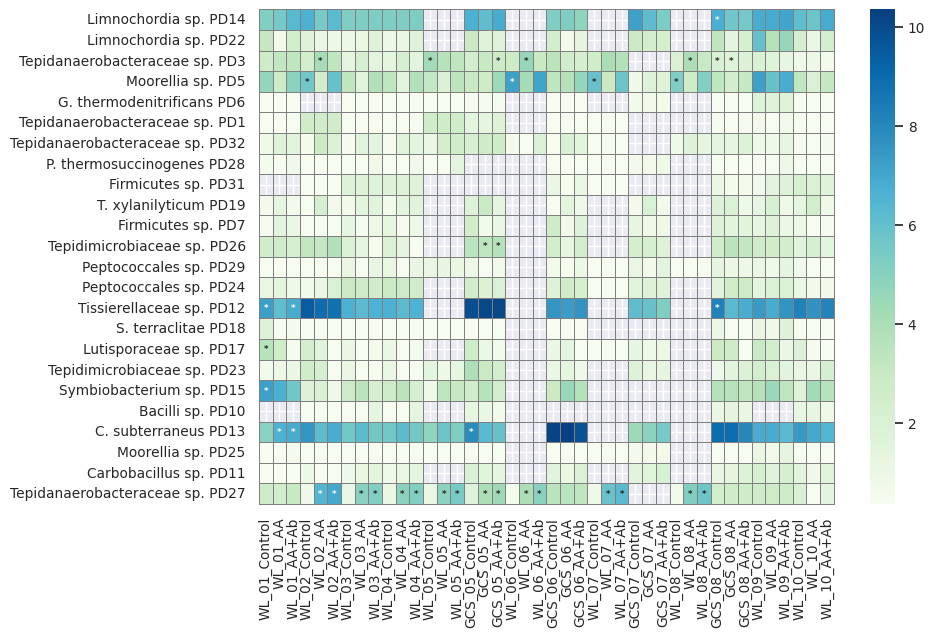

In [ ]:
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = [10, 6.5]
plt.rcParams["figure.autolayout"] = True
sns.set(font_scale=0.9)
plt.xticks(rotation=90)


min_ = np.min(wl_gcs_log)
max_ = np.max(wl_gcs_log2)

fig = sns.heatmap(wl_gcs_log2, cmap="GnBu",
                # center=3000,
                vmin=min_,vmax=max_,cbar=True,linewidths=0.5, linecolor='grey',clip_on=False,mask=wl_gcs_log.isna(),
            annot_kws={'size': 'xx-small', 'alpha': 1,'weight':'bold'},
            annot=wl_gcs_diff, fmt='')

plt.savefig(f"{outpath}wl_gcs_heatmaps_expression.svg", bbox_inches='tight')  # Use bbox_inches='tight' to ensure tight layout

## __Amino acids metabolism__

#### Total AA Genes

In [98]:
import pandas as pd
import os
import numpy as np 

metabolism = pd.read_csv(f'{path}db/metabolism.parsed.tsv',sep="\t")
aas = metabolism[metabolism['MAIN'] == 'aminoacids']   

In [ ]:
# Identify the amino acids genes for each gene. Build a table of presence of genes related to each metabolism and the expression
files = os.listdir(f'{path}tables/kos/')
aaKOs = list(aas['KO'].unique())
magAA = pd.DataFrame(columns=['MAG','Gene','KO','KO-Name'])
aaKOsNames = {}
aaKosMet = {}
for ko in aaKOs:
    aaKosMet[ko] = []
    name = aas[aas['KO']==ko]['KO-Name'].values[0]
    met =  aas[aas['KO']==ko]['Name'].values[0]
    for met in aas[aas['KO'] == ko]['Name']:      
        l = aaKosMet[ko]
        if met not in l:
            l.append(met)
            aaKosMet[ko] = l
    aaKOsNames[ko] = name

names = {}
with open(f'{path}tables/names.list.tsv')as f:
    for line in f:
        old,new = line.split("\t")
        new = new.replace("\n","")
        names[old]= new
        
magGenes = {}
for f in files:
    if f.endswith('.out'):
        old_mag = f.replace('.kos.out','')
        mag = names[old_mag]
        magGenes[mag] = []
        with open(f'{path}tables/kos/{f}')as file:
            for line in file:
                if line != '\n':
                    gene,ko = line.split("\t")
                    if gene not in magGenes[mag]:
                        l = magGenes[mag]
                        l.append(gene)
                        magGenes[mag] = l
                    ko = ko.replace('\n','')
                    if ko in aaKOs:
                        magAA.loc[len(magAA)] = (mag,gene,ko,aaKOsNames[ko])

In [9]:
aas2 = aas[aas['KO'].isin(magAA['KO'].unique())]
len(aas['Name'].unique()),len(aas2['Name'].unique())

(21, 21)

In [10]:
# Create a table with the number of genes involved in each aa metabolism
# If there is more than one metabolism for the same ko, just add to all
aaMet = pd.DataFrame(columns=aas2['Name'].unique(),index=magAA['MAG'].unique())
aaMet.fillna(0,inplace=True)
for i in magAA.itertuples():
    mag = i[1]
    ko = i[3]
    for met in aas[aas['KO'] == ko]['Name']:
        aaMet.loc[mag,met] += 1

In [11]:
countGenes = pd.DataFrame(columns=['MAG','AA-Genes','AA-Genes/Total Genes'])
for i in magAA['MAG'].value_counts().items():
    mag = i[0]
    aaCount = i[1]
    tgenes = (aaCount/ len(magGenes[mag]))*100
    countGenes.loc[len(countGenes)] = (mag,aaCount,tgenes)
countGenes.to_clipboard()

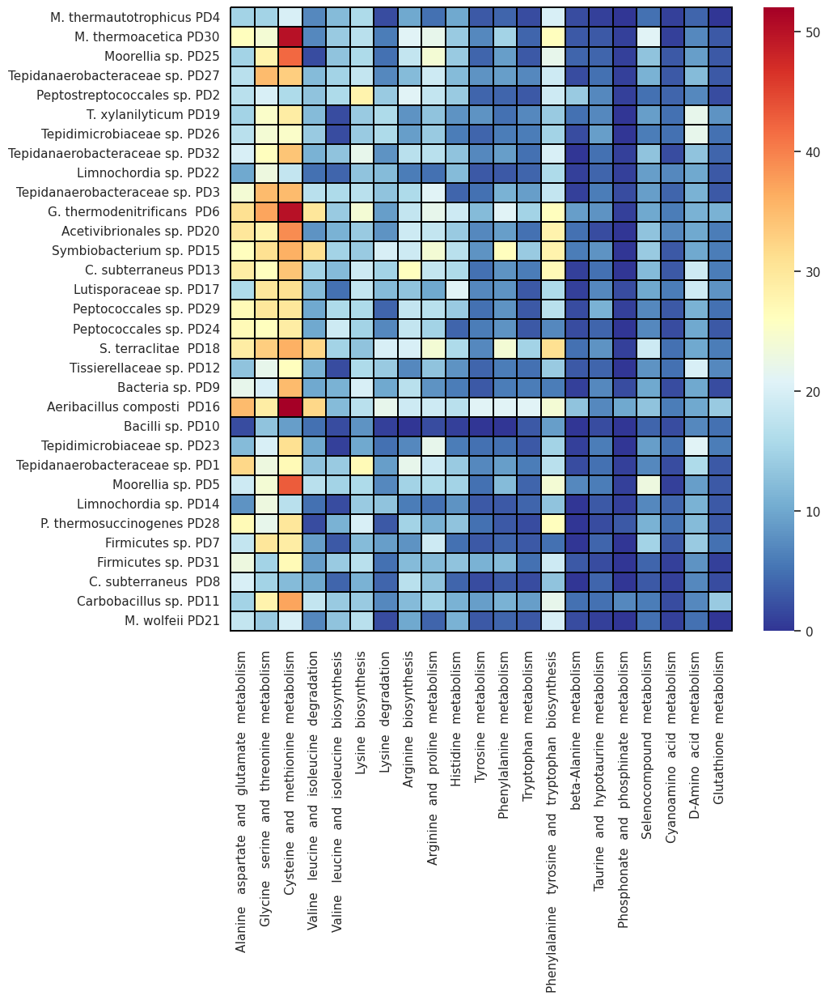

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt

plt.rcParams["figure.figsize"] = [10, 10]
sns.set(font_scale=1.0)
plt.xticks(rotation=90)

sns.heatmap(aaMet, cmap="RdYlBu_r", cbar=True,linewidths=0.02, linecolor='black',clip_on=False,mask=aaMet.isna(),
            annot_kws={'size': 'xx-small', 'alpha': 1,'weight':'bold'})
plt.savefig(f"{outpath}aaMetabolism.svg", bbox_inches='tight')

#### AA - Expression

In [ ]:
# Check the expression of the genes and merge for the different metabolisms
# Add total expression / number of genes 
import pandas as pd
aaMet2 = aaMet.copy()
discardedGenes = []
total_expression_c = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
total_expression_c = total_expression_c.fillna(0)

total_expression_AA = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
total_expression_AA = total_expression_AA.fillna(0)

total_expression_AAAb = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
total_expression_AAAb = total_expression_AAAb.fillna(0)

overexpressed_genes = {}
errores = {}

aaC = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
aaC = aaC.fillna(0)

aaAA = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
aaAA = aaC.fillna(0)

aaCAb = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
aaCAb = aaC.fillna(0)

aaAb = pd.DataFrame(index=aaMet.index,columns=aaMet.columns)
aaAb = aaC.fillna(0)

def findIndex(str1,lista):
    for element in lista:
        if str1 in element:
            return element
    return '-'


aaExpression = pd.DataFrame(columns=['Metabolism','MAG','c1','c2','aa','aaab'])
aaExpression2 = pd.DataFrame(columns=['Metabolism','MAG','KO','c1','c2','aa','aaab'])
metMag = {}
# Lets sum each cell if it's overexpressed in Control vs AA or Control vs AAAb
presents_f = f'{path}tables/differentialAnalysisRNA/mags_present.txt'
presents = []
with open(presents_f)as f:
    for line in f:
        presents.append(line.replace("\n",""))

presents_dict = {}
for i in aaMet.index:
    original = findIndex(i.split(" ")[-1],presents)
    presents_dict[i] = original

expression_dir = f'{path}tables/differentialAnalysisRNA/'
total_expression = f'{path}tables/expression_only_norm.results.tsv'
total_expression_df = pd.read_csv(total_expression,index_col=0)
for mag in aaMet.index:
    metMAG = {}
    # Read the log2FC file:
    mag2 = presents_dict[mag]
    file = '_'.join(mag2.split(" "))
    if file in presents:
        aac = pd.read_csv(f'{expression_dir}{file}_AA_ctrl.csv',sep=',',index_col=0)
        aac = aac[(np.abs(aac['log2FoldChange']) > 1.3) & (aac['padj'] < 0.05)]
        abc = pd.read_csv(f'{expression_dir}{file}_AAAb_ctrl.csv',sep=',',index_col=0)
        abc = abc[(np.abs(abc['log2FoldChange']) > 1.3) & (abc['padj'] < 0.05)]
        genes = list(set(abc.index) | set(aac.index))
        if mag not in overexpressed_genes.keys():
            overexpressed_genes[mag] = genes
        else: 
            print ('Not possible, Error in adding overexpressed genes')
            errores[mag] = genes
        for i in magAA[magAA['MAG'] == mag].itertuples():
            gene = i[2]
            ko = i[3]
            met = aaKosMet[ko]

            try:
                expr_c = total_expression_df.loc[gene][['C1','C2','C3']].mean()
                expr_aa = total_expression_df.loc[gene][['AA1','AA2','AA3']].mean()
                expr_aaab = total_expression_df.loc[gene][['AAAb1','AAAb2']].mean()
            
                total_expression_c.loc[mag,met] += expr_c
                total_expression_AA.loc[mag,met] += expr_aa
                total_expression_AAAb.loc[mag,met] += expr_aaab
            except:
                discardedGenes.append(gene)
                aaMet2.loc[mag][met] -= 1

            if gene in genes:
                for m in met:
                    metMAG_ = m+'--'+mag
                    if metMAG_ not in metMAG.keys():
                        metMAG[metMAG_] = [0,0,0,0]
                    if gene in aac.index:
                        l2fc = aac.loc[gene]['log2FoldChange']
                        if l2fc > 0:
                            base = metMAG[metMAG_]
                            aaAA.loc[mag,met] += 1
                            values = [x + y for x, y in zip(base, [0,0,1,0])]
                            metMAG[metMAG_] = values
                            aaExpression2.loc[len(aaExpression2)] = (m,mag,ko,None,None,l2fc,None)
                        else:
                            base = metMAG[metMAG_]
                            aaC.loc[mag,met] += 1
                            values = [x + y for x, y in zip(base, [1,0,0,0])]
                            metMAG[metMAG_] = values
                            aaExpression2.loc[len(aaExpression2)] = (m,mag,ko,l2fc,None,None,None)
                    if gene in abc.index:
                        l2fc = abc.loc[gene]['log2FoldChange']
                        if l2fc > 0:
                            base = metMAG[metMAG_]
                            aaCAb.loc[mag,met] += 1
                            values = [x + y for x, y in zip(base, [0,1,0,0])]
                            metMAG[metMAG_] = values
                            aaExpression2.loc[len(aaExpression2)] = (m,mag,ko,None,l2fc,None,None)
                        else:
                            base = metMAG[metMAG_]
                            aaAb.loc[mag,met] += 1
                            values = [x + y for x, y in zip(base, [0,0,0,1])]
                            metMAG[metMAG_] = values
                            aaExpression2.loc[len(aaExpression2)] = (m,mag,ko,None,None,None,l2fc)
        for key in metMAG.keys():
            met,mag = key.split("--")
            values= metMAG[key]
            aaExpression.loc[len(aaExpression)] = (met,mag,values[0],values[1],values[2],values[3])
    # except: remove.append(mag)

/tmp/ipykernel_90745/446966000.py:81: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '106.96324921750166' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  total_expression_c.loc[mag,met] += expr_c
/tmp/ipykernel_90745/446966000.py:82: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '49.61850817213023' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  total_expression_AA.loc[mag,met] += expr_aa
/tmp/ipykernel_90745/446966000.py:83: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '45.1251659227629' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  total_expression_AAAb.loc[mag,met] += expr_aaab
/tmp/ipykernel_90745/446966000.py:81: FutureWarning: Setting an item of in

In [90]:
aaExpression2.to_clipboard()

In [84]:
mags_to_plot = ['T. xylanilyticum PD19',
'Tepidanaerobacteraceae sp. PD32',
'Firmicutes sp. PD7',
'Firmicutes sp. PD31',
'Tepidimicrobiaceae sp. PD23',
'Tepidanaerobacteraceae sp. PD3',
'Limnochordia sp. PD22',
'Carbobacillus sp. PD11',
'Lutisporaceae sp. PD17',
'Tepidanaerobacteraceae sp. PD27',
'Peptococcales sp. PD24',
'Moorellia sp. PD5',
'Tepidimicrobiaceae sp. PD26',
'Symbiobacterium sp. PD15',
'Limnochordia sp. PD14',
'Tissierellaceae sp. PD12',
'C. subterraneus PD13',
'M. thermautotrophicus PD4']

columns_sorted = [] # metabolism, degradation, biosynthesis

columns = total_expression_AAAb.columns

# Strip excess spaces from column names
# columns = [col.strip() for col in columns]

# Sort columns into groups
metabolism = sorted([col for col in columns if 'metabolism' in col])
degradation = sorted([col for col in columns if 'degradation' in col])
biosynthesis = sorted([col for col in columns if 'biosynthesis' in col])

# Combine groups in the desired order
columns_sorted = metabolism + degradation + biosynthesis

# Plot AA Expression

In [25]:
control_columns = {}
aa_columns = {}
aaab_columns = {}
columns_sorted2 = []
for i in columns_sorted:
    columns_sorted2.append(i+'_1')
    columns_sorted2.append(i+'_2')
    columns_sorted2.append(i+'_3')

    control_columns[i] = i+'_1'
    aa_columns[i] = i+'_2'
    aaab_columns[i] = i+'_3'

total_expression_c2 = total_expression_c.loc[mags_to_plot[::-1]][columns_sorted]
total_expression_c2.rename(columns=control_columns,inplace=True)

total_expression_aa2 = total_expression_AA.loc[mags_to_plot[::-1]][columns_sorted]
total_expression_aa2.rename(columns=aa_columns,inplace=True)

total_expression_aaab2 = total_expression_AAAb.loc[mags_to_plot[::-1]][columns_sorted]
total_expression_aaab2.rename(columns=aaab_columns,inplace=True)

total_expression_aas = pd.concat([total_expression_c2,total_expression_aa2,total_expression_aaab2],axis=1)
total_expression_aas = total_expression_aas[columns_sorted2]

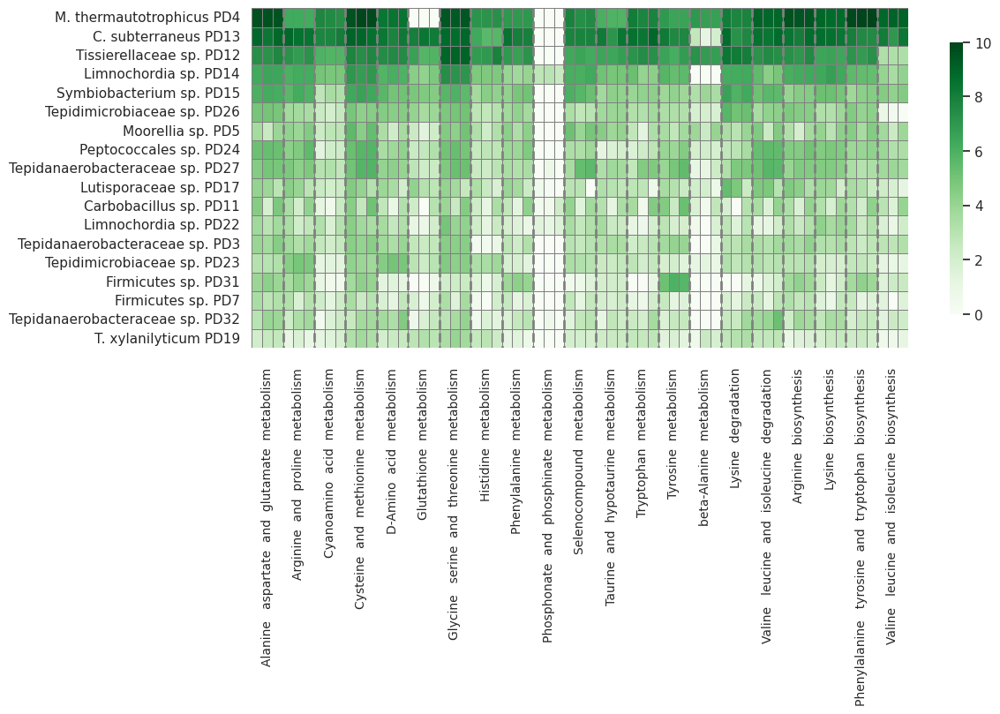

In [ ]:
from matplotlib.colors import LinearSegmentedColormap
greens_custom = LinearSegmentedColormap.from_list(
    "custom_greens", 
    [(0, "white"), (0.2, "lightgreen"), (5, "darkgreen")]
)
fig, ax = plt.subplots(figsize=(12, 5))

total_expression_aas_log = np.log(total_expression_aas+1)
# Create the heatmap
sns.heatmap(
    total_expression_aas_log,
    cmap='Greens',
    linewidths=0.5,
    linecolor="gray",
    # center=0,
    cbar_kws={"shrink": 0.8},
    ax=ax
)

# Add vertical lines every three columns to separate conditions
for i in range(3, total_expression_aas_log.shape[1], 3):
    ax.vlines(i, 0, total_expression_aas_log.shape[0], color="gray", linestyle="--", linewidth=2)

# Adjust x-axis ticks
xtick_positions = np.arange(1, total_expression_aas_log.shape[1], 3)  # Center of each triplet
xtick_labels = [col.split('_')[0] for col in total_expression_aas_log.columns[::3]]  # Compound base names
ax.set_xticks(xtick_positions + 0.5)  # Center ticks
ax.set_xticklabels(xtick_labels, rotation=90, fontsize=10)

# Adjust y-axis ticks
ytick_positions = np.arange(total_expression_aas_log.shape[0])
ax.set_yticks(ytick_positions + 0.5)  # Center ticks

# Save the figure
plt.savefig(f"{outpath}flux_exchanges_transposed_names.svg")
plt.savefig(f"{outpath}flux_exchanges_transposed_names.pdf")

In [50]:
magsTotalExpressionlog = []
for mag in total_expression_aas_log.index:
    magsTotalExpressionlog.append(mag+'_1')
    magsTotalExpressionlog.append(mag+'_2')
    magsTotalExpressionlog.append(mag+'_3')

columnsToPlot = []
for col in total_expression_aas_log.columns:
    col = col.split("_")[0]
    if col not in columnsToPlot:
        columnsToPlot.append(col)

total_expression_aas_log2 = pd.DataFrame(index=columnsToPlot,columns=magsTotalExpressionlog)
total_expression_aas_log2.fillna(0,inplace=True)
for mag in total_expression_aas_log.index:
    for col in total_expression_aas_log.columns:
        value = total_expression_aas_log.loc[mag][col].astype('object')
        mag2 = mag+'_'+col.split("_")[1]
        total_expression_aas_log2.loc[col.split("_")[0],mag2] = value


/tmp/ipykernel_90745/2581238007.py:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '9.63662873514201' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  total_expression_aas_log2.loc[col.split("_")[0],mag2] = value
/tmp/ipykernel_90745/2581238007.py:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '9.575515727725112' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  total_expression_aas_log2.loc[col.split("_")[0],mag2] = value
/tmp/ipykernel_90745/2581238007.py:19: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '9.52373225012123' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  total_expression_aas_log2.loc[col.split("_")[0],mag2] = value
/tmp/ipykernel_90745/

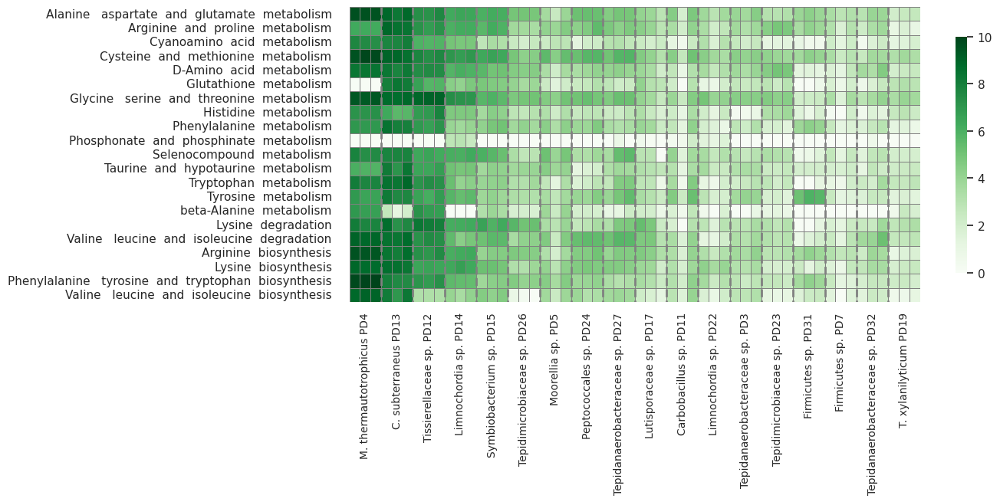

In [ ]:
fig, ax = plt.subplots(figsize=(12, 5))

# Create the heatmap
sns.heatmap(
    total_expression_aas_log2,
    cmap='Greens',
    linewidths=0.5,
    linecolor="gray",
    # center=0,
    cbar_kws={"shrink": 0.8},
    ax=ax
)

# Add vertical lines every three columns to separate conditions
for i in range(3, total_expression_aas_log2.shape[1], 3):
    ax.vlines(i, 0, total_expression_aas_log2.shape[0], color="gray", linestyle="--", linewidth=2)

# Adjust x-axis ticks: 
xtick_positions = np.arange(1, total_expression_aas_log2.shape[1], 3)  # Center of each triplet
xtick_labels = [col.split('_')[0] for col in total_expression_aas_log2.columns[::3]]  # Compound base names
ax.set_xticks(xtick_positions + 0.5)  # Center ticks
ax.set_xticklabels(xtick_labels, rotation=90, fontsize=10)

# Adjust y-axis ticks
ytick_positions = np.arange(total_expression_aas_log2.shape[0])
ax.set_yticks(ytick_positions + 0.5)  # Center ticks

# Save the figure
plt.savefig(f"{outpath}flux_exchanges_transposed_names.svg")
plt.savefig(f"{outpath}flux_exchanges_transposed_names.pdf")

## Finished

/tmp/ipykernel_28404/1499269925.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  v.replace(0,np.nan,inplace=True)


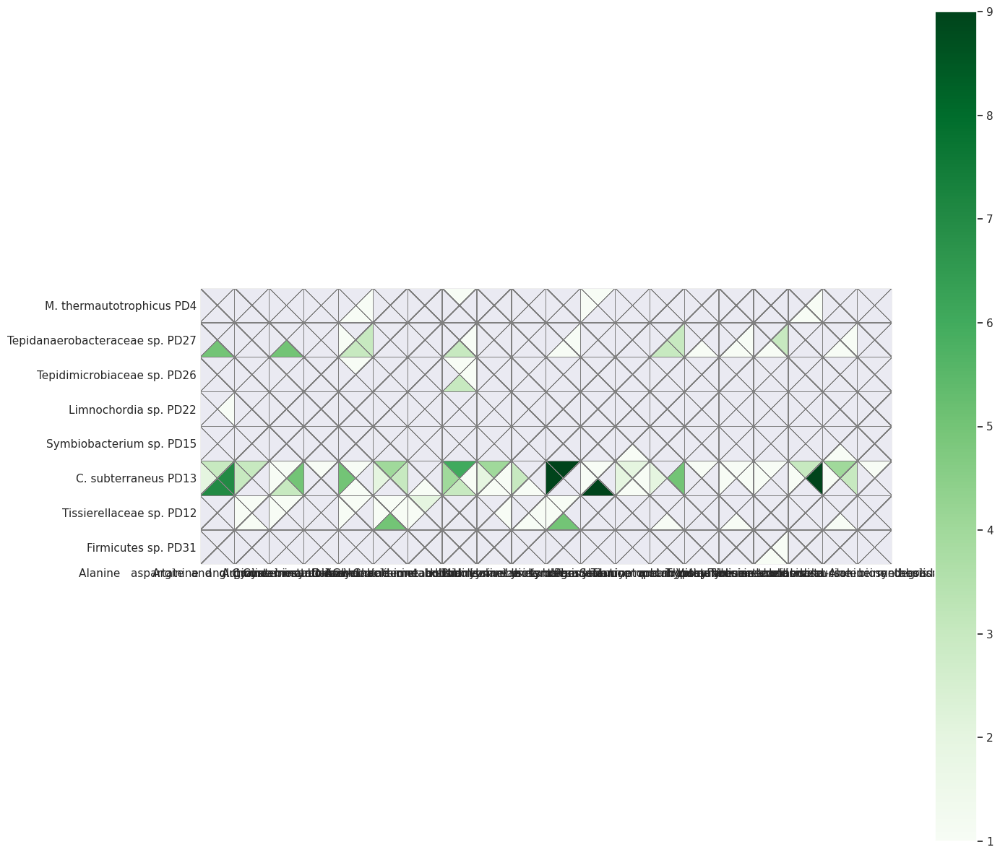

In [ ]:
# Graph the results
mags = aaExpression['MAG'].unique()
aaExpression['MAG'] = pd.Categorical(aaExpression['MAG'],categories=mags)  # fix an ordering
df_piv = aaExpression.pivot_table(index='MAG', columns='Metabolism')
M = len(df_piv.columns) // 4
N = len(df_piv)
values = [df_piv[dir] for dir in
          ['c1', 'c2', 'aa', 'aaab']]  # these are the 4 column names in df

values2 = []
for v in values:
    if type(v) != float:
        v.replace(0,np.nan,inplace=True)
        values2.append(v)
values = values2
triangul = triangulation_for_triheatmap(M, N)
cmaps = ['Greens'] * 4
# norms = [plt.Normalize(0, 1) for _ in range(4)]
fig, ax = plt.subplots(figsize=(15, 12))
imgs = [ax.tripcolor(t, np.ravel(val), cmap=cmap, ec='grey')
        # for t, val, cmap, norm in zip(triangul, values, cmaps, norms)]
        for t, val, cmap in zip(triangul, values, cmaps)]

ax.tick_params(length=0)
ax.set_xticks(range(M))
ax.set_xticklabels(df_piv['c1'].columns)
ax.set_yticks(range(N))
ax.set_yticklabels(df_piv.index)
ax.invert_yaxis()
ax.margins(x=0, y=0)
ax.set_aspect('equal', 'box')  # square cells

plt.colorbar(imgs[0], ax=ax)
plt.tight_layout()
plt.savefig(f'{outpath}aa_differential_expression.svg')
plt.savefig(f'{outpath}aa_differential_expression.pdf')
plt.show()

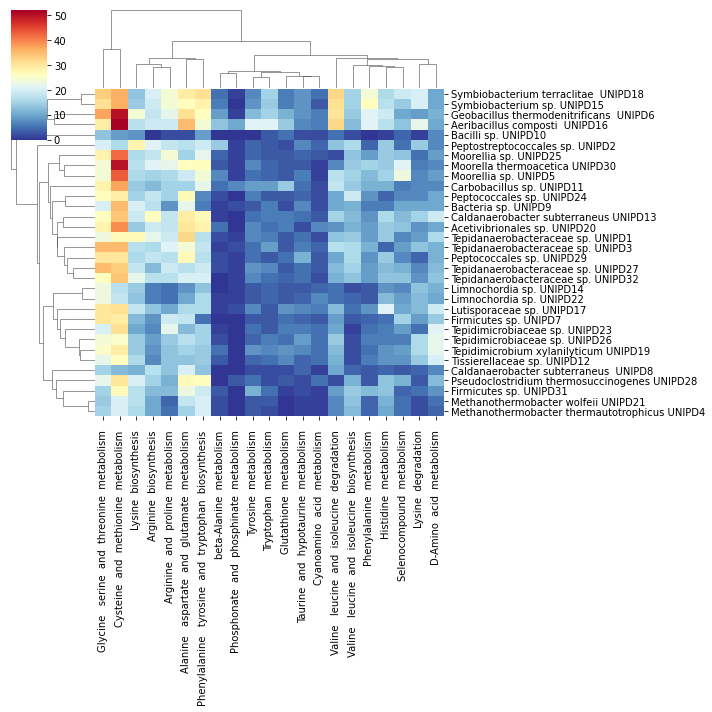

In [ ]:
sns.clustermap(aaMet2,cmap='RdYlBu_r')

# **Figure 5:** __Transporters + Simulations__

In [1]:
# Calculate growth rate
import pandas as pd
import numpy as np
import scipy.stats as ss
import seaborn as sns
import matplotlib.pyplot as plt
import os

### __AA Transporters - Save__

In [ ]:
import pandas as pd

df = pd.read_csv(f"{path}tables/tcdb.table.tsv",sep='\t')
coverage = pd.read_csv(f'{path}tables/relative_abundance_coveredOver50.tsv',sep='\t', index_col=0)
def chooseBest(df):
    df.sort_values(by='pident').sort_values(by='evalue')

df2 = pd.DataFrame(columns=df.columns)
for gene in df['qseqid'].unique():
    dftmp = df[df['qseqid'] == gene]
    # choose best
    df2 = pd.concat([df2,dftmp.sort_values(by='pident').sort_values(by='evalue').head(n=1)])
df3 = df2[df2['pident'] > 25]
transporters = df3[df3['evalue'] < 1e-5]
transporters.to_csv(f'{path}tables/blast_transporters.tsv',sep='\t')

/tmp/ipykernel_16950/2462705106.py:12: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,dftmp.sort_values(by='pident').sort_values(by='evalue').head(n=1)])


In [ ]:
tr = []
tr_aa = []
tr_aa_used = {}
not_aa = []

names = {}
with open(f'{path}tables/names.list.tsv') as f:
    for line in f:
        old,new = line.split("\t")
        new = new.replace("\n","")
        names[old] = new
names

transporters_aa = pd.read_csv(f'{path}db/transporters.aa2.txt',sep='\t')
family = transporters_aa['Family'].unique()
idxToRemove = []
for i in transporters.itertuples():
    idx = i[0]
    t = i[2]
    gene = i[1]
    if 'concoct' not in gene:
        mag = names[gene.split("_")[0]]
    else:
        g = '_'.join(gene.split("_")[0:3])
        mag = names[g]
    transporters.loc[idx,'MAG'] = mag
    if mag in coverage.index:
        t = t.split("|")[-1]
        transporters.loc[idx,'TC'] = t
        if t in family:
            tr_aa.append(t)
            transporters.loc[idx,'Family'] = 'AA'
        else:
            t2 = '.'.join(t.split(".")[0:3])
            if t2 in family:
                tr_aa.append(t)
                transporters.loc[idx,'Family'] = 'AA'
            else:
                not_aa.append(t)
                transporters.loc[idx,'Family'] = 'NN'
        if t not in tr:
            tr.append(t)
    else:
        idxToRemove.append(idx)
transporters.to_csv(f'{path}tables/blast_transporters_mod.tsv',sep='\t')

/tmp/ipykernel_16950/4281303225.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  transporters.loc[idx,'MAG'] = mag
/tmp/ipykernel_16950/4281303225.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'Tepidanaerobacteraceae sp. UNIPD1' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  transporters.loc[idx,'MAG'] = mag
/tmp/ipykernel_16950/4281303225.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [ ]:
transporters = transporters.loc[~transporters.index.isin(idxToRemove)]
transporters.to_csv(f'{path}tables/blast_transporters_mod2.tsv',sep='\t')

### __AA-Transporters - Load__

In [ ]:
transporters = pd.read_csv(f'{path}tables/blast_transporters_mod3.tsv',sep='\t', index_col=0)
# Cuanto representa del genoma?
print (len(transporters),len(transporters[transporters['evalue'] < 1e-30]))
print (len(transporters[transporters['Family']=='AA']),len(transporters[(transporters['evalue'] < 1e-30) & (transporters['Family'] == 'AA')]))
transporters2 = transporters[transporters['evalue'] < 1e-30]
transporters2 = transporters2[transporters2['bitscore'] >= 140]
transporters2.reset_index(inplace=True)
transporters2.drop('index',axis=1,inplace=True)

10981 7906
932 778


In [35]:
# Change MAG names
mag_names = {'Caldanaerobacter subterraneus UNIPD13':'C. subterraneus PD13',
             'Carbobacillus sp. UNIPD11':'Carbobacillus sp. PD11',
             'Firmicutes sp. UNIPD31': 'Firmicutes sp. PD31',
             'Firmicutes sp. UNIPD7': 'Firmicutes sp. PD7',
             'Limnochordia sp. UNIPD14': 'Limnochordia sp. PD14',
             'Limnochordia sp. UNIPD22': 'Limnochordia sp. PD22',
             'Lutisporaceae sp. UNIPD17': 'Lutisporaceae sp. PD17',
             'Methanothermobacter thermautotrophicus UNIPD4': 'M. thermautotrophicus PD4',
             'Moorellia sp. UNIPD5':'Moorellia sp. PD5',
             'Peptococcales sp. UNIPD24': 'Peptococcales sp. PD24',
             'Peptococcales sp. UNIPD29': 'Peptococcales sp. PD29',
             'Symbiobacterium sp. UNIPD15': 'Symbiobacterium sp. PD15',
             'Tepidanaerobacteraceae sp. UNIPD1':'Tepidanaerobacteraceae sp. PD1',
             'Tepidanaerobacteraceae sp. UNIPD27': 'Tepidanaerobacteraceae sp. PD27',
             'Tepidanaerobacteraceae sp. UNIPD3': 'Tepidanaerobacteraceae sp. PD3',
             'Tepidanaerobacteraceae sp. UNIPD32': 'Tepidanaerobacteraceae sp. PD32',
             'Tepidimicrobiaceae sp. UNIPD23': 'Tepidimicrobiaceae sp. PD23',
             'Tepidimicrobiaceae sp. UNIPD26': 'Tepidimicrobiaceae sp. PD26',
             'Tepidimicrobium xylanilyticum UNIPD19': 'T. xylanilyticum PD19',
             'Tissierellaceae sp. UNIPD12':'Tissierellaceae sp. PD12',
             'Methanothermobacter wolfeii UNIPD21': 'M. wolfeii PD21',
             'Pseudoclostridium thermosuccinogenes UNIPD28': 'P. thermosuccinogenes PD28',
             'Moorellia sp. UNIPD25':'Moorellia sp. PD25',
             'Bacilli sp. UNIPD10':'Bacilli sp. PD10',
             'Bacteria sp. UNIPD9':'Bacteria sp. PD9',
             'Symbiobacterium terraclitae  UNIPD18': 'S. terraclitae PD18'}


In [36]:
for i in transporters2.itertuples():
    name = i[13]
    transporters2.loc[i[0],'MAG'] = mag_names[name]

In [ ]:
# Add transporters from gapseq
gapseq_transporter_df = pd.read_csv(f'{path}tables/gapseq.transporters.all.tab',sep='\t',index_col=0)
gapseq_transporter_df.drop('id',inplace=True)
gapseq_transporter_df.reset_index(inplace=True)
gapseq_transporter_df2 = gapseq_transporter_df[gapseq_transporter_df['bitscore'].astype('float') >= 140]

# Gapseq AA list
gapseq_aa = []
with open(f'{path}tables/gapseq.aa.list.txt')as f:
    for line in f:
        gapseq_aa.append(line.replace("\n",""))

gene_mags = {}
mags_genes = {}
with open(f'{path}tables/names.list.tsv')as f:
    for line in f:
        old,new = line.split("\t")
        gene_mags[old] = new.replace("\n","")
        mags_genes[new.replace("\n","")] = old

# Compare all the transporters and add only if the gapseq ID differs from the one that I already had
notAdded = []
notMAGs = []
for i in gapseq_transporter_df2.itertuples():
    tc = i[2]
    gene = i[11]
    bit = i[9]
    tc_gene = list(transporters2[transporters2['qseqid'] == gene]['TC'])
    if 'concoct' in gene:
        mag = gene_mags['_'.join(gene.split("_")[0:3])]
    else:
        mag = gene_mags[gene.split("_")[0]]
    if tc not in tc_gene:
        if tc in gapseq_aa:
            family = 'AA'
        else:
            family = 'NN'
        transporters2.loc[len(transporters2)] = (gene,tc,'-','-','-','-','-','-','-','-','-',
                                                 bit,mag,tc,family)
    else:
        notAdded.append(i[0])

In [40]:
print(len(transporters2[transporters2['MAG'] == 'M. thermautotrophicus PD4']))
print(len(transporters2[(transporters2['MAG'] == 'M. thermautotrophicus PD4') & (transporters2['Family'] == 'AA')]))

411
34


In [ ]:
# %
df = pd.DataFrame(columns=['MAG','Total Genes','Total Transporters','% Transporters','AA transporters'])
number_of_genes = {}
with open(f'{path}tables/number_of_genes.txt')as file:
    for line in file:
        line = line.replace("\n","")
        mag,number = line.split("\t")
        number = int(number)
        number_of_genes[mag] = number

for mag in transporters2.MAG.unique():
    dftmp = transporters2[transporters2['MAG'] == mag]
    qtr = len(transporters2[transporters2['MAG'] == mag].qseqid.unique())
    aa_transporters = len(dftmp[dftmp['Family'] == 'AA'].qseqid.unique())
    mag2 = mags_genes[mag]
    total = number_of_genes[mag2]
    perc = (qtr/total)*100
    df.loc[len(df)] = (mag,total,qtr,perc,aa_transporters)

In [47]:
# Export data
df.to_clipboard()

,MAG,Total Genes,Total Transporters,% Transporters,AA transporters
0,M. thermautotrophicus PD4,1818,146,8.030803,11
1,M. wolfeii PD21,1864,144,7.725322,9
2,Carbobacillus sp. PD11,2357,340,14.425117,45
3,Tissierellaceae sp. PD12,2284,273,11.952715,43
4,Limnochordia sp. PD14,2152,313,14.544610,27
5,Limnochordia sp. PD22,2267,332,14.644905,31
6,P. thermosuccinogenes PD28,3562,413,11.594610,43
7,Peptococcales sp. PD29,2723,301,11.053985,43
8,Tepidanaerobacteraceae sp. PD3,2620,302,11.526718,59
9,Moorellia sp. PD5,2615,350,13.384321,37


#### __Transporter expression__

In [ ]:
expression = pd.read_csv(f'{path}tables/expression_only_norm.results.csv',sep=',',index_col=0)
expression = pd.read_csv(f'{path}tables/expression.log2.csv',sep=',',index_col=0)
transporters_expression = pd.DataFrame(columns=['MAG','Gene','TCDB','Type','Control','AA','AA+Ab'])
not_expressed = []
expressed = []
for i in transporters2.itertuples():
    gene = i[1]
    if gene in expression.index:
        expressed.append(gene)
        old = expression.loc[gene]['MAG']
        mag = mag_names[" ".join(old.split("_"))]
        tcdb = i[14]
        tipo = i[15]
        control = expression.loc[gene][['C1','C2','C3']].mean()
        aa = expression.loc[gene][['AA1','AA2','AA3']].mean()
        aaab = expression.loc[gene][['AAAb1','AAAb2']].mean()
        transporters_expression.loc[len(transporters_expression)] = (mag,gene,tcdb,tipo,control,aa,aaab)
    else:
        not_expressed.append(gene)

print (f"Expressed transporters: {len(transporters_expression)} out of {len(transporters2)}")
print (f"Expressed AA: {len(transporters_expression[transporters_expression['Type'] == 'AA'])} out of {len(transporters2[transporters2['Family']=='AA'])}")

Expressed transporters: 11893 out of 19647
Expressed AA: 1411 out of 2620


In [52]:
# Modify the dataframe to have only one gene 
transporters_expression2 = pd.DataFrame(columns=['MAG','Gene','TCDB','Type','Control','AA','AA+Ab'])
for gene in transporters_expression.Gene.unique():
    dftmp = transporters_expression[transporters_expression['Gene'] == gene]
    if len(dftmp) > 1:
        tcs = []
        family = 'NN'
        for i in dftmp.itertuples():
            mag = i[1]
            tc = i[3]
            if tc not in tcs:
                tcs.append(tc)
            type = i[4]
            if type == 'AA':
                family = 'AA'
            control = i[5]
            aa = i[6]
            aaab = i[7]
        transporters_expression2.loc[len(transporters_expression2)] = (mag,gene,tcs,family,control,aa,aaab)
    else:
        transporters_expression2.loc[len(transporters_expression2)] = dftmp.loc[dftmp.index[0]]


In [ ]:
for mag,expr in transporters_expression2[transporters_expression2['Type'] == 'AA'].MAG.value_counts().items():
    idx = df[df['MAG'] == mag.replace("_"," ")].index
    df.loc[idx,'AA expressed'] = expr
# Export data to Transporters-MAGs

In [ ]:
transporters_expression2.to_csv(f'{path}tables/transporters.expression3.tsv',sep='\t')

In [ ]:
gapseq_aa_df = pd.read_csv(f'{path}tables/gapseq.transporters.aa.tsv', sep='\t',names=['tc','AA','bitscore','gene'])
gapseq_aa_df[['tc','AA']]

,tc,AA
0,2.A.23.3.1,Alanine
1,2.A.23.3.2,Alanine
2,2.A.25.1.10,Alanine
3,2.A.25.1.3,Alanine
4,2.A.25.1.5,Alanine
...,...,...
4970,2.A.3.8.3,Tryptophan
4971,2.A.3.8.3,Phenylalanine
4972,2.A.76.1.4,Cysteine
4973,2.A.76.1.4,Cysteine


## Transporter expression

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import itertools
##################################
transporters_expression = pd.read_csv(f'{path}/tables/transporters.expression3.tsv',sep='\t', index_col=0)
aa_transporters_presence = pd.read_csv(f'{path}tables/transporter.aminoacids.presence.tsv', sep='\t', index_col=0)

# Add the information from gapseq
gapseq_aa_df = pd.read_csv(f'{path}tables/gapseq.transporters.aa.tsv', sep='\t', names=['tc','AA','bitscore','gene'])
for i in gapseq_aa_df.itertuples():
    tc = i[1]
    aa = i[2]
    if tc not in aa_transporters_presence.index:
        aa_transporters_presence.reindex(aa_transporters_presence.index.values.tolist()+[tc])
    aa_transporters_presence.loc[tc,aa] = 1

mags_to_plot = ['T. xylanilyticum PD19',
'Tepidanaerobacteraceae sp. PD32',
'Firmicutes sp. PD7',
'Firmicutes sp. PD31',
'Tepidimicrobiaceae sp. PD23',
'Tepidanaerobacteraceae sp. PD3',
'Limnochordia sp. PD22',
'Carbobacillus sp. PD11',
'Lutisporaceae sp. PD17',
'Tepidanaerobacteraceae sp. PD27',
'Peptococcales sp. PD24',
'Moorellia sp. PD5',
'Tepidimicrobiaceae sp. PD26',
'Symbiobacterium sp. PD15',
'Limnochordia sp. PD14',
'Tissierellaceae sp. PD12',
'C. subterraneus PD13',
'M. thermautotrophicus PD4']

ordered_mags = mags_to_plot[::-1]

# Create table for each MAG
transporter_aminoacids_df = pd.DataFrame(columns=['MAG','ID','AAs','Control','AA','AA+Ab'])
discarded = []

for tcdb_id in aa_transporters_presence.index:
    dftmp = aa_transporters_presence.loc[tcdb_id][aa_transporters_presence.columns[2:]] > 0
    t_mags = transporters_expression[transporters_expression['TCDB'] == tcdb_id]
    for aa in list(dftmp[dftmp==True].index):
        if len(t_mags) == 1:
            mag = t_mags.MAG.values[0]
            # if name in mag_names.keys():
                # mag = mag_names[name]
            control = t_mags['Control'].values[0]
            aa_e = t_mags['AA'].values[0]
            aaab = t_mags['AA+Ab'].values[0]
            transporter_aminoacids_df.loc[len(transporter_aminoacids_df)] = (mag,tcdb_id,aa,control,aa_e,aaab)
            
            # else: discarded.append(name)
        else:
            for i in t_mags.itertuples():
                mag = i[1]
                # if name in mag_names:
                    # mag = mag_names[name]
                control = i[5]
                aa_e = i[6]
                aaab = i[7]
                transporter_aminoacids_df.loc[len(transporter_aminoacids_df)] = (mag,tcdb_id,aa,control,aa_e,aaab)
                # else: discarded.append(name)

In [20]:
# Transform table 
AA_order = ['Alanine','Arginine','Aspartate','Cysteine','Glutamate','Glutamine','Glycine','Leucine','Lysine','Methionine',
            'Proline','Serine','Threonine','Tryptophan','Unknown AA Transporter']

columns_order = []
for mag in ordered_mags:
    columns_order.append(mag+'_1')
    columns_order.append(mag+'_2')
    columns_order.append(mag+'_3')

transporter_aminoacids_df_mags = pd.DataFrame(columns=columns_order, index=AA_order)
for mag in ordered_mags:
    dftmp = transporter_aminoacids_df[transporter_aminoacids_df['MAG'] == mag]
    for aa_ in dftmp.AAs.unique():
        dftmp2 = dftmp[dftmp['AAs'] == aa_]
        if len(dftmp2) > 1:
            col_1 = dftmp2.Control.median()
            col_2 = dftmp2.AA.median()
            col_3 = dftmp2['AA+Ab'].median()
            transporter_aminoacids_df_mags.loc[aa_,mag+'_1'] = col_1
            transporter_aminoacids_df_mags.loc[aa_,mag+'_2'] = col_2
            transporter_aminoacids_df_mags.loc[aa_,mag+'_3'] = col_3
        else:
            col_1 = dftmp2.Control.values[0]
            col_2 = dftmp2.AA.values[0]
            col_3 = dftmp2['AA+Ab'].values[0]
            transporter_aminoacids_df_mags.loc[aa_,mag+'_1'] = col_1
            transporter_aminoacids_df_mags.loc[aa_,mag+'_2'] = col_2
            transporter_aminoacids_df_mags.loc[aa_,mag+'_3'] = col_3


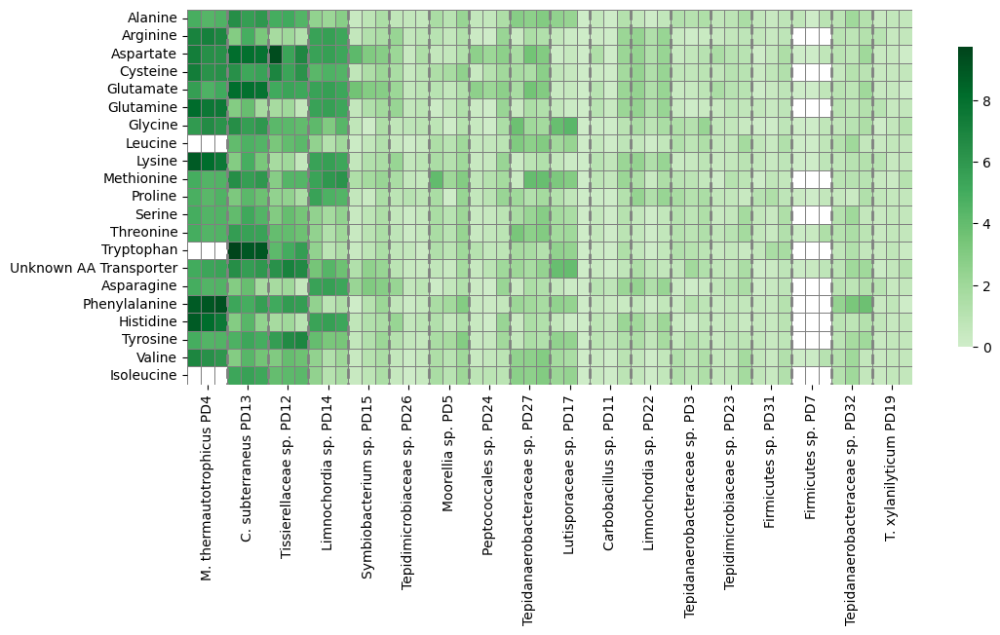

In [ ]:
fig, ax = plt.subplots(figsize=(12, 5))
transporter_aminoacids_df_mags = transporter_aminoacids_df_mags.apply(pd.to_numeric, errors="coerce")
nan_mask = transporter_aminoacids_df_mags.isna()  # Store original NaN positions

transporter_aminoacids_df_mags_log = np.log(transporter_aminoacids_df_mags+1)

# Create the heatmap
transporter_aminoacids_df_mags_log = transporter_aminoacids_df_mags_log.fillna(0)  # Replace NaNs with 0

sns.heatmap(
    transporter_aminoacids_df_mags,
    cmap='Greens',
    linewidths=0.5,
    linecolor="gray",
    center=3.5,
    mask=nan_mask,
    cbar_kws={"shrink": 0.8},
    ax=ax,
    # alpha=0.8
)

sns.heatmap(
    transporter_aminoacids_df_mags,
    cmap="Greys_r",  # Use grayscale for NaNs
    linewidths=0.5,
    linecolor="grey",
    cbar=False,  # No second colorbar
    ax=ax,
    vmin=-8,
    vmax=2,
    # annot=True,
    mask=~nan_mask,  # Invert mask to apply gray only to NaN areas
    # alpha=1  # Adjust transparency
)

# Add vertical lines every three columns to separate conditions
for i in range(3, transporter_aminoacids_df_mags.shape[1], 3):
    ax.vlines(i, 0, transporter_aminoacids_df_mags.shape[0], color="gray", linestyle="--", linewidth=2)

# Adjust x-axis ticks
xtick_positions = np.arange(1, transporter_aminoacids_df_mags.shape[1], 3)  # Center of each triplet
xtick_labels = [col.split('_')[0] for col in transporter_aminoacids_df_mags.columns[::3]]  # Compound base names
ax.set_xticks(xtick_positions + 0.5)  # Center ticks
ax.set_xticklabels(xtick_labels, rotation=90, fontsize=10)

# Adjust y-axis ticks 
ytick_positions = np.arange(transporter_aminoacids_df_mags.shape[0])
ax.set_yticks(ytick_positions + 0.5)  # Center ticks

# Save the figure
plt.savefig(f"{outpath}transporter_aminoacids_mags2.svg")
plt.savefig(f"{outpath}transporter_aminoacids_mags2.pdf")

#### Diferential expression

In [ ]:
mags_to_plot = ['T. xylanilyticum PD19',
'Tepidanaerobacteraceae sp. PD32',
'Firmicutes sp. PD7',
'Firmicutes sp. PD31',
'Tepidimicrobiaceae sp. PD23',
'Tepidanaerobacteraceae sp. PD3',
'Limnochordia sp. PD22',
'Carbobacillus sp. PD11',
'Lutisporaceae sp. PD17',
'Tepidanaerobacteraceae sp. PD27',
'Peptococcales sp. PD24',
'Moorellia sp. PD5',
'Tepidimicrobiaceae sp. PD26',
'Symbiobacterium sp. PD15',
'Limnochordia sp. PD14',
'Tissierellaceae sp. PD12',
'C. subterraneus PD13',
'M. thermautotrophicus PD4']

ordered_mags = mags_to_plot[::-1]

/tmp/ipykernel_1619262/1459025582.py:66: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


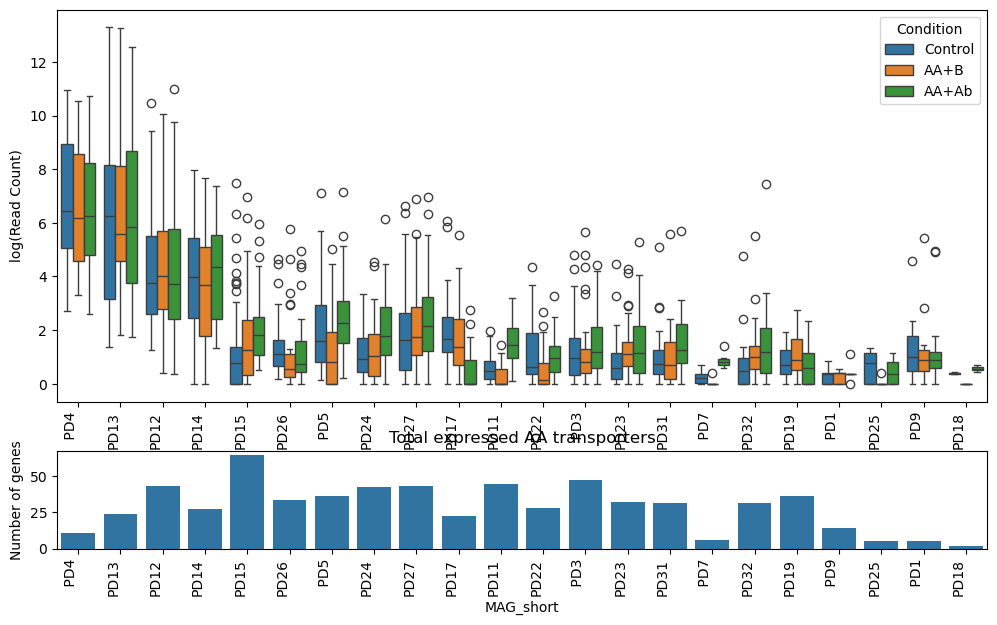

In [ ]:
# Add differential expression data

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

c = pd.read_csv(f'{path}tables/global_expression_data.tsv',sep='\t', index_col=1)

# Data
tr_expr = pd.read_csv(f'{path}tables/transporters.expression3.tsv', sep='\t', index_col=0)
tr_expr = tr_expr[tr_expr['Type'] == 'AA']
tr_expr.drop('Type', axis=1, inplace=True)

for i in tr_expr.itertuples():
    mag = i[1]
    mag = mag.replace("_"," ").replace("UNIPD","PD")
    tr_expr.loc[i[0],'MAG'] = mag

# Combine data
df_melted = pd.melt(tr_expr, id_vars=["MAG", "Gene", "TCDB"], var_name="Type", value_name="Value")

# Count gene by MAG
genes_count = tr_expr.groupby("MAG")["Gene"].count().reset_index()
genes_count = genes_count[genes_count['Gene'] > 1]

# Filtering
df_melted = df_melted[df_melted['MAG'].isin(list(genes_count.MAG))]

# MAGs' order
genes_count = genes_count.sort_values(by='Gene',ascending=False)

# Last 4 characters of the MAG
df_melted['MAG_short'] = df_melted['MAG'].apply(lambda x: x[-4:])
genes_count['MAG_short'] = genes_count['MAG'].apply(lambda x: x[-4:])

# Sort MAGs
df_melted['MAG'] = pd.Categorical(df_melted['MAG'], categories=ordered_mags, ordered=True)
df_melted.loc[df_melted['Type'] == 'AA', 'Type'] = 'AA+B'
df_melted = df_melted.sort_values(['Type','MAG'],ascending=[False,True])
genes_count['MAG'] = pd.Categorical(genes_count['MAG'], categories=ordered_mags, ordered=True)
genes_count = genes_count.sort_values('MAG')

# Boxplot
plt.figure(figsize=(12, 7))
grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.2)

plt.subplot(grid[0:3, :])
boxplot = sns.boxplot(x="MAG_short", y=df_melted['Value'], hue="Type", data=df_melted)
plt.xlabel("MAG")
plt.ylabel("log(Read Count)")
plt.xticks(rotation=90, ha='right')
plt.legend(title="Condition")

plt.subplot(grid[3, :])
barplot = sns.barplot(x="MAG_short", y="Gene", data=genes_count)
plt.title("Total expressed AA transporters")
# plt.xlabel("MAG")
plt.ylabel("Number of genes")
plt.xticks(rotation=90, ha='right')

plt.tight_layout()
plt.savefig(f'{outpath}transporters3.svg')
plt.savefig(f'{outpath}transporters3.pdf')

In [73]:
# Count the number of genes overexpressed for each MAG
transporterDiffExpression = pd.DataFrame(index=ordered_mags,columns=['Control','AA','AA+Ab'])
transporterDiffExpression.fillna(0,inplace=True)
globalExpression2 = globalExpression[globalExpression['pvalue'] <= 0.05]
dfs = []
for mag in ordered_mags:
    for gene in df_melted[df_melted['MAG'] == mag].Gene.unique():
        if gene in list(globalExpression2.GENE):
            diffExprGene = globalExpression2[globalExpression2['GENE'] == gene]
            try: #type(diffExprGene) == pd.core.frame.DataFrame:
                for i in diffExprGene.index:
                    lfc = diffExprGene.loc[i]['log2FoldChange']
                    condition = diffExprGene.loc[i]['Condition']
                    if lfc > 0:
                        if condition == 'AA':
                            transporterDiffExpression.loc[mag,'AA'] += 1
                        else:
                            transporterDiffExpression.loc[mag,'AA+Ab'] += 1
                    else:
                        transporterDiffExpression.loc[mag,'Control'] += 1
            except:
                dfs.append(diffExprGene)

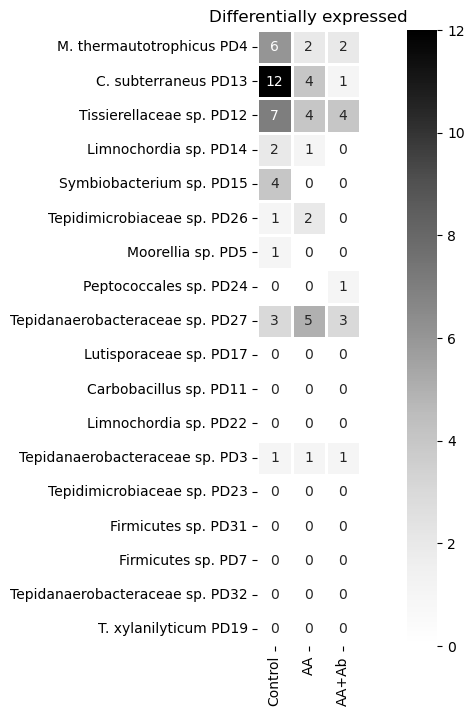

In [30]:
# Suponiendo que tienes el DataFrame original llamado df

# Convertir el DataFrame a una sola fila
single_row = transporterDiffExpression.values.flatten()

# Crear un nuevo DataFrame con una sola fila

plt.figure(figsize=(12, 8))
sns.heatmap(transporterDiffExpression, annot=True, cmap="Greys", cbar=True, square=True,
            linewidths=1)
plt.title("Differentially expressed")
plt.xlabel("")
plt.ylabel("")
plt.savefig('heatma_differential_expression.pdf')
plt.show()

In [76]:
# globalExpression2.GENE
aminoacids_transporters = transporters2[transporters2['Family'] == 'AA']
aminoacids_transporters.rename(columns={'qseqid':'GENE'},inplace=True)
df3 = aminoacids_transporters.merge(globalExpression2, on='GENE', how='left')
df3[df3['pvalue'] <= 0.05].to_clipboard()

/tmp/ipykernel_1619262/3893858544.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aminoacids_transporters.rename(columns={'qseqid':'GENE'},inplace=True)


In [77]:
globalExpression_p = '~/Documents/esteban/experiments/aa_ab/tables/deg_analysis.csv'
globalExpression = pd.read_csv(globalExpression_p)
globalExpression2 = globalExpression[globalExpression['pvalue'] <= 0.05]
globalExpression2 = globalExpression[globalExpression['pvalue'] <= 0.05].copy()
globalExpression2.rename(columns={'Unnamed: 0':'GENE'},inplace=True)

df3 = aminoacids_transporters.merge(globalExpression2, on='GENE', how='left')
df4 = df3[df3['pvalue'] <= 0.05]
print(f"Overexpressed genes in Control (AA-Control): {(df4[df4['Condition'] == 'AA-ctrl']['log2FoldChange'] < 0).sum()}")
print(f"Overexpressed genes in AA (AA-Control): {(df4[df4['Condition'] == 'AA-ctrl']['log2FoldChange'] > 0).sum()}")
print(f"Overexpressed genes in Control (AAAb-Control): {(df4[df4['Condition'] == 'AAAb-ctrl']['log2FoldChange'] < 0).sum()}")
print(f"Overexpressed genes in AA+Ab (AAAb-Control): {(df4[df4['Condition'] == 'AAAb-ctrl']['log2FoldChange'] > 0).sum()}")
print(f"Overexpressed genes in AA (AA-AA+Ab): {(df4[df4['Condition'] == 'AA-AAAb']['log2FoldChange'] > 0).sum()}")
print(f"Overexpressed genes in AA+Ab (AA-AA+Ab): {(df4[df4['Condition'] == 'AA-AAAb']['log2FoldChange'] < 0).sum()}")


Overexpressed genes in Control (AA-Control): 53
Overexpressed genes in AA (AA-Control): 53
Overexpressed genes in Control (AAAb-Control): 65
Overexpressed genes in AA+Ab (AAAb-Control): 36
Overexpressed genes in AA (AA-AA+Ab): 51
Overexpressed genes in AA+Ab (AA-AA+Ab): 42


In [111]:
# Cuantos genes?

# for gene in df4#.pivot_table(index=['MAG_x'], aggfunc='size')
df5 = pd.DataFrame(columns=['Gene','MAG','TCs','log2FoldChange','lfcSE','stat','pvalue','padj','Condition'])
for gene in df4.GENE.unique():
    dftmp1 = df4[df4['GENE'] == gene]
    for condition in dftmp1.Condition.unique():
        dftmp = dftmp1[dftmp1['Condition'] == condition]
        basemean = dftmp.baseMean.unique()
        mag = dftmp.MAG_x.unique()[0]
        tcs = list(dftmp.TC.unique())
        lfcSE = dftmp.lfcSE.unique()[0]
        stat = dftmp.stat.unique()[0]
        pvalue = dftmp.pvalue.unique()[0]
        padj = dftmp.padj.unique()[0]
        condition = dftmp.Condition.unique()[0]
        lfc = dftmp.log2FoldChange.unique()[0]
        df5.loc[len(df5)] = (gene,mag,tcs,lfc,lfcSE,stat,pvalue,padj,condition)

In [112]:
df5.pivot_table(index=['MAG'], aggfunc='size')

MAG
Bacteria sp. PD9                    3
C. subterraneus PD13               22
Firmicutes sp. PD31                 1
Limnochordia sp. PD14               8
Limnochordia sp. PD22               1
Lutisporaceae sp. PD17              3
M. thermautotrophicus PD4          10
Moorellia sp. PD5                   3
Peptococcales sp. PD24              8
Symbiobacterium sp. PD15            5
Tepidanaerobacteraceae sp. PD27    14
Tepidanaerobacteraceae sp. PD3      8
Tepidanaerobacteraceae sp. PD32     2
Tepidimicrobiaceae sp. PD23         1
Tepidimicrobiaceae sp. PD26         5
Tissierellaceae sp. PD12           22
dtype: int64

In [113]:
print(f"Overexpressed genes in Control (AA-Control): {(df5[df5['Condition'] == 'AA-ctrl']['log2FoldChange'] < 0).sum()}")
print(f"Overexpressed genes in AA (AA-Control): {(df5[df5['Condition'] == 'AA-ctrl']['log2FoldChange'] > 0).sum()}")
print(f"Overexpressed genes in Control (AAAb-Control): {(df5[df5['Condition'] == 'AAAb-ctrl']['log2FoldChange'] < 0).sum()}")
print(f"Overexpressed genes in AA+Ab (AAAb-Control): {(df5[df5['Condition'] == 'AAAb-ctrl']['log2FoldChange'] > 0).sum()}")
print(f"Overexpressed genes in AA (AA-AA+Ab): {(df5[df5['Condition'] == 'AA-AAAb']['log2FoldChange'] > 0).sum()}")
print(f"Overexpressed genes in AA+Ab (AA-AA+Ab): {(df5[df5['Condition'] == 'AA-AAAb']['log2FoldChange'] < 0).sum()}")


Overexpressed genes in Control (AA-Control): 20
Overexpressed genes in AA (AA-Control): 23
Overexpressed genes in Control (AAAb-Control): 24
Overexpressed genes in AA+Ab (AAAb-Control): 17
Overexpressed genes in AA (AA-AA+Ab): 16
Overexpressed genes in AA+Ab (AA-AA+Ab): 16


In [114]:
# Create heatmap for each MAG and comparison
samples = ['Control','AA','AA+Ab']
idxs = list(df4.Condition.unique())
idxs = [idxs[1],idxs[0],idxs[2]]
cols = []
for mag in ordered_mags:
    for sample in samples:
        col = sample + '_' + mag
        cols.append(col)
diff_plot = pd.DataFrame(index=idxs,columns=cols)
for name in df4.MAG_y.unique():
    df_mag = df4[df4['MAG_y'] == name]
    mag = mag_names[name.replace("_"," ")]
    diff_plot.loc['AA-ctrl','Control_'+mag] = int((df4[(df4['Condition'] == 'AA-ctrl') & (df4['MAG_y'] == name)]['log2FoldChange'] < 0).sum())
    diff_plot.loc['AA-ctrl','AA_'+mag] = int((df4[(df4['Condition'] == 'AA-ctrl') & (df4['MAG_y'] == name)]['log2FoldChange'] > 0).sum())

    diff_plot.loc['AAAb-ctrl','Control_'+mag] = int((df4[(df4['Condition'] == 'AAAb-ctrl') & (df4['MAG_y'] == name)]['log2FoldChange'] < 0).sum())
    diff_plot.loc['AAAb-ctrl','AA+Ab_'+mag] = int((df4[(df4['Condition'] == 'AAAb-ctrl') & (df4['MAG_y'] == name)]['log2FoldChange'] > 0).sum())

    diff_plot.loc['AA-AAAb','AA_'+mag] = int((df4[(df4['Condition'] == 'AA-ctrl') & (df4['MAG_y'] == name)]['log2FoldChange'] < 0).sum())
    diff_plot.loc['AA-AAAb','AA+Ab_'+mag] = int((df4[(df4['Condition'] == 'AA-ctrl') & (df4['MAG_y'] == name)]['log2FoldChange'] > 0).sum())
diff_plot = diff_plot.fillna(np.nan)


In [115]:
# Create heatmap for each MAG and comparison
samples = ['Control','AA','AA+Ab']
idxs = list(df5.Condition.unique())
idxs = [idxs[1],idxs[0],idxs[2]]
cols = []
for mag in ordered_mags:
    for sample in samples:
        col = sample + '_' + mag
        cols.append(col)
diff_plot = pd.DataFrame(index=idxs,columns=cols)
for mag in df5.MAG.unique():
    df_mag = df5[df5['MAG'] == mag]

    diff_plot.loc['AA-ctrl','Control_'+mag] = int((df5[(df5['Condition'] == 'AA-ctrl') & (df5['MAG'] == mag)]['log2FoldChange'] < 0).sum())
    diff_plot.loc['AA-ctrl','AA_'+mag] = int((df5[(df5['Condition'] == 'AA-ctrl') & (df5['MAG'] == mag)]['log2FoldChange'] > 0).sum())

    diff_plot.loc['AAAb-ctrl','Control_'+mag] = int((df5[(df5['Condition'] == 'AAAb-ctrl') & (df5['MAG'] == mag)]['log2FoldChange'] < 0).sum())
    diff_plot.loc['AAAb-ctrl','AA+Ab_'+mag] = int((df5[(df5['Condition'] == 'AAAb-ctrl') & (df5['MAG'] == mag)]['log2FoldChange'] > 0).sum())

    diff_plot.loc['AA-AAAb','AA_'+mag] = int((df5[(df5['Condition'] == 'AA-ctrl') & (df5['MAG'] == mag)]['log2FoldChange'] < 0).sum())
    diff_plot.loc['AA-AAAb','AA+Ab_'+mag] = int((df5[(df5['Condition'] == 'AA-ctrl') & (df5['MAG'] == mag)]['log2FoldChange'] > 0).sum())
diff_plot = diff_plot.fillna(np.nan)


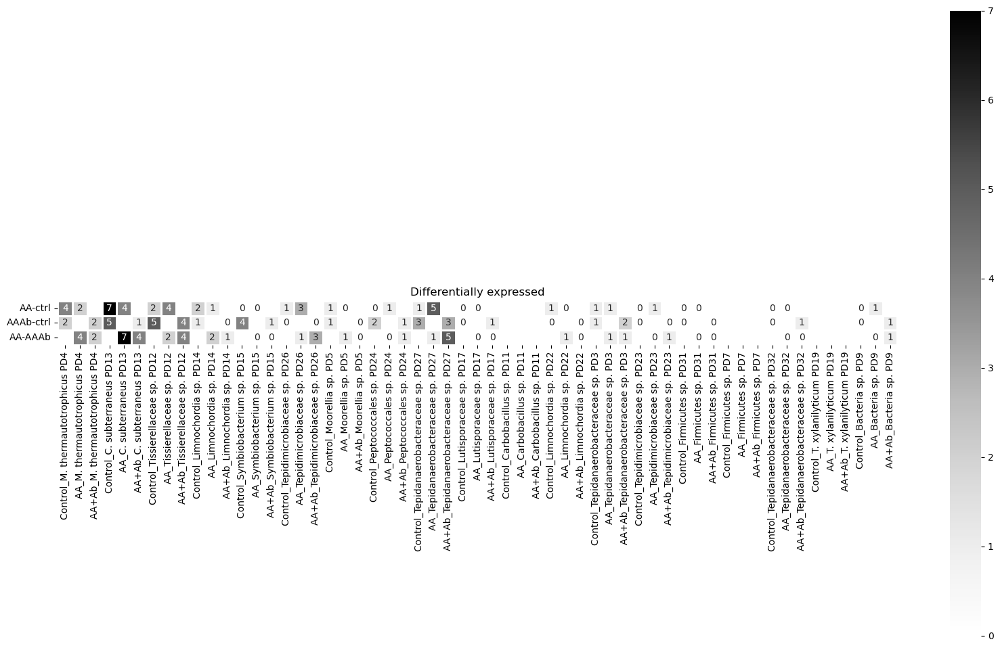

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from matplotlib.patches import Rectangle

mask = diff_plot.isna()

plt.figure(figsize=(20, 12))
ax = sns.heatmap(diff_plot, 
                 annot=True, 
                 cmap="Greys", 
                 cbar=True, 
                 square=True, 
                 linewidths=1)

plt.title("Differentially expressed")

# Overlay diagonal stripes for NaN cells
for i in range(diff_plot.shape[0]):
    for j in range(diff_plot.shape[1]):
        if mask.iloc[i, j]:
            rect = Rectangle(
                (j, i), 1, 1,
                linewidth=0,
                edgecolor='none',
                facecolor='none',
                hatch='//',
                alpha=0.8
            )
            ax.add_patch(rect)

plt.xlabel("")
plt.ylabel("")
plt.savefig('heatmap_differential_expression.pdf')
plt.show()


In [49]:
genes_count.MAG = genes_count.MAG.astype("category")
genes_count.MAG = genes_count.MAG.cat.set_categories(mags_to_plot)

In [117]:
df5.to_clipboard()

## __Simulations__

### __Correlation simulations & Fluxes__

In [ ]:
import os
import pandas as pd
import seaborn as sns

# Functions
def cpd_modelSeed_to_name(cpd_list):
    """Parse gapseq metabolites database"""
    seed_metabolites_df = pd.read_csv(f"{path}db/seed_metabolites_edited.tsv", sep="\t", index_col=0)
    cpd_modelSeed_to_name_dict = dict(seed_metabolites_df.loc[cpd_list, 'name'])
    return cpd_modelSeed_to_name_dict

def rxn_modelSeed_to_name(rxn_list):
    """Parse gapseq reactions database"""
    seed_reactions_f = f'{path}db/seed_reactions_corrected.tsv'
    seed_reactions_df = pd.read_csv(seed_reactions_f, sep='\t', index_col=0)
    return dict(seed_reactions_df.loc[rxn_list, 'name'])

#### Without blocking

In [ ]:
path_simulations = f'{path}simulations/'
def CheckFluxes(cpd,eof='m',path=path,sp=None):
    files = os.listdir(path_simulations)
    indices = ["Control_1_B","Control_2_B","Control_3_B","AA_1_B","AA_2_B","AA_3_B","AAAb_1_B","AAAb_2_B","AAAb_3_B",]
    df = pd.DataFrame(index=indices)
    columnas = []
    if eof == 'm':
        check = "exchanges"
    elif eof == "f":
        check = "fluxes"
    for f in files:
        if f.endswith(".csv") and check in f:
            # print (f, check)
            if check == "exchanges":
                df2 = pd.read_csv(f"{path_simulations}{f}", sep=",", index_col=0)
            elif check == "fluxes":
                df2 = pd.read_csv(f"{path_simulations}{f}", sep=",", index_col=[0,1])
            else:
                break
            if f.startswith(f"coco_{check}_"):
                f2 = f.replace(f"coco_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.none.csv","_c")
                
            elif f.startswith(f"base_{check}_"):
                f2 = f.replace(f"base_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.none.csv","_b")

            columnas.append(f2)
            for i in indices:
                try:
                    if check == "exchanges":
                        c = df2.loc[cpd][i]
                    elif check == "fluxes":
                        c = df2.loc[i,sp][cpd]
                except:
                    c = None
                # print (i,f2,c)
                df.loc[i,f2] = c

        columnas.sort()
    return df[columnas]

##########################################################################
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import PowerNorm
import pandas as pd
import seaborn as sns

##########################################################################
df = pd.read_csv(f"{path_simulations}coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.none.csv", index_col=[0,1])
coverage = pd.read_csv(f'{path}tables/coverage.mags.aminoacids.tsv',sep='\t',index_col=0)
aa_names_p = f'{path}tables/AAModelSeed2.tsv'
mags_names_f = f'{path}tables/names.list.tsv'

# Select only AA_1_B and AA_2_B
aa_samples = ['AA_1_B','AA_2_B','AA_3_B']
control_samples = ['Control_1_B','Control_2_B','Control_3_B']
aaab_samples = ['AAAb_1_B','AAAb_2_B']
samples = control_samples + aa_samples + aaab_samples
# Create a dictionary for the AA names
aa_seed = {}
aminoacids = []
with open(aa_names_p)as f:
    for line in f:
        seed = 'EX_'+line.split("\t")[0]+'_e'
        name = line.split("\t")[1].replace("\n","")
        aa_seed[seed] = name
        aminoacids.append(seed)

# Create a dictionary to replace the names of the MAGs
mags_names = {}
with open(mags_names_f)as f:
    for line in f:
        mag = line.split("\t")[0].replace(".","_")
        name = line.split("\t")[1].replace("\n","")
        mags_names[mag] = name

mags = set()
for samples in [aa_samples,control_samples,aaab_samples]:
    ms = list(coverage[samples].mean(axis=1).sort_values().tail(n=13).index)
    mags = mags | set(ms)
mags = set(['vamb.megahit.488']) | mags

# Create functionts to plot the AAs    
def CreateTable(samples,MAGs,cols=''):
    # Select the most abundant mags in those samples
    sure_to_keep = set(['L-Leucine','L-Aspartate','L-Valine'])
    mags = dict(coverage.loc[list(MAGs)][samples].mean(axis=1))
    amino = list(set(aminoacids) & set(df.columns))
    df2 = pd.DataFrame(columns=amino)
    # Create the table for the plot
    for m in mags.keys():
        v = mags[m]
        m = m.replace(".","_")
        ss = []
        for s in aa_samples:
            if (s,m) in df.index:
                ss.append((s,m))
        dftmp = df.loc[ss][amino]
        df1 = pd.DataFrame(dftmp.mean(),columns=[m])*(v/100)
        df2 = pd.concat([df2,df1.T])
        # df2 = df2.append(df1.T)
    df2 = df2.rename(columns=aa_seed,index=mags_names)
    if cols == '':
        filter = np.abs(df2).sum() > 0.00001
        cols = df2.loc[:,filter].columns.tolist()
        cols = list(set(cols) | sure_to_keep)
    df3 = df2[cols]
    return df3

# Plot several plots
def CreatePlot(dataframes,names,number):
    fig, axs = plt.subplots(nrows=number)
    # return sns.heatmap(df,cmap='RdBu_r',center=0)
    i = 0
    for df in dataframes:
        normalized_df = (df - df.mean()) / df.std()
        sns.clustermap(normalized_df, row_cluster=False,col_cluster=False,cmap="RdBu_r",ax=axs[i])
        i += 1

    return fig

# Print samples names
samples = []
for i in df.index:
    if i[0] not in samples:
        samples.append(i[0])

aa_samples = list(set(samples) & set(aa_samples))
control_samples = list(set(samples) & set(control_samples))
aaab_samples = list(set(samples) & set(aaab_samples))

print (samples)

['Control_1_B', 'Control_2_B', 'Control_3_B', 'AA_1_B', 'AA_2_B', 'AA_3_B', 'AAAb_1_B', 'AAAb_2_B']


In [ ]:
# Choose the best parameter
files = os.listdir(path_simulations)

# First create the file with the community growth rate
community = pd.DataFrame(columns=['Parameter','sample','Growth_rate'])
computeFluxes = f'{path_simulations}compute.fluxes.041224.out'
with open(computeFluxes)as file:
    enter = False
    enter2 = False
    for line in file:   
        if 'Running (' in line:
            l = line.split('(')[1]
            parameter = l.split(')')[0].replace(', ','_')
        if '>' in line:
            sample = line.replace('>','').replace('\n','').strip()
            enter = True
            enter2 = False
        if '--- CoCo ---\n' == line:
            enter2 = True
        if enter2 == True and '----------------------------------\n' == line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter, sample, gr)
        elif enter2 == True and 'Finished iter' in line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter,sample,gr)
        elif enter2 == True:
            line0 = line

# plot the community and relate them with OD
lnOD = pd.read_csv(f'{path}tables/ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}
grSimulation = {}
for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    while i < len(index)-1:
        j = 0
        while j < len(index):
            if index[j] != index[i]:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    if index[j] == 21 and index[i] == 19:
                        grSimulation[col] = gr
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i

grPD = pd.DataFrame.from_dict(gr_average, orient='index')
# sns.lineplot(data=grPD,x=grPD.index,y=0)
samplesSynonims = {'Control_1_B':'Control', 'Control_2_B':'Control.1', 'Control_3_B':'Control.2', 'AA_1_B':'AA', 'AA_2_B':'AA.1','AA_3_B':'AA.2',
            'AAAb_1_B':'AA+Ab','AAAb_2_B':'AA+Ab.1','AAAb_3_B':'AA+Ab.2'}
listas = []
for par in community.Parameter.unique():
    dftmp = community[community['Parameter'] == par]
    dftmp2 = dftmp.copy()
    for i in dftmp.itertuples():
        sample = i[2]
        sample2 = samplesSynonims[sample]
        dftmp2.loc[i[0],'GR_OD'] = gr_average[sample2]
    listas.append(dftmp2)

1.0_1.0_0.7_0.7_0.5 AA_3_B Couldn't run coco on sample AA_3_B
1.0_1.0_0.9_0.9_0.5 AA_3_B Couldn't run coco on sample AA_3_B
1.0_1.0_0.7_0.7_2.0 AA_3_B Couldn't run coco on sample AA_3_B
3.0_1.0_0.9_0.9_2.0 AA_3_B Couldn't run coco on sample AA_3_B
3.0_1.0_0.7_0.7_0.5 AAAb_2_B Couldn't run coco on sample AAAb_2_B
3.0_1.0_0.7_0.7_0.5 AAAb_2_B ----------------------------------------------
3.0_1.0_0.9_0.9_0.5 AAAb_2_B 0.5 standard deviations for the AAs
3.0_1.0_0.9_0.9_0.5 AA_3_B Couldn't run coco on sample AA_3_B


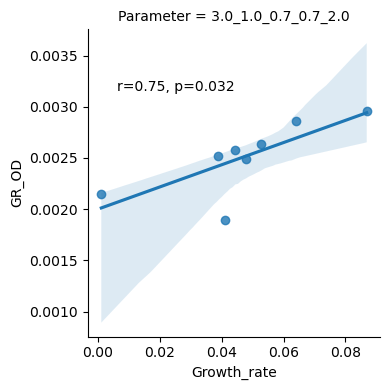

In [ ]:
import seaborn as sns
import scipy as sp

# g = sns.lmplot(listas[0],x='Growth_rate',y='GR_OD')
dftmp = pd.DataFrame()
for l in listas:
    dftmp = pd.concat([dftmp,l])

dftmp2 = dftmp[dftmp['Parameter'] == '3.0_1.0_0.7_0.7_2.0']
g = sns.lmplot(x='Growth_rate', y='GR_OD', data=dftmp2, row='Parameter',
               height=4, aspect=1)

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Growth_rate'], data['GR_OD'])
    ax = plt.gca()
    ax.text(.1, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
g.map_dataframe(annotate)
g.savefig(f'{outpath}Fig5.Bis.svg')

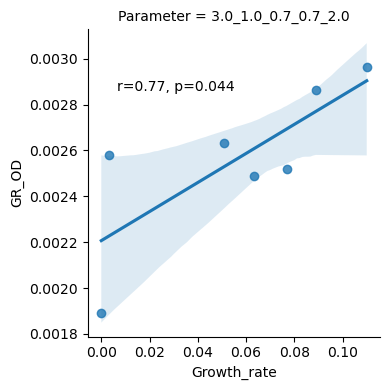

In [234]:
import seaborn as sns
import scipy as sp

# g = sns.lmplot(listas[0],x='Growth_rate',y='GR_OD')
dftmp = pd.DataFrame()
for l in listas:
    dftmp = pd.concat([dftmp,l])

dftmp2 = dftmp[dftmp['Parameter'] == '3.0_1.0_0.7_0.7_2.0']
dftmp2 = dftmp2[dftmp2['sample'] != 'Control_3_B']
# dftmp2 = dftmp2[dftmp2['sample'] != 'AAAb_2_B']
g = sns.lmplot(x='Growth_rate', y='GR_OD', data=dftmp2, row='Parameter',
               height=4, aspect=1)

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Growth_rate'], data['GR_OD'])
    ax = plt.gca()
    ax.text(.1, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
g.map_dataframe(annotate)
# g.savefig('Fig5.B.svg')

##### Fluxes & AAs

In [ ]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
folder='run_230724'
blocked='none'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(np.abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 3.39
      The total exchanges are 3.36
      


In [228]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1']

             compartment       
Control_1_B  maxbin2_spades_001    0.062475
Control_2_B  maxbin2_spades_001    0.000018
Control_3_B  maxbin2_spades_001    0.000000
AA_1_B       maxbin2_spades_001    0.050435
AA_2_B       maxbin2_spades_001    0.076187
AA_3_B       maxbin2_spades_001    0.003068
AAAb_1_B     maxbin2_spades_001    0.108393
AAAb_2_B     maxbin2_spades_001    0.087410
Name: bio1, dtype: float64

In [250]:
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])

exchanges_sim_df.loc['Control_3_B','maxbin2_spades_001'][['bio1','EX_cpd01024_e']]
# import_sim_df['Control_3_B'].sort_values().dropna()

bio1             1.103110e-07
EX_cpd01024_e    3.971561e+00
Name: (Control_3_B, maxbin2_spades_001), dtype: float64

### Formate utilization

In [ ]:
expression_data = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/expression_only_norm.results.csv',index_col=0)

In [32]:
# Who produces Formate?
series = exchanges_sim_df['EX_cpd00047_e'].dropna().sort_values()
pd.DataFrame(series[series > 1]).reset_index().compartment.unique()

array(['metabat1_megahit_20', 'metabat2_spades_25', 'vamb_spades_286',
       'metabat2_spades_18', 'metabat2_megahit_33', 'maxbin2_megahit_017',
       'metabat2_spades_15'], dtype=object)

### metabat1_megahit_20

<Axes: >

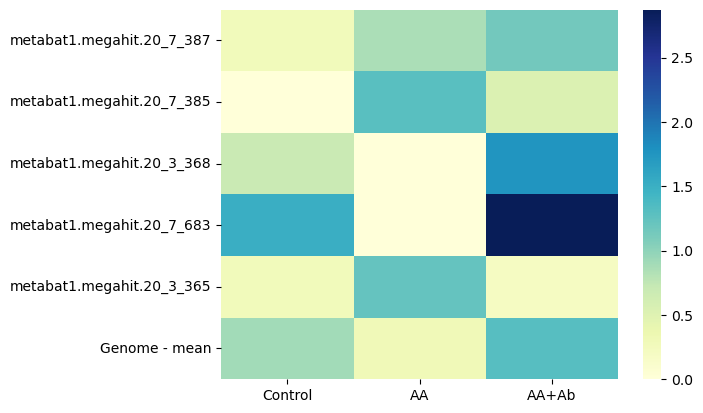

In [96]:
genes = ['metabat1.megahit.20_7_387', 'metabat1.megahit.20_7_385', 'metabat1.megahit.20_3_368',
 'metabat1.megahit.20_7_683', 'metabat1.megahit.20_3_365']

pd7 = expression_data[expression_data['MAG']=='Firmicutes_sp._UNIPD7']
pd77 = pd7.loc[genes][pd7.columns[:-1]]
pd77.loc[len(pd77)] = pd7[pd7.columns[:-1]].mean()
pd77.rename(index={5:'Genome - mean'},inplace=True)

pd77_mean = pd.DataFrame({
	'Control': pd77[pd77.columns[0:3]].mean(axis=1),
	'AA': pd77[pd77.columns[3:6]].mean(axis=1),
	'AA+Ab': pd77[pd77.columns[6:]].mean(axis=1)})

sns.heatmap(pd77_mean,cmap='YlGnBu')

### metabat2_spades_25

<Axes: >

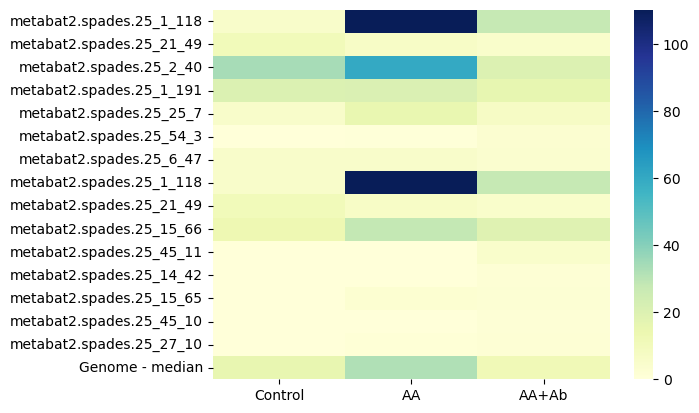

In [95]:
genes = ['metabat2.spades.25_1_118',
 'metabat2.spades.25_21_49',
 'metabat2.spades.25_2_40',
 'metabat2.spades.25_1_191',
 'metabat2.spades.25_25_7',
 'metabat2.spades.25_54_3',
 'metabat2.spades.25_6_47',
 'metabat2.spades.25_1_118',
 'metabat2.spades.25_21_49',
 'metabat2.spades.25_15_66',
 'metabat2.spades.25_45_11',
 'metabat2.spades.25_14_42',
 'metabat2.spades.25_15_65',
 'metabat2.spades.25_45_10',
 'metabat2.spades.25_27_10']

pd15 = expression_data[expression_data['MAG']=='Symbiobacterium_sp._UNIPD15']
pd15 = pd15.loc[genes][pd15.columns[:-1]]
mean = pd15[pd15[pd15.columns[:-1]] > 0].dropna(how='all').dropna(how='all',axis=1).mean()
i = len(pd15)
pd15.loc[len(pd15)] = mean
pd15.rename(index={i:'Genome - median'},inplace=True)

pd15_mean = pd.DataFrame({
	'Control': pd15[pd15.columns[0:3]].mean(axis=1),
	'AA': pd15[pd15.columns[3:6]].mean(axis=1),
	'AA+Ab': pd15[pd15.columns[6:]].mean(axis=1)})

sns.heatmap(pd15_mean,cmap='YlGnBu')

### metabat2_spades_18

<Axes: >

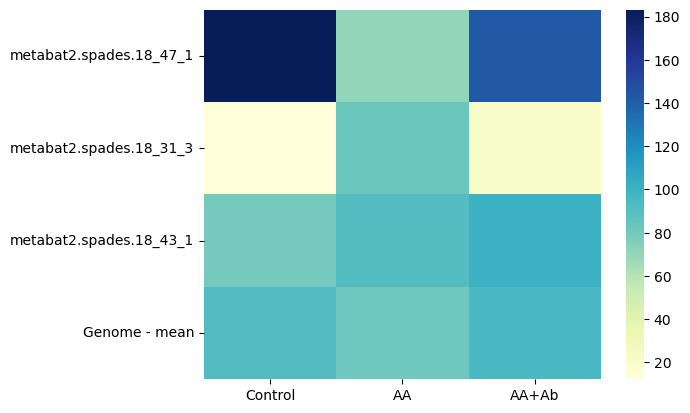

In [94]:
genes = ['metabat2.spades.18_47_1',
 'metabat2.spades.18_31_3',
 'metabat2.spades.18_43_1']

pd14 = expression_data[expression_data['MAG']=='Limnochordia_sp._UNIPD14']
pd14 = pd14.loc[genes][pd14.columns[:-1]]
mean = pd14[pd14[pd14.columns[:-1]] > 0].dropna(how='all').dropna(how='all',axis=1).mean()
i = len(pd14)
pd14.loc[len(pd14)] = mean
pd14.rename(index={i:'Genome - mean'},inplace=True)

pd14_mean = pd.DataFrame({
	'Control': pd14[pd14.columns[0:3]].mean(axis=1),
	'AA': pd14[pd14.columns[3:6]].mean(axis=1),
	'AA+Ab': pd14[pd14.columns[6:]].mean(axis=1)})
sns.heatmap(pd14_mean,cmap='YlGnBu')

### metabat2_megahit_33

<Axes: >

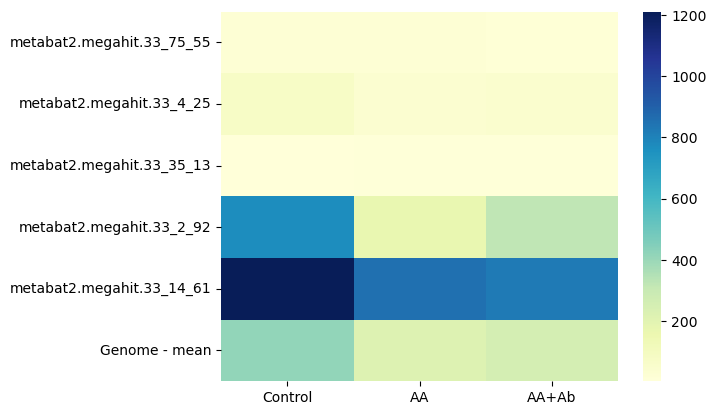

In [98]:
genes = ['metabat2.megahit.33_75_55','metabat2.megahit.33_4_25','metabat2.megahit.33_35_13','metabat2.megahit.33_2_92','metabat2.megahit.33_14_61']

mag = 'Tissierellaceae_sp._UNIPD12'
mag_expr = expression_data[expression_data['MAG']==mag]
mag_expr = mag_expr.loc[genes][mag_expr.columns[:-1]]
mean = mag_expr[mag_expr[mag_expr.columns[:-1]] > 0].dropna(how='all').dropna(how='all',axis=1).mean()
i = len(mag_expr)
mag_expr.loc[len(mag_expr)] = mean
mag_expr.rename(index={i:'Genome - mean'},inplace=True)

mag_expr_mean = pd.DataFrame({
	'Control': mag_expr[mag_expr.columns[0:3]].mean(axis=1),
	'AA': mag_expr[mag_expr.columns[3:6]].mean(axis=1),
	'AA+Ab': mag_expr[mag_expr.columns[6:]].mean(axis=1)})
sns.heatmap(mag_expr_mean,cmap='YlGnBu')

### maxbin2_megahit_017

<Axes: >

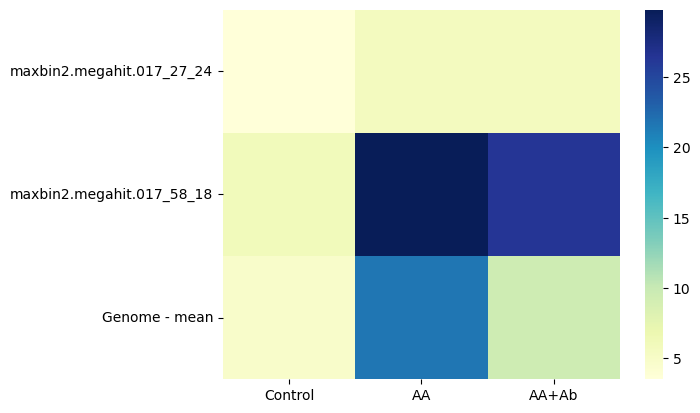

In [100]:
genes = [#'maxbin2.megahit.017_142_9',
 'maxbin2.megahit.017_27_24',
 'maxbin2.megahit.017_58_18']

mag = 'Tepidanaerobacteraceae_sp._UNIPD3'
mag_expr = expression_data[expression_data['MAG']==mag]
mag_expr = mag_expr.loc[genes][mag_expr.columns[:-1]]
mean = mag_expr[mag_expr[mag_expr.columns[:-1]] > 0].dropna(how='all').dropna(how='all',axis=1).mean()
i = len(mag_expr)
mag_expr.loc[len(mag_expr)] = mean
mag_expr.rename(index={i:'Genome - mean'},inplace=True)

mag_expr_mean = pd.DataFrame({
	'Control': mag_expr[mag_expr.columns[0:3]].mean(axis=1),
	'AA': mag_expr[mag_expr.columns[3:6]].mean(axis=1),
	'AA+Ab': mag_expr[mag_expr.columns[6:]].mean(axis=1)})
sns.heatmap(mag_expr_mean,cmap='YlGnBu')

### metabat2_spades_15

<Axes: >

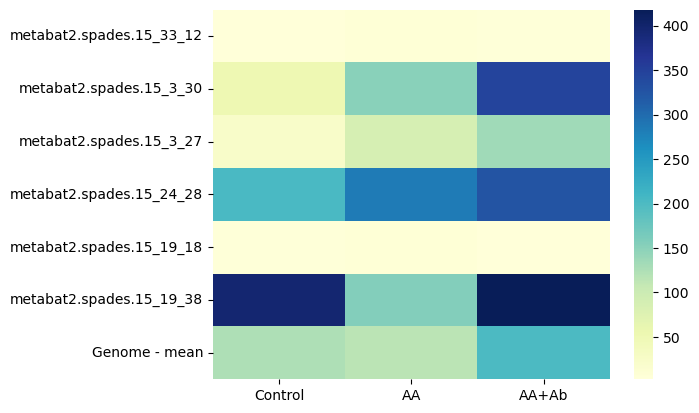

In [101]:
genes = ['metabat2.spades.15_33_12',
 'metabat2.spades.15_3_30',
 'metabat2.spades.15_3_27',
 'metabat2.spades.15_24_28',
 'metabat2.spades.15_19_18',
 'metabat2.spades.15_19_38']

mag = 'Caldanaerobacter_subterraneus_UNIPD13'
mag_expr = expression_data[expression_data['MAG']==mag]
mag_expr = mag_expr.loc[genes][mag_expr.columns[:-1]]
mean = mag_expr[mag_expr[mag_expr.columns[:-1]] > 0].dropna(how='all').dropna(how='all',axis=1).mean()
i = len(mag_expr)
mag_expr.loc[len(mag_expr)] = mean
mag_expr.rename(index={i:'Genome - mean'},inplace=True)

mag_expr_mean = pd.DataFrame({
	'Control': mag_expr[mag_expr.columns[0:3]].mean(axis=1),
	'AA': mag_expr[mag_expr.columns[3:6]].mean(axis=1),
	'AA+Ab': mag_expr[mag_expr.columns[6:]].mean(axis=1)})
sns.heatmap(mag_expr_mean,cmap='YlGnBu')

In [259]:
expression_data = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/expression_only_norm.results.csv',index_col=0)
differentialExpression = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/differential_analysis.tsv', index_col=0)
rxns_formate = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/tables/rxns_formate.csv',index_col=0)
names = {}
with open('/home/esteban/Documents/esteban/experiments/aa_ab/tables/names.list.final.short.tsv')as f:
	for line in f:
		old,new = line.split("\t")
		names[old] = new.replace("\n","")

df = pd.DataFrame(index=list(rxns_formate[rxns_formate.columns[0]]))
df2 = pd.DataFrame()
genesA = []
genesR = []
magsR = {}
single = True
for i in rxns_formate.itertuples():
	rxn = i[1]
	genes = i[2]
	mags = {}
	for gene in genes.split(','):
		gene = gene.replace("[","").replace("'","").replace("]","").replace(" ","").replace("(","").replace(")","")
		mag = ".".join(gene.split("_")[0:3]).replace(" ","")
		g = ".".join(gene.split("_")[0:3])+"_"+"_".join(gene.split("_")[3:]).replace(" ","")
		if g in genesA:
			pass
			# continue
		else:
			genesA.append(g)
		if mag not in names.keys():
			continue
		if mag == 'maxbin2.spades.001':
			continue
		mag_name = names[mag]
		# if mag not in mags.keys():
		# 	mags[mag] = 1
		# else:
		# 	x = mags[mag] + 1
		# 	mags[mag] = mags[mag] + 1
		# 	mag_name = mag_name+ "_" + str(x)
		if mag not in magsR.keys():
			magsR[mag] = []
		mags_reactions = magsR[mag]
		if rxn not in mags_reactions:
			mags_reactions.append(rxn)
			magsR[mag] = mags_reactions
			single = True
		else:
			single = False
		try:
			# expression = expression_data.loc[g]
			mag_expr = pd.DataFrame(expression_data.loc[g]).T
			mag_expr_mean = pd.DataFrame({mag_name + ' Control': mag_expr[mag_expr.columns[0:3]].mean(axis=1),
			mag_name + ' AA': mag_expr[mag_expr.columns[3:6]].mean(axis=1),
			mag_name + ' AA+Ab': mag_expr[mag_expr.columns[6:8]].mean(axis=1)})
		except KeyError:
			# print(f'Could not find {g}')
			genesR.append(g)
			continue
		if gene in rxnP:
			print (gene,g, rxn)
		c = mag_expr_mean[mag_name+' Control'].values[0]
		aa = mag_expr_mean[mag_name+' AA'].values[0] 
		aaab = mag_expr_mean[mag_name+' AA+Ab'].values[0]

		if single == False:
			try:
				c = c + df.loc[rxn,mag_name+' Control']
				aa = aa + df.loc[rxn,mag_name+' AA']
				aaab = aaab + df.loc[rxn,mag_name+' AA+Ab']
			except:
				pass
		df.loc[rxn,mag_name+' Control'] = c
		df.loc[rxn,mag_name+' AA'] = aa
		df.loc[rxn,mag_name+' AA+Ab'] = aaab

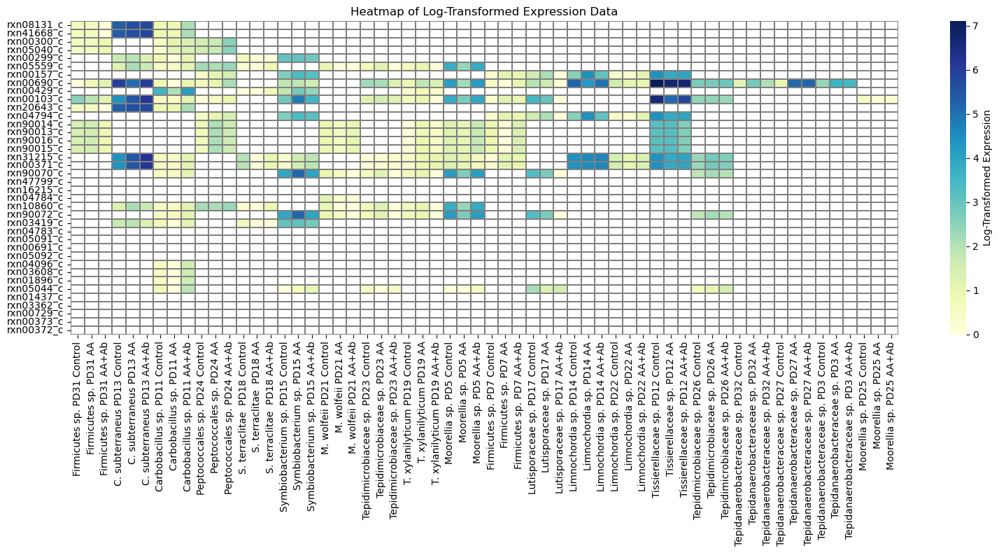

In [239]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set up the figure size (adjust as necessary for the size of your DataFrame)
plt.figure(figsize=(16, 8))

# Create the heatmap with better colormap and annotations
sns.heatmap(np.log(df + 1),
            cmap='YlGnBu',        # Choose a perceptually uniform colormap
            annot=False,            # Optional: Set True if you want to display the values in cells
            xticklabels=True,       # Ensure x labels are shown
            yticklabels=True,       # Ensure y labels are shown
            cbar_kws={'label': 'Log-Transformed Expression'},  # Label for color bar
            linewidths=0.2,         # Line width between cells
            linecolor='gray')       # Color of the grid lines

# Rotate x-axis labels to avoid overlap
plt.xticks(rotation=90)
plt.yticks(rotation=0)  # Ensure y-axis labels are horizontal

# Add a title
plt.title('Heatmap of Log-Transformed Expression Data')

# Display the plot
plt.tight_layout()  # Adjust layout to prevent label cut-offs
plt.show()


In [263]:
dif = differentialExpression.loc[differentialExpression.index.isin(genesA)]
dif[dif['pvalue'] < 0.05].sort_values(by='log2FoldChange')

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,MAG,Condition
vamb.megahit.295_126_34,2.347785,-4.759732,2.165388,-2.198097,2.794219e-02,1.000000e+00,Lutisporaceae_sp._UNIPD17,AA-AAAb
vamb.megahit.295_41_5,10.105470,-3.649138,1.574171,-2.318134,2.044206e-02,2.293097e-01,Lutisporaceae_sp._UNIPD17,AAAb-ctrl
maxbin2.spades.006_4_7,10.267197,-2.638147,1.191883,-2.213427,2.686819e-02,8.560605e-01,Moorellia_sp._UNIPD5,AA-ctrl
vamb.spades.812_18_35,6.914940,-2.535547,1.182549,-2.144137,3.202188e-02,1.000000e+00,Firmicutes_sp._UNIPD31,AAAb-ctrl
maxbin2.spades.006_9_106,33.250848,-2.174509,0.814060,-2.671188,7.558322e-03,3.710010e-01,Moorellia_sp._UNIPD5,AA-ctrl
metabat2.megahit.33_2_92,428.776837,-2.164496,0.414214,-5.225544,1.736440e-07,1.295255e-05,Tissierellaceae_sp._UNIPD12,AA-ctrl
maxbin2.spades.006_9_106,33.250848,-2.122980,0.874739,-2.426987,1.522480e-02,1.000000e+00,Moorellia_sp._UNIPD5,AA-AAAb
metabat2.spades.15_19_38,309.262211,-1.435173,0.483766,-2.966668,3.010454e-03,4.610516e-02,Caldanaerobacter_subterraneus_UNIPD13,AA-AAAb
metabat2.spades.18_47_1,128.608989,-1.377432,0.565813,-2.434429,1.491533e-02,4.165987e-01,Limnochordia_sp._UNIPD14,AA-ctrl
metabat2.spades.15_19_38,309.262211,-1.341062,0.432751,-3.098925,1.942242e-03,1.361373e-02,Caldanaerobacter_subterraneus_UNIPD13,AA-ctrl


In [255]:
toDelete = ['rxn47799_c','rxn16215_c','rxn00372_c','rxn05091_c','rxn04783_c','rxn00373_c','rxn00691_c','rxn05092_c','rxn03362_c','rxn00729_c']
rxnP = []
for i in rxns_formate[rxns_formate['0'] == 'rxn00729_c'].itertuples():
	for j in i[2].split(","):
		j = j.replace("[","").replace("'","").replace("]","").replace(" ","").replace("(","").replace(")","")
		rxnP.append(j)
rxnP

['maxbin2_spades_028_182_3']

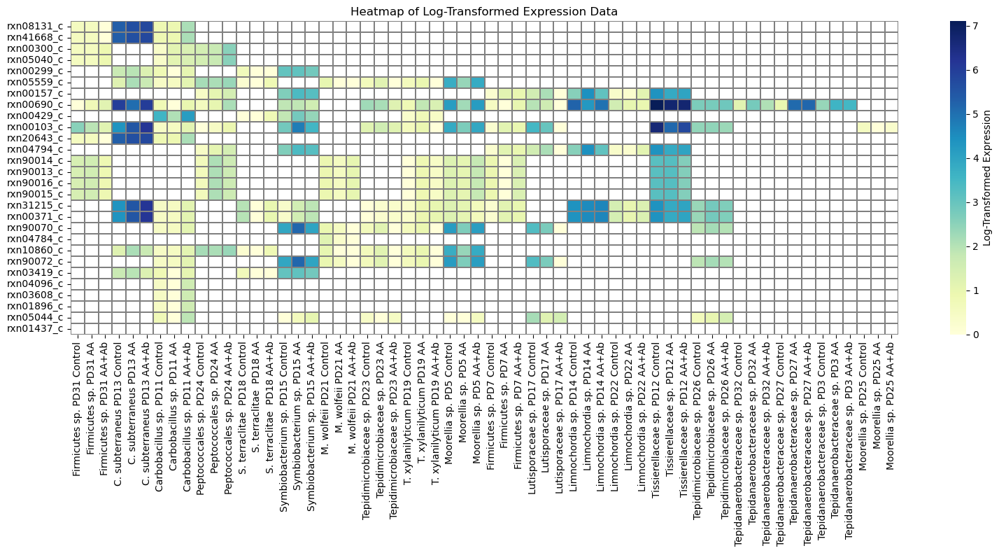

In [257]:
df = df.loc[~df.index.isin(toDelete)]
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set up the figure size (adjust as necessary for the size of your DataFrame)
plt.figure(figsize=(16, 8))

# Create the heatmap with better colormap and annotations
sns.heatmap(np.log(df + 1),
            cmap='YlGnBu',        # Choose a perceptually uniform colormap
            annot=False,            # Optional: Set True if you want to display the values in cells
            xticklabels=True,       # Ensure x labels are shown
            yticklabels=True,       # Ensure y labels are shown
            cbar_kws={'label': 'Log-Transformed Expression'},  # Label for color bar
            linewidths=0.2,         # Line width between cells
            linecolor='gray')       # Color of the grid lines

# Rotate x-axis labels to avoid overlap
plt.xticks(rotation=90)
plt.yticks(rotation=0)  # Ensure y-axis labels are horizontal

# Add a title
plt.title('Heatmap of Log-Transformed Expression Data')

# Display the plot
plt.tight_layout()  # Adjust layout to prevent label cut-offs
plt.show()


In [758]:
exchanges_sim_df.loc[idxs]['EX_cpd01024_e']

             compartment       
Control_1_B  maxbin2_spades_001    2.870717
Control_2_B  maxbin2_spades_001    3.377631
Control_3_B  maxbin2_spades_001    3.566141
AA_1_B       maxbin2_spades_001    3.068462
AA_2_B       maxbin2_spades_001    3.037525
AA_3_B       maxbin2_spades_001    3.874339
AAAb_1_B     maxbin2_spades_001    3.275622
AAAb_2_B     maxbin2_spades_001    3.901785
Name: EX_cpd01024_e, dtype: float64

##### AA

In [759]:
import matplotlib.pyplot as plt

# cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags)
df1 = CreateTable(control_samples,mags)
df3 = CreateTable(aaab_samples,mags)

cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags,cols)
df1 = CreateTable(control_samples,mags,cols)
df3 = CreateTable(aaab_samples,mags,cols)

df11 = df1[np.abs(df1) > 0.00001]
df22 = df2[np.abs(df2) > 0.00001]
df33 = df3[np.abs(df3) > 0.00001]

# np.log(df11+1)
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)


# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

df11.columns = [f'{col}_1' for col in df11.columns]
df22.columns = [f'{col}_2' for col in df22.columns]
df33.columns = [f'{col}_3' for col in df33.columns]

/tmp/ipykernel_6441/2267168120.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/2267168120.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/2267168120.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavio

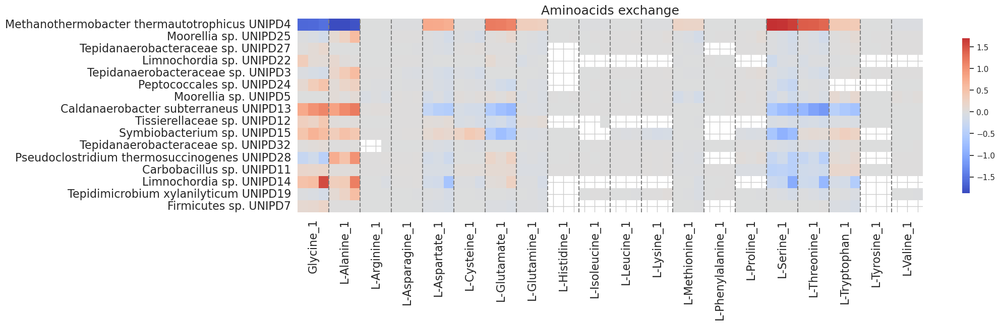

In [760]:
# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

# Concatenate the DataFrames along the columns
df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)
# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min() 
g = sns.heatmap(df_concat, cmap="coolwarm", center=0, vmin=min_, vmax=max_, cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=16)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
# new_ylabels = [label.get_text()[-4:] for label in ylabels]
new_ylabels = [label.get_text() for label in ylabels]
# g.set_yticklabels(new_ylabels, rotation=0)
g.set_yticklabels(new_ylabels, rotation=0, fontsize=16)  # Increase font size for y-axis labels
plt.title('Aminoacids exchange',fontsize=18)
# plt.xlabel('MAG')

# Save the plot
plt.savefig('aminoacids_exchange.svg')
plt.show()

##### Fluxes

(-10.0, 7.5)

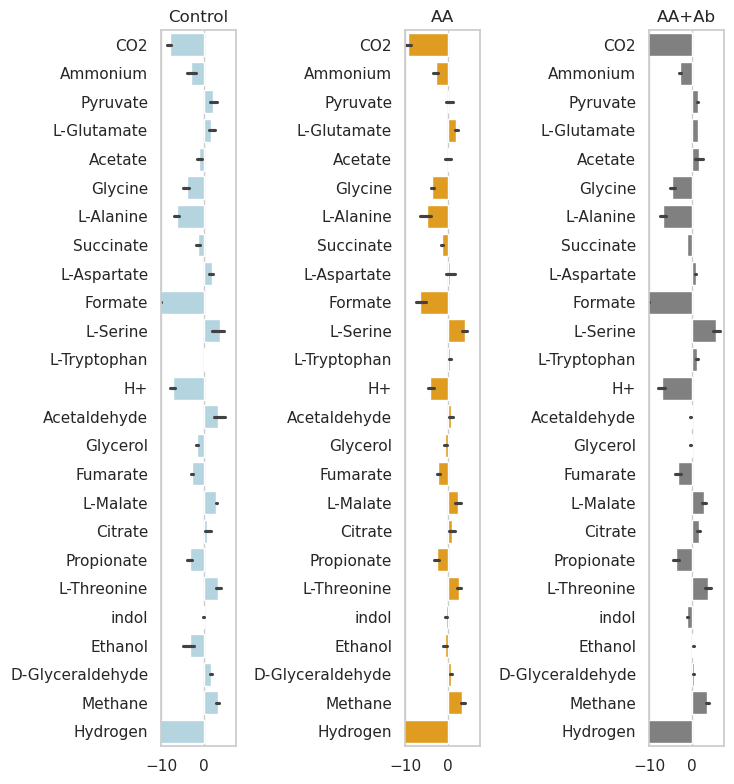

In [761]:
exchanges_sim_e_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('_e')]]

dt_plot = exchanges_sim_e_df.loc[(slice(None), 'maxbin2_spades_001'), :].copy()
idx = dt_plot.abs().max(axis=0) > 1

cpd_to_drop = [
    # 'EX_cpd11640_e',
    # 'EX_cpd00011_e',
    # 'EX_cpd01024_e',
    'EX_cpd00001_e']

dt_plot.drop(columns=cpd_to_drop, inplace=True)
col_name = cpd_modelSeed_to_name([cpd.split('_')[1] for cpd in idx.index])
new_keys = ['EX_'+cpd+'_e' for cpd in col_name.keys()]
col_name = dict(zip(new_keys, col_name.values()))
dt_plot = dt_plot.loc[:, idx]
dt_plot.rename(columns=col_name, inplace=True)

dt_plot_control = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('Control_')], :]
dt_plot_aa = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AA_')], :]
dt_plot_aaab = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AAAb_')], :]

fig, axes = plt.subplots(1, 3, figsize=(7.5, 8.), tight_layout=True)
sns.barplot(data=dt_plot_control, orient='h', color='lightblue', ax=axes[0])
axes[0].set_title('Control')
axes[0].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aa, orient='h', color='orange', ax=axes[1])
axes[1].set_title('AA')
axes[1].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aaab, orient='h', color='grey', ax=axes[2])
axes[2].set_title('AA+Ab')
axes[2].set_xlim(left=-10, right=7.5)

In [510]:
dt_plot[['Formate','Hydrogen','CO2']]

,,Formate,Hydrogen,CO2
,compartment,,,
Control_1_B,maxbin2_spades_001,-11.250110,-14.760356,-8.690620
Control_2_B,maxbin2_spades_001,-10.033348,-15.202211,-7.681458
Control_3_B,maxbin2_spades_001,-10.242372,-15.819070,-7.849988
AA_1_B,maxbin2_spades_001,-7.159152,-18.804242,-10.044097
AA_2_B,maxbin2_spades_001,-7.588357,-22.507692,-8.764560
AA_3_B,maxbin2_spades_001,-5.198786,-23.834879,-9.506335
AAAb_1_B,maxbin2_spades_001,-10.176924,-25.492191,-10.338824
AAAb_2_B,maxbin2_spades_001,-12.751741,-31.182903,-12.769288


### Blocking AA

In [481]:
# Add the information of the blocked AA
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockedAA.0.00001/'
df = pd.read_csv(f"{path}coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.archaea.csv", index_col=[0,1])
coverage = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/coverage/coverage.mags.aminoacids.tsv',sep='\t',index_col=0)
aa_names_p = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/AAModelSeed2.tsv'
mags_names_f = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/names.list.tsv'

# Select only AA_1_B and AA_2_B
aa_samples = ['AA_1_B','AA_2_B','AA_3_B']
control_samples = ['Control_1_B','Control_2_B','Control_3_B']
aaab_samples = ['AAAb_1_B','AAAb_2_B']
samples = control_samples + aa_samples + aaab_samples
# Create a dictionary for the AA names
aa_seed = {}
aminoacids = []
with open(aa_names_p)as f:
    for line in f:
        seed = 'EX_'+line.split("\t")[0]+'_e'
        name = line.split("\t")[1].replace("\n","")
        aa_seed[seed] = name
        aminoacids.append(seed)

# Create a dictionary to replace the names of the MAGs
mags_names = {}
with open(mags_names_f)as f:
    for line in f:
        mag = line.split("\t")[0].replace(".","_")
        name = line.split("\t")[1].replace("\n","")
        mags_names[mag] = name

mags = set()
for samples in [aa_samples,control_samples,aaab_samples]:
    ms = list(coverage[samples].mean(axis=1).sort_values().tail(n=13).index)
    mags = mags | set(ms)
mags = set(['vamb.megahit.488']) | mags

# Create functionts to plot the AAs    
def CreateTable(samples,MAGs,cols=''):
    # Select the most abundant mags in those samples
    sure_to_keep = set(['L-Leucine','L-Aspartate','L-Valine'])
    mags = dict(coverage.loc[list(MAGs)][samples].mean(axis=1))
    amino = list(set(aminoacids) & set(df.columns))
    df2 = pd.DataFrame(columns=amino)
    # Create the table for the plot
    for m in mags.keys():
        v = mags[m]
        m = m.replace(".","_")
        ss = []
        for s in aa_samples:
            if (s,m) in df.index:
                ss.append((s,m))
        dftmp = df.loc[ss][amino]
        df1 = pd.DataFrame(dftmp.mean(),columns=[m])*(v/100)
        df2 = pd.concat([df2,df1.T])
        # df2 = df2.append(df1.T)
    df2 = df2.rename(columns=aa_seed,index=mags_names)
    if cols == '':
        filter = np.abs(df2).sum() > 0.00001
        cols = df2.loc[:,filter].columns.tolist()
        cols = list(set(cols) | sure_to_keep)
    df3 = df2[cols]
    return df3

# Plot several plots
def CreatePlot(dataframes,names,number):
    fig, axs = plt.subplots(nrows=number)
    # return sns.heatmap(df,cmap='RdBu_r',center=0)
    i = 0
    for df in dataframes:
        normalized_df = (df - df.mean()) / df.std()
        sns.clustermap(normalized_df, row_cluster=False,col_cluster=False,cmap="RdBu_r",ax=axs[i])
        i += 1

    return fig

# Print samples names
samples = []
for i in df.index:
    if i[0] not in samples:
        samples.append(i[0])

aa_samples = list(set(samples) & set(aa_samples))
control_samples = list(set(samples) & set(control_samples))
aaab_samples = list(set(samples) & set(aaab_samples))

print (samples)

['Control_1_B', 'Control_2_B', 'Control_3_B', 'AA_1_B', 'AA_2_B', 'AA_3_B']


In [485]:
# Choose the best parameter
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/'
files = os.listdir(path)

# First create the file with the community growth rate
community = pd.DataFrame(columns=['Parameter','sample','Growth_rate'])
computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockedAA.0.00001/compute.fluxes.240724.BlockedAA.0.00001.out'
with open(computeFluxes)as file:
    enter = False
    enter2 = False
    for line in file:   
        if 'Running (' in line:
            l = line.split('(')[1]
            parameter = l.split(')')[0].replace(', ','_')
        if '>' in line:
            sample = line.replace('>','').replace('\n','').strip()
            enter = True
            enter2 = False
        if '--- CoCo ---\n' == line:
            enter2 = True
        if enter2 == True and '----------------------------------\n' == line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter, sample, gr)
        elif enter2 == True and 'Finished iter' in line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter,sample,gr)
        elif enter2 == True:
            line0 = line

# plot the community and relate them with OD
path = '~/Documents/esteban/experiments/aa_ab/tables/'
lnOD = pd.read_csv(f'{path}ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}
grSimulation = {}
for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    while i < len(index)-1:
        j = 0
        while j < len(index):
            if index[j] != index[i]:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    if index[j] == 21 and index[i] == 19:
                        grSimulation[col] = gr
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i

grPD = pd.DataFrame.from_dict(gr_average, orient='index')
# sns.lineplot(data=grPD,x=grPD.index,y=0)
samplesSynonims = {'Control_1_B':'Control', 'Control_2_B':'Control.1', 'Control_3_B':'Control.2', 'AA_1_B':'AA', 'AA_2_B':'AA.1','AA_3_B':'AA.2',
            'AAAb_1_B':'AA+Ab','AAAb_2_B':'AA+Ab.1','AAAb_3_B':'AA+Ab.2'}
listas = []
for par in community.Parameter.unique():
    dftmp = community[community['Parameter'] == par]
    dftmp2 = dftmp.copy()
    for i in dftmp.itertuples():
        sample = i[2]
        sample2 = samplesSynonims[sample]
        dftmp2.loc[i[0],'GR_OD'] = gr_average[sample2]
    listas.append(dftmp2)

3.0_1.0_0.7_0.7_2.0 AAAb_1_B Couldn't run coco on sample AAAb_1_B
3.0_1.0_0.7_0.7_2.0 AAAb_2_B Couldn't run coco on sample AAAb_2_B


#### Fluxes & AAs

In [489]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
# wd = '/home/bioinfo/users/niber/prj_micronutrients_v2/coco/res/single_run_results_noCH4_ubH_YE_lb_0.001_2.0_1_0.5/' # single_run_results_noCH4_YE_lb_0.001_3_1_0.6/'
# par = 'gamma.1.0.delta.2.0.ct_0.5' # 'gamma.1.0.delta.3.0.ct_0.6'
folder='blockedAA.0.00001'
blocked='archaea'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 2.86
      The total exchanges are 2.84
      


In [491]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1'].to_clipboard()

In [492]:
exchanges_sim_df.loc[idxs]['EX_cpd01024_e']

             compartment       
Control_1_B  maxbin2_spades_001    2.512215
Control_2_B  maxbin2_spades_001    2.837066
Control_3_B  maxbin2_spades_001    2.709390
AA_1_B       maxbin2_spades_001    2.040890
AA_2_B       maxbin2_spades_001    2.053877
AA_3_B       maxbin2_spades_001    2.718831
Name: EX_cpd01024_e, dtype: float64

#### AA

In [493]:
import matplotlib.pyplot as plt

# cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags)
df1 = CreateTable(control_samples,mags)
df3 = CreateTable(aaab_samples,mags)

cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags,cols)
df1 = CreateTable(control_samples,mags,cols)
df3 = CreateTable(aaab_samples,mags,cols)

df11 = df1[np.abs(df1) > 0.00001]
df22 = df2[np.abs(df2) > 0.00001]
df33 = df3[np.abs(df3) > 0.00001]

# np.log(df11+1)
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)


# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

df11.columns = [f'{col}_1' for col in df11.columns]
df22.columns = [f'{col}_2' for col in df22.columns]
df33.columns = [f'{col}_3' for col in df33.columns]

/tmp/ipykernel_6441/1707787463.py:54: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/1707787463.py:54: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/1707787463.py:54: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, 

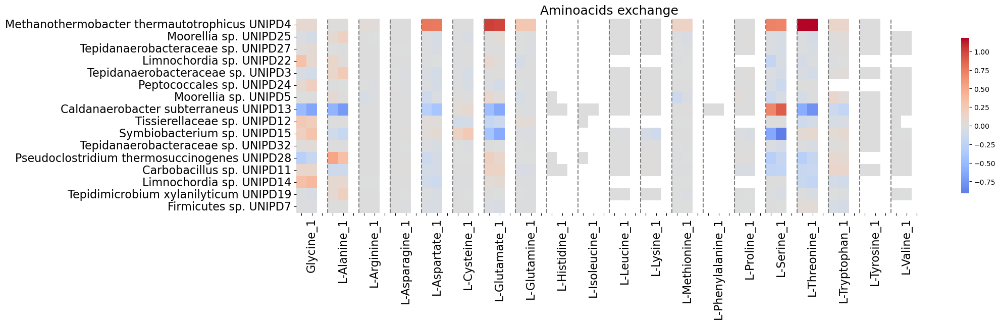

In [494]:
# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

# Concatenate the DataFrames along the columns
df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)
# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min() 
g = sns.heatmap(df_concat, cmap="coolwarm", center=0, vmin=min_, vmax=max_, cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=16)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
# new_ylabels = [label.get_text()[-4:] for label in ylabels]
new_ylabels = [label.get_text() for label in ylabels]
# g.set_yticklabels(new_ylabels, rotation=0)
g.set_yticklabels(new_ylabels, rotation=0, fontsize=16)  # Increase font size for y-axis labels
plt.title('Aminoacids exchange',fontsize=18)
# plt.xlabel('MAG')

# Save the plot
plt.savefig('aminoacids_exchange-blockedAA-0.00001.svg')
plt.show()

#### Fluxes

/home/esteban/anaconda3/envs/graphs/lib/python3.11/site-packages/seaborn/_base.py:1601: UserWarning: Horizontal orientation ignored with only `y` specified.
  warnings.warn(single_var_warning.format("Horizontal", "y"))


(-10.0, 7.5)

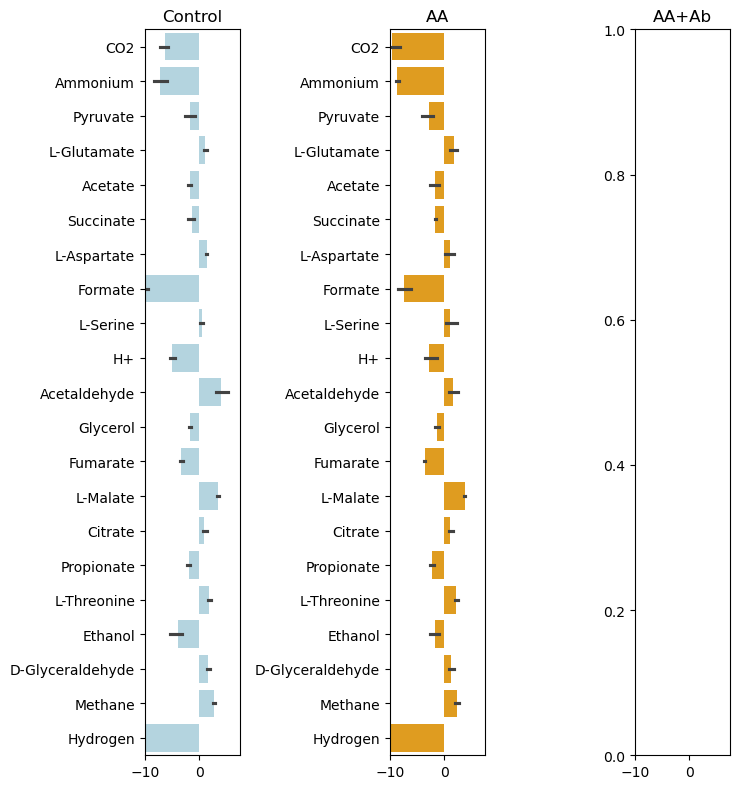

In [495]:
exchanges_sim_e_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('_e')]]

dt_plot = exchanges_sim_e_df.loc[(slice(None), 'maxbin2_spades_001'), :].copy()
idx = dt_plot.abs().max(axis=0) > 1

cpd_to_drop = [
    # 'EX_cpd11640_e',
    # 'EX_cpd00011_e',
    # 'EX_cpd01024_e',
    'EX_cpd00001_e']

dt_plot.drop(columns=cpd_to_drop, inplace=True)
col_name = cpd_modelSeed_to_name([cpd.split('_')[1] for cpd in idx.index])
new_keys = ['EX_'+cpd+'_e' for cpd in col_name.keys()]
col_name = dict(zip(new_keys, col_name.values()))
dt_plot = dt_plot.loc[:, idx]
dt_plot.rename(columns=col_name, inplace=True)

dt_plot_control = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('Control_')], :]
dt_plot_aa = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AA_')], :]
dt_plot_aaab = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AAAb_')], :]

fig, axes = plt.subplots(1, 3, figsize=(7.5, 8.), tight_layout=True)
sns.barplot(data=dt_plot_control, orient='h', color='lightblue', ax=axes[0])
axes[0].set_title('Control')
axes[0].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aa, orient='h', color='orange', ax=axes[1])
axes[1].set_title('AA')
axes[1].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aaab, orient='h', color='grey', ax=axes[2])
axes[2].set_title('AA+Ab')
axes[2].set_xlim(left=-10, right=7.5)

In [499]:
dt_plot[['Formate','Hydrogen','CO2']]

,,Formate,Hydrogen,CO2
,compartment,,,
Control_1_B,maxbin2_spades_001,-10.159091,-15.187451,-7.279322
Control_2_B,maxbin2_spades_001,-9.512099,-15.404172,-5.821306
Control_3_B,maxbin2_spades_001,-9.686481,-15.771481,-5.999194
AA_1_B,maxbin2_spades_001,-7.664680,-15.540541,-8.132230
AA_2_B,maxbin2_spades_001,-8.501344,-22.815670,-9.573873
AA_3_B,maxbin2_spades_001,-6.128184,-23.178994,-11.069356


#### Removing AA Constraints

In [467]:
# Functions
def cpd_modelSeed_to_name(cpd_list):
    seed_metabolites_df = pd.read_csv("/home/esteban/Documents/db/seed_metabolites_edited.tsv", sep="\t", index_col=0)
    cpd_modelSeed_to_name_dict = dict(seed_metabolites_df.loc[cpd_list, 'name'])
    return cpd_modelSeed_to_name_dict

def rxn_modelSeed_to_name(rxn_list):
    seed_reactions_f = '/home/esteban/Documents/db/seed_reactions_corrected.tsv'
    seed_reactions_df = pd.read_csv(seed_reactions_f, sep='\t', index_col=0)
    return dict(seed_reactions_df.loc[rxn_list, 'name'])

##### No Blocking

In [511]:
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/run_240724/'
def CheckFluxes(cpd,eof='m',path=path,sp=None):
    files = os.listdir(path)
    indices = ["Control_1_B","Control_2_B","Control_3_B","AA_1_B","AA_2_B","AA_3_B","AAAb_1_B","AAAb_2_B","AAAb_3_B",]
    df = pd.DataFrame(index=indices)
    columnas = []
    if eof == 'm':
        check = "exchanges"
    elif eof == "f":
        check = "fluxes"
    for f in files:
        if f.endswith(".csv") and check in f:
            # print (f, check)
            if check == "exchanges":
                df2 = pd.read_csv(f"{path}{f}", sep=",", index_col=0)
            elif check == "fluxes":
                df2 = pd.read_csv(f"{path}{f}", sep=",", index_col=[0,1])
            else:
                break
            if f.startswith(f"coco_{check}_"):
                f2 = f.replace(f"coco_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.none.csv","_c")
                
            elif f.startswith(f"base_{check}_"):
                f2 = f.replace(f"base_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.none.csv","_b")

            columnas.append(f2)
            for i in indices:
                try:
                    if check == "exchanges":
                        c = df2.loc[cpd][i]
                    elif check == "fluxes":
                        c = df2.loc[i,sp][cpd]
                except:
                    c = None
                # print (i,f2,c)
                df.loc[i,f2] = c

        columnas.sort()
    return df[columnas]

##########################################################################
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import PowerNorm
import pandas as pd
import seaborn as sns

##########################################################################
df = pd.read_csv(f"{path}coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.none.csv", index_col=[0,1])
coverage = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/coverage/coverage.mags.aminoacids.tsv',sep='\t',index_col=0)
aa_names_p = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/AAModelSeed2.tsv'
mags_names_f = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/names.list.tsv'

# Select only AA_1_B and AA_2_B
aa_samples = ['AA_1_B','AA_2_B','AA_3_B']
control_samples = ['Control_1_B','Control_2_B','Control_3_B']
aaab_samples = ['AAAb_1_B','AAAb_2_B']
samples = control_samples + aa_samples + aaab_samples
# Create a dictionary for the AA names
aa_seed = {}
aminoacids = []
with open(aa_names_p)as f:
    for line in f:
        seed = 'EX_'+line.split("\t")[0]+'_e'
        name = line.split("\t")[1].replace("\n","")
        aa_seed[seed] = name
        aminoacids.append(seed)

# Create a dictionary to replace the names of the MAGs
mags_names = {}
with open(mags_names_f)as f:
    for line in f:
        mag = line.split("\t")[0].replace(".","_")
        name = line.split("\t")[1].replace("\n","")
        mags_names[mag] = name

mags = set()
for samples in [aa_samples,control_samples,aaab_samples]:
    ms = list(coverage[samples].mean(axis=1).sort_values().tail(n=13).index)
    mags = mags | set(ms)
mags = set(['vamb.megahit.488']) | mags

# Create functionts to plot the AAs    
def CreateTable(samples,MAGs,cols=''):
    # Select the most abundant mags in those samples
    sure_to_keep = set(['L-Leucine','L-Aspartate','L-Valine'])
    mags = dict(coverage.loc[list(MAGs)][samples].mean(axis=1))
    amino = list(set(aminoacids) & set(df.columns))
    df2 = pd.DataFrame(columns=amino)
    # Create the table for the plot
    for m in mags.keys():
        v = mags[m]
        m = m.replace(".","_")
        ss = []
        for s in aa_samples:
            if (s,m) in df.index:
                ss.append((s,m))
        dftmp = df.loc[ss][amino]
        df1 = pd.DataFrame(dftmp.mean(),columns=[m])*(v/100)
        df2 = pd.concat([df2,df1.T])
        # df2 = df2.append(df1.T)
    df2 = df2.rename(columns=aa_seed,index=mags_names)
    if cols == '':
        filter = np.abs(df2).sum() > 0.00001
        cols = df2.loc[:,filter].columns.tolist()
        cols = list(set(cols) | sure_to_keep)
    df3 = df2[cols]
    return df3

# Plot several plots
def CreatePlot(dataframes,names,number):
    fig, axs = plt.subplots(nrows=number)
    # return sns.heatmap(df,cmap='RdBu_r',center=0)
    i = 0
    for df in dataframes:
        normalized_df = (df - df.mean()) / df.std()
        sns.clustermap(normalized_df, row_cluster=False,col_cluster=False,cmap="RdBu_r",ax=axs[i])
        i += 1

    return fig

# Print samples names
samples = []
for i in df.index:
    if i[0] not in samples:
        samples.append(i[0])

aa_samples = list(set(samples) & set(aa_samples))
control_samples = list(set(samples) & set(control_samples))
aaab_samples = list(set(samples) & set(aaab_samples))

print (samples)

['Control_1_B', 'Control_2_B', 'Control_3_B', 'AA_1_B', 'AA_2_B', 'AA_3_B', 'AAAb_1_B', 'AAAb_2_B']


In [512]:
# Choose the best parameter
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/'
files = os.listdir(path)

# First create the file with the community growth rate
community = pd.DataFrame(columns=['Parameter','sample','Growth_rate'])
# computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/compute.fluxes.230724.out'
computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/run_240724/compute.fluxes.240724.NoAAConstraints.out'
with open(computeFluxes)as file:
    enter = False
    enter2 = False
    for line in file:   
        if 'Running (' in line:
            l = line.split('(')[1]
            parameter = l.split(')')[0].replace(', ','_')
        if '>' in line:
            sample = line.replace('>','').replace('\n','').strip()
            enter = True
            enter2 = False
        if '--- CoCo ---\n' == line:
            enter2 = True
        if enter2 == True and '----------------------------------\n' == line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter, sample, gr)
        elif enter2 == True and 'Finished iter' in line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter,sample,gr)
        elif enter2 == True:
            line0 = line

# plot the community and relate them with OD
path = '~/Documents/esteban/experiments/aa_ab/tables/'
lnOD = pd.read_csv(f'{path}ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}
grSimulation = {}
for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    while i < len(index)-1:
        j = 0
        while j < len(index):
            if index[j] != index[i]:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    if index[j] == 21 and index[i] == 19:
                        grSimulation[col] = gr
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i

grPD = pd.DataFrame.from_dict(gr_average, orient='index')
# sns.lineplot(data=grPD,x=grPD.index,y=0)
samplesSynonims = {'Control_1_B':'Control', 'Control_2_B':'Control.1', 'Control_3_B':'Control.2', 'AA_1_B':'AA', 'AA_2_B':'AA.1','AA_3_B':'AA.2',
            'AAAb_1_B':'AA+Ab','AAAb_2_B':'AA+Ab.1','AAAb_3_B':'AA+Ab.2'}
listas = []
for par in community.Parameter.unique():
    dftmp = community[community['Parameter'] == par]
    dftmp2 = dftmp.copy()
    for i in dftmp.itertuples():
        sample = i[2]
        sample2 = samplesSynonims[sample]
        dftmp2.loc[i[0],'GR_OD'] = gr_average[sample2]
    listas.append(dftmp2)

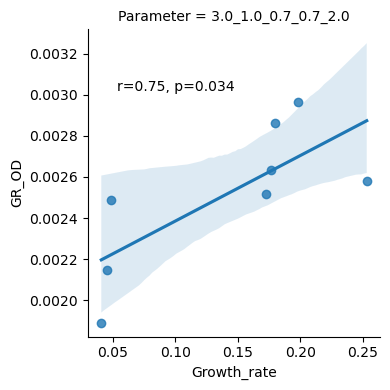

In [513]:
import seaborn as sns
import scipy as sp

# g = sns.lmplot(listas[0],x='Growth_rate',y='GR_OD')
dftmp = pd.DataFrame()
for l in listas:
    dftmp = pd.concat([dftmp,l])

dftmp2 = dftmp[dftmp['Parameter'] == '3.0_1.0_0.7_0.7_2.0']
g = sns.lmplot(x='Growth_rate', y='GR_OD', data=dftmp2, row='Parameter',
               height=4, aspect=1)

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Growth_rate'], data['GR_OD'])
    ax = plt.gca()
    ax.text(.1, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
g.map_dataframe(annotate)
g.savefig('Fig5.B.svg')

###### Fluxes & AAs

In [514]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
# wd = '/home/bioinfo/users/niber/prj_micronutrients_v2/coco/res/single_run_results_noCH4_ubH_YE_lb_0.001_2.0_1_0.5/' # single_run_results_noCH4_YE_lb_0.001_3_1_0.6/'
# par = 'gamma.1.0.delta.2.0.ct_0.5' # 'gamma.1.0.delta.3.0.ct_0.6'
folder='run_240724'
blocked='none'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 3.41
      The total exchanges are 3.38
      


In [516]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1'].to_clipboard()

In [517]:
exchanges_sim_df.loc[idxs]['EX_cpd01024_e']

             compartment       
Control_1_B  maxbin2_spades_001    2.870717
Control_2_B  maxbin2_spades_001    3.377631
Control_3_B  maxbin2_spades_001    3.566141
AA_1_B       maxbin2_spades_001    3.068462
AA_2_B       maxbin2_spades_001    3.037525
AA_3_B       maxbin2_spades_001    3.874339
AAAb_1_B     maxbin2_spades_001    3.275622
AAAb_2_B     maxbin2_spades_001    3.901785
Name: EX_cpd01024_e, dtype: float64

###### AA

In [518]:
import matplotlib.pyplot as plt

# cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags)
df1 = CreateTable(control_samples,mags)
df3 = CreateTable(aaab_samples,mags)

cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags,cols)
df1 = CreateTable(control_samples,mags,cols)
df3 = CreateTable(aaab_samples,mags,cols)

df11 = df1[np.abs(df1) > 0.00001]
df22 = df2[np.abs(df2) > 0.00001]
df33 = df3[np.abs(df3) > 0.00001]

# np.log(df11+1)
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)


# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

df11.columns = [f'{col}_1' for col in df11.columns]
df22.columns = [f'{col}_2' for col in df22.columns]
df33.columns = [f'{col}_3' for col in df33.columns]

/tmp/ipykernel_6441/3206371824.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/3206371824.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/3206371824.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavio

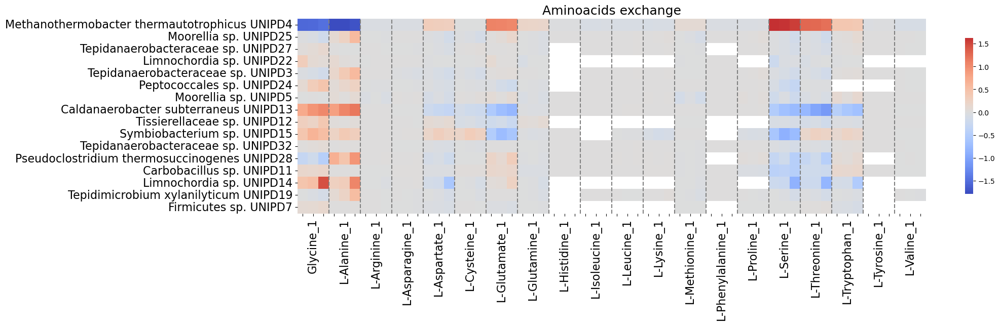

In [519]:
# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

# Concatenate the DataFrames along the columns
df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)
# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min() 
g = sns.heatmap(df_concat, cmap="coolwarm", center=0, vmin=min_, vmax=max_, cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=16)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
# new_ylabels = [label.get_text()[-4:] for label in ylabels]
new_ylabels = [label.get_text() for label in ylabels]
# g.set_yticklabels(new_ylabels, rotation=0)
g.set_yticklabels(new_ylabels, rotation=0, fontsize=16)  # Increase font size for y-axis labels
plt.title('Aminoacids exchange',fontsize=18)
# plt.xlabel('MAG')

# Save the plot
plt.savefig('aminoacids_exchange-NoAA-cons.svg')
plt.show()

###### Fluxes - Arquea

(-10.0, 7.5)

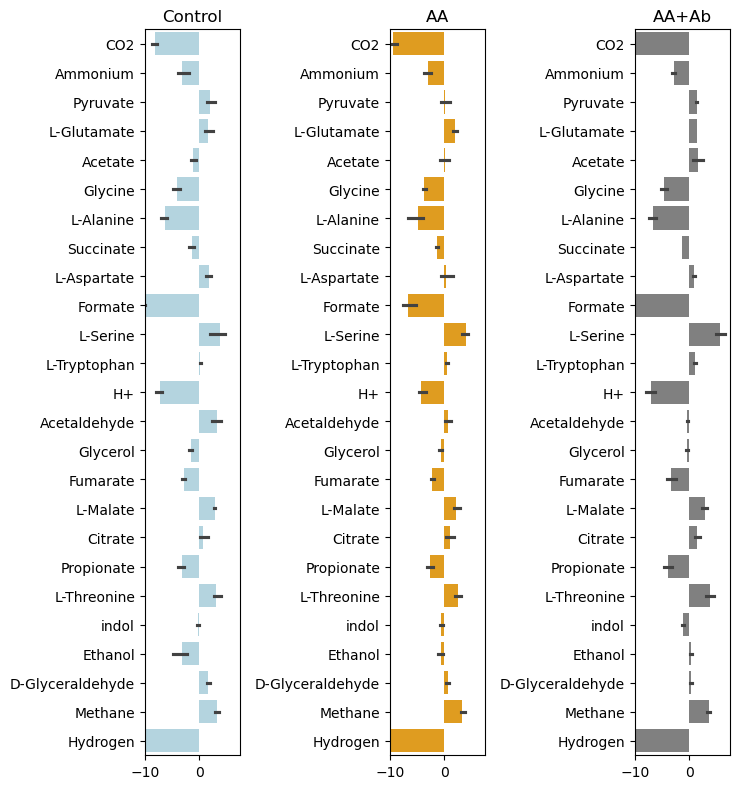

In [466]:
exchanges_sim_e_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('_e')]]

dt_plot = exchanges_sim_e_df.loc[(slice(None), 'maxbin2_spades_001'), :].copy()
idx = dt_plot.abs().max(axis=0) > 1

cpd_to_drop = [
    # 'EX_cpd11640_e',
    # 'EX_cpd00011_e',
    # 'EX_cpd01024_e',
    'EX_cpd00001_e']

dt_plot.drop(columns=cpd_to_drop, inplace=True)
col_name = cpd_modelSeed_to_name([cpd.split('_')[1] for cpd in idx.index])
new_keys = ['EX_'+cpd+'_e' for cpd in col_name.keys()]
col_name = dict(zip(new_keys, col_name.values()))
dt_plot = dt_plot.loc[:, idx]
dt_plot.rename(columns=col_name, inplace=True)

dt_plot_control = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('Control_')], :]
dt_plot_aa = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AA_')], :]
dt_plot_aaab = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AAAb_')], :]

fig, axes = plt.subplots(1, 3, figsize=(7.5, 8.), tight_layout=True)
sns.barplot(data=dt_plot_control, orient='h', color='lightblue', ax=axes[0])
axes[0].set_title('Control')
axes[0].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aa, orient='h', color='orange', ax=axes[1])
axes[1].set_title('AA')
axes[1].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aaab, orient='h', color='grey', ax=axes[2])
axes[2].set_title('AA+Ab')
axes[2].set_xlim(left=-10, right=7.5)

#### Blocking AAs

In [520]:
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockedAA.NoAAConstraint/'
def CheckFluxes(cpd,eof='m',path=path,sp=None):
    files = os.listdir(path)
    indices = ["Control_1_B","Control_2_B","Control_3_B","AA_1_B","AA_2_B","AA_3_B","AAAb_1_B","AAAb_2_B","AAAb_3_B",]
    df = pd.DataFrame(index=indices)
    columnas = []
    if eof == 'm':
        check = "exchanges"
    elif eof == "f":
        check = "fluxes"
    for f in files:
        if f.endswith(".csv") and check in f:
            # print (f, check)
            if check == "exchanges":
                df2 = pd.read_csv(f"{path}{f}", sep=",", index_col=0)
            elif check == "fluxes":
                df2 = pd.read_csv(f"{path}{f}", sep=",", index_col=[0,1])
            else:
                break
            if f.startswith(f"coco_{check}_"):
                f2 = f.replace(f"coco_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.archaea.csv","_c")
                
            elif f.startswith(f"base_{check}_"):
                f2 = f.replace(f"base_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.archaea.csv","_b")

            columnas.append(f2)
            for i in indices:
                try:
                    if check == "exchanges":
                        c = df2.loc[cpd][i]
                    elif check == "fluxes":
                        c = df2.loc[i,sp][cpd]
                except:
                    c = None
                # print (i,f2,c)
                df.loc[i,f2] = c

        columnas.sort()
    return df[columnas]

##########################################################################
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import PowerNorm
import pandas as pd
import seaborn as sns

##########################################################################
df = pd.read_csv(f"{path}coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.archaea.csv", index_col=[0,1])
coverage = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/coverage/coverage.mags.aminoacids.tsv',sep='\t',index_col=0)
aa_names_p = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/AAModelSeed2.tsv'
mags_names_f = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/names.list.tsv'

# Select only AA_1_B and AA_2_B
aa_samples = ['AA_1_B','AA_2_B','AA_3_B']
control_samples = ['Control_1_B','Control_2_B','Control_3_B']
aaab_samples = ['AAAb_1_B','AAAb_2_B']
samples = control_samples + aa_samples + aaab_samples
# Create a dictionary for the AA names
aa_seed = {}
aminoacids = []
with open(aa_names_p)as f:
    for line in f:
        seed = 'EX_'+line.split("\t")[0]+'_e'
        name = line.split("\t")[1].replace("\n","")
        aa_seed[seed] = name
        aminoacids.append(seed)

# Create a dictionary to replace the names of the MAGs
mags_names = {}
with open(mags_names_f)as f:
    for line in f:
        mag = line.split("\t")[0].replace(".","_")
        name = line.split("\t")[1].replace("\n","")
        mags_names[mag] = name

mags = set()
for samples in [aa_samples,control_samples,aaab_samples]:
    ms = list(coverage[samples].mean(axis=1).sort_values().tail(n=13).index)
    mags = mags | set(ms)
mags = set(['vamb.megahit.488']) | mags

# Create functionts to plot the AAs    
def CreateTable(samples,MAGs,cols=''):
    # Select the most abundant mags in those samples
    sure_to_keep = set(['L-Leucine','L-Aspartate','L-Valine'])
    mags = dict(coverage.loc[list(MAGs)][samples].mean(axis=1))
    amino = list(set(aminoacids) & set(df.columns))
    df2 = pd.DataFrame(columns=amino)
    # Create the table for the plot
    for m in mags.keys():
        v = mags[m]
        m = m.replace(".","_")
        ss = []
        for s in aa_samples:
            if (s,m) in df.index:
                ss.append((s,m))
        dftmp = df.loc[ss][amino]
        df1 = pd.DataFrame(dftmp.mean(),columns=[m])*(v/100)
        df2 = pd.concat([df2,df1.T])
        # df2 = df2.append(df1.T)
    df2 = df2.rename(columns=aa_seed,index=mags_names)
    if cols == '':
        filter = np.abs(df2).sum() > 0.00001
        cols = df2.loc[:,filter].columns.tolist()
        cols = list(set(cols) | sure_to_keep)
    df3 = df2[cols]
    return df3

# Plot several plots
def CreatePlot(dataframes,names,number):
    fig, axs = plt.subplots(nrows=number)
    # return sns.heatmap(df,cmap='RdBu_r',center=0)
    i = 0
    for df in dataframes:
        normalized_df = (df - df.mean()) / df.std()
        sns.clustermap(normalized_df, row_cluster=False,col_cluster=False,cmap="RdBu_r",ax=axs[i])
        i += 1

    return fig

# Print samples names
samples = []
for i in df.index:
    if i[0] not in samples:
        samples.append(i[0])

aa_samples = list(set(samples) & set(aa_samples))
control_samples = list(set(samples) & set(control_samples))
aaab_samples = list(set(samples) & set(aaab_samples))

print (samples)

['Control_1_B', 'Control_2_B', 'Control_3_B', 'AA_1_B', 'AA_2_B', 'AA_3_B', 'AAAb_1_B', 'AAAb_2_B']


In [521]:
# Choose the best parameter
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/'
files = os.listdir(path)

# First create the file with the community growth rate
community = pd.DataFrame(columns=['Parameter','sample','Growth_rate'])
# computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/compute.fluxes.230724.out'
computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockedAA.NoAAConstraint/compute.fluxes.240724.NoAAConstraints.BlockedAA.out'
with open(computeFluxes)as file:
    enter = False
    enter2 = False
    for line in file:   
        if 'Running (' in line:
            l = line.split('(')[1]
            parameter = l.split(')')[0].replace(', ','_')
        if '>' in line:
            sample = line.replace('>','').replace('\n','').strip()
            enter = True
            enter2 = False
        if '--- CoCo ---\n' == line:
            enter2 = True
        if enter2 == True and '----------------------------------\n' == line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter, sample, gr)
        elif enter2 == True and 'Finished iter' in line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter,sample,gr)
        elif enter2 == True:
            line0 = line

# plot the community and relate them with OD
path = '~/Documents/esteban/experiments/aa_ab/tables/'
lnOD = pd.read_csv(f'{path}ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}
grSimulation = {}
for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    while i < len(index)-1:
        j = 0
        while j < len(index):
            if index[j] != index[i]:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    if index[j] == 21 and index[i] == 19:
                        grSimulation[col] = gr
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i

grPD = pd.DataFrame.from_dict(gr_average, orient='index')
# sns.lineplot(data=grPD,x=grPD.index,y=0)
samplesSynonims = {'Control_1_B':'Control', 'Control_2_B':'Control.1', 'Control_3_B':'Control.2', 'AA_1_B':'AA', 'AA_2_B':'AA.1','AA_3_B':'AA.2',
            'AAAb_1_B':'AA+Ab','AAAb_2_B':'AA+Ab.1','AAAb_3_B':'AA+Ab.2'}
listas = []
for par in community.Parameter.unique():
    dftmp = community[community['Parameter'] == par]
    dftmp2 = dftmp.copy()
    for i in dftmp.itertuples():
        sample = i[2]
        sample2 = samplesSynonims[sample]
        dftmp2.loc[i[0],'GR_OD'] = gr_average[sample2]
    listas.append(dftmp2)

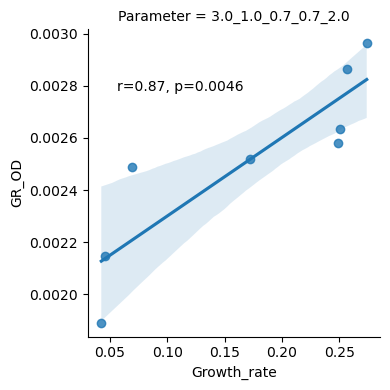

In [523]:
import seaborn as sns
import scipy as sp

# g = sns.lmplot(listas[0],x='Growth_rate',y='GR_OD')
dftmp = pd.DataFrame()
for l in listas:
    dftmp = pd.concat([dftmp,l])

dftmp2 = dftmp[dftmp['Parameter'] == '3.0_1.0_0.7_0.7_2.0']
g = sns.lmplot(x='Growth_rate', y='GR_OD', data=dftmp2, row='Parameter',
               height=4, aspect=1)

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Growth_rate'], data['GR_OD'])
    ax = plt.gca()
    ax.text(.1, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
g.map_dataframe(annotate)
g.savefig('Fig5.B-AA-NoConstraints.svg')

##### Fluxes & AAs

In [524]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
# wd = '/home/bioinfo/users/niber/prj_micronutrients_v2/coco/res/single_run_results_noCH4_ubH_YE_lb_0.001_2.0_1_0.5/' # single_run_results_noCH4_YE_lb_0.001_3_1_0.6/'
# par = 'gamma.1.0.delta.2.0.ct_0.5' # 'gamma.1.0.delta.3.0.ct_0.6'
folder='blockedAA.NoAAConstraint'
blocked='archaea'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 3.3
      The total exchanges are 3.27
      


In [525]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1'].to_clipboard()

In [450]:
exchanges_sim_df.loc[idxs]['EX_cpd01024_e']

             compartment       
Control_1_B  maxbin2_spades_001    2.767939
Control_2_B  maxbin2_spades_001    3.270986
Control_3_B  maxbin2_spades_001    3.491319
AA_1_B       maxbin2_spades_001    3.014742
AA_2_B       maxbin2_spades_001    2.642000
AA_3_B       maxbin2_spades_001    3.509768
AAAb_1_B     maxbin2_spades_001    3.327657
AAAb_2_B     maxbin2_spades_001    4.223489
Name: EX_cpd01024_e, dtype: float64

##### AA

In [526]:
import matplotlib.pyplot as plt

# cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags)
df1 = CreateTable(control_samples,mags)
df3 = CreateTable(aaab_samples,mags)

cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags,cols)
df1 = CreateTable(control_samples,mags,cols)
df3 = CreateTable(aaab_samples,mags,cols)

df11 = df1[np.abs(df1) > 0.00001]
df22 = df2[np.abs(df2) > 0.00001]
df33 = df3[np.abs(df3) > 0.00001]

# np.log(df11+1)
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)


# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

df11.columns = [f'{col}_1' for col in df11.columns]
df22.columns = [f'{col}_2' for col in df22.columns]
df33.columns = [f'{col}_3' for col in df33.columns]

/tmp/ipykernel_6441/4045097436.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/4045097436.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/4045097436.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavio

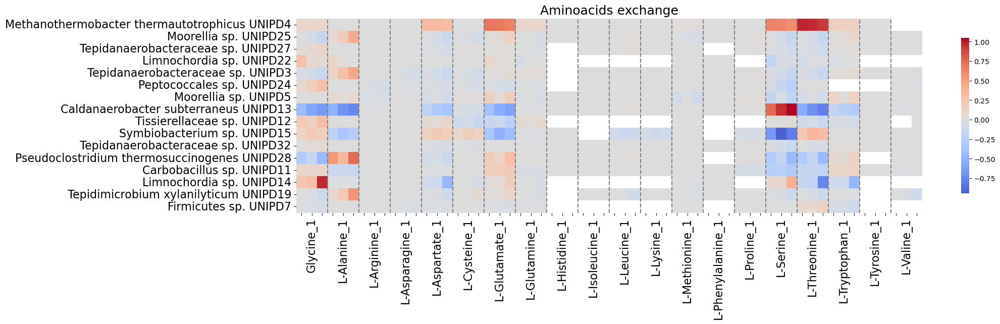

In [527]:
# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

# Concatenate the DataFrames along the columns
df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)
# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min() 
g = sns.heatmap(df_concat, cmap="coolwarm", center=0, vmin=min_, vmax=max_, cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=16)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
# new_ylabels = [label.get_text()[-4:] for label in ylabels]
new_ylabels = [label.get_text() for label in ylabels]
# g.set_yticklabels(new_ylabels, rotation=0)
g.set_yticklabels(new_ylabels, rotation=0, fontsize=16)  # Increase font size for y-axis labels
plt.title('Aminoacids exchange',fontsize=18)
# plt.xlabel('MAG')

# Save the plot
plt.savefig('aminoacids_exchange-NotConstrain-blockAA.svg')
plt.show()

##### Fluxes

(-10.0, 7.5)

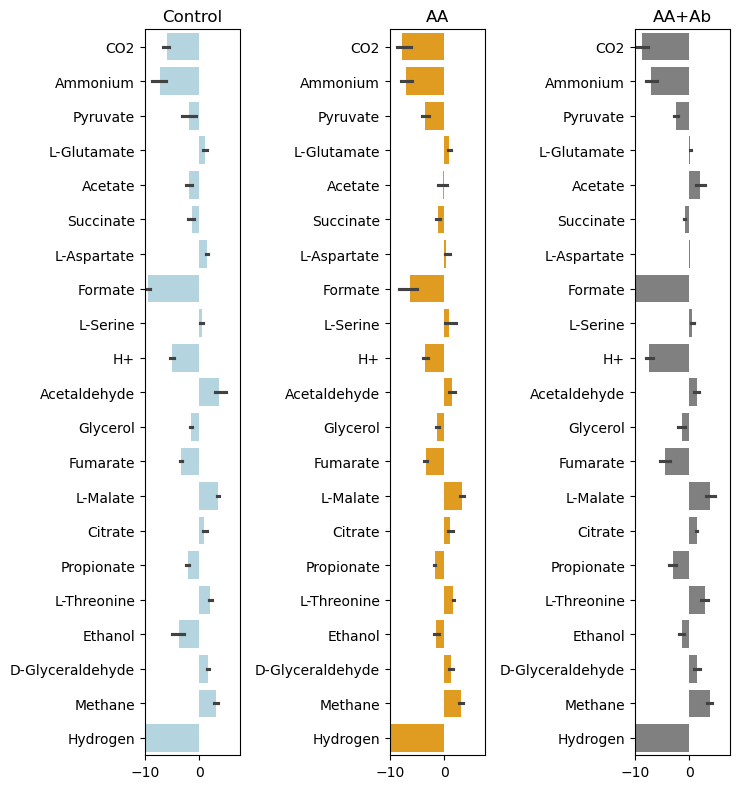

In [528]:
exchanges_sim_e_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('_e')]]

dt_plot = exchanges_sim_e_df.loc[(slice(None), 'maxbin2_spades_001'), :].copy()
idx = dt_plot.abs().max(axis=0) > 1

cpd_to_drop = [
    # 'EX_cpd11640_e',
    # 'EX_cpd00011_e',
    # 'EX_cpd01024_e',
    'EX_cpd00001_e']

dt_plot.drop(columns=cpd_to_drop, inplace=True)
col_name = cpd_modelSeed_to_name([cpd.split('_')[1] for cpd in idx.index])
new_keys = ['EX_'+cpd+'_e' for cpd in col_name.keys()]
col_name = dict(zip(new_keys, col_name.values()))
dt_plot = dt_plot.loc[:, idx]
dt_plot.rename(columns=col_name, inplace=True)

dt_plot_control = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('Control_')], :]
dt_plot_aa = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AA_')], :]
dt_plot_aaab = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AAAb_')], :]

fig, axes = plt.subplots(1, 3, figsize=(7.5, 8.), tight_layout=True)
sns.barplot(data=dt_plot_control, orient='h', color='lightblue', ax=axes[0])
axes[0].set_title('Control')
axes[0].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aa, orient='h', color='orange', ax=axes[1])
axes[1].set_title('AA')
axes[1].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aaab, orient='h', color='grey', ax=axes[2])
axes[2].set_title('AA+Ab')
axes[2].set_xlim(left=-10, right=7.5)

### Blocking AA & NH4

In [763]:
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockAA.0.0001.NH4/'
def CheckFluxes(cpd,eof='m',path=path,sp=None):
    files = os.listdir(path)
    indices = ["Control_1_B","Control_2_B","Control_3_B","AA_1_B","AA_2_B","AA_3_B","AAAb_1_B","AAAb_2_B","AAAb_3_B",]
    df = pd.DataFrame(index=indices)
    columnas = []
    if eof == 'm':
        check = "exchanges"
    elif eof == "f":
        check = "fluxes"
    for f in files:
        if f.endswith(".csv") and check in f:
            # print (f, check)
            if check == "exchanges":
                df2 = pd.read_csv(f"{path}{f}", sep=",", index_col=0)
            elif check == "fluxes":
                df2 = pd.read_csv(f"{path}{f}", sep=",", index_col=[0,1])
            else:
                break
            if f.startswith(f"coco_{check}_"):
                f2 = f.replace(f"coco_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.archaea.csv","_c")
                
            elif f.startswith(f"base_{check}_"):
                f2 = f.replace(f"base_{check}_gamma.","").replace(".0.delta","").replace("0.ct_","").replace("_aa_","_").replace("std_blocked.archaea.csv","_b")

            columnas.append(f2)
            for i in indices:
                try:
                    if check == "exchanges":
                        c = df2.loc[cpd][i]
                    elif check == "fluxes":
                        c = df2.loc[i,sp][cpd]
                except:
                    c = None
                # print (i,f2,c)
                df.loc[i,f2] = c

        columnas.sort()
    return df[columnas]

##########################################################################
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import PowerNorm
import pandas as pd
import seaborn as sns

##########################################################################
df = pd.read_csv(f"{path}coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.archaea.csv", index_col=[0,1])
coverage = pd.read_csv('/home/esteban/Documents/esteban/experiments/aa_ab/coverage/coverage.mags.aminoacids.tsv',sep='\t',index_col=0)
aa_names_p = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/AAModelSeed2.tsv'
mags_names_f = '/home/esteban/Documents/esteban/experiments/aa_ab/tables/names.list.tsv'

# Select only AA_1_B and AA_2_B
aa_samples = ['AA_1_B','AA_2_B','AA_3_B']
control_samples = ['Control_1_B','Control_2_B','Control_3_B']
aaab_samples = ['AAAb_1_B','AAAb_2_B']
samples = control_samples + aa_samples + aaab_samples
# Create a dictionary for the AA names
aa_seed = {}
aminoacids = []
with open(aa_names_p)as f:
    for line in f:
        seed = 'EX_'+line.split("\t")[0]+'_e'
        name = line.split("\t")[1].replace("\n","")
        aa_seed[seed] = name
        aminoacids.append(seed)

# Create a dictionary to replace the names of the MAGs
mags_names = {}
with open(mags_names_f)as f:
    for line in f:
        mag = line.split("\t")[0].replace(".","_")
        name = line.split("\t")[1].replace("\n","")
        mags_names[mag] = name

mags = set()
for samples in [aa_samples,control_samples,aaab_samples]:
    ms = list(coverage[samples].mean(axis=1).sort_values().tail(n=13).index)
    mags = mags | set(ms)
mags = set(['vamb.megahit.488']) | mags

# Create functionts to plot the AAs    
def CreateTable(samples,MAGs,cols=''):
    # Select the most abundant mags in those samples
    sure_to_keep = set(['L-Leucine','L-Aspartate','L-Valine'])
    mags = dict(coverage.loc[list(MAGs)][samples].mean(axis=1))
    amino = list(set(aminoacids) & set(df.columns))
    df2 = pd.DataFrame(columns=amino)
    # Create the table for the plot
    for m in mags.keys():
        v = mags[m]
        m = m.replace(".","_")
        ss = []
        for s in aa_samples:
            if (s,m) in df.index:
                ss.append((s,m))
        dftmp = df.loc[ss][amino]
        df1 = pd.DataFrame(dftmp.mean(),columns=[m])*(v/100)
        df2 = pd.concat([df2,df1.T])
        # df2 = df2.append(df1.T)
    df2 = df2.rename(columns=aa_seed,index=mags_names)
    if cols == '':
        filter = np.abs(df2).sum() > 0.00001
        cols = df2.loc[:,filter].columns.tolist()
        cols = list(set(cols) | sure_to_keep)
    df3 = df2[cols]
    return df3

# Plot several plots
def CreatePlot(dataframes,names,number):
    fig, axs = plt.subplots(nrows=number)
    # return sns.heatmap(df,cmap='RdBu_r',center=0)
    i = 0
    for df in dataframes:
        normalized_df = (df - df.mean()) / df.std()
        sns.clustermap(normalized_df, row_cluster=False,col_cluster=False,cmap="RdBu_r",ax=axs[i])
        i += 1

    return fig

# Print samples names
samples = []
for i in df.index:
    if i[0] not in samples:
        samples.append(i[0])

aa_samples = list(set(samples) & set(aa_samples))
control_samples = list(set(samples) & set(control_samples))
aaab_samples = list(set(samples) & set(aaab_samples))

print (samples)

['Control_1_B', 'Control_2_B', 'Control_3_B', 'AA_1_B', 'AA_2_B', 'AA_3_B', 'AAAb_1_B', 'AAAb_2_B']


In [766]:
# Choose the best parameter
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/'
files = os.listdir(path)

# First create the file with the community growth rate
community = pd.DataFrame(columns=['Parameter','sample','Growth_rate'])
# computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/compute.fluxes.230724.out'
computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockedAA.NoAAConstraint/compute.fluxes.240724.NoAAConstraints.BlockedAA.out'
computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blockAA.0.0001.NH4/compute.fluxes.240724.BlockedAA.0.00001.NH4.out'
with open(computeFluxes)as file:
    enter = False
    enter2 = False
    for line in file:   
        if 'Running (' in line:
            l = line.split('(')[1]
            parameter = l.split(')')[0].replace(', ','_')
        if '>' in line:
            sample = line.replace('>','').replace('\n','').strip()
            enter = True
            enter2 = False
        if '--- CoCo ---\n' == line:
            enter2 = True
        if enter2 == True and '----------------------------------\n' == line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter, sample, gr)
        elif enter2 == True and 'Finished iter' in line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter,sample,gr)
        elif enter2 == True:
            line0 = line

# plot the community and relate them with OD
path = '~/Documents/esteban/experiments/aa_ab/tables/'
lnOD = pd.read_csv(f'{path}ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}
grSimulation = {}
for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    while i < len(index)-1:
        j = 0
        while j < len(index):
            if index[j] != index[i]:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    if index[j] == 21 and index[i] == 19:
                        grSimulation[col] = gr
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i

grPD = pd.DataFrame.from_dict(gr_average, orient='index')
# sns.lineplot(data=grPD,x=grPD.index,y=0)
samplesSynonims = {'Control_1_B':'Control', 'Control_2_B':'Control.1', 'Control_3_B':'Control.2', 'AA_1_B':'AA', 'AA_2_B':'AA.1','AA_3_B':'AA.2',
            'AAAb_1_B':'AA+Ab','AAAb_2_B':'AA+Ab.1','AAAb_3_B':'AA+Ab.2'}
listas = []
for par in community.Parameter.unique():
    dftmp = community[community['Parameter'] == par]
    dftmp2 = dftmp.copy()
    for i in dftmp.itertuples():
        sample = i[2]
        sample2 = samplesSynonims[sample]
        dftmp2.loc[i[0],'GR_OD'] = gr_average[sample2]
    listas.append(dftmp2)

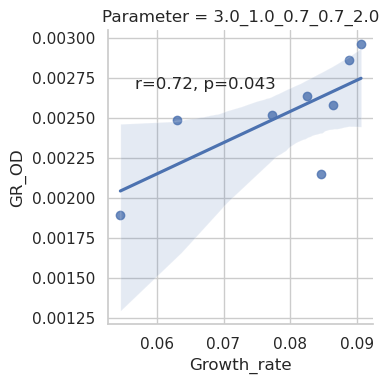

In [767]:
import seaborn as sns
import scipy as sp

# g = sns.lmplot(listas[0],x='Growth_rate',y='GR_OD')
dftmp = pd.DataFrame()
for l in listas:
    dftmp = pd.concat([dftmp,l])

dftmp2 = dftmp[dftmp['Parameter'] == '3.0_1.0_0.7_0.7_2.0']
g = sns.lmplot(x='Growth_rate', y='GR_OD', data=dftmp2, row='Parameter',
               height=4, aspect=1)

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Growth_rate'], data['GR_OD'])
    ax = plt.gca()
    ax.text(.1, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
g.map_dataframe(annotate)
g.savefig('Fig5.B-AA-BlockAA-NH4.svg')

#### Fluxes & AA

In [768]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
# wd = '/home/bioinfo/users/niber/prj_micronutrients_v2/coco/res/single_run_results_noCH4_ubH_YE_lb_0.001_2.0_1_0.5/' # single_run_results_noCH4_YE_lb_0.001_3_1_0.6/'
# par = 'gamma.1.0.delta.2.0.ct_0.5' # 'gamma.1.0.delta.3.0.ct_0.6'
folder='blockAA.0.0001.NH4/'
blocked='archaea'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 2.97
      The total exchanges are 2.94
      


In [769]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1'].to_clipboard()

In [770]:
exchanges_sim_df.loc[idxs]['EX_cpd01024_e']

             compartment       
Control_1_B  maxbin2_spades_001    2.521211
Control_2_B  maxbin2_spades_001    2.944836
Control_3_B  maxbin2_spades_001    2.859930
AA_1_B       maxbin2_spades_001    2.168120
AA_2_B       maxbin2_spades_001    2.110924
AA_3_B       maxbin2_spades_001    2.884132
AAAb_1_B     maxbin2_spades_001    1.903087
AAAb_2_B     maxbin2_spades_001    2.580903
Name: EX_cpd01024_e, dtype: float64

#### AA

In [771]:
import matplotlib.pyplot as plt

# cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags)
df1 = CreateTable(control_samples,mags)
df3 = CreateTable(aaab_samples,mags)

cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags,cols)
df1 = CreateTable(control_samples,mags,cols)
df3 = CreateTable(aaab_samples,mags,cols)

df11 = df1[np.abs(df1) > 0.00001]
df22 = df2[np.abs(df2) > 0.00001]
df33 = df3[np.abs(df3) > 0.00001]

# np.log(df11+1)
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)


# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

df11.columns = [f'{col}_1' for col in df11.columns]
df22.columns = [f'{col}_2' for col in df22.columns]
df33.columns = [f'{col}_3' for col in df33.columns]

/tmp/ipykernel_6441/1550402055.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/1550402055.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_6441/1550402055.py:101: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavio

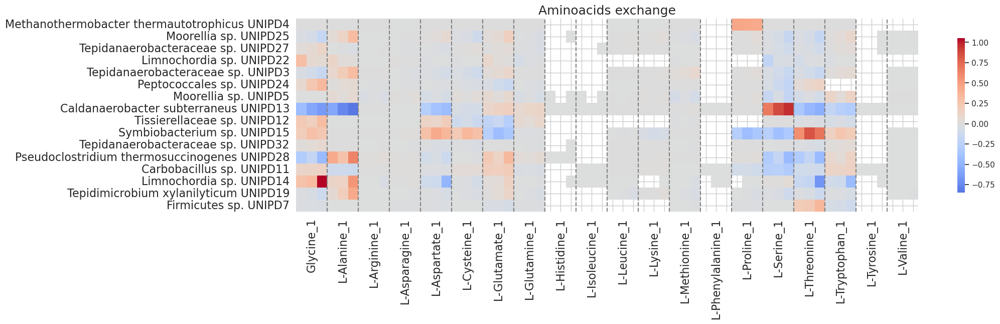

In [772]:
# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

# Concatenate the DataFrames along the columns
df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)
# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min() 
g = sns.heatmap(df_concat, cmap="coolwarm", center=0, vmin=min_, vmax=max_, cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=16)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
# new_ylabels = [label.get_text()[-4:] for label in ylabels]
new_ylabels = [label.get_text() for label in ylabels]
# g.set_yticklabels(new_ylabels, rotation=0)
g.set_yticklabels(new_ylabels, rotation=0, fontsize=16)  # Increase font size for y-axis labels
plt.title('Aminoacids exchange',fontsize=18)
# plt.xlabel('MAG')

# Save the plot
plt.savefig('aminoacids_exchange-NotConstrain-blockAA.svg')
plt.show()

#### Fluxes

(-10.0, 7.5)

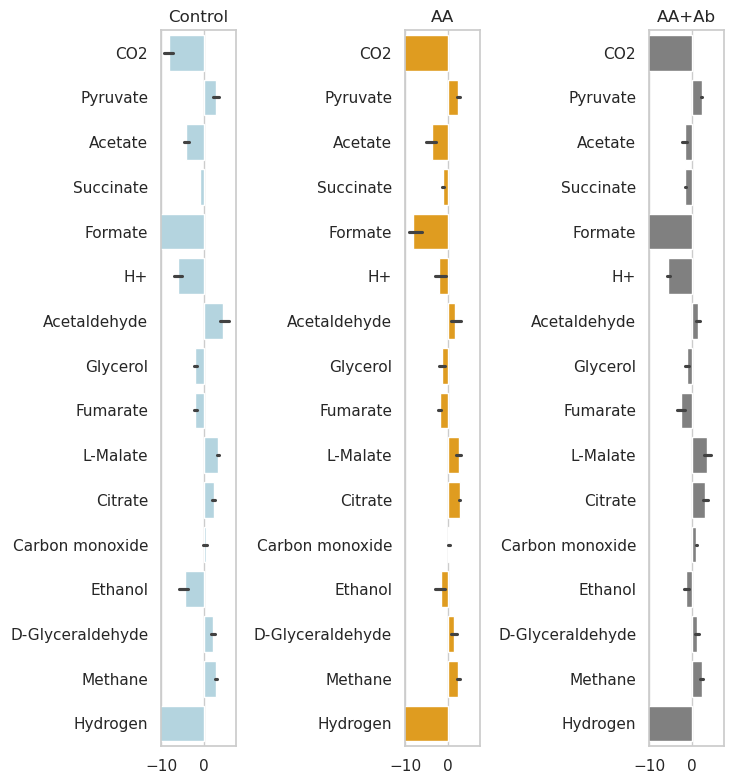

In [773]:
exchanges_sim_e_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('_e')]]

dt_plot = exchanges_sim_e_df.loc[(slice(None), 'maxbin2_spades_001'), :].copy()
idx = dt_plot.abs().max(axis=0) > 1

cpd_to_drop = [
    # 'EX_cpd11640_e',
    # 'EX_cpd00011_e',
    # 'EX_cpd01024_e',
    'EX_cpd00001_e']

dt_plot.drop(columns=cpd_to_drop, inplace=True)
col_name = cpd_modelSeed_to_name([cpd.split('_')[1] for cpd in idx.index])
new_keys = ['EX_'+cpd+'_e' for cpd in col_name.keys()]
col_name = dict(zip(new_keys, col_name.values()))
dt_plot = dt_plot.loc[:, idx]
dt_plot.rename(columns=col_name, inplace=True)

dt_plot_control = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('Control_')], :]
dt_plot_aa = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AA_')], :]
dt_plot_aaab = dt_plot.loc[dt_plot.index[dt_plot.index.get_level_values(0).str.contains('AAAb_')], :]

fig, axes = plt.subplots(1, 3, figsize=(7.5, 8.), tight_layout=True)
sns.barplot(data=dt_plot_control, orient='h', color='lightblue', ax=axes[0])
axes[0].set_title('Control')
axes[0].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aa, orient='h', color='orange', ax=axes[1])
axes[1].set_title('AA')
axes[1].set_xlim(left=-10, right=7.5) 
sns.barplot(data=dt_plot_aaab, orient='h', color='grey', ax=axes[2])
axes[2].set_title('AA+Ab')
axes[2].set_xlim(left=-10, right=7.5)

In [774]:
dt_plot[['Formate','Hydrogen','CO2']]

,,Formate,Hydrogen,CO2
,compartment,,,
Control_1_B,maxbin2_spades_001,-12.342516,-15.635845,-9.486255
Control_2_B,maxbin2_spades_001,-10.962022,-15.280276,-7.314674
Control_3_B,maxbin2_spades_001,-12.086425,-15.817137,-7.630630
AA_1_B,maxbin2_spades_001,-9.177324,-16.547492,-10.824733
AA_2_B,maxbin2_spades_001,-9.191969,-23.122196,-11.023271
AA_3_B,maxbin2_spades_001,-6.202582,-24.275225,-12.360525
AAAb_1_B,maxbin2_spades_001,-12.069016,-25.161993,-11.726948
AAAb_2_B,maxbin2_spades_001,-15.330598,-31.438519,-14.492510


### OUT

In [ ]:
# Choose the best parameter
path = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/'
files = os.listdir(path)

# First create the file with the community growth rate
community = pd.DataFrame(columns=['Parameter','sample','Growth_rate'])
computeFluxes = '/home/esteban/Documents/esteban/experiments/aa_ab/simulations/blocked_aminoacids_lower/compute.fluxes.block_aa.lower.out'
with open(computeFluxes)as file:
    enter = False
    enter2 = False
    for line in file:   
        if 'Running (' in line:
            l = line.split('(')[1]
            parameter = l.split(')')[0].replace(', ','_')
        if '>' in line:
            sample = line.replace('>','').replace('\n','').strip()
            enter = True
            enter2 = False
        if '--- CoCo ---\n' == line:
            enter2 = True
        if enter2 == True and '----------------------------------\n' == line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter, sample, gr)
        elif enter2 == True and 'Finished iter' in line:
            gr = line0.replace('\n','')
            try:
                gr = float(gr)
                community.loc[len(community)] = (parameter,sample,gr)
                enter = False
                enter2 = False
            except:
                print (parameter,sample,gr)
        elif enter2 == True:
            line0 = line

# plot the community and relate them with OD
path = '~/Documents/esteban/experiments/aa_ab/tables/'
lnOD = pd.read_csv(f'{path}ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}
grSimulation = {}
for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    while i < len(index)-1:
        j = 0
        while j < len(index):
            if index[j] != index[i]:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    if index[j] == 21 and index[i] == 19:
                        grSimulation[col] = gr
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i

grPD = pd.DataFrame.from_dict(gr_average, orient='index')
# sns.lineplot(data=grPD,x=grPD.index,y=0)
samplesSynonims = {'Control_1_B':'Control', 'Control_2_B':'Control.1', 'Control_3_B':'Control.2', 'AA_1_B':'AA', 'AA_2_B':'AA.1','AA_3_B':'AA.2',
            'AAAb_1_B':'AA+Ab','AAAb_2_B':'AA+Ab.1','AAAb_3_B':'AA+Ab.2'}
listas = []
for par in community.Parameter.unique():
    dftmp = community[community['Parameter'] == par]
    dftmp2 = dftmp.copy()
    for i in dftmp.itertuples():
        sample = i[2]
        sample2 = samplesSynonims[sample]
        dftmp2.loc[i[0],'GR_OD'] = gr_average[sample2]
    listas.append(dftmp2)

3.0_1.0_0.7_0.7_2.0 AA_1_B Couldn't run coco on sample AA_1_B
3.0_1.0_0.7_0.7_2.0 AA_3_B Couldn't run coco on sample AA_3_B
3.0_1.0_0.7_0.7_2.0 AAAb_1_B Couldn't run coco on sample AAAb_1_B
3.0_1.0_0.7_0.7_2.0 AAAb_2_B Couldn't run coco on sample AAAb_2_B


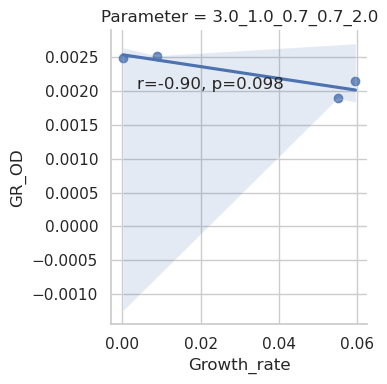

In [ ]:
import seaborn as sns
import scipy as sp

# g = sns.lmplot(listas[0],x='Growth_rate',y='GR_OD')
dftmp = pd.DataFrame()
for l in listas:
    dftmp = pd.concat([dftmp,l])

dftmp2 = dftmp[dftmp['Parameter'] == '3.0_1.0_0.7_0.7_2.0']
g = sns.lmplot(x='Growth_rate', y='GR_OD', data=dftmp2, row='Parameter',
               height=4, aspect=1)

def annotate(data, **kws):
    r, p = sp.stats.pearsonr(data['Growth_rate'], data['GR_OD'])
    ax = plt.gca()
    ax.text(.1, .8, 'r={:.2f}, p={:.2g}'.format(r, p),
            transform=ax.transAxes)
g.map_dataframe(annotate)
# g.savefig('Fig5.B.svg')

### Normalize data

In [ ]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'

folder='run_230724'
blocked='none'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 3.39
      The total exchanges are 3.36
      


In [419]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1']

             compartment       
Control_1_B  maxbin2_spades_001    0.062475
Control_2_B  maxbin2_spades_001    0.000018
Control_3_B  maxbin2_spades_001    0.000000
AA_1_B       maxbin2_spades_001    0.050435
AA_2_B       maxbin2_spades_001    0.076187
AA_3_B       maxbin2_spades_001    0.003068
AAAb_1_B     maxbin2_spades_001    0.108393
AAAb_2_B     maxbin2_spades_001    0.087410
Name: bio1, dtype: float64

In [420]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
# wd = '/home/bioinfo/users/niber/prj_micronutrients_v2/coco/res/single_run_results_noCH4_ubH_YE_lb_0.001_2.0_1_0.5/' # single_run_results_noCH4_YE_lb_0.001_3_1_0.6/'
# par = 'gamma.1.0.delta.2.0.ct_0.5' # 'gamma.1.0.delta.3.0.ct_0.6'
folder='blockedAA.lower'
blocked='archaea'
exchanges_sim_f = path+ 'simulations/'+ folder +'/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
import_sim_f = path + 'simulations/'+ folder + '/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.'+blocked+'.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 3.1
      The total exchanges are 3.08
      


In [421]:
idxs = []
for i in exchanges_sim_df.index:
    if 'maxbin2_spades_001' in i[1]:
        idxs.append(i)
exchanges_sim_df.loc[idxs]['bio1']

             compartment       
Control_1_B  maxbin2_spades_001    0.062298
Control_2_B  maxbin2_spades_001    0.000000
Control_3_B  maxbin2_spades_001    0.000000
AA_1_B       maxbin2_spades_001    0.082590
AA_3_B       maxbin2_spades_001    0.085806
AAAb_1_B     maxbin2_spades_001    0.120209
AAAb_2_B     maxbin2_spades_001    0.086583
Name: bio1, dtype: float64

### __AA Plot__

In [ ]:
import matplotlib.pyplot as plt

# cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags)
df1 = CreateTable(control_samples,mags)
df3 = CreateTable(aaab_samples,mags)

cols = list(set(df1.columns) | set(df2.columns) | set(df3.columns))

df2 = CreateTable(aa_samples,mags,cols)
df1 = CreateTable(control_samples,mags,cols)
df3 = CreateTable(aaab_samples,mags,cols)

df11 = df1[np.abs(df1) > 0.00001]
df22 = df2[np.abs(df2) > 0.00001]
df33 = df3[np.abs(df3) > 0.00001]

/tmp/ipykernel_15574/3545126966.py:102: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_15574/3545126966.py:102: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df2 = pd.concat([df2,df1.T])
/tmp/ipykernel_15574/3545126966.py:102: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old beha

In [ ]:
# np.log(df11+1)
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)


# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

df11.columns = [f'{col}_1' for col in df11.columns]
df22.columns = [f'{col}_2' for col in df22.columns]
df33.columns = [f'{col}_3' for col in df33.columns]

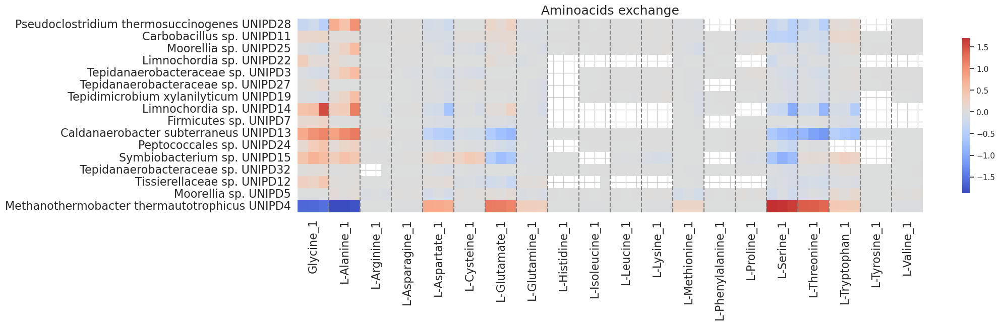

In [ ]:
# Add a suffix to the columns to differentiate them
df1_log.columns = [f'{col}_1' for col in df1_log.columns]
df2_log.columns = [f'{col}_2' for col in df2_log.columns]
df3_log.columns = [f'{col}_3' for col in df3_log.columns]

# Concatenate the DataFrames along the columns
df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)
# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min() 
g = sns.heatmap(df_concat, cmap="coolwarm", center=0, vmin=min_, vmax=max_, cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=16)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
# new_ylabels = [label.get_text()[-4:] for label in ylabels]
new_ylabels = [label.get_text() for label in ylabels]
# g.set_yticklabels(new_ylabels, rotation=0)
g.set_yticklabels(new_ylabels, rotation=0, fontsize=16)  # Increase font size for y-axis labels
plt.title('Aminoacids exchange',fontsize=18)
# plt.xlabel('MAG')

# Save the plot
plt.savefig('aminoacids_exchange2.svg')
plt.show()

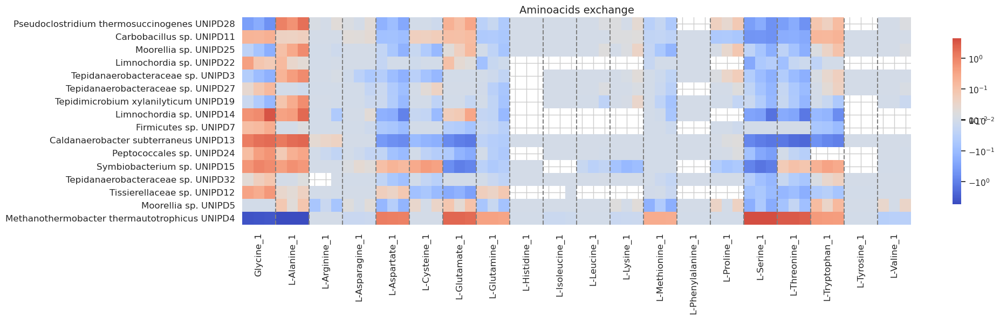

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.colors import SymLogNorm



# Concatenate the DataFrames along the columns
# df_concat = pd.concat([df1_log, df2_log, df3_log], axis=1)
# df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)

df_concat = pd.concat([df11, df22, df33], axis=1)
df_concat = df_concat.reindex(sorted(df_concat.columns), axis=1)

# Plot the heatmap
plt.figure(figsize=(20, 5))
max_ = df_concat.max().max()
min_ = df_concat.min().min()

# Create a custom symmetric logarithmic norm with a small threshold around zero
norm = SymLogNorm(linthresh=0.01, linscale=0.01, vmin=min_, vmax=max_, base=10)

g = sns.heatmap(df_concat, cmap="coolwarm", center=0,vmax=max_,vmin=min_,norm=norm,cbar_kws={"shrink": 0.8})

# Adjust the x-axis labels
xticks_labels = df11.reindex(sorted(df11.columns), axis=1).columns.tolist()
new_xticks_labels = []
for label in xticks_labels:
    new_xticks_labels.extend(['', label, ''])

g.set_xticklabels(new_xticks_labels, rotation=90, fontsize=12)

# Add grey vertical lines to separate groups
for i in range(3, len(df_concat.columns), 3):
    plt.axvline(x=i, color='grey', linestyle='--')

# Truncate y-axis labels to last four characters
ylabels = g.get_yticklabels()
new_ylabels = [label.get_text() for label in ylabels]
g.set_yticklabels(new_ylabels, rotation=0, fontsize=12)  # Increase font size for y-axis labels

plt.title('Aminoacids exchange', fontsize=14)

# Save the plot
plt.savefig('aminoacids_exchange2.svg')
plt.show()

### __Fluxes__

In [ ]:
# Load and normalize the fluxes of bacteria based on relative abundance
# Load exchanges and fluxes to medium
path = '/home/esteban/Documents/esteban/experiments/aa_ab/'
# wd = '/home/bioinfo/users/niber/prj_micronutrients_v2/coco/res/single_run_results_noCH4_ubH_YE_lb_0.001_2.0_1_0.5/' # single_run_results_noCH4_YE_lb_0.001_3_1_0.6/'
# par = 'gamma.1.0.delta.2.0.ct_0.5' # 'gamma.1.0.delta.3.0.ct_0.6'
exchanges_sim_f = path+ 'simulations/run_110724/coco_fluxes_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.none.csv'
import_sim_f = path + 'simulations/run_110724/coco_exchanges_gamma.1.0.delta.3.0.ct_0.7_aa_2.0std_blocked.none.csv'
exchanges_sim_df = pd.read_csv(exchanges_sim_f, index_col=[0,1])
import_sim_df = pd.read_csv(import_sim_f, index_col=[0])
# load MAG relative abundances 
abundances_f = f"{path}coverage/coverage.mags.aminoacids.tsv"
abundances_df = pd.read_csv(abundances_f, sep="\t", index_col=0)
abundances_df = abundances_df/100
abundance_threshold = 0.00001
# get the abundance of each species in each sample in order 
abundances = []
considered_samples = abundances_df.columns[abundances_df.columns.str.contains("_B")]

for idx in exchanges_sim_df.index:
    sample,mag = idx
    mag2 = mag.replace("_",".")
    if 'concoct' in mag2:
        mag2 = mag
    exchanges_sim_df.loc[idx] = exchanges_sim_df.loc[idx] * abundances_df.loc[mag2][sample]

# sanity checks on normalization
cpd = "cpd01024" # "cpd01024" # "cpd00011" # cpd00001 
ex = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("_e")]
rxns = exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains("rxn")]
print("""
      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is {}
      The total exchanges are {}
      """.format(
                round(import_sim_df.loc["EX_"+cpd+"_m",considered_samples[1]], 2), 
                round(sum(exchanges_sim_df.loc[considered_samples[1],"EX_"+cpd+"_e"]), 2)))

# set to zero fluxes below the limit of sensitivity of the solver 
exchanges_sim_df[exchanges_sim_df.abs() < 1e-6] = 0
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[exchanges_sim_df.isna().all()]) # remove rxn with not predicted fluxes
exchanges_sim_df = exchanges_sim_df.drop(columns = exchanges_sim_df.columns[(abs(exchanges_sim_df) < 1e-6).all()]) # remove rxn with fluxes under the sensitivity limit


      This is a sanity check, if the numbers are closed the normalization was correct
      The total import from the medium is 3.39
      The total exchanges are 3.36
      


In [ ]:
exchanges_sim_df

DM_cpd01042_c  EX_cpd00001_e  EX_cpd00003_e  \
            compartment                                                        
Control_1_B vamb_spades_6             0.000774      -0.006309            NaN   
            vamb_megahit_39           0.000838      -0.023994            NaN   
            metabat1_spades_2         0.000349      -0.012750            NaN   
            vamb_spades_267           0.000807      -0.065754            NaN   
            metabat2_spades_18        0.000000      -0.248618       0.006021   
...                                        ...            ...            ...   
AAAb_2_B    vamb_spades_108           0.000000      -0.299734            NaN   
            metabat2_megahit_24       0.000000      -0.824366            NaN   
            vamb_megahit_488          0.000000      -0.144155       0.000000   
            metabat2_megahit_14       0.000000      -0.057960      -0.010159   
            maxbin2_spades_001        0.000000      23.638820            NaN   

                                 EX_cpd00006_e  EX_cpd00009_e  EX_cpd00010_e  \
            compartment                                                        
Control_1_B vamb_spades_6                  NaN      -0.006166       0.000347   
            vamb_megahit_39                NaN      -0.010833       0.000369   
            metabat1_spades_2              NaN      -0.001608       0.000536   
            vamb_spades_267           0.001058       0.028605       0.000410   
            metabat2_spades_18       -0.009098       0.071352            NaN   
...                                        ...            ...            ...   
AAAb_2_B    vamb_spades_108                NaN       0.162694            NaN   
            metabat2_megahit_24       0.000000       0.000124       0.000000   
            vamb_megahit_488               NaN       0.027000       0.000000   
            metabat2_megahit_14       0.007005      -0.030553            NaN   
            maxbin2_spades_001             NaN      -0.072974       0.000003   

                                 EX_cpd00011_e  EX_cpd00012_e  EX_cpd00013_e  \
            compartment                                                        
Control_1_B vamb_spades_6             0.052157       0.002441       0.027176   
            vamb_megahit_39           0.192070       0.004863       0.083600   
            metabat1_spades_2         0.128813            NaN       0.072757   
            vamb_spades_267           0.079150      -0.016649       0.046062   
            metabat2_spades_18       -0.208623      -0.028234      -0.175857   
...                                        ...            ...            ...   
AAAb_2_B    vamb_spades_108           0.190473      -0.081327      -0.109448   
            metabat2_megahit_24       1.532893            NaN       0.606304   
            vamb_megahit_488          0.592103      -0.013500      -0.044494   
            metabat2_megahit_14       0.082300       0.014928       0.007818   
            maxbin2_spades_001      -14.873166            NaN      -4.419381   

                                 EX_cpd00017_e  ...  rxn13182_c  rxn13649_c  \
            compartment                         ...                           
Control_1_B vamb_spades_6            -0.001396  ...         NaN         NaN   
            vamb_megahit_39          -0.000863  ...         NaN         NaN   
            metabat1_spades_2         0.000440  ...         NaN         NaN   
            vamb_spades_267          -0.000727  ...         NaN         NaN   
            metabat2_spades_18        0.000562  ...         NaN         NaN   
...                                        ...  ...         ...         ...   
AAAb_2_B    vamb_spades_108           0.000002  ...         NaN         NaN   
            metabat2_megahit_24       0.000002  ...         NaN         NaN   
            vamb_megahit_488          0.000000  ...         NaN         NaN   
            metabat2_megahit_14          

In [ ]:
# Crear un diccionario con los nombres
nombres = pd.read_csv('/home/esteban/bin/gapseq/dat/seed_metabolites_edited.tsv',sep='\t', index_col=0)
names = pd.Series(nombres.name.values,index=nombres.index).to_dict()
names2 = {}
for i in names.keys():
    i2 = 'EX_'+i+'_e'
    names2[i2] = names[i]

In [ ]:
def cpd_modelSeed_to_name(cpd_list):
    seed_metabolites_df = pd.read_csv("/home/esteban/Documents/db/seed_metabolites_edited.tsv", sep="\t", index_col=0)
    cpd_modelSeed_to_name_dict = dict(seed_metabolites_df.loc[cpd_list, 'name'])
    return cpd_modelSeed_to_name_dict

def rxn_modelSeed_to_name(rxn_list):
    seed_reactions_f = '/home/esteban/Documents/db/seed_reactions_corrected.tsv'
    seed_reactions_df = pd.read_csv(seed_reactions_f, sep='\t', index_col=0)
    return dict(seed_reactions_df.loc[rxn_list, 'name'])

In [ ]:
exchanges_sim_e_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('_e')]]
exchanges_sim_rxn_df = exchanges_sim_df.loc[:,exchanges_sim_df.columns[exchanges_sim_df.columns.str.contains('rxn')]]

idx = exchanges_sim_e_df.abs().max(axis=0) > 0.01
idx = list(idx[idx==True].index)
exchanges_changed = exchanges_sim_e_df[idx].rename(names2,axis=1)

idx_rxn = exchanges_sim_rxn_df.abs().max(axis=0) > 0.01
idx_rxn = list(idx_rxn[idx_rxn==True].index)
exchanges_changed_rxn = exchanges_sim_rxn_df[idx_rxn]#.rename(names2,axis=1)

control = samples[0:3]
aa = samples[3:6]
aaab = samples[6:]
conditions = [control,aa,aaab]

exchanges_conditions = pd.DataFrame()
exchanges_conditions_rxn = pd.DataFrame()
for mag in mags_names.keys():
    n = mags_names[mag]
    for c in conditions:
        condicion = c[0].split("_")[0]
        indices = []
        indices_rxn = []
        for s in c:
            if (s,mag) in exchanges_changed.index:
                indices.append([s,mag])
                indices_rxn.append([s,mag])
        if len(indices) > 0:
            # exchanges_changed.loc[indices].mean()
            dftmp = pd.DataFrame(exchanges_changed.loc[indices].mean()).T.rename({0:condicion})
            dftmp['MAG'] = mags_names[mag]
            exchanges_conditions = pd.concat([exchanges_conditions,dftmp])

            dftmp_rxn = pd.DataFrame(exchanges_changed_rxn.loc[indices_rxn].mean()).T.rename({0:condicion})
            dftmp_rxn['MAG'] = mags_names[mag]
            exchanges_conditions_rxn = pd.concat([exchanges_conditions_rxn,dftmp_rxn])
        elif len(indices_rxn) > 0:
            dftmp_rxn = pd.DataFrame(exchanges_changed_rxn.loc[indices_rxn].mean()).T.rename({0:condicion})
            dftmp_rxn['MAG'] = mags_names[mag]
            exchanges_conditions_rxn = pd.concat([exchanges_conditions_rxn,dftmp_rxn])

In [ ]:
exchanges_conditions.to_clipboard()

In [ ]:
exchanges_conditions_rxn.to_clipboard()

In [ ]:
rxns_selected = ['rxn00278_c','rxn00250_c','rxn00248_c','rxn00799_c','rxn13706_c','rxn00285_c','rxn31312_c','rxn00187_c','rxn00189_c','rxn00175_c','rxn01018_c','rxn00279_c','MAG']
pd4 = exchanges_conditions_rxn[exchanges_conditions_rxn['MAG'] == 'Methanothermobacter thermautotrophicus UNIPD4'][rxns_selected]

pd4.drop('MAG',axis=1,inplace=True)



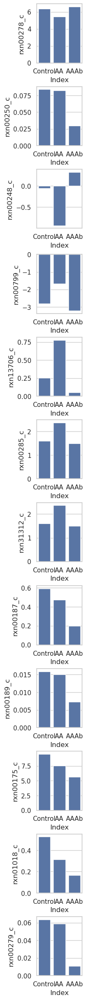

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Número de columnas

num_columns = len(pd4.columns)

# Crear subplots
fig, axes = plt.subplots(num_columns, 1, figsize=(2, 2 * num_columns), constrained_layout=True)

# Iterar sobre cada columna y crear un gráfico de barras
for i, col in enumerate(pd4.columns):
    sns.barplot(x=pd4.index, y=pd4[col], ax=axes[i])
    # axes[i].set_title(f'Bar Plot for {col}')
    axes[i].set_ylabel(col)
    axes[i].set_xlabel('Index')

# Mostrar la gráfica
plt.savefig('rxns.svg')

In [ ]:
# sp = 'maxbin2_spades_001' # PD4
sp = 'metabat2_megahit_33' # PD12
sp = 'maxbin2_spades_028' # PD6
sp = 'vamb_megahit_39' # PD18
sp = 'metabat2_spades_15' # PD13

# Create a table only with the exchanges
def takeIndex(df,sp):
    idx = []
    for i in df.index:
        if i[1] == sp:
            idx.append(i)
    return idx
exchanges = []
for col in exchanges_sim_df.columns:
    if col.startswith('EX'):
        exchanges.append(col)

exchanges_sim_df.loc[takeIndex(exchanges_sim_df,sp)][exchanges].sum().sort_values().rename(names2).to_clipboard()


,,DM_cpd01042_c,EX_cpd00001_e,EX_cpd00003_e,EX_cpd00006_e,EX_cpd00009_e,EX_cpd00010_e,EX_cpd00011_e,EX_cpd00012_e,EX_cpd00013_e,EX_cpd00017_e,...,rxn90084_c,rxn90093_c,rxn90095_c,rxn90096_c,rxn90105_c,rxn90109_c,rxn90112_c,rxn90113_c,rxn90114_c,rxn90115_c
,compartment,,,,,,,,,,,,,,,,,,,,,
Control_1_B,metabat2_spades_15,0.000435,-2.669335,-0.013631,0.013737,-0.003089,0.000258,1.648473,-0.005917,-0.622344,-0.000433,...,NaN,NaN,NaN,0.001270,0.0,NaN,0.0,NaN,NaN,0.001337
Control_2_B,metabat2_spades_15,0.002363,-2.419170,-0.014551,0.015084,-0.123496,0.001119,2.167322,0.051494,0.867535,-0.001825,...,NaN,NaN,NaN,0.006929,0.0,NaN,0.0,NaN,NaN,0.003928
Control_3_B,metabat2_spades_15,0.002739,-2.554111,-0.022826,0.023532,-0.142752,0.001415,2.098571,0.056128,0.568701,-0.001950,...,NaN,NaN,NaN,0.007835,0.0,NaN,0.0,NaN,NaN,0.005182
AA_1_B,metabat2_spades_15,0.000908,-3.361828,-0.015745,0.016050,-0.109920,0.000367,2.069792,0.045905,1.072507,-0.000634,...,NaN,NaN,NaN,0.008698,0.0,NaN,0.0,NaN,NaN,0.005869
AA_2_B,metabat2_spades_15,0.000000,-3.274764,-0.012336,0.012337,-0.103139,0.000000,2.153900,0.045401,1.037472,0.000000,...,NaN,NaN,NaN,0.007258,0.0,NaN,0.0,NaN,NaN,0.005589
AAAb_1_B,metabat2_spades_15,0.000577,-2.895951,-0.007909,0.008050,-0.188208,0.000197,2.221250,0.089562,1.104669,-0.000486,...,NaN,NaN,NaN,0.005755,0.0,NaN,0.0,NaN,NaN,0.004950
AAAb_2_B,metabat2_spades_15,0.000606,-5.495923,-0.013436,0.013565,-0.011044,0.000249,3.762772,-0.001871,1.775767,-0.000484,...,NaN,NaN,NaN,0.007422,0.0,NaN,0.0,NaN,NaN,0.006592


In [ ]:
# Create a table only with the exchanges
# exchanges already created before
# for i in exchanges_sim_df.loc[control,].index:    

['Control_1_B', 'Control_2_B', 'Control_3_B']
['AA_1_B', 'AA_2_B', 'AA_3_B']
['AAAb_1_B', 'AAAb_2_B']


In [ ]:
# import seaborn  as sns
# import matplotlib.pyplot as plt

# f,(ax1,ax2,ax3, axcb) = plt.subplots(1,4,
#             gridspec_kw={'width_ratios':[1.5,1.5,1.5,0.08]})
# f.set_figheight(5)
# f.set_figwidth(15)

# # ax1.get_shared_y_axes().join(ax2,ax3)
# ax1.sharey(ax2)
# ax2.sharey(ax3)
# g1 = sns.heatmap(df1_log,cmap="RdBu_r",center=0,cbar=False,ax=ax1,vmin=-1.9,vmax=1.5)
# g1.set_ylabel('')
# g1.set_xlabel('')
# g2 = sns.heatmap(df2_log,cmap="RdBu_r",center=0,cbar=False,ax=ax2,vmin=-1.9,vmax=1.5)
# g2.set_ylabel('')
# g2.set_xlabel('')
# g2.set_yticks([])
# g3 = sns.heatmap(df3_log,cmap="RdBu_r",center=0,ax=ax3, cbar_ax=axcb,vmin=-1.9,vmax=1.5)
# g3.set_ylabel('')
# g3.set_xlabel('')
# g3.set_yticks([])

# # may be needed to rotate the ticklabels correctly:
# for ax in [g1,g2,g3]:
#     tl = ax.get_xticklabels()
#     ax.set_xticklabels(tl, rotation=90)
#     # tly = ax.get_yticklabels()
#     # ax.set_yticklabels(tly, rotation=0)
# plt.savefig('aminoacids_exchange_log.svg')
# plt.show()

/tmp/ipykernel_7211/40360191.py:1: PerformanceWarning: indexing past lexsort depth may impact performance.
  df.loc['AAAb_1_B',]['EX_cpd00051_e']


compartment
vamb_spades_6         -7.469869e+01
vamb_megahit_39       -1.063784e+01
metabat1_spades_2      4.547668e+00
vamb_spades_267        2.223668e-01
metabat2_spades_18    -2.533885e-01
metabat1_megahit_20   -2.679230e-01
vamb_spades_812       -1.774242e-11
maxbin2_spades_006    -1.385769e+00
vamb_spades_21        -5.204315e+00
metabat2_spades_15     9.344307e-01
metabat2_spades_25     1.464388e-01
maxbin2_megahit_017    1.624161e+00
maxbin2_spades_028    -2.919722e+00
vamb_spades_1         -1.607524e+00
vamb_spades_222       -5.016396e+00
concoct_megahit_6      2.176744e-01
vamb_spades_1056      -3.076723e+00
vamb_spades_857       -1.889666e-01
vamb_spades_286        1.240989e+00
metabat2_megahit_33   -8.381832e-02
vamb_spades_108       -1.469481e+00
metabat2_megahit_24    1.906667e-01
vamb_megahit_488      -6.296981e-01
metabat2_megahit_14    1.046633e-12
maxbin2_spades_001     1.303526e-02
Name: EX_cpd00051_e, dtype: float64

In [ ]:
df22['L-Cysteine']

Tissierellaceae sp. UNIPD12                     -0.063110
Pseudoclostridium thermosuccinogenes UNIPD28    -0.003840
Limnochordia sp. UNIPD22                        -0.002672
Tepidanaerobacteraceae sp. UNIPD27               0.019625
Methanothermobacter thermautotrophicus UNIPD4    0.006374
Peptococcales sp. UNIPD24                       -0.037697
Moorellia sp. UNIPD5                             0.008806
Firmicutes sp. UNIPD7                           -0.002102
Symbiobacterium sp. UNIPD15                      0.296085
Caldanaerobacter subterraneus UNIPD13            0.053514
Carbobacillus sp. UNIPD11                        0.040230
Limnochordia sp. UNIPD14                        -0.019732
Name: L-Cysteine, dtype: float64

In [ ]:
df2_log['L-Cysteine_2']

Tissierellaceae sp. UNIPD12                     -0.061199
Pseudoclostridium thermosuccinogenes UNIPD28    -0.003833
Limnochordia sp. UNIPD22                        -0.002668
Tepidanaerobacteraceae sp. UNIPD27               0.019435
Methanothermobacter thermautotrophicus UNIPD4    0.006354
Peptococcales sp. UNIPD24                       -0.037003
Moorellia sp. UNIPD5                             0.008768
Firmicutes sp. UNIPD7                           -0.002100
Symbiobacterium sp. UNIPD15                      0.259348
Caldanaerobacter subterraneus UNIPD13            0.052131
Carbobacillus sp. UNIPD11                        0.039442
Limnochordia sp. UNIPD14                        -0.019540
Name: L-Cysteine_2, dtype: float64

In [ ]:
def logDF(df):
    df2 = pd.DataFrame(columns=df.columns,index=df.index)
    columnas = list(df2.columns)
    for i in df.itertuples():
        for c in range(0,len(df.columns)):
            noHacerNada = False
            col = columnas[c]
            val = i[c+1]
            if val > 0:
                multp = 1.0
            elif val < 0:
                multp = -1.0
            else:
                noHacerNada = True
            if noHacerNada == False:
                newVal = float(np.log(np.abs(val)+1) * multp)
                df2.loc[i[0],col] = newVal
            else:
                df2.loc[i[0],col] = np.nan
    # Ensure the dataframe contains only numeric types
    df2 = df2.apply(pd.to_numeric, errors='coerce')
    return df2

df1_log = logDF(df11)
df2_log = logDF(df22)
df3_log = logDF(df33)

In [ ]:
x = 0
for c in range(0,len(df33.columns)):
    col = df33.columns[x]
    print (col,df33.columns[c])
    x += 1

L-Tyrosine L-Tyrosine
L-Proline L-Proline
L-Cysteine L-Cysteine
L-Serine L-Serine
L-Leucine L-Leucine
L-Methionine L-Methionine
L-Lysine L-Lysine
Glycine Glycine
L-Threonine L-Threonine
L-Tryptophan L-Tryptophan
L-Alanine L-Alanine
L-Glutamine L-Glutamine
L-Phenylalanine L-Phenylalanine
L-Isoleucine L-Isoleucine
L-Valine L-Valine
L-Asparagine L-Asparagine
L-Glutamate L-Glutamate
L-Histidine L-Histidine
L-Aspartate L-Aspartate
L-Arginine L-Arginine


In [ ]:
path = '/data3/Documents/esteban/experiments/aa_ab/tables/'
lnOD = pd.read_csv(f'{path}ln_od.tsv',sep='\t', index_col=0)
cols = ['Control', 'Control.1', 'Control.2', 'AA', 'AA.1', 'AA.2','AA+Ab', 'AA+Ab.1','AA+Ab.2']
lnOD.drop([0,2],inplace=True)
lnlOD = lnOD[cols]
# Calculate growth rate for each combination
index = list(lnOD.index)

gr_dict = {}

for col in cols:
    gr_table = []
    dftmp = lnOD[col]
    i = 0
    j = 0
    while i < len(index)-1:
        while j < len(index):
            if index[j] != i:
                if j > i:
                    gr = (float(dftmp.loc[index[j]]) - float(dftmp.loc[index[i]]))/((index[j]-index[i])*24)
                    gr_table.append(gr)
            j += 1
        i += 1
    gr_dict[col] = gr_table
            

In [ ]:
gr_average = {}
for col in gr_dict.keys():
    
    gr = gr_dict[col]
    gr = gr[1:]
    gr = gr[1:]
    gr_i = np.mean(gr)
    gr_average[col] = gr_i
